**Этот ноутбук описывает работу по модулю 1 программы SkillFactory Deep Learning.**

Настройка Anaconda дла запуска этого ноутбука описана в файле ../environment.txt.

В некоторых ячейках явно указано, что выполнение ноутбука можно начинать с этой ячейки и далее.

**Содержание:**
* [Библиотека mnistlib](#mnistlib)
* [Пример использования библиотеки mnistlib](#mnistlib_example)
* [Распознавание цифр: постановка задачи](#neuro_intro)
* [Подбор библиотеки](#neuro_lib)
* [Нейронная сеть с одним скрытым слоем](#neuro_one_layer)
* [Выводы и дальнейшие задачи](#neuro_whats_next)
* [Нейронная сеть с одним скрытым слоем, часть 2](#neuro_one_layer_2)
* [Многослойные нейронные сети](#neuro_deep)
* [Код для тестов](#required_сode)
* [Подбор начальных весов](#first_weights)
* [Размытие матрицы весов](#blur_weights)
* [Дальнейшие задачи](#neuro_whats_next_2)
* [Анализ свойств обученной нейросети](#neuro_analysis)
* [Расширение обучающего набора](#neuro_train_expanding)
* [Модификация входных данных: выделение линий](#neuro_preprocessing)
* [Общие рассуждения](#neuro_other)
* [Повторный анализ свойств обученной нейросети](#neuro_analysis_2)
* [Прорисовка линий](#neuro_lines_enhancing)
* [Делаем нейросеть "умнее": концепция уровней абстракции](#neuro_abstraction_levels)
* [Концепция уровней абстракции на практике](#neuro_abstraction_practice)
* [Пространственная независимость](#neuro_geometric_independency)
* [Генетический алгоритм](#neuro_genetic_algorithm)

### Библиотека mnistlib <a class="anchor" id="mnistlib"></a>

Для этого и последующих модулей была разработана небольшая библиотека `mnistlib` для:
1. Загрузки набора данных MNIST
2. Геометрических трансформаций чисел MNIST или других черно-белых изображений
3. Рисование изображений в несколько колонок и рядов

Установка библиотеки:

In [10]:
!pip install --exists-action w mnistlib==0.0.18

Как работать с библиотекой описано в ячейках ниже.

In [6]:
#Для mnistlib используется краткое имя mnist, хотя есть и другой пакет с таким названием
import mnistlib as mnist
import numpy as np

#Скачивание и парсинг данных:
mnist.init()

#Набор из 60 000 изображений и ответов
print('mnist.x_train', mnist.x_train.shape)
print('mnist.x_train_flat', mnist.x_train_flat.shape)
print('mnist.y_train', mnist.y_train.shape)

#Набор из 10 000 тестовых изображений и ответов
print('mnist.x_val', mnist.x_val.shape)
print('mnist.x_val_flat', mnist.x_val_flat.shape)
print('mnist.y_val', mnist.y_val.shape)

#Изображение, с которым мы будем работать далее
img = mnist.x_train[0];
print('mnist.x_train[0]: dtype = %s, range = (%d, %d)' % (img.dtype, np.min(img), np.max(img)))

mnist.x_train (60000, 28, 28)
mnist.x_train_flat (60000, 784)
mnist.y_train (60000,)
mnist.x_val (10000, 28, 28)
mnist.x_val_flat (10000, 784)
mnist.y_val (10000,)
mnist.x_train[0]: dtype = uint8, range = (0, 255)


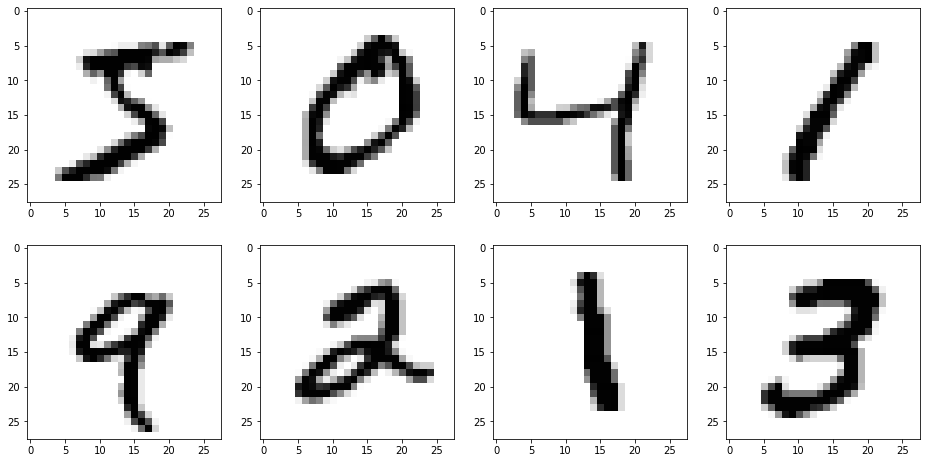

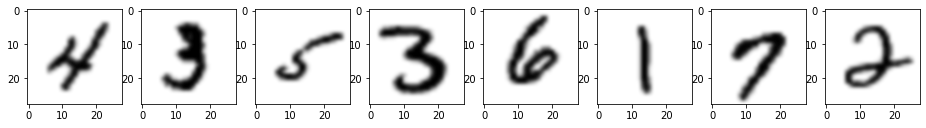

In [0]:
#Визуализация данных
#draw(*images, smooth = False, columns = 4)
#Принимает произвольное количество изображений
#images: изображения в формате np.ndarray (2-dimensional) или PIL.Image.Image (grayscale)
#smooth = False: использовать сглаживание
#columns = 4: количество колонок
#Для данных MNIST лучше не использовать сглаживание, но для более крупных изображений стоит использовать,
#т. к. без сглаживания могут пропадать целые ряды пикселей, что даст неправильное представление об изображении.
#Даже если в draw() передано одно изображение, параметр columns будет влиять на его размер при отрисовке.
mnist.draw(*mnist.x_train[:8])
mnist.draw(*mnist.x_train[9:17], smooth = True, columns = 8)

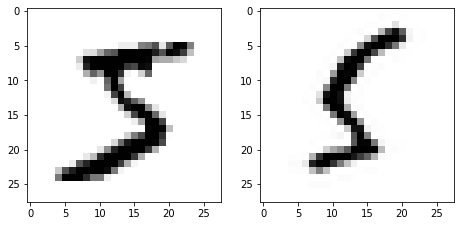

In [0]:
#Преобразования осуществляются функцией:
#image: изображение в формате np.ndarray (2-dimensional) или PIL.Image.Image (grayscale)
#edit(img, *filters, scaling = 4, demo = False):
#filters: один или несколько фильтров, выполняемых последовательно (список фильтров см. ниже)
#scaling: во сколько раз масштабируется изображение перед выполнением фильтров
#demo: если True, не уменьшать изображение обратно после выполнения фильтров

#Пример:
img_edited = mnist.edit(
    img,
    mnist.Scale(0.8),
    mnist.Rotate(3.14),
    mnist.Deform(4, 0.5),
    mnist.Sharpen()
)
mnist.draw(img, img_edited)

Blur (2px, 6px)


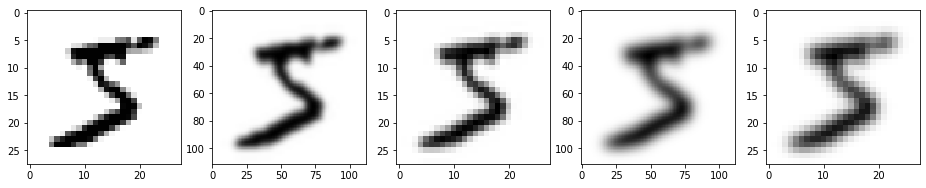

In [0]:
#Далее документация по привычке дана по-английски.
#Изображение #1 - исходное
#Изображение #2 - с фильтром (первый вариант) до обратного уменьшения (фильтры применяются к увеличенной копии)
#Изображение #3 - с фильтром (первый вариант) после обратного уменьшения до исходных размеров
#Изображение #4 - с фильтром (вторый вариант) до обратного уменьшения
#Изображение #5 - с фильтром (вторый вариант) после обратного уменьшения до исходных размеров

#mnist.Blur(radius)
#Blurs image. Radius is defined in pixels, so image scaling specified in draw() does matter.
print("Blur (2px, 6px)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Blur(2), demo = True),
    mnist.edit(img, mnist.Blur(2)),
    mnist.edit(img, mnist.Blur(4), demo = True),
    mnist.edit(img, mnist.Blur(4)),
    columns = 5
)

Rectangle (two variations)


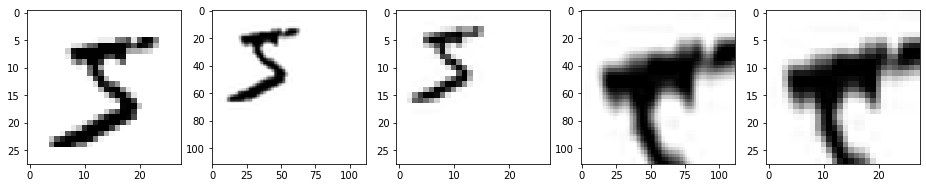

In [0]:
#mnist.Rectangle(x_min, y_min, x_max, y_max)
#Takes part of image between (x_min, y_min) and (x_max, y_max) and fits it into whole image rectangle.
print("Rectangle (two variations)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Rectangle(0, 0, 1.5, 1.5), demo = True),
    mnist.edit(img, mnist.Rectangle(0, 0, 1.5, 1.5)),
    mnist.edit(img, mnist.Rectangle(0.2, 0.1, 0.8, 0.5), demo = True),
    mnist.edit(img, mnist.Rectangle(0.2, 0.1, 0.8, 0.5)),
    columns = 5
)

Shear_x, Shear_y


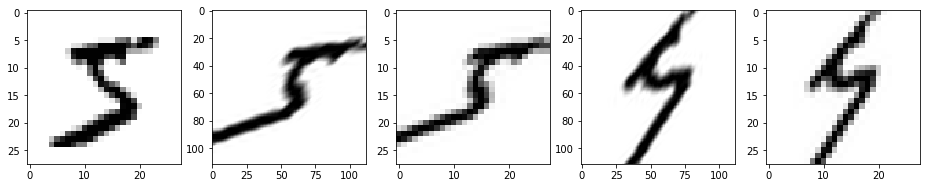

In [0]:
#mnist.Shear_x(coef)
#mnist.Shear_y(coef)
#Shear image in X or Y direction
#Center of the image remains on the same place
#Shear_x(1) moves upper middle point to upper right corner
#Shear_y(1) moves right middle point to upper right corner
print("Shear_x, Shear_y")
mnist.draw(
    img,
    mnist.edit(img, mnist.Shear_x(1), demo = True),
    mnist.edit(img, mnist.Shear_x(1)),
    mnist.edit(img, mnist.Shear_y(1), demo = True),
    mnist.edit(img, mnist.Shear_y(1)),
    columns = 5
)

Scale (1.5, 0.7)


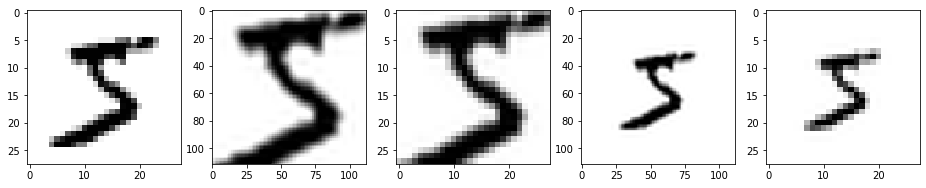

Scale_x (0.5), Scale_y (0.5)


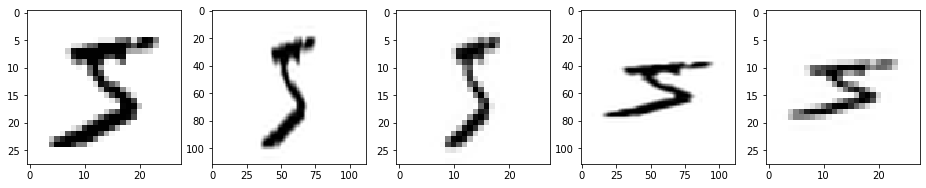

In [0]:
#mnist.Scale(coef)
#mnist.Scale_x(coef)
#mnist.Scale_y(coef)
#Scaling of the image by X, Y or both axes
print("Scale (1.5, 0.7)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Scale(1.5), demo = True),
    mnist.edit(img, mnist.Scale(1.5)),
    mnist.edit(img, mnist.Scale(0.7), demo = True),
    mnist.edit(img, mnist.Scale(0.7)),
    columns = 5
)
print("Scale_x (0.5), Scale_y (0.5)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Scale_x(0.5), demo = True),
    mnist.edit(img, mnist.Scale_x(0.5)),
    mnist.edit(img, mnist.Scale_y(0.5), demo = True),
    mnist.edit(img, mnist.Scale_y(0.5)),
    columns = 5
)

Rotate (0, 1)


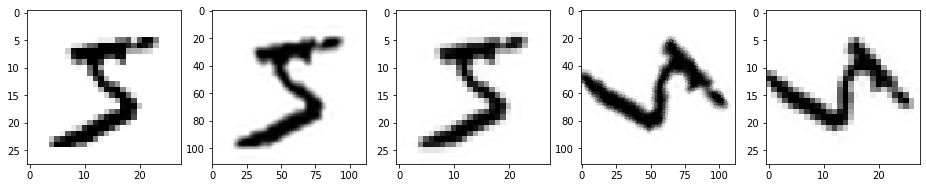

In [0]:
#mnist.Rotate(angle)
#Rotates image clockwise by certain angle in radians
#Rotate(0) slightly modifies image because of scaling to 4x size and back
print("Rotate (0, 1)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Rotate(0), demo = True),
    mnist.edit(img, mnist.Rotate(0)),
    mnist.edit(img, mnist.Rotate(1), demo = True),
    mnist.edit(img, mnist.Rotate(1)),
    columns = 5
)

Perspective (2 variations)


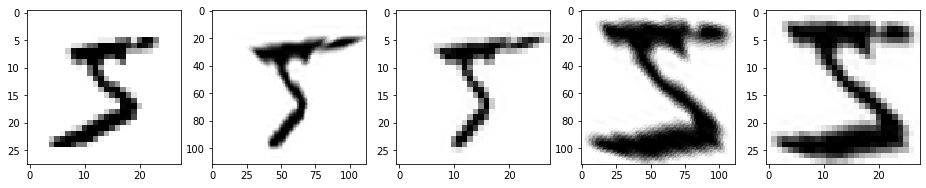

Random perspectives


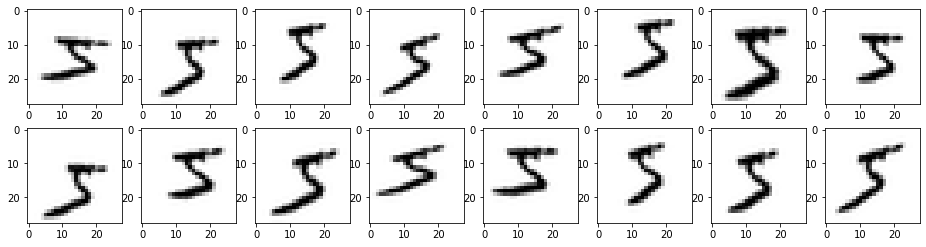

In [0]:
#mnist.Perspective(upper_left, lower_left, lower_right, upper_right)
#Takes a quad between these 4 points and maps it to whole image rectangle
print("Perspective (2 variations)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Perspective((0.4, 0), (-1, 1), (2, 1), (0.6, 0)), demo = True),
    mnist.edit(img, mnist.Perspective((0.4, 0), (-1, 1), (2, 1), (0.6, 0))),
    mnist.edit(img, mnist.Perspective((0.2, 0.2), (0.1, 1), (0.75, 0.75), (0.9, 0.1)), demo = True),
    mnist.edit(img, mnist.Perspective((0.2, 0.2), (0.1, 1), (0.75, 0.75), (0.9, 0.1))),
    columns = 5
)

print("Random perspectives")
amount = 16
images = []
import random, math
for i in range(amount):
    angle_range = (-20, 110)
    distance_range = (-0.1, 0.5)
    angle_ranges = [[x+90 for x in angle_range], [x+180 for x in angle_range],
                    [x+270 for x in angle_range], angle_range]
    angles = [random.uniform(x[0], x[1]) * math.pi / 180 for x in angle_ranges]
    distances = [random.uniform(*distance_range) for x in range(4)]
    points = [(0, 0), (0, 1), (1, 1), (1, 0)]
    points = [(
        math.cos(angles[i]) * distances[i] + points[i][0],
        -math.sin(angles[i]) * distances[i] + points[i][1]
    ) for i in range(4)]
    images.append(mnist.edit(img, mnist.Perspective(*points)))
mnist.draw(*images, columns = 8)

Deform (1, 0.2) (1, 0.2 scaled down) (4, 0.5) (4, 0.5 scaled down)


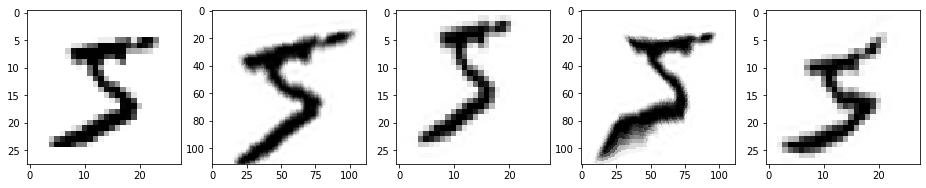

In [0]:
#mnist.Deform(grid_size, magnitude)
#Randomly deforms an image
#grid_size = 1, 2, 3, ... - all image is divided into grid_size*grid_size blocks
#magnitude = 0..0.5 - every point between blocks is shifted randomly by this magnitude
print("Deform (1, 0.2) (1, 0.2 scaled down) (4, 0.5) (4, 0.5 scaled down)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Deform(1, 0.2), demo = True),
    mnist.edit(img, mnist.Deform(1, 0.2)),
    mnist.edit(img, mnist.Deform(4, 0.5), demo = True),
    mnist.edit(img, mnist.Deform(4, 0.5)),
    columns = 5
)

Deform -> Sharpen (4 variations, not scaled down)


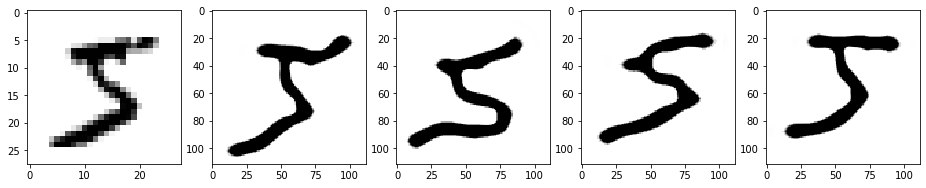

Deform -> Sharpen (4 variations, scaled down to 28x28)


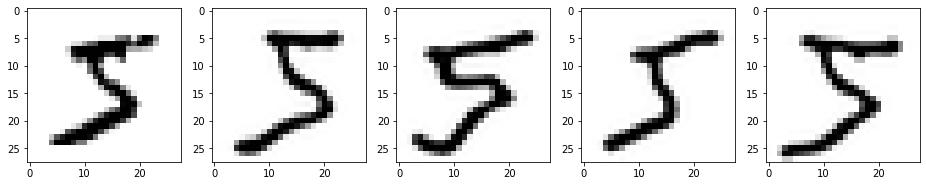

In [0]:
#mnist.Sharpen()
#Makes lines more sharp and smooth
#Works correctly only if scaling = 4 in edit() function
print("Deform -> Sharpen (4 variations, not scaled down)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen(), demo = True),
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen(), demo = True),
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen(), demo = True),
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen(), demo = True),
    columns = 5
)

print("Deform -> Sharpen (4 variations, scaled down to 28x28)")
mnist.draw(
    img,
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen()),
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen()),
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen()),
    mnist.edit(img, mnist.Deform(3, 0.4), mnist.Deform(4, 0.2), mnist.Sharpen()),
    columns = 5
)

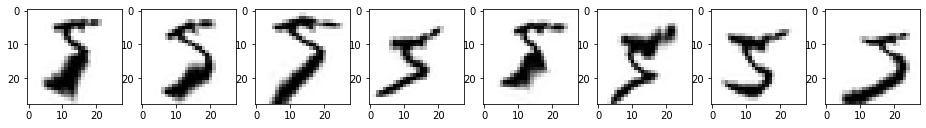

[True, True, False, True, True, False, True, False]


In [0]:
#mnist.fits(img)
#returns True if all border pixels are nearly white (values < 64) in the image. Examples:
#actially standart for white is 255 and standart for black is 0, but MNIST images are reversed
amount = 8
images = []
answers = []
mnist.init()
for i in range(amount):
    img_edited = mnist.edit(img, mnist.Deform(2, 0.5))
    images.append(img_edited)
    answers.append(mnist.fits(img_edited))
mnist.draw(*images, columns = amount)
print(answers)

### Пример использования библиотеки mnistlib <a class="anchor" id="mnistlib_example"></a>

Основной задачей библиотеки является работа с алгоритмами распознавания. Но есть и другие применения, например фильтры Sharpen и Deform при многократном применении способны генерировать новые символы.

Мы случайным образом деформируем цифру, следя, чтобы она не выходила за края изображения, а затем четче прорисовываем ее края с помощью фильтра Sharpen. Повторяем процедуру много раз.

Iterations
Drawing


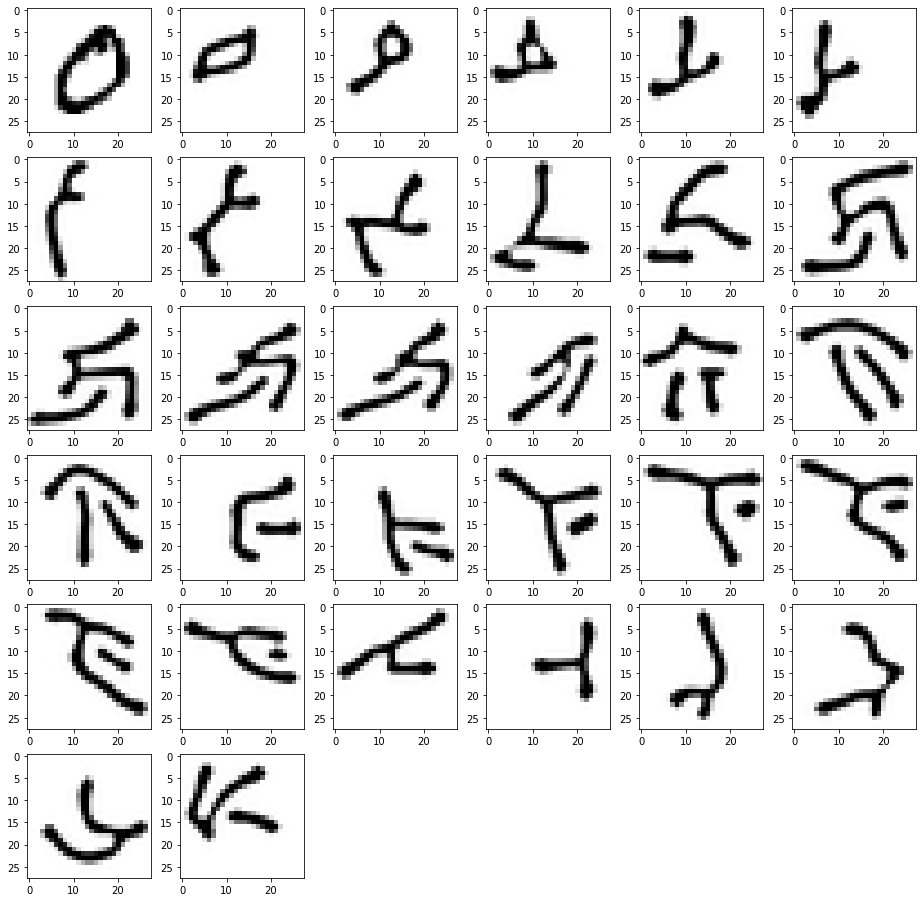

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import mnistlib as mnist
mnist.init()
zero = mnist.x_train[1]

def work(input_img, iterations):
    tmp_img = input_img
    for i in range(iterations):
        tmp_img2 = mnist.edit(tmp_img, mnist.Deform(2, 0.3))
        if mnist.fits(tmp_img2):
            tmp_img = mnist.edit(tmp_img2, mnist.Sharpen())
    return tmp_img

results = [zero]
print("Iterations")
for i in range(31):
    results.append(work(results[-1], 10 + i))

print("Drawing")
mnist.draw(*results, columns = 6)

Повторим предыдущую процедуру для генерации слов, написанных на неизвестном алфавите.

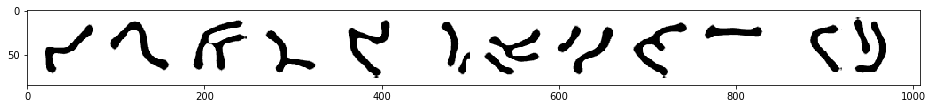

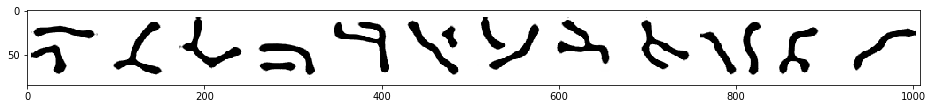

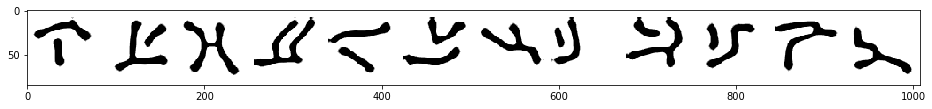

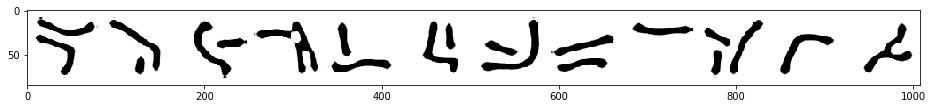

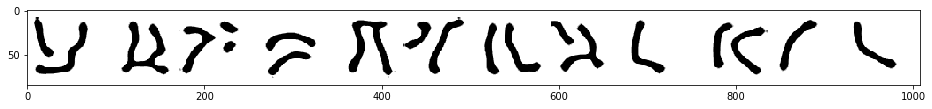

In [0]:
import numpy as np
import PIL

for line in range(5):
    amount = 12
    letters = mnist.x_train[:amount]
    letters = [x for x in letters] #to list
    iterations = 200

    for i in range(len(letters)):
        tmp_img = mnist.edit(letters[i], mnist.Rotate(0), scaling = 3, demo = True)
        for _ in range(iterations):
            tmp_img2 = mnist.edit(tmp_img, mnist.Deform(2, 0.3), scaling = 1, demo = True)
            if mnist.fits(tmp_img2):
                tmp_img = mnist.edit(tmp_img2, mnist.Sharpen(), scaling = 1, demo = True)
        letters[i] = tmp_img
    for i in range(len(letters)):
        letters[i] = mnist.edit(letters[i], mnist.Scale(0.9), scaling = 1, demo = True)

    word = np.concatenate(letters, axis = 1)
    word = mnist.edit(word, mnist.Scale_y(0.9), scaling = 1, demo = True)
    
    mnist.draw(word, columns = 1)

Iterations
Drawing


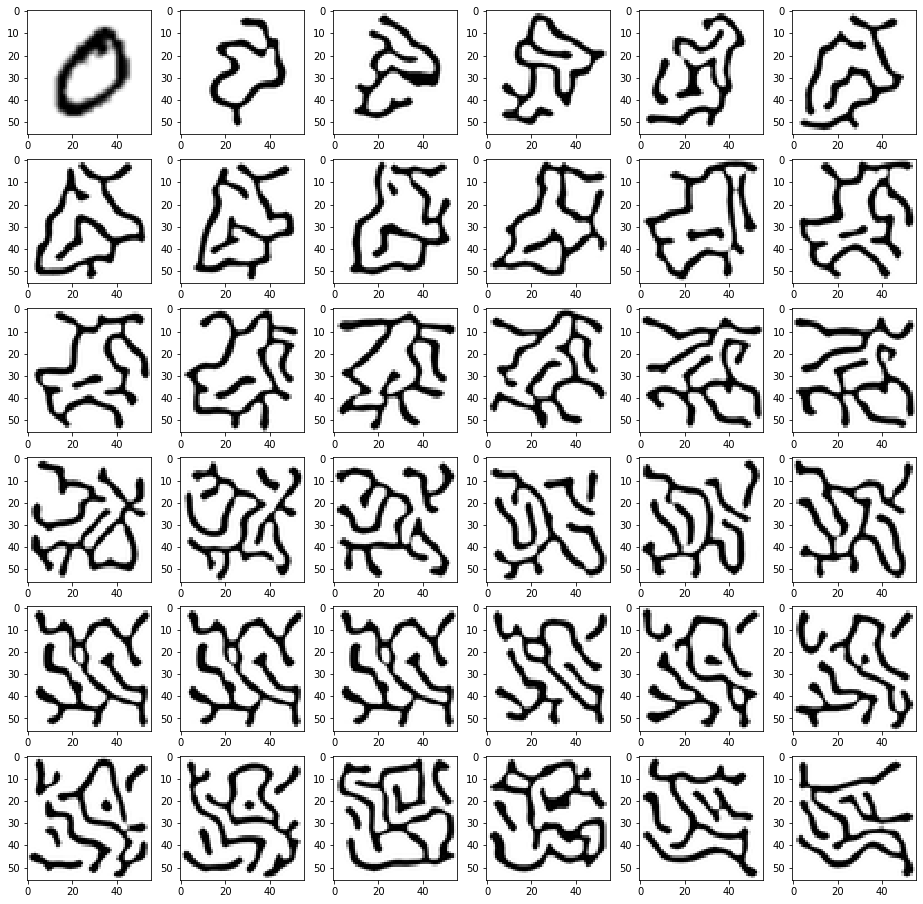

In [0]:
zero = mnist.np_to_pil(mnist.x_train[1]).resize((56, 56))

def work(input_img, iterations):
    tmp_img = input_img
    for i in range(iterations):
        tmp_img2 = mnist.edit(tmp_img, mnist.Deform(6, 0.5), scaling = 3)
        if mnist.fits(tmp_img2):
            tmp_img = mnist.edit(tmp_img2, mnist.Sharpen(), scaling = 3)
    return tmp_img

results = [zero]
print("Iterations")
for i in range(35):
    res = work(results[-1], 10 + i)
    results.append(res)

print("Drawing")
mnist.draw(*results, columns = 6)

### Распознавание цифр: постановка задачи <a class="anchor" id="neuro_intro"></a>

**Входные и выходные данные**

Тип входных данных: массив 28х28 пикселей, значения от 0 (не закрашено) до 255 (закрашено)

Тип выходных данных: распознанная цифра ИЛИ степень уверенности для каждой цифры от 0 до 9

Источник данных: набор MNIST или альтернативы: MNIST с искажениями, EMNIST, ручное рисование, ...

**Способ оценки точности**

Процент распознанных цифр на тестовом наборе, не использовавшемся при обучении. В наборе MNIST есть некоторое количество изображений (менее 1%), не распознаваемых однозначно человеком. Можно либо игнорировать эти изображения, либо предположить, что алгоритм теоретически может распознавать цифры (то есть намерения рисовавшего) лучше человека.

Согласно википедии, к настоящему времени лучший результат распознавания для нейронных сетей - 99.8%, для полносвязных нейронных сетей с двумя скрытыми слоями - 99.3%, для метода опорных векторов и метода ближайших соседей (видимо, в метрике деформаций) - по 99.5%.

Поскольку обучение нейронных сетей, да и других алгоритмов - это обычно случайный процесс, то данные числа стоит воспринимать как максимальные достигнутые при многократном повторении процесса обучения, что ограничено количеством вычислительных ресурсов.

**Используемые алгоритмы**

Все алгоритмы классификации можно поделить на следующие классы:

- нейронные сети
- другие алгоритмы машинного обучения
- алгоритмы, специфичные для данной задачи
- комбинированные алгоритмы (сочетание разных алгоритмов и/или голосование классификаторов)

Нейронные сети являются универсальным решателем, то есть их можно использовать для поиска практически любых закономерностей. Нейронные сети можно сочетать с любыми другими алгоритмами. Также не следует считать распространенные архитектуры нейросетей единственно правильными. Могут быть, например, нейросети с обратными связями, нейросети работающие в импульсном режиме и прочее.

Примеры изображений, некоторые из которых представляют сложности для распознавания:

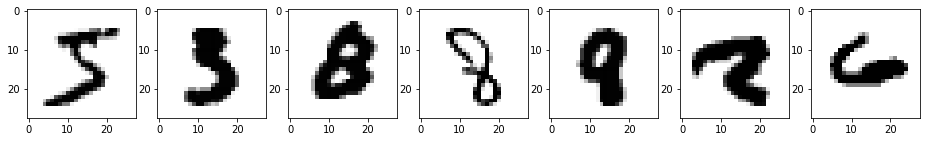

In [0]:
import mnistlib as mnist
mnist.init()
images = [mnist.x_train[0], *mnist.x_val[[450, 495, 543, 947, 1790, 1800]]]
mnist.draw(*images, columns = len(images))

Из специфичных для данной задачи алгоритмов можно предполжить следующие:

*Поиск деформации.* Перебираем случайные (или не совсем случайные) деформации изображения, пока оно не совпадет с одним из шаблонов.

*Распознавание наличия и направления линий* на каждом участке изображения, используемое в качестве предварительной обработки изображения.

*Расшепление линий*: сначала определяется средняя толщина линий на изображении, затем линии большей толщины расщепляются на две параллельные линии.

*Построение графа линий.* Определяем связь между линиями, их длину и форму. На основании полученных данных либо сразу делаем вывод, либо используем их как входные данные для какого-либо алгоритма машинного обучения.

### Подбор библиотеки <a class="anchor" id="neuro_lib"></a>

В первую очередь сравним разные библиотеки и скорость их обучения на текущей конфигурации. Используем следующие параметры:

- Итераций: 200
- Нейронов в скрытом слое: 100
- Batch size: 200
- Activation: relu (скрытый слой), softmax (выходной слой)
- Optimizer: adam
- beta_1: 0.9
- beta_2: 0.999
- epsilon: 1e-8
- Learning_rate: constant 0.001
- Набор тестовых данных: mnist.x_val_flat[:1000], mnist.y_val[:1000]

C:\Users\Oleg\Anaconda3\envs\workspace\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (1) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


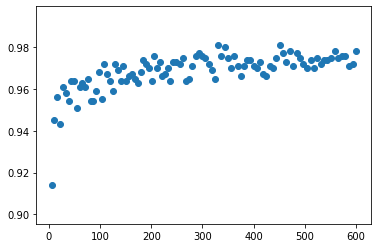

In [0]:
# -----------------------------------------------
# ---- sklearn.neural_network.MLPClassifier -----
# -----------------------------------------------

# Можно начинать выполнение ноутбука с этой ячейки

from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import time

import mnistlib as mnist
mnist.init()

#возворащает массив, для итераций от 1 до iterations: точность и затраченное время
def test_MLP_classifier(neurons, iterations):
    classifier = MLPClassifier(
        max_iter = 1,
        hidden_layer_sizes = (neurons),
        #verbose = True,
        warm_start = True,
        tol = 0.0,
        n_iter_no_change = iterations,
        solver = 'adam',
        beta_1 = 0.9,
        beta_2 = 0.999,
        epsilon = 1e-8,
        activation = 'relu',
        learning_rate = 'constant',
        batch_size = 200,
        learning_rate_init = 0.001
    )
    accuracy = []
    times = []
    start_time = time.time()
    for i in range(iterations):
        classifier.fit(mnist.x_train_flat, mnist.y_train)
        prediction = classifier.predict(mnist.x_val_flat[:1000])
        acc = accuracy_score(mnist.y_val[:1000], prediction)
        accuracy.append(acc)
        total_time = time.time() - start_time
        times.append(total_time)
    return accuracy, times

accuracy, times = test_MLP_classifier(200, 100)
plt.scatter(times, accuracy);

По горизонтальной оси - время в секундах. Точность определяется не по всему набору тестовых данных MNIST, а по 1/10 его части, поэтому разброс получается выше, и точность в 98%, видная на графике, не будет достигнута при тестировании на всем наборе тестовых данных MNIST.

In [0]:
# ---------------------------------------------
# ---- tensorflow.keras.models.Sequential -----
# --------------Tensorflow 2.x ----------------
# ---------------------------------------------

# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import time

import mnistlib as mnist
mnist.init()

#возворащает массив, для итераций от 1 до iterations: точность и затраченное время
def test_tf_keras_classifier(neurons, iterations):
    model = tf.keras.models.Sequential([
        #tf.keras.layers.Flatten(input_shape = (28, 28)),
        #tf.keras.layers.Dense(neurons, activation = 'relu'),
        tf.keras.layers.Dense(neurons, activation = 'relu', input_shape = (28*28,)),
        tf.keras.layers.Dense(10, activation = 'softmax')
    ])
    model.compile(
        optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999, epsilon=1e-8),
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )
    accuracy = []
    times = []
    start_time = time.time()
    for i in range(iterations):
        print("Iteration", i, end = '\r')
        model.fit(mnist.x_train_flat / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(mnist.x_val_flat[:1000] / 255.0).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val[:1000], prediction)
        accuracy.append(acc)
        total_time = time.time() - start_time
        times.append(total_time)
    return accuracy, times

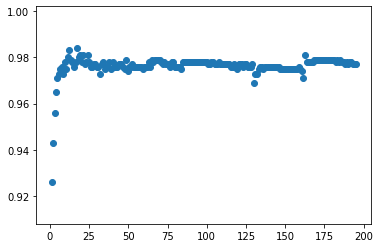

In [0]:
accuracy, times = test_tf_keras_classifier(100, 200)
plt.scatter(times, accuracy);

Основные параметры совпадают с параметрами, которые были указаны в MLPClassifier, но внешний вид графика иной по сравнению с MLPClassifier: видимо какие-то параметры все-таки оказались настроены по-другому. Точность обученной нейросети выше, чем в случае MLPClassifier. Максимальная точность достигается уже через 15 секунд, по сравнению с 350 для MLPClassifier.

Выбираем фреймворк tensorflow.keras.

### Нейронная сеть с одним скрытым слоем <a class="anchor" id="neuro_one_layer"></a>

В данном разделе занимаемся подбором параметров для полносвязной нейронной сети с одним скрытым слоем. Построим зависимость точности распознавания от количества нейронов в скрытом слое и количества итераций обучения.

In [0]:
#будем тестировать нейронные сети с кол-вом нейронов из neurons_amount, обучая их в течение 100 итераций
#усредним данные по 5 экспериментам
neurons_amount = [10, 20, 30, 40, 50, 60, 80, 100, 125, 150, 175, 200, 250, 300, 400, 500, 750]
max_iterations = 75

accuracies_tables = []
times_tables = []
for i in range(5):
    print("Расчет номер", i)
    accuracies_table = []
    times_table = []
    for neurons in neurons_amount:
        print("Нейронов в скрытом слое:", neurons)
        accuracy, times = test_tf_keras_classifier(neurons, max_iterations)
        accuracies_table.append(accuracy)
        times_table.append(times)
    accuracies_tables.append(accuracies_table)
    times_tables.append(times_table)

Расчет номер 0
Нейронов в скрытом слое: 10
Нейронов в скрытом слое: 20
Нейронов в скрытом слое: 30
Нейронов в скрытом слое: 40
Нейронов в скрытом слое: 50
Нейронов в скрытом слое: 60
Нейронов в скрытом слое: 80
Нейронов в скрытом слое: 100
Нейронов в скрытом слое: 125
Нейронов в скрытом слое: 150
Нейронов в скрытом слое: 175
Нейронов в скрытом слое: 200
Нейронов в скрытом слое: 250
Нейронов в скрытом слое: 300
Нейронов в скрытом слое: 400
Нейронов в скрытом слое: 500
Нейронов в скрытом слое: 750
Расчет номер 1
Нейронов в скрытом слое: 10
Нейронов в скрытом слое: 20
Нейронов в скрытом слое: 30
Нейронов в скрытом слое: 40
Нейронов в скрытом слое: 50
Нейронов в скрытом слое: 60
Нейронов в скрытом слое: 80
Нейронов в скрытом слое: 100
Нейронов в скрытом слое: 125
Нейронов в скрытом слое: 150
Нейронов в скрытом слое: 175
Нейронов в скрытом слое: 200
Нейронов в скрытом слое: 250
Нейронов в скрытом слое: 300
Нейронов в скрытом слое: 400
Нейронов в скрытом слое: 500
Нейронов в скрытом слое: 75

In [0]:
import numpy as np
from scipy.ndimage.filters import gaussian_filter

import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = 'notebook'

avg_accuracies = np.average(np.array(accuracies_tables), axis = 0)
avg_times = np.average(np.array(times_tables), axis = 0)

fig = go.Figure(
    data = [go.Contour(
        y = neurons_amount,
        z = gaussian_filter(avg_accuracies[2:, 1:], sigma = 1),
        contours = dict(start = 0.93, end = 0.985, size = 0.001)
    )]
).update_layout(
    height = 300,
    margin = dict(r = 20, l = 10, b = 10, t = 10),
    xaxis_title = 'Итераций',
    yaxis_title = 'Нейронов',
    yaxis_type = 'log'
).show()

import math
times = list(range(120))
accuracies_time_based = np.zeros((len(neurons_amount), len(times)), dtype = float)
for neurons_idx in range(len(neurons_amount)):
    for i in range(max_iterations):
        accuracy = avg_accuracies[neurons_idx][i]
        time = avg_times[neurons_idx][i]
        time_idx = math.ceil(time)
        if time_idx < len(times):
            for t in range(time_idx, len(times)):
                accuracies_time_based[neurons_idx][t] = accuracy
        else:
            break

go.Figure(
    data = [go.Contour(
        x = times,
        y = neurons_amount,
        z = gaussian_filter(accuracies_time_based, sigma = 1),
        contours = dict(start = 0.93, end = 0.985, size = 0.001)
    )]
).update_layout(
    height = 300,
    margin = dict(r = 20, l = 10, b = 10, t = 10),
    xaxis_title = 'Время обучения',
    yaxis_title = 'Нейронов',
    yaxis_type = 'log'
).show()

<img src="files/image2.png">

<img src="files/image3.png">

Чем больше нейронов содержит полносвязная нейронная сеть с одним скрытым слоем (в пределах до 750), тем меньшее количество итераций (эпох обучения) требуется для достижения максимальной точности. В плане времени обучения оптимальным является размер скрытого слоя в 300 или более нейронов - при этом значении нейронная сеть достигает максимальной точности за наименьшее количество секунд. Эти выводы, конечно, могут зависеть от многих других параметров, в том числе выбранного алгоритма оптимизации.

Сравнение различных методов оптимизации - отдельная большая тема, в которую не стоит здесь глубоко вдаваться. Достаточно будет сравнить оптимизаторы, доступные в tensorflow.keras, с настройками по умолчанию. Используем нейросеть с 300 нейронами.

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import time

import mnistlib as mnist
mnist.init()

optimizers = ['Adam', 'Adadelta', 'Adagrad', 'Adamax', 'Ftrl', 'Nadam', 'RMSprop', 'SGD']
models = dict()
optimizers_results = dict()
iterations = 3

def expand_iterations(iterations):
    for optimizer in optimizers:
        if not optimizer in models:
            models[optimizer] = tf.keras.models.Sequential([
                tf.keras.layers.Dense(300, activation = 'relu', input_shape = (28*28,)),
                tf.keras.layers.Dense(10, activation = 'softmax')
            ])
        model = models[optimizer]
        model.compile(
            optimizer = optimizer,
            loss = 'sparse_categorical_crossentropy',
            metrics = ['accuracy']
        )
        accuracy = []
        for i in range(iterations):
            model.fit(mnist.x_train_flat / 255.0, mnist.y_train, epochs = 1, verbose = 0)
            prediction = model.predict(mnist.x_val_flat / 255.0).argmax(axis = 1)
            acc = accuracy_score(mnist.y_val, prediction)
            accuracy.append(acc)
            print(optimizer, "iteration", i, "accuracy", acc, end = '\r')
        optimizers_results[optimizer] = accuracy

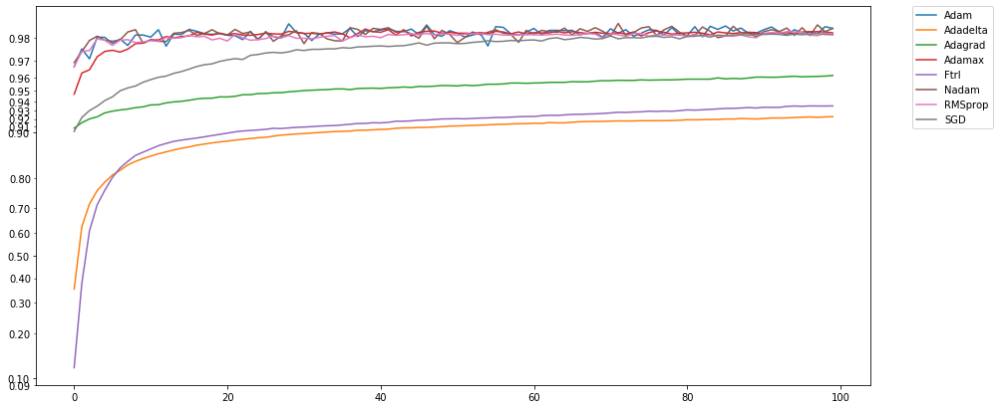

In [0]:
expand_iterations(100)

import matplotlib.pyplot as plt
plt.figure(figsize = (15, 7))
plt.yscale('logit')
for optimizer in optimizers:
    plt.plot(optimizers_results[optimizer], label = optimizer)
plt.legend(bbox_to_anchor = (1.05, 1), loc = 'upper left', borderaxespad = 0)
plt.show()

Количество экспериментов и вариаций настроек, конечно, недостаточно, чтобы делать какие-то однозначные выводы. Видно только, что алгоритмы adam, rmsprop и nadam, видимо, вносят какие-то случайные изменения при обучении, тогда как другие рассмотренные алгоритмы плавно ищут локальный оптимум. Наибольшую точность и скорость обучения при настройках по умолчанию в нашем случае демонстрируют adam и nadam.

Далее рассмотрим нейросеть со 100 нейронами, обучаемую оптимизатором adam, и попробуем ее проанализировать.

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time

import mnistlib as mnist
mnist.init()

model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(100, activation = 'relu', input_shape = (28*28,)),
    tf.keras.layers.Dense(10, activation = 'softmax')
])
model.compile(
    optimizer = 'adam',
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)
accuracy = []

def iteration():
    model.fit(mnist.x_train_flat / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
    prediction = model.predict(mnist.x_val_flat / 255.0).argmax(axis = 1)
    acc = accuracy_score(mnist.y_val, prediction)
    accuracy.append(acc)
    print("Iteration", i, acc, end = '\r')

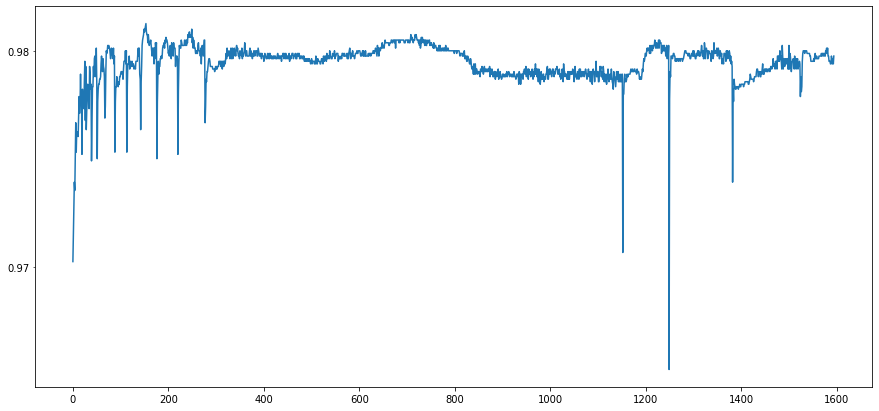

In [0]:
for i in range(100):
    iteration()

plt.figure(figsize = (15, 7))
plt.yscale('logit')
plt.plot(accuracy[5:])
plt.show()

Нейронную сеть с одним скрытым слоем несложно проанализировать. Каждый перцептрон (нейрон) скрытого слоя имеет 28х28 входов и 10 выходов. Веса входов можно нарисовать в виде изображения, не считая одного дополнительного константного веса.

Выход нейрона (результат вычислений) будет максимален, если:

1. в тех местах, где на матрице весов положительное значение, пиксель изображения будет полностью закрашен (255).
2. в тех местах, где на матрице весов отрицательное значение, пиксель изображения будет полностью незакрашен (0).

Таким образом, если на матрице весов находится пятно положительных значений, то данный нейрон реагирует на наличие закрашенного пятна в этом же месте изображения, и наоборот.

10 выходов нейрона идут прямо к выходному слою. Это значит, что нейрон напрямую делает вывод о числе, нарисованном на изображении. Величина положительного выхода для некоторого числа N означает степерь уверенности в том, что это число N, при положительном результате вычислений.

Отобразим матрицу входных весов и выходные веса для одного из нейронов скрытого слоя:

[-2.73 -1.01 -0.01 -2.17 -0.42  1.53  1.07 -0.33 -0.86 -0.06]


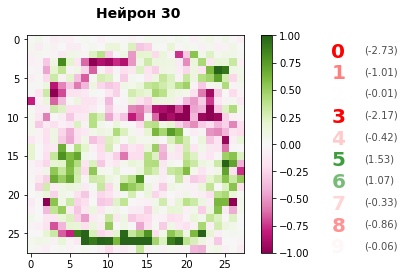

In [0]:
def show_neuron(neuron_index):
    first_layer_weights = model.get_layer(index = 0).get_weights()[0].reshape((28, 28, -1))
    neuron_weights = first_layer_weights[:, :, neuron_index]
    second_layer_weights = model.get_layer(index = 1).get_weights()[0]
    neuron_outputs = second_layer_weights[neuron_index, :]
    print(neuron_outputs)
    #mnist.draw(neuron_weights)
    fig, ax = plt.subplots(1, 1)
    fig.suptitle('Нейрон %d' % neuron_index, fontsize = 14, fontweight = 'bold')
    img = ax.imshow(neuron_weights, cmap = 'PiYG', origin = 'upper', vmin = -1, vmax = 1)
    for i in range(10):
        output = neuron_outputs[i] / 2
        if output > 0:
            color = (max(0, 1 - output), 0.5 + 0.5*max(0, 1 - output), max(0, 1 - output))
        else:
            color = (1, max(0, 1 - -output), max(0, 1 - -output))
        ax.text(1.4, 0.9 - 0.1*i, str(i), transform = ax.transAxes,
                fontsize = 20, fontweight = 'bold', color = color)
        ax.text(1.55, 0.92 - 0.1*i, '(%.2f)' % neuron_outputs[i],
                transform = ax.transAxes, fontsize = 10, color = (.3, .3, .3))
    fig.colorbar(img)
    plt.show()

neuron = 30
show_neuron(neuron)
#np.set_printoptions(precision = 3)
#print(neuron_outputs)

Нейронная сеть осуществляет свертку матрицы весов с изображением (точнее, вычисляет одно значение операции свертки без смещений, то есть скалярное произведение). Данная операция не является "мерой схожести" матрицы весов с изображением. Матрицу весов, если она везде положительна, можно представить как стекло: оно прозрачно там, где веса большие, и закопчено там, где веса маленькие. Это стекло накладывается на светящееся изображения, и суммарная сила получившегося света является результатом свертки.

Веса данного нейрона кажется бессодержательными. Попробуем игнорировать вывод данного нейрона, и посмотрим, насколько изменится точность.

In [0]:
def delete_neuron_test(neuron, test_images = mnist.x_val_flat, test_classes = mnist.y_val):
    model_edited = tf.keras.models.clone_model(model)
    model_edited.set_weights(model.get_weights())

    prediction = model_edited.predict(test_images / 255.0).argmax(axis = 1)
    acc_before = accuracy_score(test_classes, prediction)

    #веса выходного слоя нейронов
    #weights, constants = model_edited.get_layer(index = 1).get_weights()
    #weights[neuron, :] = 0
    #model_edited.get_layer(index = 1).set_weights((weights, constants))
    
    weights, constants = model_edited.get_layer(index = 0).get_weights()
    weights[:, neuron] = 0
    model_edited.get_layer(index = 0).set_weights((weights, constants))

    prediction = model_edited.predict(test_images / 255.0).argmax(axis = 1)
    acc_after = accuracy_score(test_classes, prediction)
    
    #print("Удаляем нейрон %d: точность %.3g -> %.3g" % (neuron, acc_before, acc_after))
    
    return acc_before, acc_after

print("Удаляем нейрон %d: " % neuron + "точность %.3g -> %.3g" % delete_neuron_test(neuron))

Удаляем нейрон 30: точность 0.98 -> 0.978


Проверим результат теста на другом наборе тестовых данных

```console
> pip install emnist
```

(40000, 28, 28)


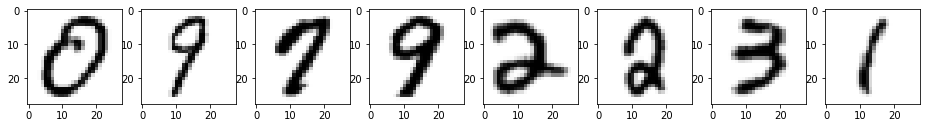

Удаляем нейрон 30: точность 0.732 -> 0.724


In [0]:
from emnist import extract_test_samples
images, labels = extract_test_samples('digits')
print(images.shape)
mnist.draw(*images[:8], columns = 8)
print("Удаляем нейрон %d: " % neuron
      + "точность %.3g -> %.3g" % delete_neuron_test(neuron, images.reshape(-1, 28*28), labels))

Проверим результат теста на наборе тестовых данных с деформациями

(8712, 28, 28)


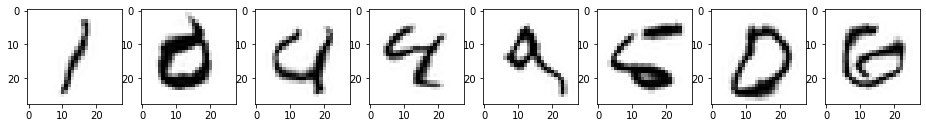

Удаляем нейрон 30: точность 0.837 -> 0.831


In [0]:
test_images = []
test_labels = []
for i in range(len(mnist.x_val)):
    img = mnist.edit(mnist.x_val[i], mnist.Deform(4, 0.5))
    if (mnist.fits(img)):
        test_images.append(img)
        test_labels.append(mnist.y_val[i])
test_images = np.array(test_images)
test_labels = np.array(test_labels)
print(test_images.shape)
mnist.draw(*test_images[:8], columns = 8)
print("Удаляем нейрон %d: " % neuron
      + "точность %.3g -> %.3g" % delete_neuron_test(neuron, test_images.reshape(-1, 28*28), test_labels))

Можно сделать однозначный вывод, что удаление рассмотренного нейрона ухудшает распознавание изображений для данной нейросети. Посмотрим, какие именно цифры нейросеть перестала правильно распознавать после удаления нейрона.

In [0]:
images, labels = extract_test_samples('digits')
images = images.reshape(-1, 28*28)

model_edited = tf.keras.models.clone_model(model)
model_edited.set_weights(model.get_weights())

weights, constants = model_edited.get_layer(index = 0).get_weights()
weights[:, neuron] = 0
model_edited.get_layer(index = 0).set_weights((weights, constants))

outputs_before = model.predict(images / 255.0)
outputs_after = model_edited.predict(images / 255.0)

print("Точность до удаления нейрона:", accuracy_score(labels, outputs_before.argmax(axis = 1)))
print("Точность до после нейрона:", accuracy_score(labels, outputs_after.argmax(axis = 1)))

positive_changes = []
positive_changes_counts = [0] * 10
negative_changes = []
negative_changes_counts = [0] * 10
negative_changes_details = np.zeros((10, 10))

for i in range(len(images)):
    before = outputs_before[i].argmax()
    after = outputs_after[i].argmax()
    answer = labels[i]
    if before != answer and after == answer:
        positive_changes.append(i)
        positive_changes_counts[answer] += 1
    elif before == answer and after != answer:
        negative_changes.append(i)
        negative_changes_counts[answer] += 1
        negative_changes_details[after][answer] += 1

print("\nУлучшилось распознавание цифр:", len(positive_changes))
print(positive_changes_counts)
print("Ухудшилось распознавание цифр:", len(negative_changes))
print(negative_changes_counts)
print("\nКолонка - правильный ответ, строка - новый ответ:")
print(negative_changes_details)

Точность до удаления нейрона: 0.7317
Точность до после нейрона: 0.72355

Улучшилось распознавание цифр: 125
[19, 2, 7, 12, 16, 16, 24, 7, 13, 9]
Ухудшилось распознавание цифр: 451
[11, 2, 16, 12, 8, 141, 230, 8, 12, 11]

Колонка - правильный ответ, строка - новый ответ:
[[  0.   0.   5.   0.   0.  17. 153.   0.   2.   1.]
 [  0.   0.   1.   6.   0.   2.   4.   0.   0.   0.]
 [  4.   0.   0.   3.   0.  10.  15.   1.   4.   0.]
 [  0.   0.   9.   0.   5.  83.  24.   5.   2.   2.]
 [  0.   0.   1.   0.   0.   1.   1.   0.   0.   1.]
 [  4.   0.   0.   1.   0.   0.   0.   0.   3.   0.]
 [  0.   2.   0.   1.   0.   0.   0.   0.   1.   1.]
 [  1.   0.   0.   0.   0.   0.   0.   0.   0.   0.]
 [  1.   0.   0.   1.   3.  27.  33.   2.   0.   6.]
 [  1.   0.   0.   0.   0.   1.   0.   0.   0.   0.]]


Наиболее значимо, что 153 шестерки стали распознаваться как нули, 83 пятерки - как тройки. Отобразим выходы нейросети до и после удаления нейрона для тех цифр, которые ранее правильно распознавались как единицы, а стали распознаваться как восьмерки:

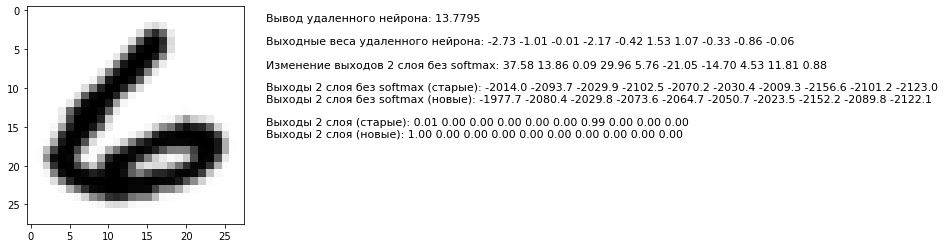

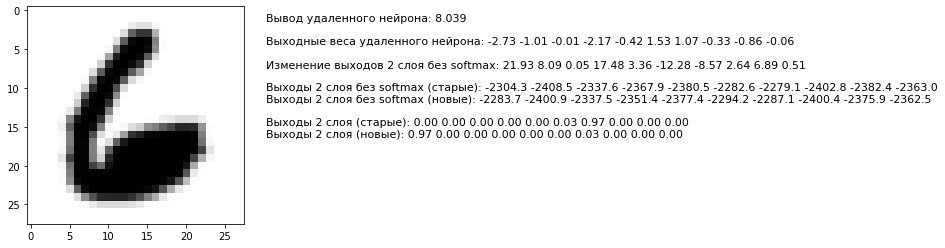

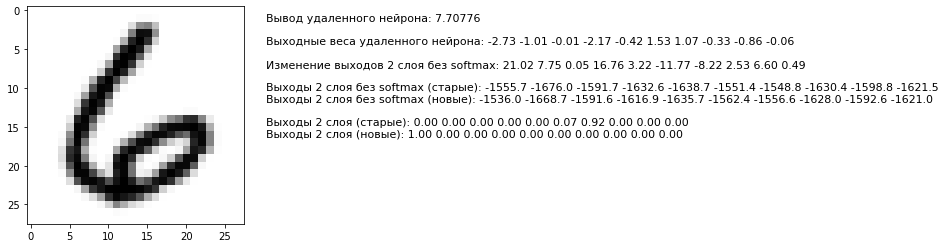

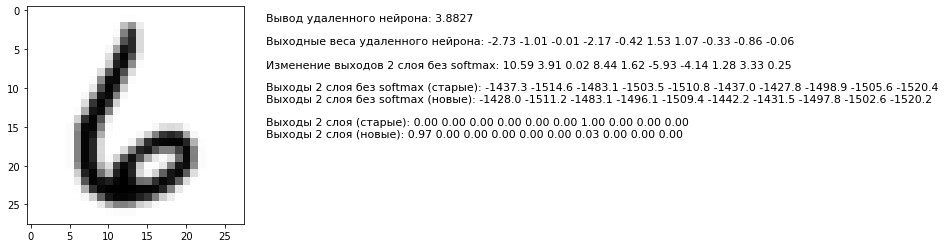

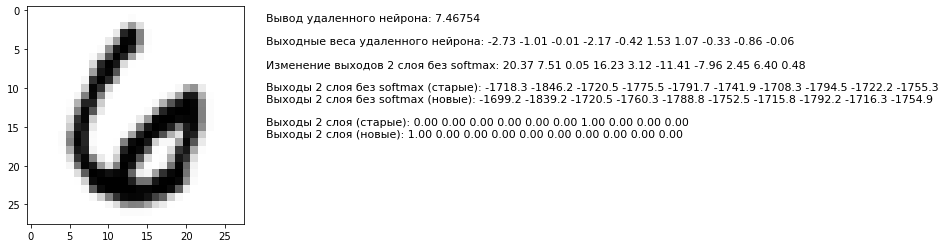

In [0]:
#np.set_printoptions(precision = 2, suppress = True)
def tostr(array, accuracy = 2):
    return ' '.join([('%%.%df' % accuracy) % x for x in array])

processed = 0
for i in range(len(images)):
    before = outputs_before[i].argmax()
    after = outputs_after[i].argmax()
    answer = labels[i]
    if answer == 6 and before == 6 and after == 0:
        fig, ax = plt.subplots(1, 1)
        img = ax.imshow(images[i].reshape((28, 28)), cmap = plt.cm.binary, interpolation = 'nearest')
        #mnist.draw(images[i].reshape((28, 28)))
        input_data = images[i][np.newaxis, :].astype(np.float32) / 255.0
        old_layer1_output = model.get_layer(index = 0)(input_data)
        new_layer1_output = model_edited.get_layer(index = 0)(input_data)
        linear = tf.keras.layers.Dense(10, activation = 'linear', input_shape = old_layer1_output.shape[1:])
        tf.keras.models.Sequential([linear]) #это нужно чтобы заработала функция set_weights()
        linear.set_weights(model.get_layer(index = 1).get_weights())
        old_layer2_linear_output = linear(old_layer1_output)
        new_layer2_linear_output = linear(new_layer1_output)
        old_layer2_output = model.get_layer(index = 1)(old_layer1_output)
        new_layer2_output = model_edited.get_layer(index = 1)(new_layer1_output)
        deleted_neuron_output = old_layer1_output[0, neuron].numpy()
        deleted_neuron_output_weights = model.get_layer(index = 1).get_weights()[0][neuron, :]
        ax.text(1.1, 0.4,
            'Вывод удаленного нейрона: %g' % deleted_neuron_output
                + '\n\nВыходные веса удаленного нейрона: ' + tostr(deleted_neuron_output_weights)
                + '\n\nИзменение выходов 2 слоя без softmax: ' + tostr(deleted_neuron_output_weights * -deleted_neuron_output)
                + '\n\nВыходы 2 слоя без softmax (старые): ' + tostr(old_layer2_linear_output.numpy()[0], 1)
                + '\nВыходы 2 слоя без softmax (новые): ' + tostr(new_layer2_linear_output.numpy()[0], 1)
                + '\n\nВыходы 2 слоя (старые): ' + tostr(old_layer2_output.numpy()[0])
                + '\nВыходы 2 слоя (новые): ' + tostr(new_layer2_output.numpy()[0])
            ,
            transform = ax.transAxes, fontsize = 11
        )
        plt.show()
        processed += 1
        if processed == 5:
            break

Линейная комбинация в последнем слое нейронов дает значения около -2000, которые функция softmax превращает в значения от 0 до 1.

`softmax = tf.exp(logits) / tf.reduce_sum(tf.exp(logits), axis)`
<br/>`https://www.tensorflow.org/api_docs/python/tf/nn/softmax`

Во всех рассмотренных примерах наблюдается один и тот же сценарий. Удаленный нейрон дает положительный выход на изображениях, где изображена шестерка. Передавая данные выходному слою, нейрон при положительном выходе "голосует" против нуля и за шестерку. Удалив нейрон, мы убрали голос за шестерку, и в некоторых случаях этого оказалось достаточно, чтобы "перевесил" выход на нуле.

Теперь, исходя из примеров и показанной матрицы весов, стал понятен смысл рассмотренного нейрона. На матрице весов видна форма шестерки, поэтому на шестерках нейрон дает положительный выход. Если же на картинке изображен ноль, то хоть его форма и похожа на шестерку, но его линия сверху справа пересекает отрицательную область на матрице весов, в результате сигнал данного нейрона гасится.

Рассмотрим еще несколько нейронов скрытого слоя. Добавим в функцию отрисовки нейрона дополнительные данные:
1. Насколько данный нейрон увеличивает точность нейросети на тестовом примере?
2. Каково в среднем выходное значение нейрона на разных цифрах?

In [0]:
import math
import PIL
from IPython.display import Image 
def show_neuron(neuron_index, _model = None):
    _model = _model if _model else model
    first_layer_weights = _model.get_layer(index = 0).get_weights()[0].reshape((28, 28, -1))
    neuron_weights = first_layer_weights[:, :, neuron_index]
    second_layer_weights = _model.get_layer(index = 1).get_weights()[0]
    neuron_outputs = second_layer_weights[neuron_index, :]
    fig, ax = plt.subplots(1, 1)
    fig.suptitle('Нейрон %d' % neuron_index, fontsize = 14, fontweight = 'bold')
    img = ax.imshow(neuron_weights, cmap = 'PiYG', origin = 'upper', vmin = -1, vmax = 1)
    for i in range(10):
        output = neuron_outputs[i] / 2
        if output > 0:
            color = (max(0, 1 - output), 0.5 + 0.5*max(0, 1 - output), max(0, 1 - output))
        else:
            color = (1, max(0, 1 - -output), max(0, 1 - -output))
        ax.text(1.4, 0.9 - 0.1*i, str(i), transform = ax.transAxes,
            fontsize = 20, fontweight = 'bold', color = color)
        ax.text(1.55, 0.92 - 0.1*i, '(%.2f)' % neuron_outputs[i],
            transform = ax.transAxes, fontsize = 10, color = (.3, .3, .3))
    fig.colorbar(img)
    acc_before, acc_after = delete_neuron_test(neuron_index)
    acc_gain = acc_before - acc_after
    ax.text(1.78, 1.05, "%+.3f%% точности" % acc_gain, transform = ax.transAxes,
        fontsize = 14, fontweight = 'bold')
    statistics_raw = [None] * 10
    for number in range(10):
        img_indices = np.where(mnist.y_val == number)
        imgs = mnist.x_val_flat[img_indices]
        statistics_raw[number] = []
        for i in range(len(imgs)):
            input_data = imgs[i][np.newaxis, :].astype(np.float32) / 255.0
            output_data = _model.get_layer(index = 0)(input_data)[0][neuron_index].numpy()
            statistics_raw[number].append(output_data)
    max_value_float = max([max(number_stat) for number_stat in statistics_raw])
    max_value = math.ceil(max_value_float)
    ax.text(2.8, 1.05, "Диапазон выхода: [0..%g]" % max_value_float, transform = ax.transAxes,
        fontsize = 14, fontweight = 'bold')
    stat_max = 1
    stat_step = 0.01
    output_range = np.arange(0, stat_max, stat_step)
    stat_size = len(output_range)
    for number in range(10):
        total_positive_count = 0
        total_negative_count = 0
        number_stat_raw = statistics_raw[number]
        statistics = np.zeros((stat_size,))
        for i in range(len(number_stat_raw)):
            index = math.floor((number_stat_raw[i] / max_value - 0.001) / stat_step)
            if index >= stat_size:
                index = stat_size - 1
            if index >= 0:
                statistics[index] += 1
                total_positive_count += 1
            else:
                total_negative_count += 1
        percent = 100 * total_positive_count / (total_positive_count + total_negative_count)
        for i in range(stat_size):
            color_ratio = min(1.0, statistics[i] / 20)
            color = ((1 - color_ratio), 0.5 + 0.5*(1 - color_ratio), (1 - color_ratio))
            ax.text(1.78 + 0.022*i, 0.91 - 0.1*number, "▮", transform = ax.transAxes,
                fontsize = 16, fontweight = 'bold', color = color)
        ax.text(1.81, 0.91 - 0.1*number, "%.0f%%" % percent, transform = ax.transAxes, fontsize = 12)
    plt.show()

In [0]:
show_neuron(30)

У нас готов инструмент для анализа нейронов в полносвязной однослойной сети.

- Слева показана матрица весов нейрона, исключая константный вес.
- Правее показаны цифры от 0 до 9, цвета цифр обозначает веса связей, идущих от нейрона к выходному слою. Зеленый цвет означает положительную связь, красный отрицательную, в диапазоне -2..2.
- Справа показано то, как нейрон реагирует на тестовые данные. Линия, соответствующая цифре X, тестировалась на изображениях данной цифры, показано распределение выходов нейрона на этом тестовом наборе, в указанном диапазоне.
- Цифрами на шкалах справа показано, сколько процентов тестовой изображений указанной цифры вызвали положительный сигнал данного нейрона (в противном случае нулевой).
- Наконец, сверху показано, сколько процентов точности нейрон добавляет нейросети, то есть сколько процентов будет потеряно, если все входные веса данного нейрона заменить нулями.

Анализируя нейрон 30, можно заметить:
- 85% нулей вызывают нулевой сигнал нейрона, остальные 15% лишь небольшой положительный
- 90% шестерок вызывают положительный сигнал нейрона, причем в среднем самый большой среди всех цифр
- Нейросеть "считает" (согласно весам), что данная матрица весов соответствует цифрам 5, 6, но не цифрам 0, 3, 1, 8.

Вопрос: можно ли использовать эти данные для улучшения нейросети? Увеличится ли точность нейросети, если выходные веса привести в более точное соответствие со статистикой по цифрам? Впрочем, даже если и да, то это будет обучение на тестовых данных, что является методологической ошибкой. А вот если использовать здесь обучающие данные вместо тестовых, то можно попробовать.

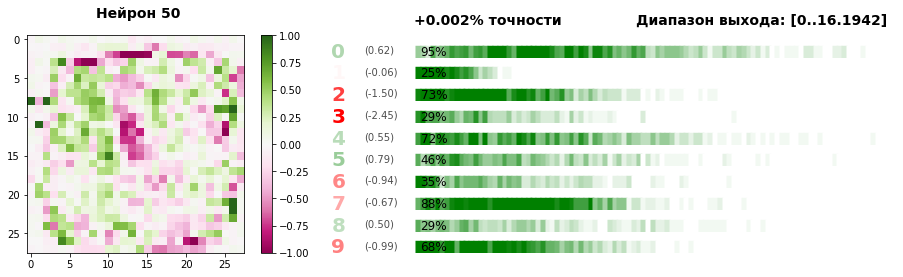

In [0]:
show_neuron(50)

В центре матрицы весов находится отрицательная область, окруженная положительной. Поэтому этот нейрон будет реагировать на цифры, содержащие внутри ближе к верху пустую область. Согласно статистике, действительно, такие цифры вызывают наибольший отклик.

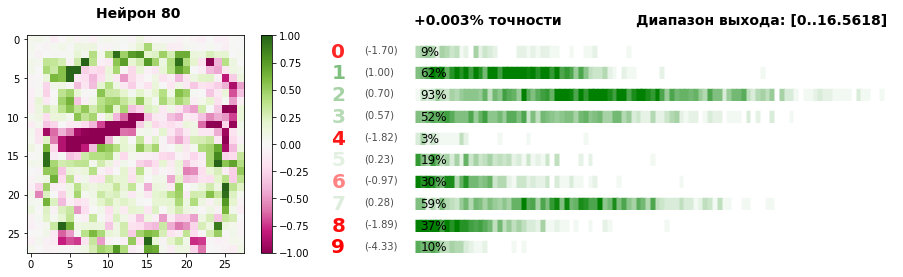

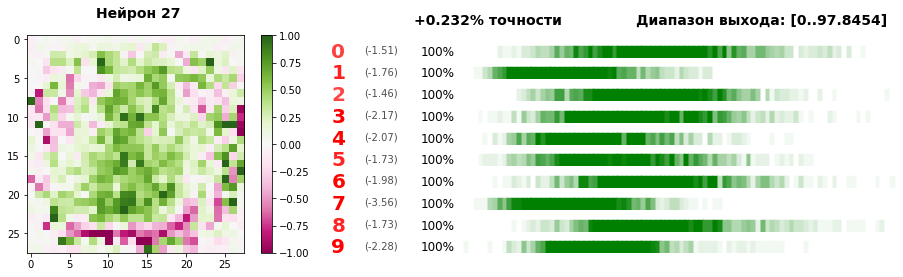

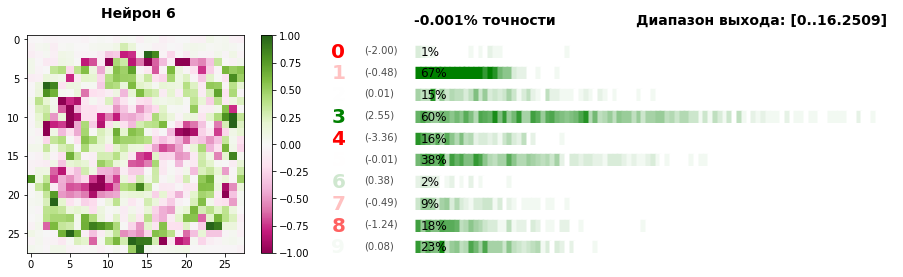

In [0]:
[show_neuron(x) for x in [80, 27, 6]];

### Выводы и дальнейшие задачи <a class="anchor" id="neuro_whats_next"></a>

В целом можно сделать несколько выводов:
1. Нейроны в обученной нейросети делятся на два класса. Во-первых "базовые", матрица весов - большая положительная область, практически всегда выход больше 0, удаление их значительно уменьшает точность распознавания. Во-вторых "фигурные", в которых положительные и отрицательные области представляют собой фигуры, линии, пятна. Таких нейронов в несколько раз больше, чем "базовых", и подавляющее большинство из них слегка увеличивает точность распознавания, некоторые слегка уменьшают (на 10 тысячах тестовых цифр).
2. Большая часть весов, идущих от второго слоя к третьему, отрицательна.
1. Многие матрицы весов напоминают размытые формы отдельных цифр или их комбинации, имеются и некоторые резкие границы. Нейросеть с такими матрицами весов перестанет корректно работать, если цифры уменьшить, сдвинуть, растянуть или повернуть. 
2. Каждый нейрон распознает не непрерывные линии, а лишь области пикселей. Это значит, что добавив к цифрам случайные "кляксы", можно нарушить распознавание.
3. Все матрицы содержат как полезные данные, так и вероятно бесполезный шум. Нейронная сеть заранее не знает, что пиксель номер 100 связан больше с пикселем 99, чем с пикселем 200, а также связан с пикселями 101, 72 и 128. Ей приходится "догадываться" об этом в процессе обучения. Причем о каждой связи пикселей приходится догадываться отдельно: после обучения она, скажем, сможет определить, что связаны пиксели 100-101, 101-102 и т. д., но может так и не догадаться о связи пикселей 102-103. Поэтому на этапе обучения было бы разумно применять размытие матрицы весов.

На основе собранных данных можно сформировать ряд дальнейших задач по оптимизации.

Для нейронных сетей с одним скрытым слоем:
- Может ли существовать однослойная нейросеть, распознающая масштабированные и перемещенные цифры?
- Могут ли быть в матрицах весов только простые фигуры (линии, круги, градиенты)? Может ли такая нейросеть быть эффективной?
- Влияет ли оптимизатор на какие-то общие характеристики получаемых матриц весов?

Для прозвольных нейронных сетей:
- Как выбирать начальные веса слоев, в особенности первого слоя, для задачи распознавания?
- Как реагирует обученная нейросеть на одно и тоже изображение, которое сдвинуто или искажено? На изображения, которые вообще не являются цифрами?
- Можно ли улучшить точность нейросети, регулярно осуществляя размытие первого слоя?
- Можно ли улучшить точность нейросети какой-либо предварительной обработкой изображения (например, выделение линий)?
- Можно ли улучшить точность нейросети, добавив к обучающим примерам различные их деформации?
- Можно ли улучшить точность нейросети, обрабатывая ею многократно одно и то же тестовое изображение с даными искажениями?
- Можно ли улучшить точность или скорость обучения многослойной нейросети, если сначала обучать нейросеть с меньшим числом слоев, а затем в уже обученную нейросеть добавлять новые слои и обучать заново?
- Если выбирать ответ голосованием N обученных нейросетей с одним скрытым слоем, будет ли точность распознавания стремиться к 100% при стремлении N к бесконечности?
- Если обучить 10 нейросетей, каждая из которых имеет один выход и распознает одну цифру, а затем объединить их, может ли это дать более высокую точность распознавания?
- Если в предыдущих двух задачах использовать не голосование или объединение, а дополнительную нейросеть, которая и выдает окончательный ответ, можно ли достичь еще более высокой точности?
- Можно ли заставить нейросеть формировать более человеко-понятные признаки на каждом слое? Как обучить нейросеть "понимать" изображение, то есть генерировать в выводе каких-то нейронов простую осмысленную информацию: положение линий, толщину и прочее?
- Как обучить нейросеть, которая будет максимально быстро усваивать новую информацию, то есть научаться распознавать новые символы, не теряя способность распознавать старые?
- Можно ли подобрать оптимальные параметры и обучить нейросети, используя генетический алгоритм?

### Нейронная сеть с одним скрытым слоем, часть 2 <a class="anchor" id="neuro_one_layer_2"></a>

*Может ли существовать однослойная нейросеть, распознающая масштабированные и перемещенные цифры?*

Попробуем обучить такую нейросеть. Для того, чтобы избежать переобучения, чтобы нейросеть не "привыкала" к конкретным цифрам в конекретных позициях (ведь в тестовом наборе другие цифры), каждые 3 итерации будем менять обучающий набор

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import random, math, time

import mnistlib as mnist
mnist.init()

counter = 0
def random_rectangle(img):
    global counter
    counter += 1
    if (counter % 100 == 0):
        print("random_rectangle(): %d изображений обработано" % counter, end = '\r')
    random_size = 1 / random.uniform(0.2, 0.6)
    x1 = -random.uniform(0, random_size - 1)
    x2 = x1 + random_size
    y1 = -random.uniform(0, random_size - 1)
    y2 = y1 + random_size
    img_edited = mnist.edit(img, mnist.Rectangle(x1, y1, x2, y2), scaling = 3, demo = True)
    return img_edited

train_images_perspective = np.array([random_rectangle(img) for img in mnist.x_train])
train_labels_perspective = np.array([label for label in mnist.y_train])

test_images_perspective = np.array([random_rectangle(img) for img in mnist.x_val])
test_labels_perspective = np.array([label for label in mnist.y_val])

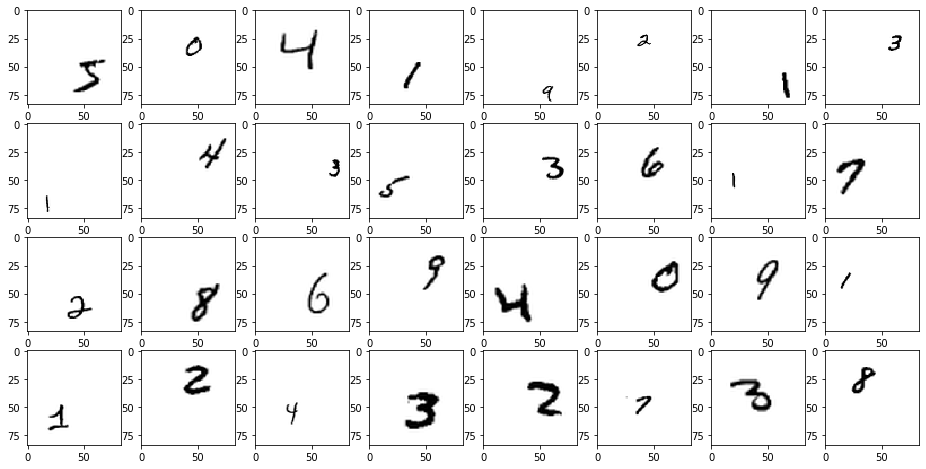

In [0]:
mnist.draw(*train_images_perspective[:32], columns = 8)

In [0]:
#используем сеть с 1000 нейронов, изображения 84x84
img_size = 84
model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(1000, activation = 'relu', input_shape = (img_size*img_size,)),
    tf.keras.layers.Dense(10, activation = 'softmax')
])
model.compile(
    optimizer = 'adam',
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

accuracy = []
def iteration(x_train, y_train, x_val, y_val):
    model.fit(x_train, y_train, epochs = 1, verbose = 0, batch_size = 200)
    prediction = model.predict(x_val).argmax(axis = 1)
    acc = accuracy_score(y_val, prediction)
    accuracy.append(acc)
    return acc

In [0]:
iterations = 15
for i in range(iterations):
    if i % 3 == 0 and i > 0:
        print("\nСмена обучающего набора...")
        counter = 0
        train_images_perspective = np.array([random_rectangle(img) for img in mnist.x_train])
        train_labels_perspective = np.array([label for label in mnist.y_train])
        test_images_perspective = np.array([random_rectangle(img) for img in mnist.x_val])
        test_labels_perspective = np.array([label for label in mnist.y_val])
        print("")
    acc = iteration(
        train_images_perspective.reshape(-1, img_size*img_size) / 255.0,
        train_labels_perspective,
        test_images_perspective.reshape(-1, img_size*img_size) / 255.0,
        test_labels_perspective
    )
    print("Iteration %d, accuracy %g" % (i, acc), end = '\r')

Iteration 2, accuracy 0.6846
Смена обучающего набора...
random_rectangle(): 70000 изображений обработано
Iteration 5, accuracy 0.7713
Смена обучающего набора...
random_rectangle(): 70000 изображений обработано
Iteration 8, accuracy 0.7966
Смена обучающего набора...
random_rectangle(): 70000 изображений обработано
Iteration 11, accuracy 0.8281
Смена обучающего набора...
random_rectangle(): 70000 изображений обработано


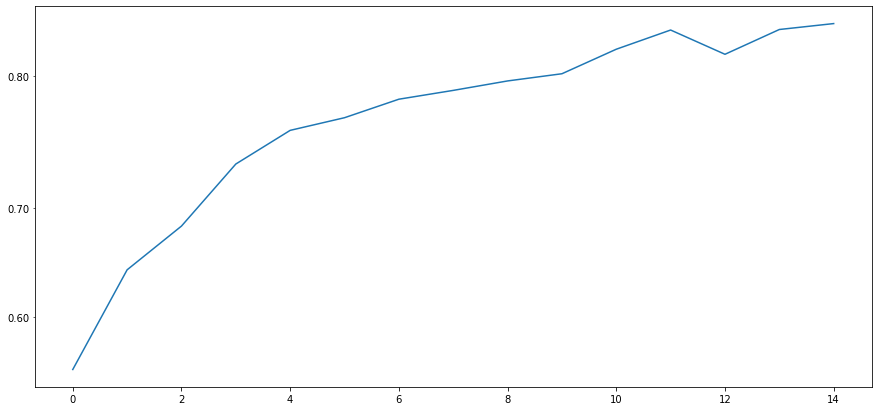

In [0]:
plt.figure(figsize = (15, 7))
plt.yscale('logit')
plt.plot(accuracy)
plt.show()

In [0]:
test_images_by_number = [None] * 10
test_labels_by_number = [None] * 10
for i in range(10):
    img_indices = np.where(test_labels_perspective == i)
    test_images_by_number[i] = test_images_perspective[img_indices]
    test_labels_by_number[i] = test_labels_perspective[img_indices]
    print("Число %d: %d изображений" % (i, len(test_images_by_number[i])))

Число 0: 980 изображений
Число 1: 1135 изображений
Число 2: 1032 изображений
Число 3: 1010 изображений
Число 4: 982 изображений
Число 5: 892 изображений
Число 6: 958 изображений
Число 7: 1028 изображений
Число 8: 974 изображений
Число 9: 1009 изображений


In [0]:
for i in range(10):
    prediction = model.predict(test_images_by_number[i].reshape(-1, img_size*img_size) / 255.0).argmax(axis = 1)
    acc = accuracy_score(test_labels_by_number[i], prediction)
    print("Число %d: точность %g" % (i, acc))

Число 0: точность 0.868367
Число 1: точность 0.963877
Число 2: точность 0.820736
Число 3: точность 0.810891
Число 4: точность 0.830957
Число 5: точность 0.751121
Число 6: точность 0.877871
Число 7: точность 0.831712
Число 8: точность 0.773101
Число 9: точность 0.765114


Таким образом, масштабированные и перемещенные цифры могут распознаваться нейронной сетью всего с одним скрытым слоем с 1000 нейронов, с точностью от 75% до 96% для разных цифр после 10 эпох обучения. Посмотрим на матрицы весов:

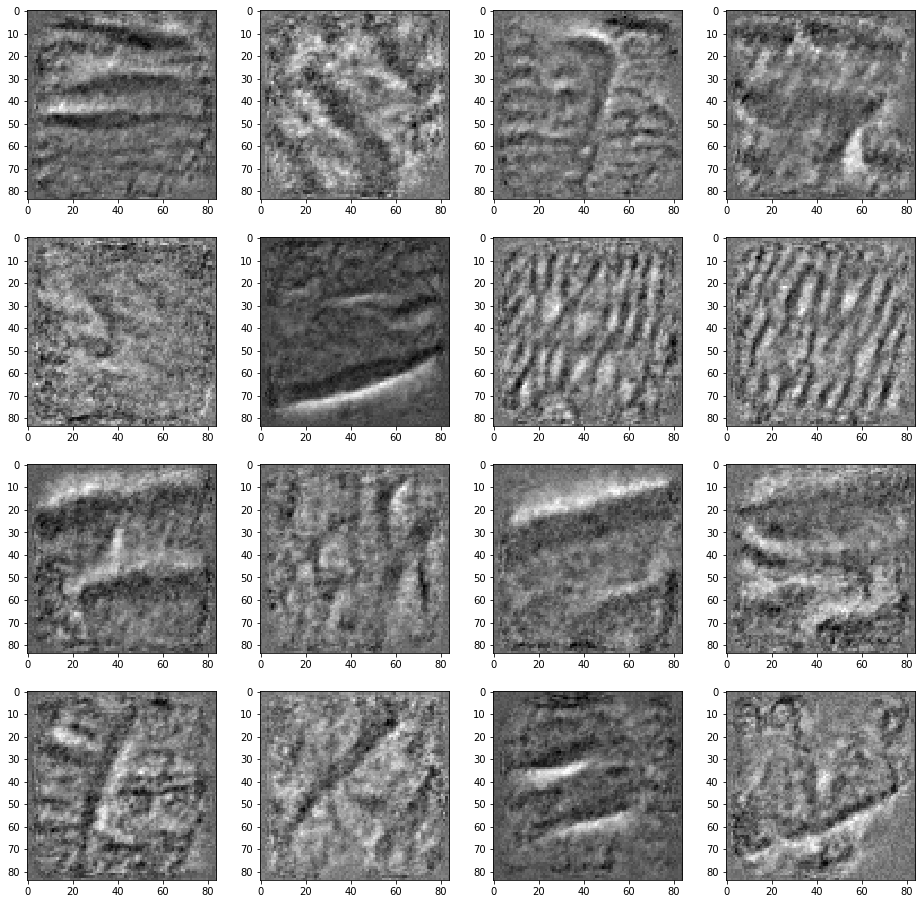

In [0]:
first_layer_weights = model.get_layer(index = 0).get_weights()[0].reshape((img_size, img_size, -1))

matrices = []
for neuron_index in range(16):
    neuron_weights = first_layer_weights[:, :, neuron_index]
    matrices.append(neuron_weights)
mnist.draw(*matrices)

Смысл этих весов с первого взгляда не везде понятен. Можно было бы провести здесь много экспериментов, сдвигая одно из изображений и проверяя, как изменится ответ нейросети. Данная нейросеть умеет распознавать вертикальные линии (единицы с точностью 96%) и круги (нули с точностью 87%). Возможно ответ нейросети является комбинацией суждений о наличии на поле геометрических фигур? Например, если найдена горизонтальная и диагональная линии, но не найдено полукругов, то это семерка. Если взять цифру, разделить ее на две части и поместить в разных местах изображения, возможно она тоже распознается нейросетью? Оставим пока этот вопрос и перейдем к следующему.

*Могут ли быть в матрицах весов только простые фигуры (линии, круги, градиенты)? Может ли такая нейросеть быть эффективной?*

Пропустим и этот вопрос, как с трудом проверяемый на практике.

*Влияет ли оптимизатор на какие-то общие характеристики получаемых матриц весов?*

Мы установили, что нейроны при обучении оптимизатором adam разделяются на два разных класса: "базовые" и "фигурные". Базовым нейроном можно считать такой, у которого все выходные веса ниже -1. Проверим количество базовых нейронов на adam и других классификаторов, а также посмотрим получающиеся матрицы весов (тест не завершен).

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time

import mnistlib as mnist
mnist.init()

def test_optimizer(optimizer, activation1, activation2, iterations, pics_count):
    model = tf.keras.models.Sequential([
        tf.keras.layers.Dense(100, activation = activation1, input_shape = (28*28,)),
        tf.keras.layers.Dense(10, activation = activation2)
    ])
    model.compile(
        optimizer = optimizer,
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )
    accuracy = []

    def iteration():
        model.fit(mnist.x_train_flat / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(mnist.x_val_flat / 255.0).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        accuracy.append(acc)
        print("Iteration", i, "accuracy", acc, end = '\r')
    
    for i in range(iterations):
        iteration()
    print("")

    plt.figure(figsize = (15, 5))
    plt.yscale('logit')
    plt.plot(accuracy[5:])
    plt.show()
    
    for i in range(pics_count):
        show_neuron(i, _model = model, autoscale = True)
    
    return model

import math
import PIL
from IPython.display import Image 
def show_neuron(neuron_index, _model = None, autoscale = False):
    _model = _model if _model else model
    first_layer_weights = _model.get_layer(index = 0).get_weights()[0].reshape((28, 28, -1))
    neuron_weights = first_layer_weights[:, :, neuron_index]
    second_layer_weights = _model.get_layer(index = 1).get_weights()[0]
    neuron_outputs = second_layer_weights[neuron_index, :]
    fig, ax = plt.subplots(1, 1)
    fig.suptitle('Нейрон %d' % neuron_index, fontsize = 14, fontweight = 'bold')
    vmin = -1
    vmax = 1
    if autoscale:
        vmax = np.max(neuron_weights)
        vmin = np.min(neuron_weights)
    img = ax.imshow(neuron_weights, cmap = 'PiYG', origin = 'upper', vmin = vmin, vmax = vmax)
    for i in range(10):
        output = neuron_outputs[i] / 2
        if output > 0:
            color = (max(0, 1 - output), 0.5 + 0.5*max(0, 1 - output), max(0, 1 - output))
        else:
            color = (1, max(0, 1 - -output), max(0, 1 - -output))
        ax.text(1.4, 0.9 - 0.1*i, str(i), transform = ax.transAxes,
            fontsize = 20, fontweight = 'bold', color = color)
        ax.text(1.55, 0.92 - 0.1*i, '(%.2f)' % neuron_outputs[i],
            transform = ax.transAxes, fontsize = 10, color = (.3, .3, .3))
    fig.colorbar(img)
    acc_before, acc_after = delete_neuron_test(neuron_index, _model = _model)
    acc_gain = acc_before - acc_after
    ax.text(1.78, 1.05, "%+.3f%% точности" % acc_gain, transform = ax.transAxes,
        fontsize = 14, fontweight = 'bold')
    statistics_raw = [None] * 10
    for number in range(10):
        img_indices = np.where(mnist.y_val == number)
        imgs = mnist.x_val_flat[img_indices]
        statistics_raw[number] = []
        for i in range(len(imgs)):
            input_data = imgs[i][np.newaxis, :].astype(np.float32) / 255.0
            output_data = _model.get_layer(index = 0)(input_data)[0][neuron_index].numpy()
            statistics_raw[number].append(output_data)
    max_value_float = max([max(number_stat) for number_stat in statistics_raw])
    max_value = math.ceil(max_value_float)
    ax.text(2.8, 1.05, "Диапазон выхода: [0..%g]" % max_value_float,
            transform = ax.transAxes, fontsize = 14, fontweight = 'bold')
    stat_max = 1
    stat_step = 0.01
    output_range = np.arange(0, stat_max, stat_step)
    stat_size = len(output_range)
    for number in range(10):
        total_positive_count = 0
        total_negative_count = 0
        number_stat_raw = statistics_raw[number]
        statistics = np.zeros((stat_size,))
        for i in range(len(number_stat_raw)):
            index = math.floor((number_stat_raw[i] / max_value - 0.001) / stat_step)
            if index >= stat_size:
                index = stat_size - 1
            if index >= 0:
                statistics[index] += 1
                total_positive_count += 1
            else:
                total_negative_count += 1
        percent = 100 * total_positive_count / (total_positive_count + total_negative_count)
        for i in range(stat_size):
            color_ratio = min(1.0, statistics[i] / 20)
            color = ((1 - color_ratio), 0.5 + 0.5*(1 - color_ratio), (1 - color_ratio))
            ax.text(1.78 + 0.022*i, 0.91 - 0.1*number, "▮", transform = ax.transAxes,
                fontsize = 16, fontweight = 'bold', color = color)
        ax.text(1.81, 0.91 - 0.1*number, "%.0f%%" % percent, transform = ax.transAxes, fontsize = 12)
    plt.show()

def delete_neuron_test(neuron, test_images = mnist.x_val_flat, test_classes = mnist.y_val, _model = None):
    _model = _model if _model else model
    model_edited = tf.keras.models.clone_model(_model)
    model_edited.set_weights(_model.get_weights())

    prediction = model_edited.predict(test_images / 255.0).argmax(axis = 1)
    acc_before = accuracy_score(test_classes, prediction)

    weights, constants = model_edited.get_layer(index = 0).get_weights()
    weights[:, neuron] = 0
    model_edited.get_layer(index = 0).set_weights((weights, constants))

    prediction = model_edited.predict(test_images / 255.0).argmax(axis = 1)
    acc_after = accuracy_score(test_classes, prediction)
    
    #print("Удаляем нейрон %d: точность %.3g -> %.3g" % (neuron, acc_before, acc_after))
    
    return acc_before, acc_after

Iteration 499 accuracy 0.9775


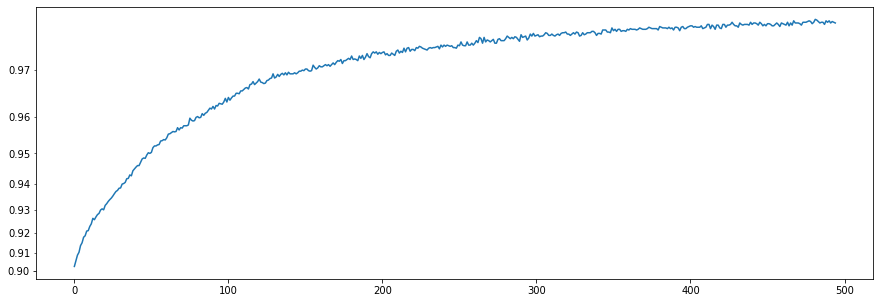

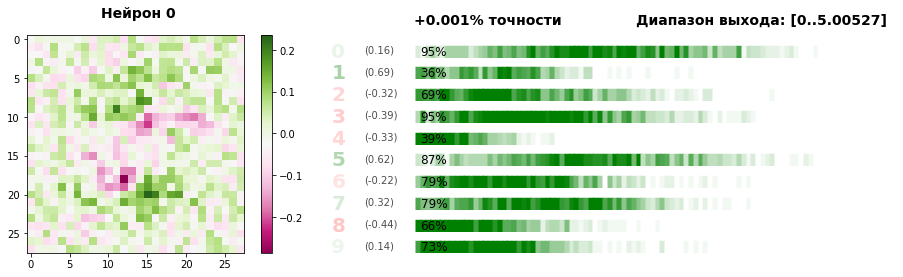

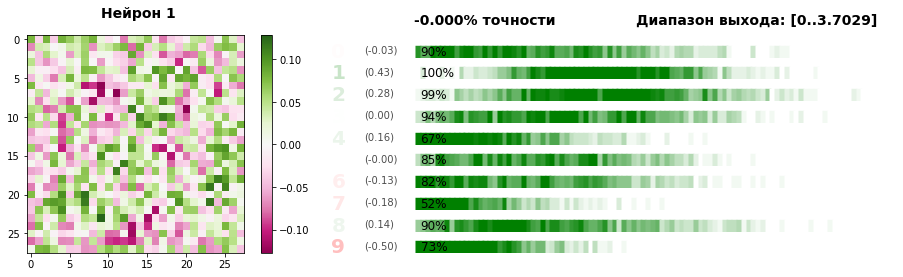

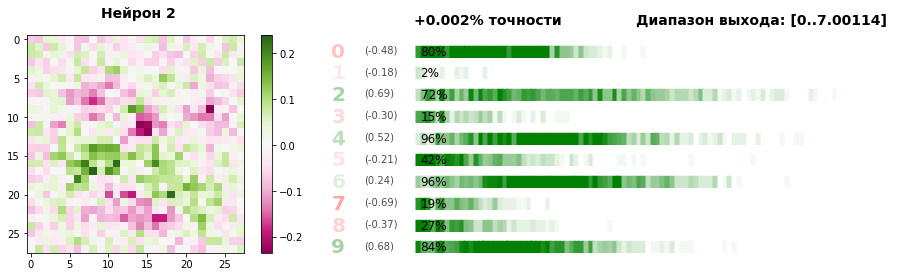

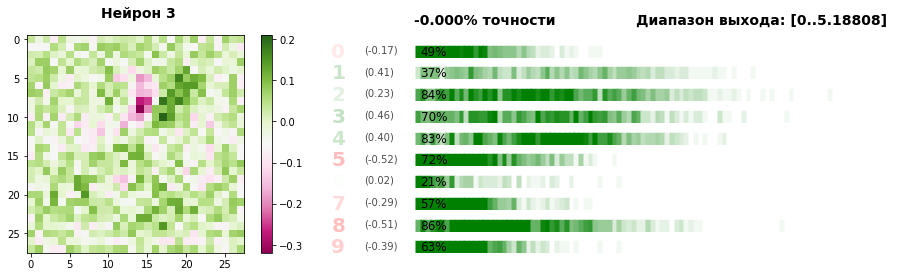

...

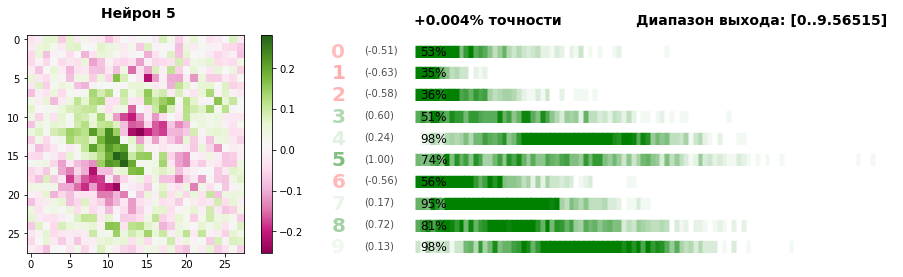

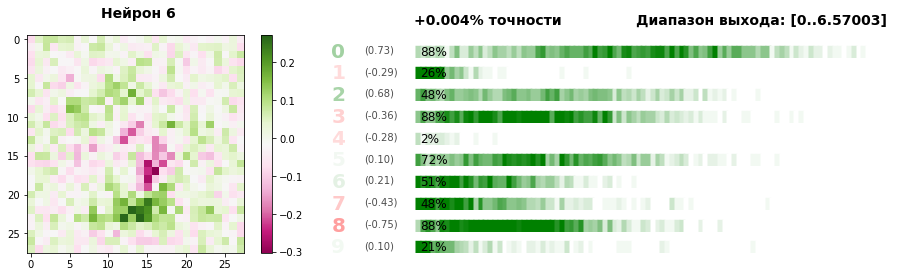

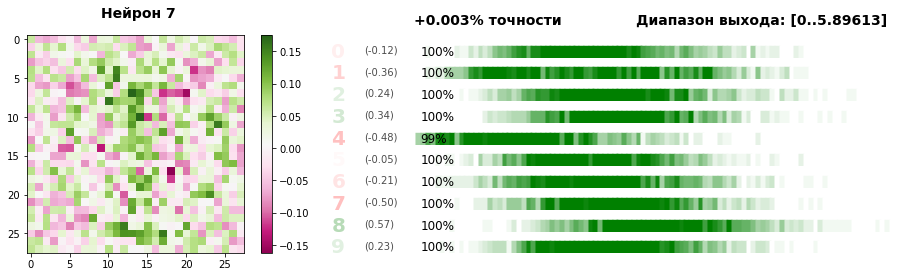

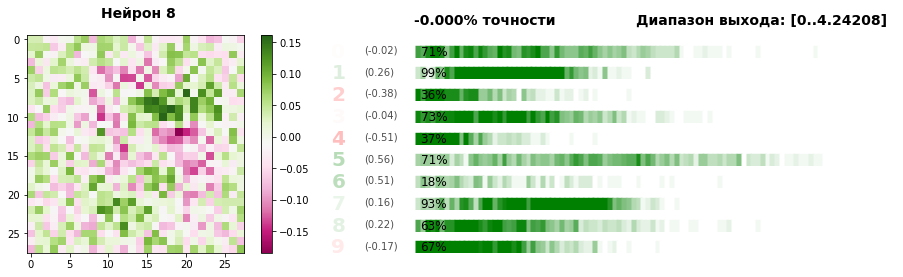

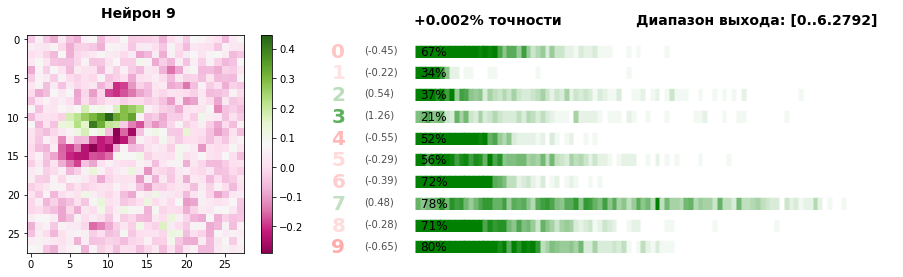

Iteration 499 accuracy 0.9794


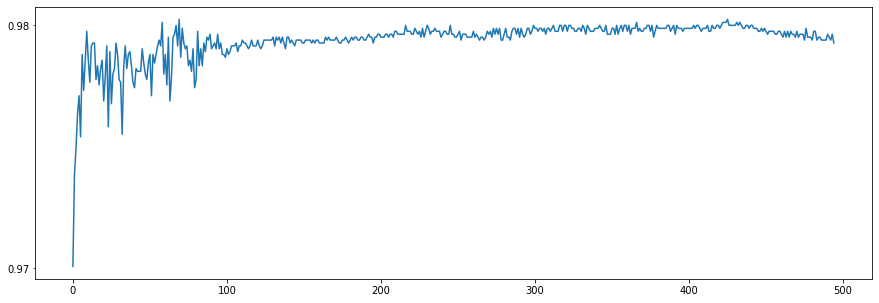

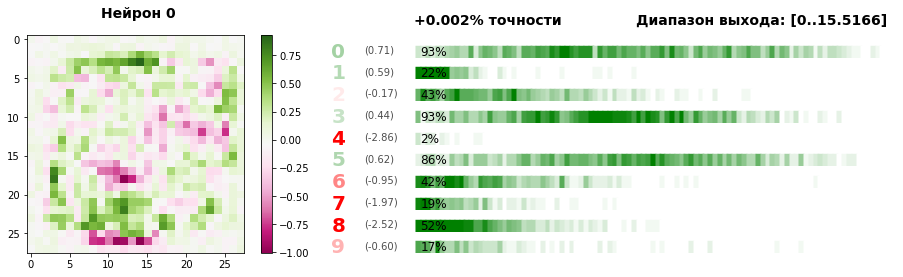

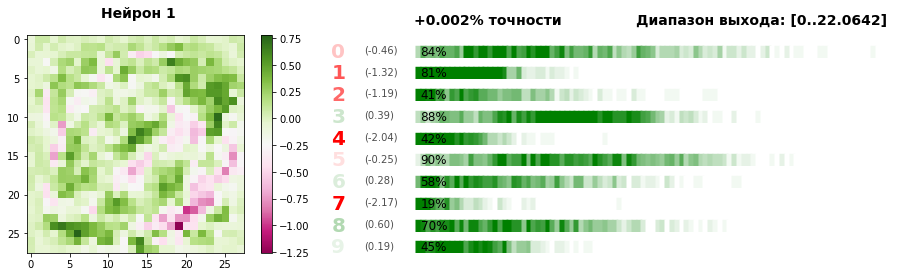

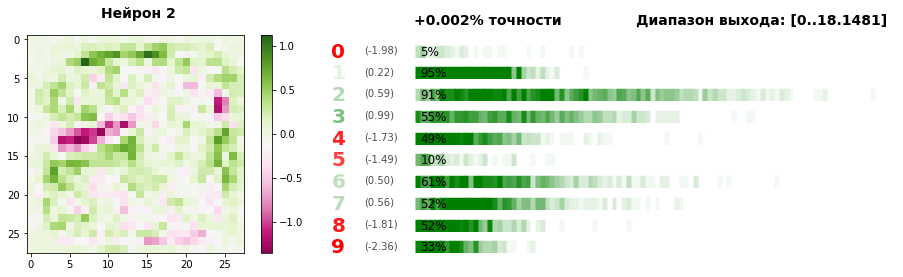

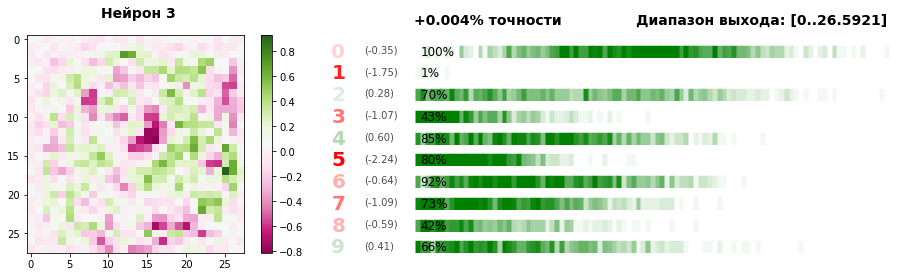

...

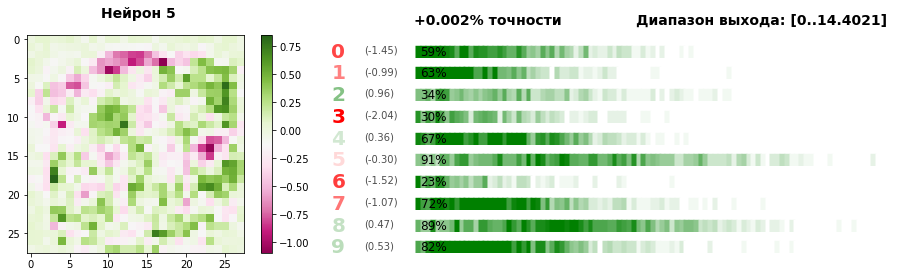

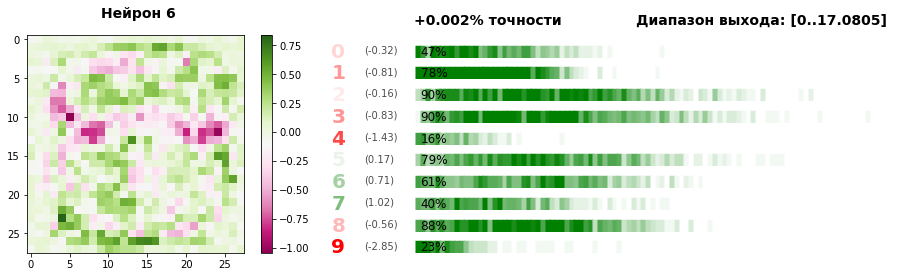

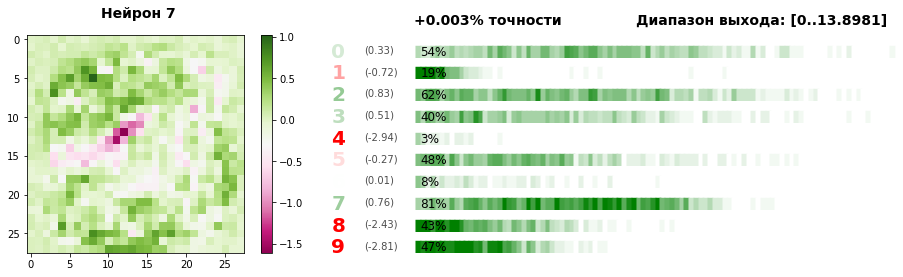

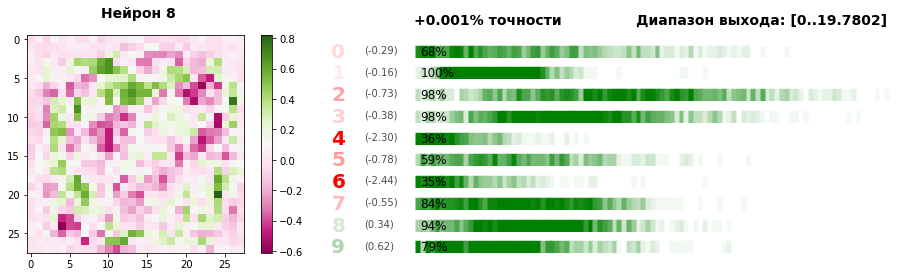

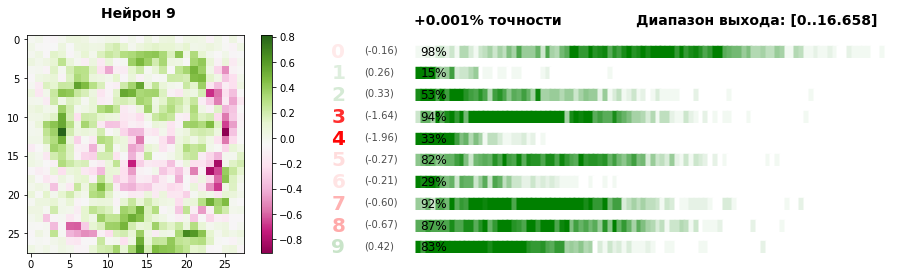

Iteration 499 accuracy 0.9769


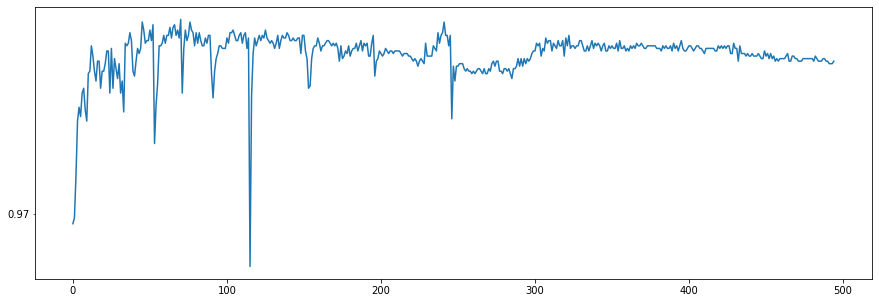

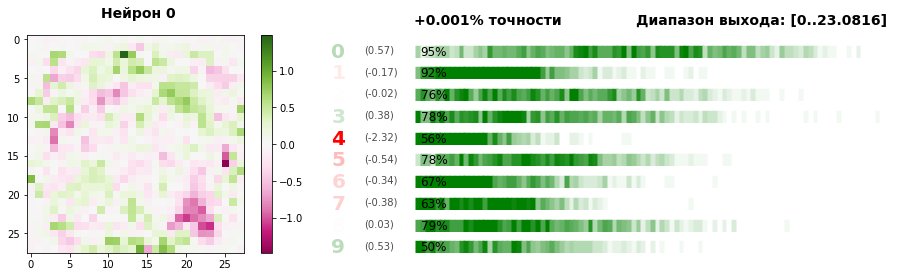

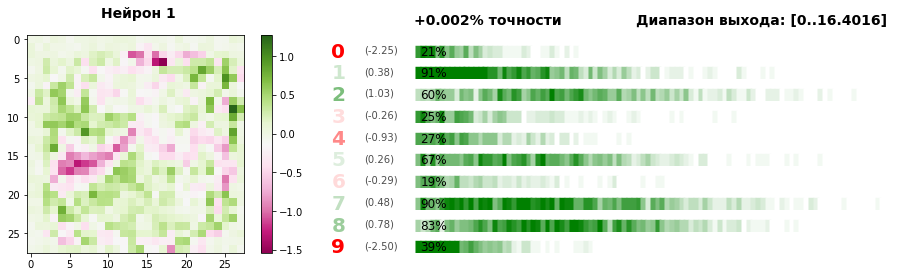

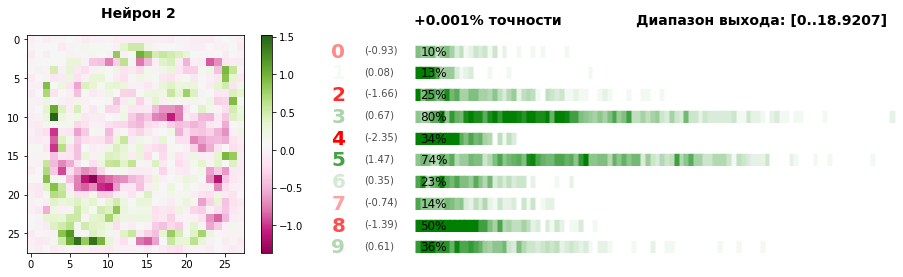

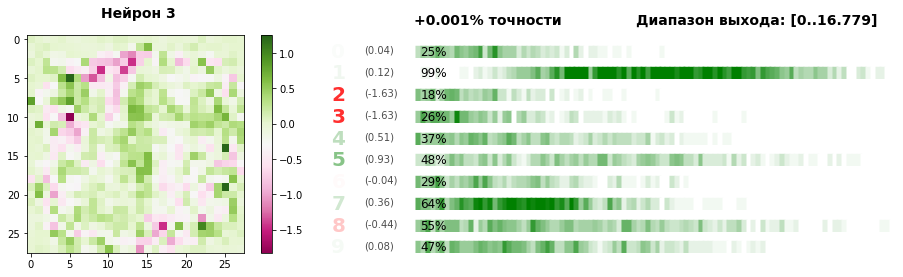

...

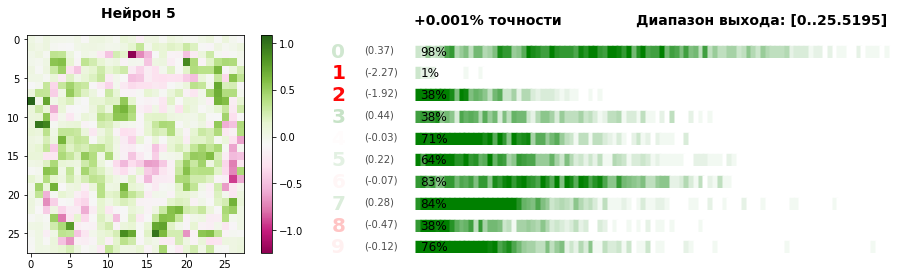

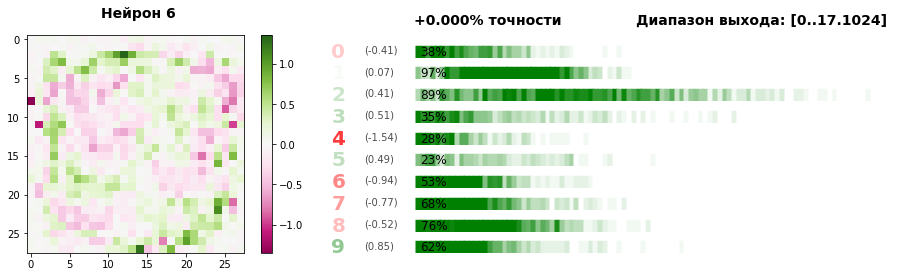

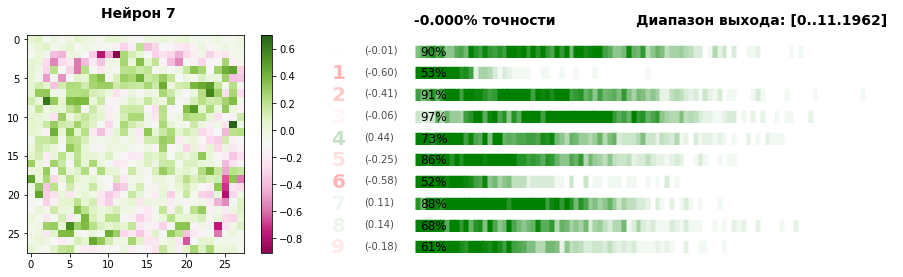

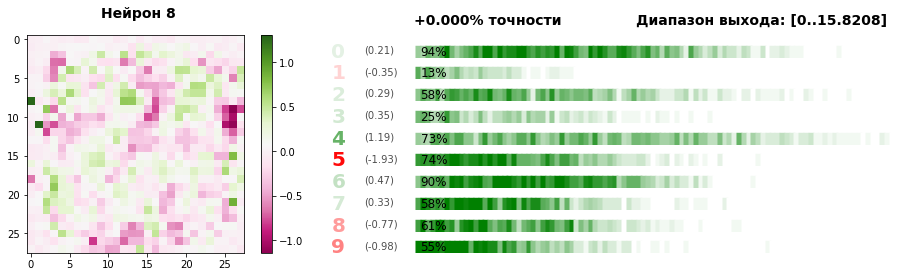

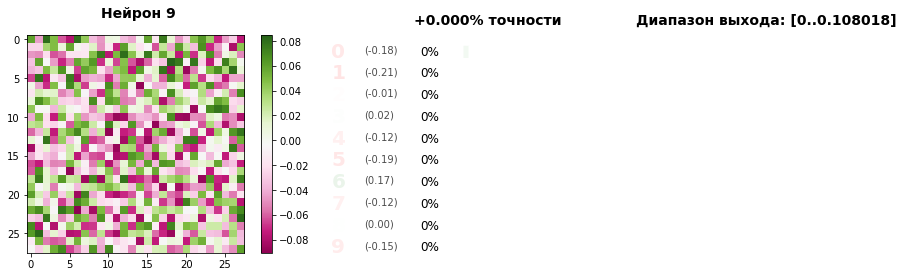

Iteration 499 accuracy 0.9789


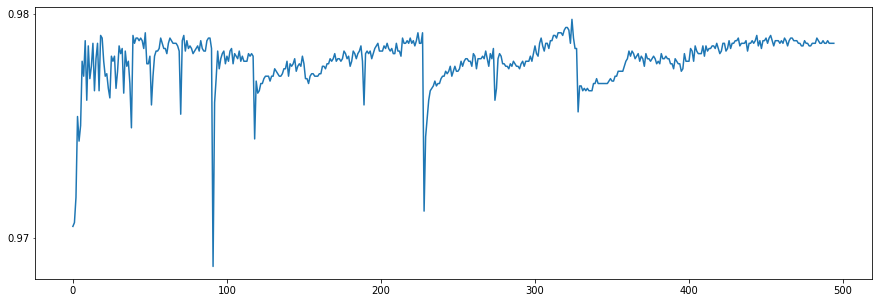

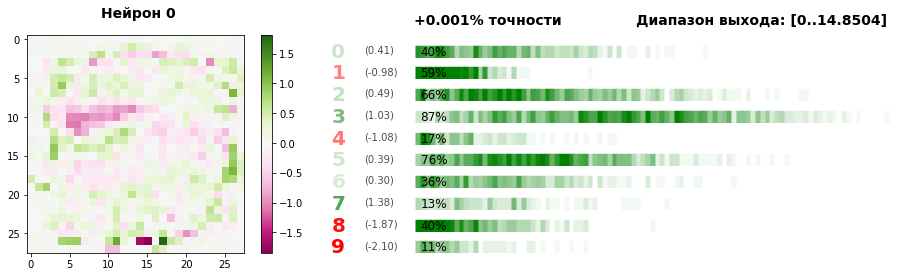

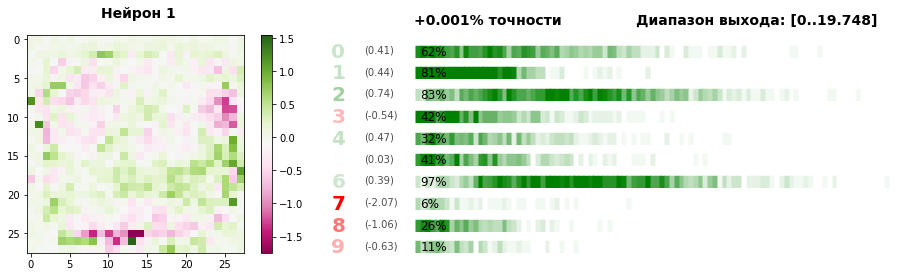

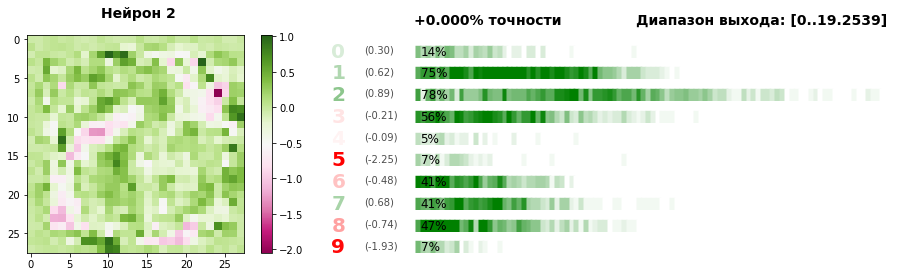

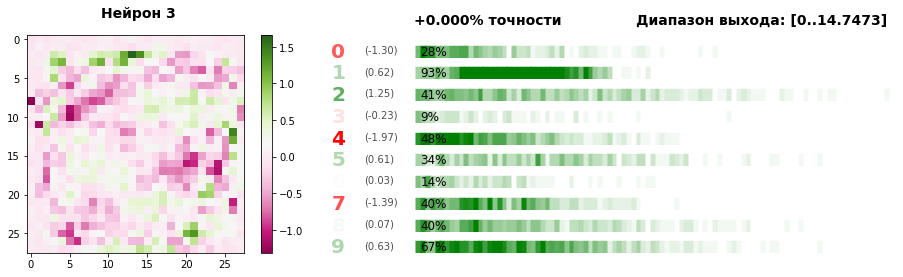

...

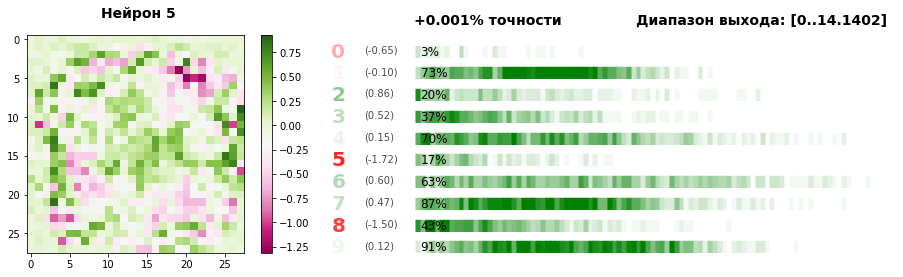

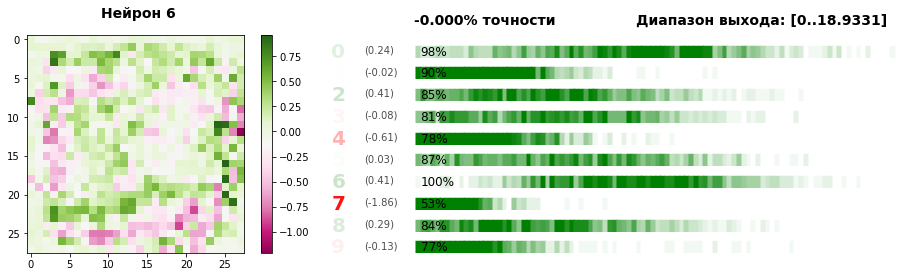

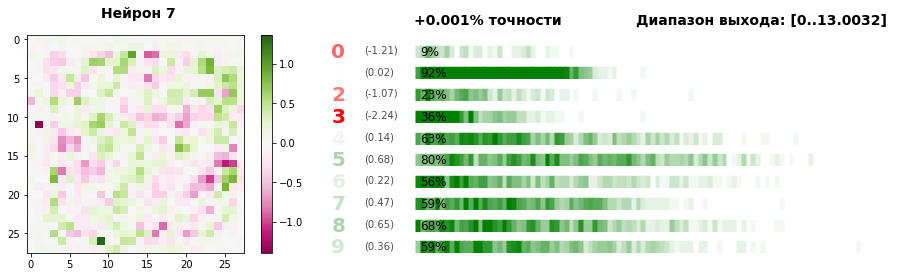

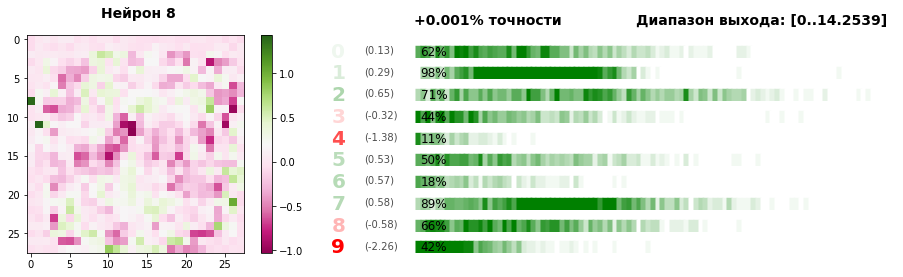

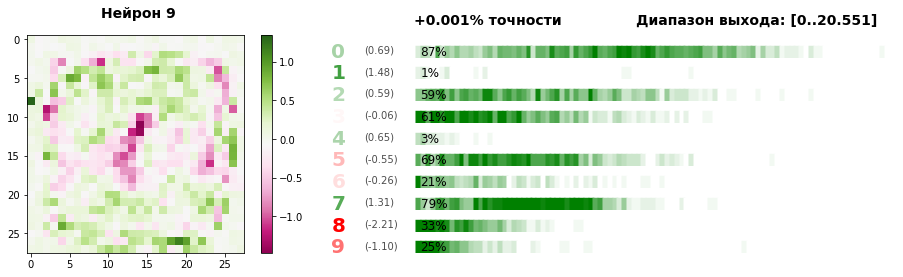

Iteration 499 accuracy 0.9767


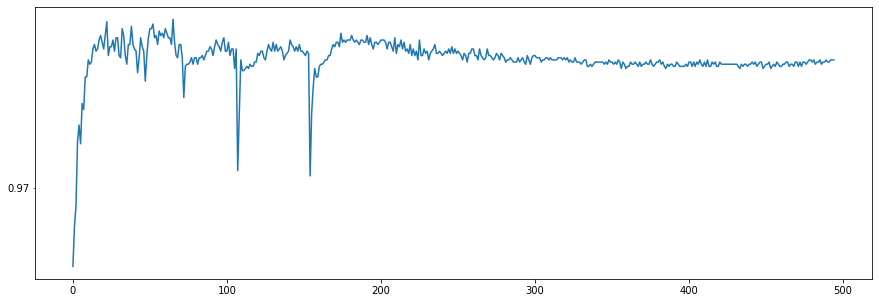

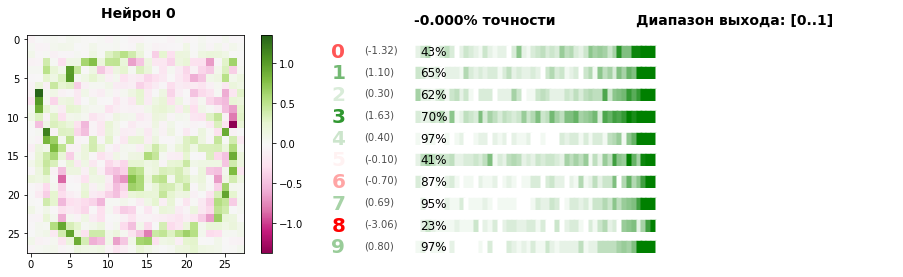

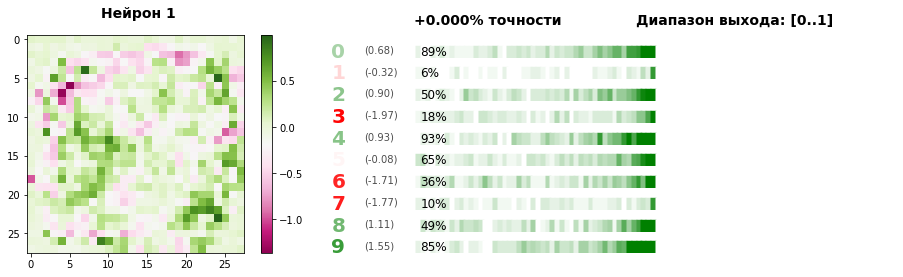

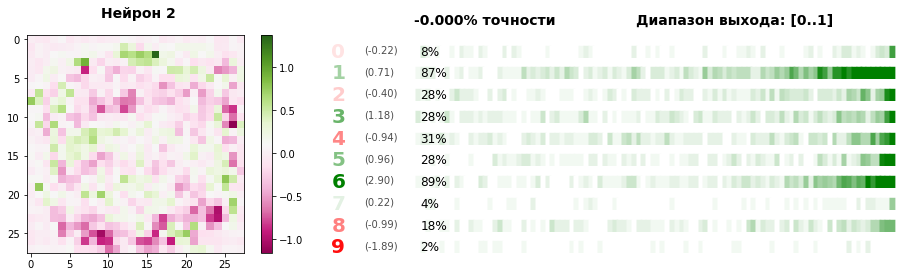

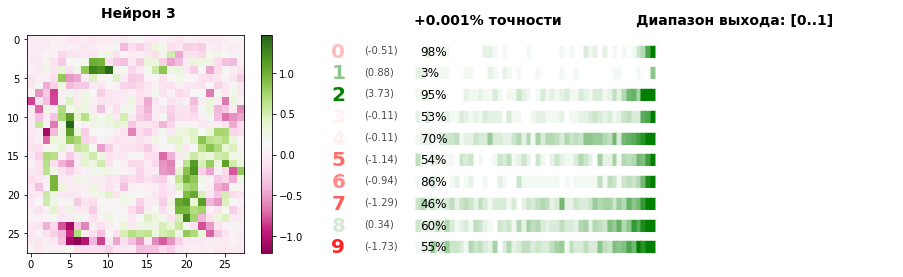

...

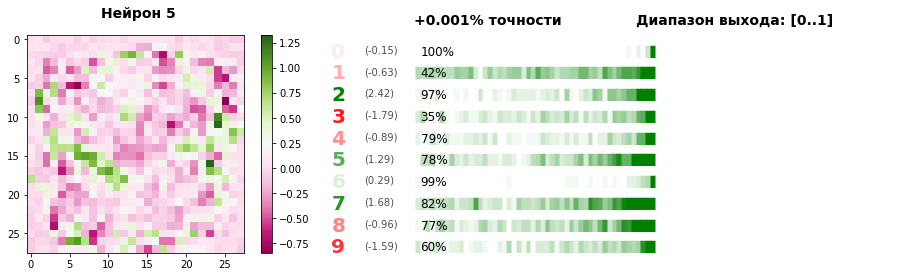

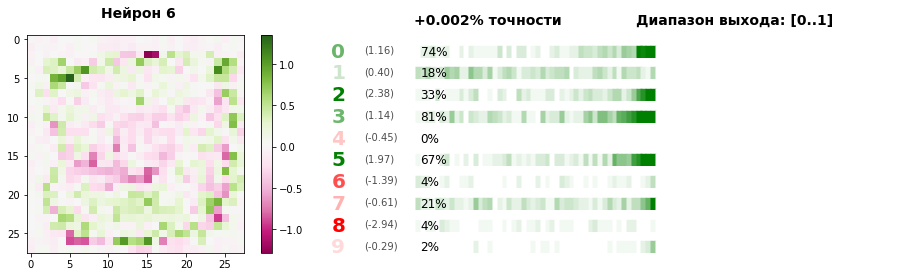

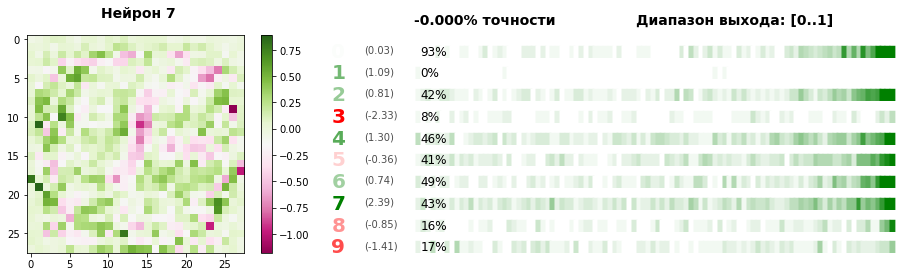

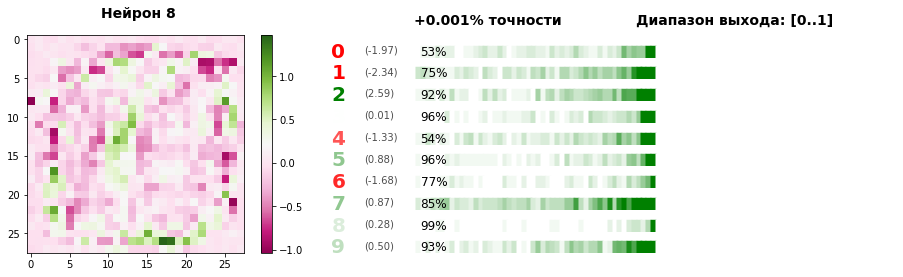

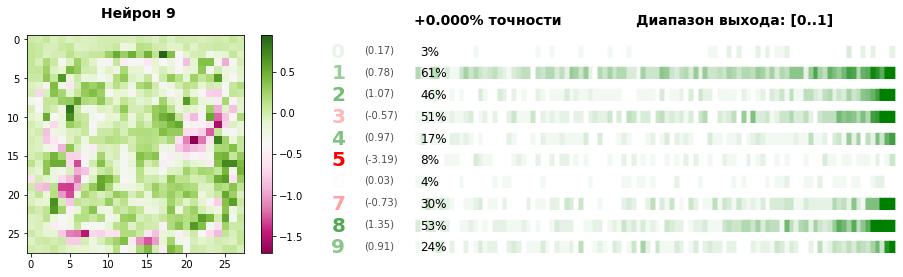

Iteration 499 accuracy 0.9764


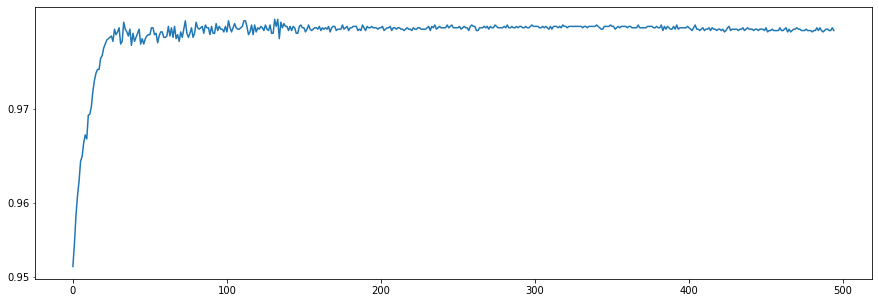

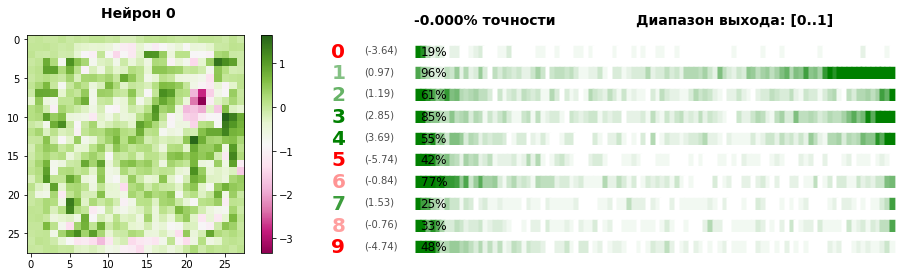

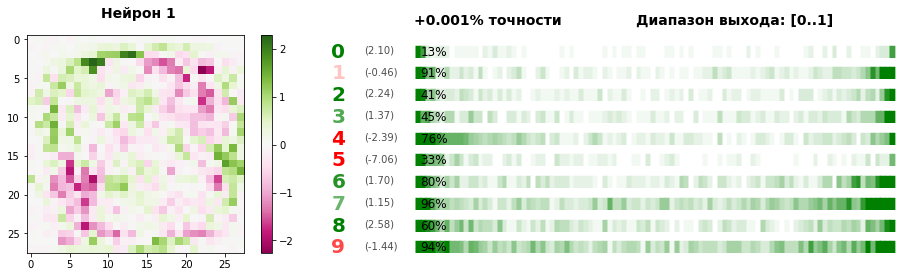

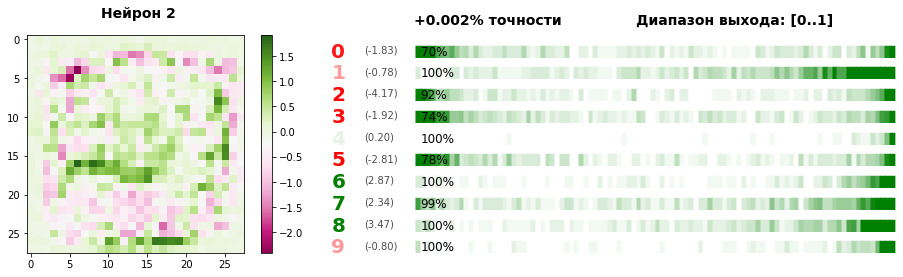

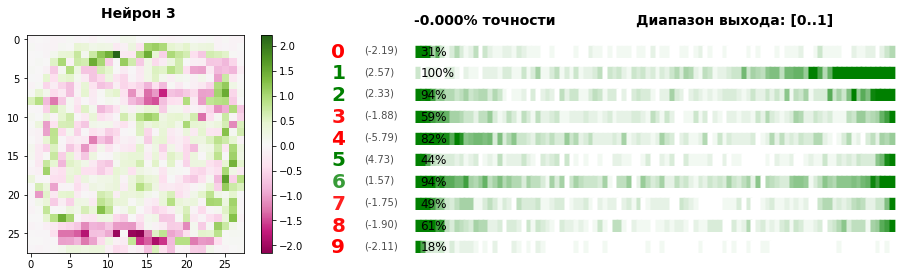

...

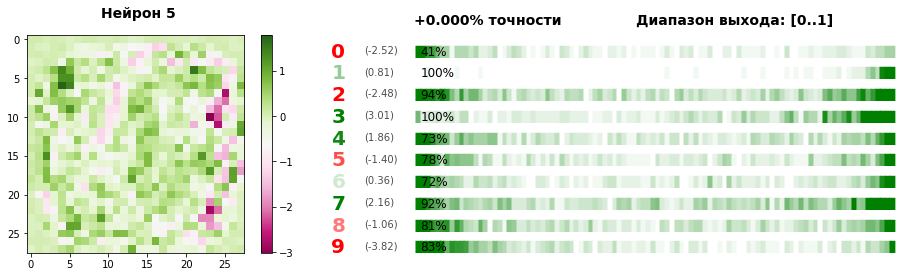

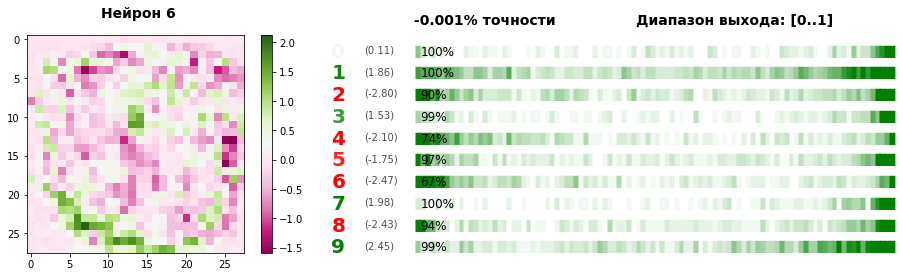

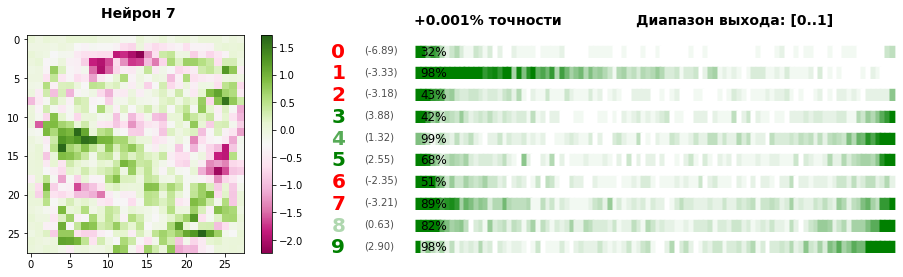

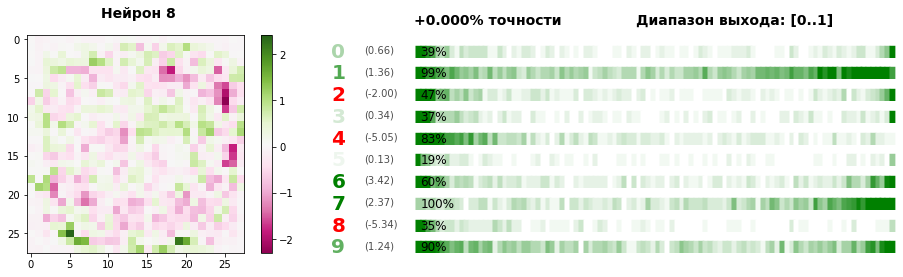

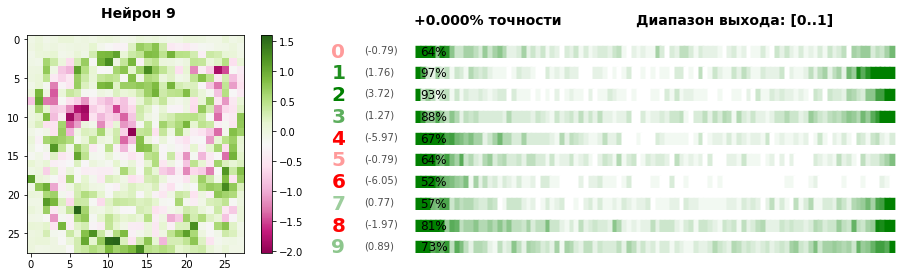

In [0]:
iterations = 500
neuron_images_per_test = 10
test_optimizer('sgd', 'relu', 'softmax', iterations, neuron_images_per_test)
test_optimizer('rmsprop', 'relu', 'softmax', iterations, neuron_images_per_test)
test_optimizer('nadam', 'relu', 'softmax', iterations, neuron_images_per_test)
test_optimizer('adam', 'relu', 'softmax', iterations, neuron_images_per_test)
test_optimizer('adam', 'tanh', 'softmax', iterations, neuron_images_per_test)
test_optimizer('adam', 'sigmoid', 'softmax', iterations, neuron_images_per_test)

Мы снова исследовали экспериментальным путем работу разных алгоритмов с настройками по умолчанию. Так как подробное сравнение алгоритмов сейчас не является нашей задачей, пока ограничимся этим. Исследовали также результаты обучения при алгоритме adam с разными функциями активации. Все это делалось только для сети с одним скрытым слоем, возможно для других сетей и результат окажется совсем другим.

Для каждого случае отобразили подробную информацию о нескольких нейронах - это и было основной целью эксперимента. Ничего особенно необычного не обнаружено, разве что в сочетании relu + nadam среди первых 10 нейронов обнаружен один вообще не обученный нейрон. Сочетание relu + rmsprop дает довольно плавные, сглаженные матрицы весов, что хорошо.

Периодические резкие падения точности в оптимизаторе adam с функциями активации relu и tanh можно обьяснить: как выяснилось ранее, для некоторых нейронов их удаление влечет резкое падение точности, иногда на 2%. Возможно, алгоритм в какие-то моменты как раз и нарушает работу таких нейронов. Видимо, так задумано в данном алгоритме, но такое поведение непредсказуемо и для дальнейших тестов неудобно. Наибольшее удобно сочетание relu + rmsprop, которое дает высокую точность, сглаженную матрицу весов первого слоя и при дальнейшем обучении не дает резких просадок в точности.

Выходная функция активации не должна никак влиять на обучение, поскольку не влияет на ответ нейросети: реальным ответом является линейная часть выходной функции. Поэтому будем использовать функцию sigmoid.

Нужно еще определить batch size. Цитата со stackoverflow:

*Batch size impacts learning significantly. What happens when you put a batch through your network is that you average the gradients. The concept is that if your batch size is big enough, this will provide a stable enough estimate of what the gradient of the full dataset would be. By taking samples from your dataset, you estimate the gradient while reducing computational cost significantly. The lower you go, the less accurate your esttimate will be, however in some cases these noisy gradients can actually help escape local minima. When it is too low, your network weights can just jump around if your data is noisy and it might be unable to learn or it converges very slowly, thus negatively impacting total computation time.*

*Another advantage of batching is for GPU computation, GPUs are very good at parallelizing the calculations that happen in neural networks if part of the computation is the same (for example, repeated matrix multiplication over the same weight matrix of your network). This means that a batch size of 16 will take less than twice the amount of a batch size of 8.*

Из другого источника:

*In Keras batch_size refers to the batch size in Mini-batch Gradient Descent. If you want to run a Batch Gradient Descent, you need to set the batch_size to the number of training samples.*

Нужно проверить разные размеры батчей. Усредним данные по 5 экспериментам.

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import time, math

import mnistlib as mnist
mnist.init()

batches = [50, 100, 200, 500, 1000, 6000]
batches_results = dict()
batches_times = dict()
experiments = 5

def make_iterations(iterations):
    for batch in batches:
        avg_accuracy = [0] * iterations
        avg_times = [0] * iterations
        for e in range(experiments):
            print("batch size %d, эксперимент %d" % (batch, e))
            model = tf.keras.models.Sequential([
                tf.keras.layers.Dense(300, activation = 'relu', input_shape = (28*28,)),
                tf.keras.layers.Dense(10, activation = 'softmax')
            ])
            model.compile(
                optimizer = 'rmsprop',
                loss = 'sparse_categorical_crossentropy',
                metrics = ['accuracy']
            )
            accuracy = []
            times = []
            start_time = time.time()
            for i in range(iterations):
                model.fit(mnist.x_train_flat / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = batch)
                prediction = model.predict(mnist.x_val_flat / 255.0).argmax(axis = 1)
                acc = accuracy_score(mnist.y_val, prediction)
                accuracy.append(acc)
                total_time = time.time() - start_time
                times.append(total_time)
                print("batch_size", batch, "iteration", i, "accuracy", acc, end = '\r')
            print('\nBatch size: %d, время на %d эпох: %g секунд' % (batch, iterations, time.time() - start_time))
            for i in range(iterations):
                avg_accuracy[i] += accuracy[i]
                avg_times[i] += times[i]
        for i in range(iterations):
            avg_accuracy[i] /= experiments
            avg_times[i] /= experiments
        batches_results[batch] = avg_accuracy
        batches_times[batch] = avg_times

make_iterations(50)

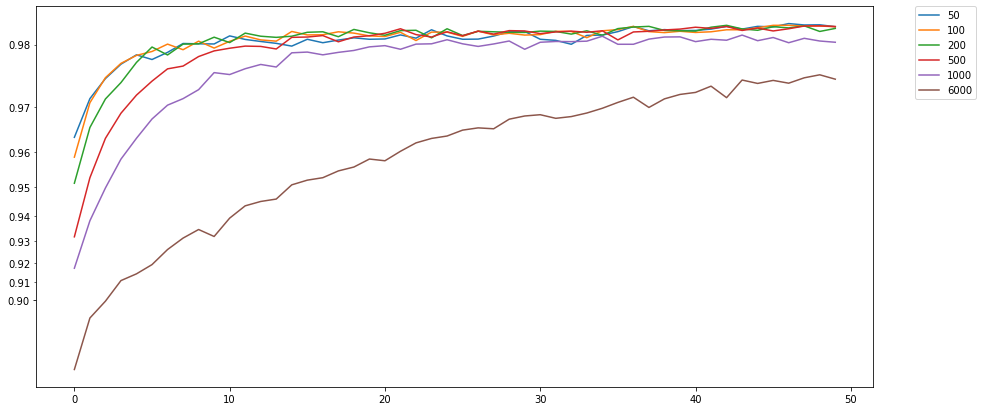

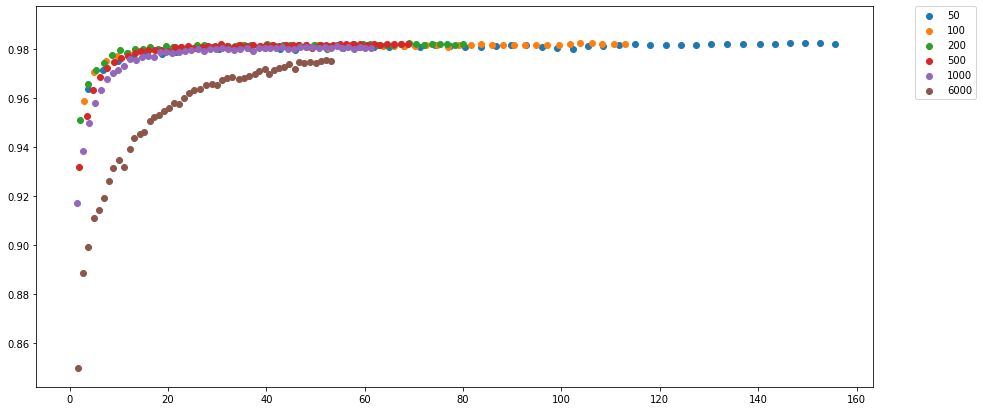

In [0]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 7))
plt.yscale('logit')
for batch in batches:
    plt.plot(batches_results[batch], label = batch)
plt.legend(bbox_to_anchor = (1.05, 1), loc = 'upper left', borderaxespad = 0)
plt.show()

plt.figure(figsize = (15, 7))
for batch in batches:
    plt.scatter(batches_times[batch], batches_results[batch], label = batch)
    plt.legend(bbox_to_anchor = (1.05, 1), loc = 'upper left', borderaxespad = 0)
plt.show()

Вывод: максимальная точность за наименьшее время (10 секунд, 10 итераций) достигается при batch_size = 200

Попробуем ради экспермента обучить модель c 300 нейронами в течение 2000 эпох: нужно убедиться, что точность не поползет вниз.

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time

import mnistlib as mnist
mnist.init()

model = tf.keras.models.Sequential([
    tf.keras.layers.Dense(300, activation = 'relu', input_shape = (28*28,)),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
])
model.compile(
    optimizer = 'rmsprop',
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

accuracy = []
def iteration():
    model.fit(mnist.x_train_flat / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
    prediction = model.predict(mnist.x_val_flat / 255.0).argmax(axis = 1)
    acc = accuracy_score(mnist.y_val, prediction)
    accuracy.append(acc)
    print("Iteration", i, acc, end = '\r')

for i in range(2000):
    iteration()

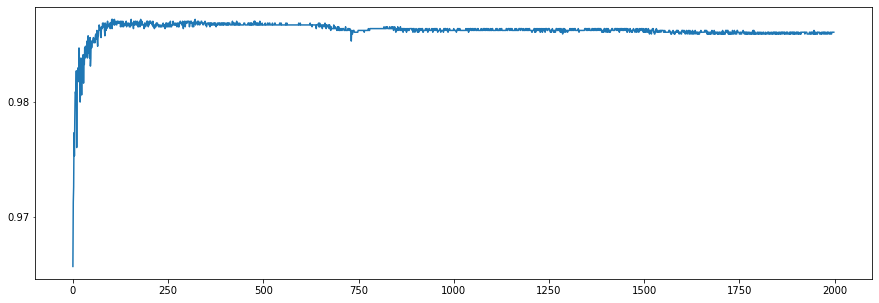

In [0]:
plt.figure(figsize = (15, 5))
plt.yscale('logit')
plt.plot(accuracy[1:])
plt.show()

С заданными параметрами максимальная точность достигается через 100 итераций, а после 500 итераций начинает опускаться, но совсем незначительно: меньше, чем на 0.1% в течение 1500 итераций.

Перейдем теперь к многослойным нейронным сетям.

### Многослойные нейронные сети <a class="anchor" id="neuro_deep"></a>

Нельзя с точностью утверждать, что все выводы о функции активации, оптимизаторах и размере батчей верны и для многослойных нейронных сетей. Для того, чтобы точно определить наилучшие параметры, пришлось бы провести очень много экспериментов. Подробное сравнение нейросетей с разным количеством нейронов, слоев, итераций, оптимизаторами и функциями активации не является нашей задачей. Но какие-то эксперименты все таки сделать придется.

Предварительные рассуждения:
- Первый слой не должен содержать мало нейронов, иначе будет потеряна информация об изображении.
- Длинные цепочки из слоев с малым кол-вом нейронов не имеют смысла, так как передается мало информации

Пока исследуем только полносвязные нейронные сети. Сравним точность и время обучения для следующих нейронных сетей:

| Итераций | Тип слоев  | Слои       |Функция актив.|   Оптимизатор| Размер батчей|
|----------|------------|------------|--------------|--------------|--------------|
|до 300|Полносвязные|300|relu|rmsprop|200
|до 300|Полносвязные|300, 20|relu|rmsprop|200
|до 300|Полносвязные|300, 20|relu|adam|200
|до 300|Полносвязные|300, 100|relu|rmsprop|200
|до 300|Полносвязные|300, 100, 20|relu|rmsprop|200
|до 300|Полносвязные|300, 200, 100|relu|rmsprop|200
|до 300|Полносвязные|300, 200, 100, 50|relu|rmsprop|200
|до 300|Полносвязные|300, 200, 100, 50|relu|adam|200
|до 300|Полносвязные|300, 200, 100, 50|relu(1,2), tanh (3,4)|rmsprop|200
|до 300|Полносвязные|300, 200, 100, 50|relu(1,2), tanh (3,4)|adam|200
|до 300|Полносвязные|500, 300, 200, 100|relu|rmsprop|200
|до 300|Полносвязные|2000, 200|relu|rmsprop|200

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time
import mnistlib as mnist

class MLP: #Multilayer perceptron
    def __init__(self, layers_array, optimizer, name = 'unnamed'):
        self.model = tf.keras.models.Sequential(
            [tf.keras.layers.Flatten(input_shape=(28, 28))]
            + layers_array
            + [tf.keras.layers.Dense(10, activation = 'sigmoid')]
        )
        self.model.compile(
            optimizer = optimizer,
            loss = 'sparse_categorical_crossentropy',
            metrics = ['accuracy']
        )
        self.accuracy = []
        self.times = []
        self.total_time = 0
        self.name = name
    def make_iterations(self, iterations, batch_size = 200, x = None, y = None, test_x = None, test_y = None):
        if not x or not y or not test_x or not test_y:
            mnist.init()
        x = x or mnist.x_train / 255.0
        y = y or mnist.y_train
        test_x = test_x or mnist.x_val / 255.0
        test_y = test_y or mnist.y_val
        start_time = time.time()
        for i in range(iterations):
            self.model.fit(x, y, epochs = 1, verbose = 0, batch_size = batch_size)
            prediction = self.model.predict(test_x).argmax(axis = 1)
            acc = accuracy_score(test_y, prediction)
            self.accuracy.append(acc)
            delta_time = time.time() - start_time
            self.times.append(self.total_time + delta_time)
            print("%s: iteration %d, accuracy %g" % (self.name, len(self.accuracy), acc), end = '\r')
        self.total_time = self.total_time + time.time() - start_time
        return self
    def show_accuracy(self, skip_first = 0, time_based = False, y_min = 0.97):
        plt.figure(figsize = (15, 5))
        plt.gca().set_ylim([y_min, 1.0])
        if not time_based:
            plt.plot(range(len(self.accuracy))[skip_first:], self.accuracy[skip_first:])
        else:
            plt.plot(self.times[skip_first:], self.accuracy[skip_first:])
        plt.show()
        return self

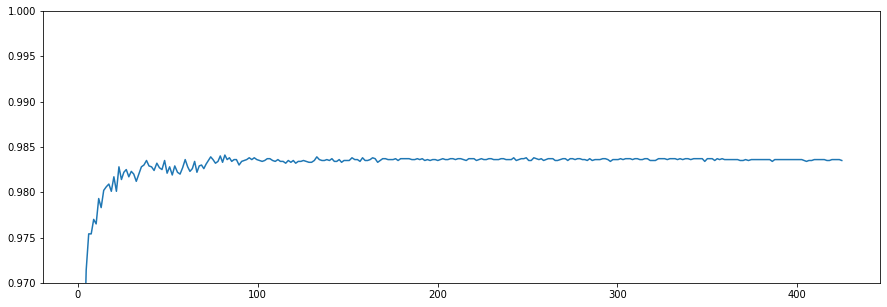

In [0]:
onelayer_300 = MLP([tf.keras.layers.Dense(300, activation = 'relu')], 'rmsprop', 'onelayer_300')
onelayer_300.make_iterations(300)
onelayer_300.show_accuracy(time_based = True);

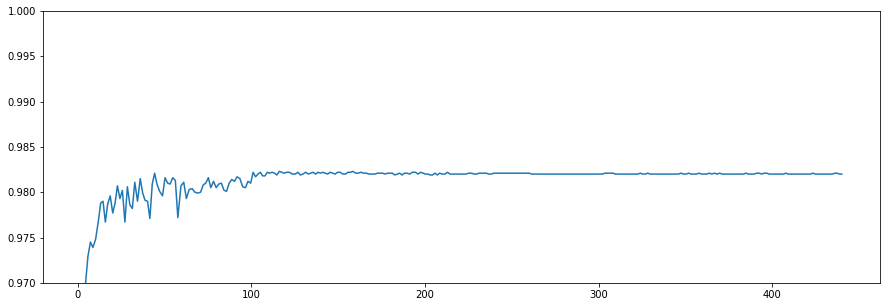

In [0]:
deep_300_20_rmsprop = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(20, activation = 'relu')
], 'rmsprop', 'deep_300_20_rmsprop')
deep_300_20_rmsprop.make_iterations(300).show_accuracy(time_based = True);

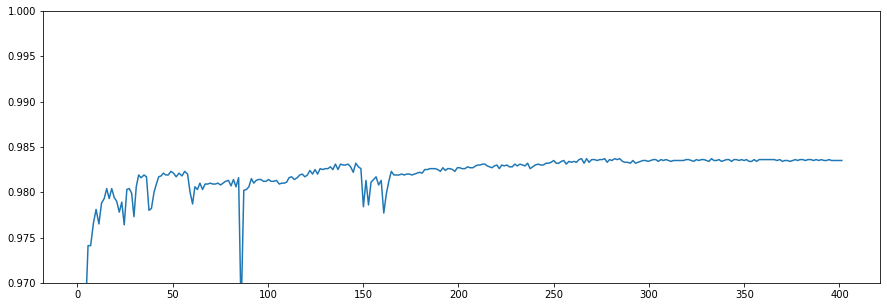

In [0]:
deep_300_20_adam = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(20, activation = 'relu')
], 'adam', 'deep_300_20_adam')
deep_300_20_adam.make_iterations(300).show_accuracy(time_based = True);

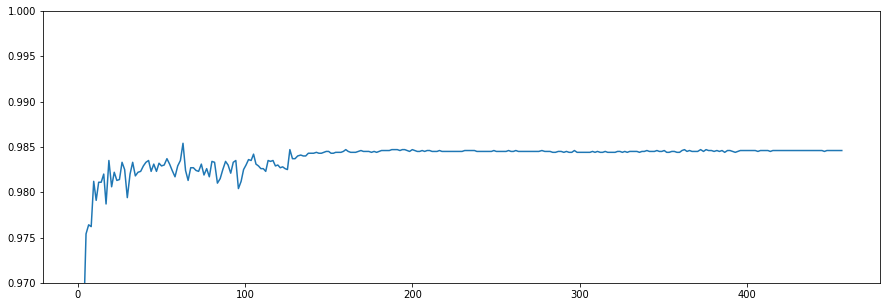

In [0]:
deep_300_100 = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu')
], 'rmsprop', 'deep_300_100')
deep_300_100.make_iterations(300).show_accuracy(time_based = True);

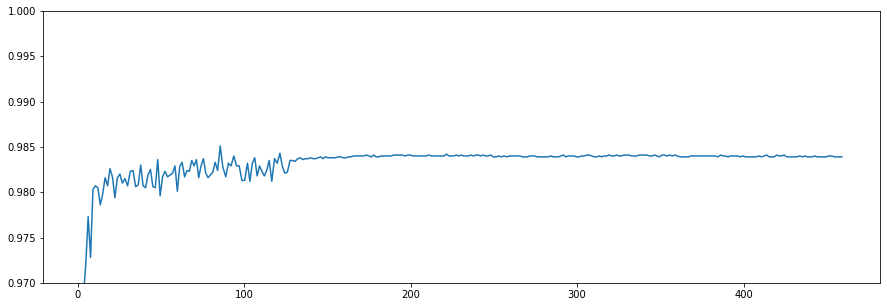

In [0]:
deep_300_100_20 = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu')
], 'rmsprop', 'deep_300_100_20')
deep_300_100_20.make_iterations(300).show_accuracy(time_based = True);

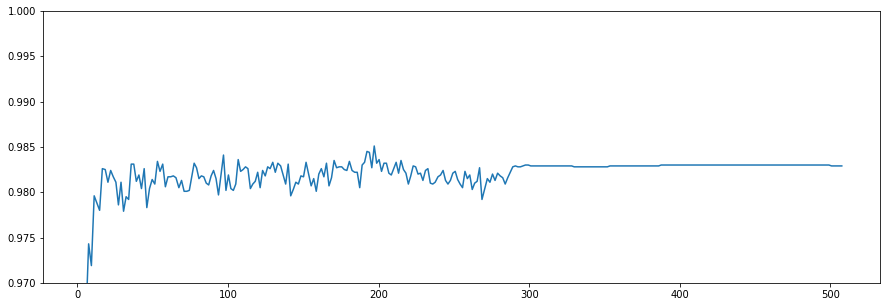

In [0]:
deep_300_200_100 = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu')
], 'rmsprop', 'deep_300_200_100')
deep_300_200_100.make_iterations(300).show_accuracy(time_based = True);

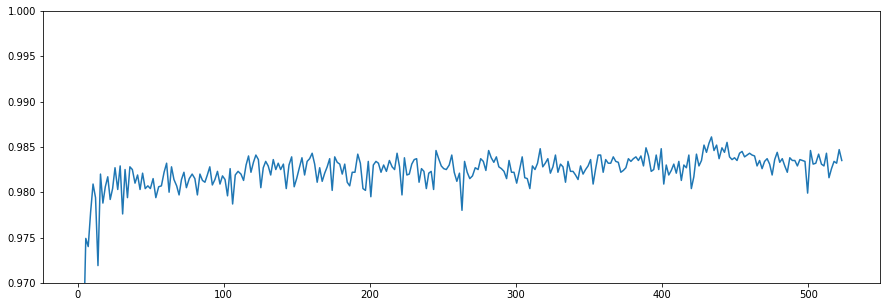

In [0]:
deep_300_200_100_50_rmsprop = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu')
], 'rmsprop', 'deep_300_200_100_50_rmsprop')
deep_300_200_100_50_rmsprop.make_iterations(300).show_accuracy(time_based = True);

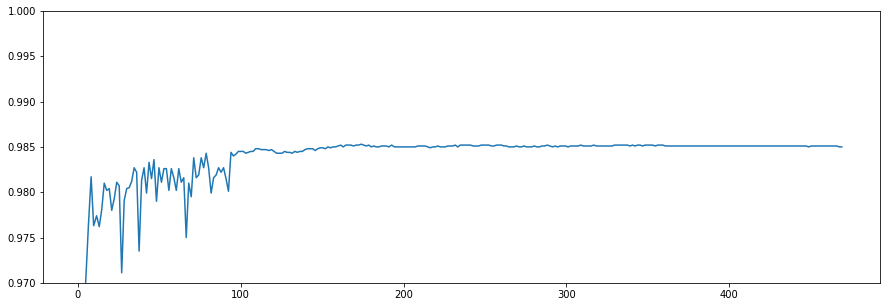

In [0]:
deep_300_200_100_50_adam = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu')
], 'adam', 'deep_300_200_100_50_adam')
deep_300_200_100_50_adam.make_iterations(300).show_accuracy(time_based = True);

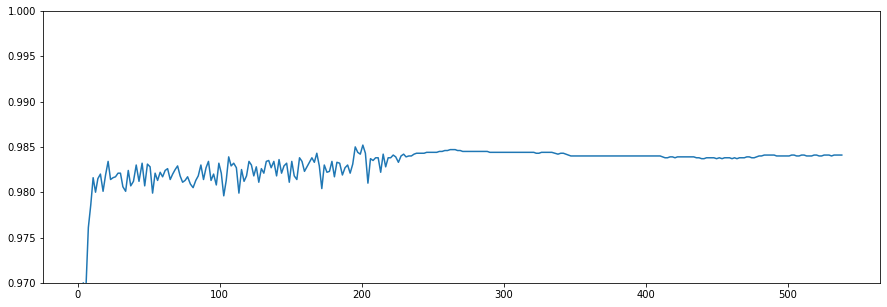

In [0]:
deep_300_200_100_50_relu_tanh_rmsprop = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'tanh'),
    tf.keras.layers.Dense(50, activation = 'tanh')
], 'rmsprop', 'deep_300_200_100_50_relu_tanh_rmsprop')
deep_300_200_100_50_relu_tanh_rmsprop.make_iterations(300).show_accuracy(time_based = True);

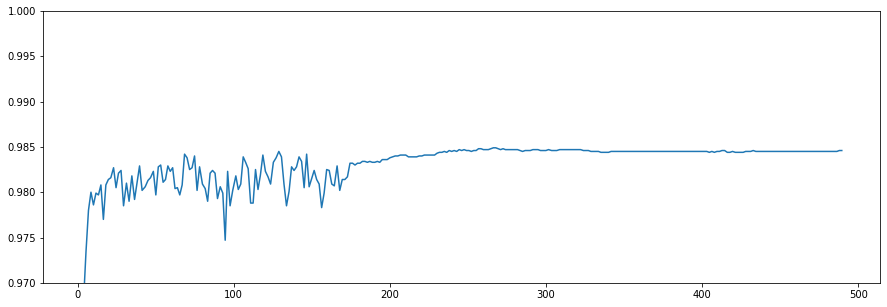

In [0]:
deep_300_200_100_50_relu_tanh_adam = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'tanh'),
    tf.keras.layers.Dense(50, activation = 'tanh')
], 'adam', 'deep_300_200_100_50_relu_tanh_adam')
deep_300_200_100_50_relu_tanh_adam.make_iterations(300).show_accuracy(time_based = True);

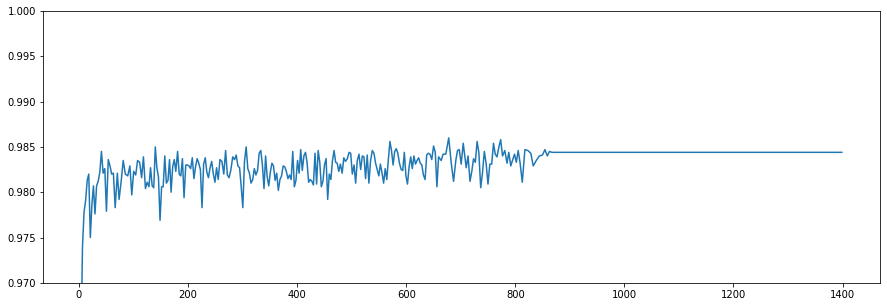

In [0]:
deep_500_300_200_100 = MLP([
    tf.keras.layers.Dense(500, activation = 'relu'),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu')
], 'rmsprop', 'deep_500_300_200_100')
deep_500_300_200_100.make_iterations(400).show_accuracy(time_based = True);

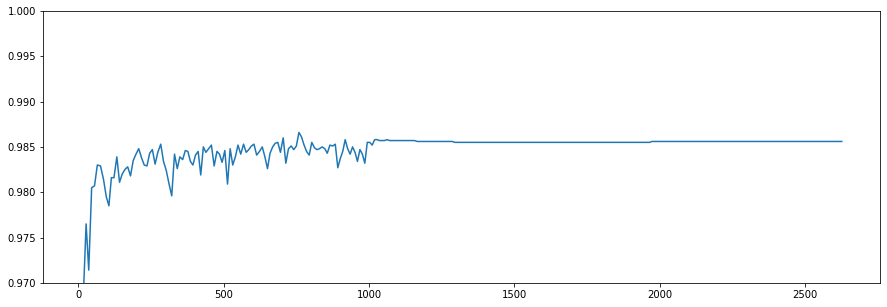

In [0]:
deep_2000_200 = MLP([
    tf.keras.layers.Dense(2000, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
], 'rmsprop', 'deep_2000_200')
deep_2000_200.make_iterations(300).show_accuracy(time_based = True);

Как видно, добавление слоев не является универсальным средством для повышения точности нейросети. Добавление нейронов, напротив, всегда способствует увеличению точности. Судя по тому, что все нейросети сходятся к значению 0.83-0.85, есть какая-то значительная разница между распознаваемыми и нераспознаваемыми примерами из тестового набора.

Вообще говоря, у нас нет задачи найти сочетание модели и оптимизатора, дающее максимальную точность. Наша задача заключается в выборе такого сочетания модели и оптимизатора, которое:
- Дает высокую точность при не слишком большом времени обучении
- Сходится плавно примерно к одной и той же точности
- Отзывчиво к разным методам увеличения точности (обработка входных данных, голосование нейросетей и пр.)

Последний признак непроверяем, но по первым двум можно выбрать нейросеть deep_300_200_100_50_adam. Попробуем обучить ее много раз и сравнить результаты.

In [0]:
total_models = 20
iterations = 200
models = [None] * total_models
for i in range(total_models):
    models[i] = MLP([
        tf.keras.layers.Dense(300, activation = 'relu'),
        tf.keras.layers.Dense(200, activation = 'relu'),
        tf.keras.layers.Dense(100, activation = 'relu'),
        tf.keras.layers.Dense(50, activation = 'relu')
    ], 'adam', 'test model %d' % i)
    models[i].make_iterations(iterations)
    print("\nМодель %d закончила обучение" % i)

test model 0: iteration 200, accuracy 0.9859
Модель 0 закончила обучение
test model 1: iteration 200, accuracy 0.9846
Модель 1 закончила обучение
test model 2: iteration 200, accuracy 0.9844
Модель 2 закончила обучение
test model 3: iteration 200, accuracy 0.9861
Модель 3 закончила обучение
test model 4: iteration 200, accuracy 0.9853
Модель 4 закончила обучение
test model 5: iteration 200, accuracy 0.9844
Модель 5 закончила обучение
test model 6: iteration 200, accuracy 0.9842
Модель 6 закончила обучение
test model 7: iteration 200, accuracy 0.9869
Модель 7 закончила обучение
test model 8: iteration 200, accuracy 0.9859
Модель 8 закончила обучение
test model 9: iteration 200, accuracy 0.9845
Модель 9 закончила обучение
test model 10: iteration 200, accuracy 0.9856
Модель 10 закончила обучение
test model 11: iteration 200, accuracy 0.9859
Модель 11 закончила обучение
test model 12: iteration 200, accuracy 0.9858
Модель 12 закончила обучение
test model 13: iteration 200, accuracy 0.9849

Точность от времени:


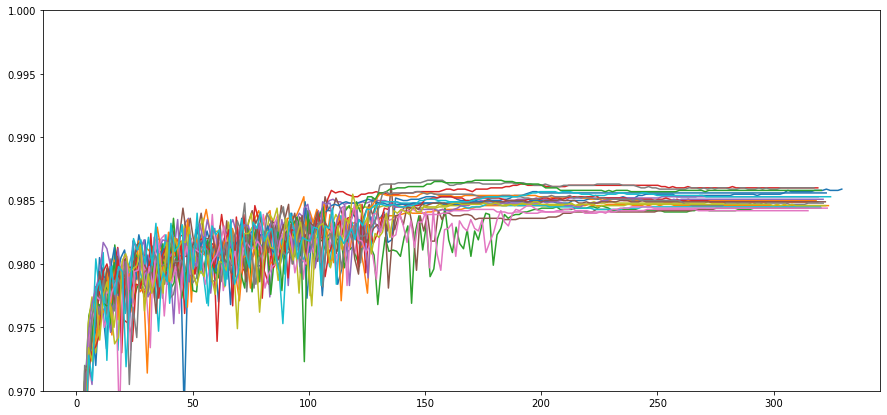

Точность от количества итераций:


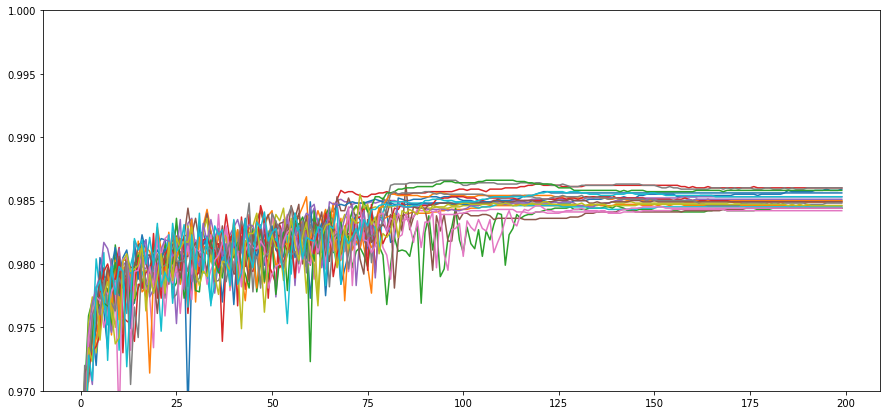

In [0]:
print("Точность от времени:")
plt.figure(figsize = (15, 7))
plt.gca().set_ylim([0.97, 1.0])
for i in range(total_models):
    plt.plot(models[i].times, models[i].accuracy)
plt.show()

print("Точность от количества итераций:")
plt.figure(figsize = (15, 7))
plt.gca().set_ylim([0.97, 1.0])
for i in range(total_models):
    plt.plot(models[i].accuracy)
plt.show()

Вывод - для последующих тестов выбираем следующую модель:
- Размер входных данных: 28*28
- Размер выходных данных: 10
- Слои: полносвязные
- Размеры слоев: 300, 200, 100, 50
- Функция активации: relu
- Функция активации для выходного слоя: sigmoid
- Оптимизатор: adam
- Размер батча: 200

Экспериментальные данные по модели:
- Время сходимости: в среднем 70-100 итераций, иногда до 140 итераций
- Точность после сходимости: 0.984-0.986, редко до 0.987
- Время на текущей конфигурации: около 1.5 секунд на итерацию

### Код для тестов <a class="anchor" id="required_сode"></a>

Данный код является общим для всех последующих разделов:

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time, math, PIL
import mnistlib as mnist
mnist.init()
import gc

#Multilayer perceptron for MNIST recognition
class MLP:
    @staticmethod
    def _layers_to_model(layers_array):
        return tf.keras.models.Sequential(
            [tf.keras.layers.Flatten(input_shape = (28, 28))]
            + layers_array
            + [tf.keras.layers.Dense(10, activation = 'sigmoid')]
        )
    @staticmethod
    def _compile_model(model, optimizer):
        model.compile(
            optimizer = optimizer,
            loss = 'sparse_categorical_crossentropy',
            metrics = ['accuracy']
        )
    def __init__(self, layers_array_or_model, optimizer = 'rmsprop', name = 'unnamed'):
        self.name = name
        self.accuracy = []
        self.times = []
        self.total_time = 0
        self.accuracy_saved = None #used only in delete_neuron_test()
        if type(layers_array_or_model) == list:
            self.model = MLP._layers_to_model(layers_array_or_model)
            MLP._compile_model(self.model, optimizer)
        else:
            self.model = layers_array_or_model
    def make_iterations(self, iterations, batch_size = 200, x = None, y = None, test_x = None, test_y = None, callbacks = None):
        self.accuracy_saved = None
        #if (x is None) or (y is None) or (test_x is None) or (test_y is None):
        #    mnist.init()
        if x is None:
            x = mnist.x_train / 255.0
        if y is None:
            y = mnist.y_train
        if test_x is None:
            test_x = mnist.x_val / 255.0
        if test_y is None:
            test_y = mnist.y_val
        start_time = time.time()
        for i in range(iterations):
            self.model.fit(x, y, epochs = 1, verbose = 0, batch_size = batch_size, callbacks = callbacks)
            prediction = self.model.predict(test_x).argmax(axis = 1)
            acc = accuracy_score(test_y, prediction)
            self.accuracy.append(acc)
            delta_time = time.time() - start_time
            self.times.append(self.total_time + delta_time)
            print("%s: iteration %d, accuracy %g" % (self.name, len(self.accuracy), acc), end = '\r')
        self.total_time = self.total_time + time.time() - start_time
        return self
    def show_accuracy(self, skip_first = 0, time_based = False, y_min = 0.97):
        plt.figure(figsize = (15, 5))
        plt.gca().set_ylim([y_min, 1.0])
        if not time_based:
            plt.plot(range(len(self.accuracy))[skip_first:], self.accuracy[skip_first:])
        else:
            plt.plot(self.times[skip_first:], self.accuracy[skip_first:])
        plt.show()
        return self
    def show_first_layer_neuron(self, neuron, autoscale = False, test_x = None, test_y = None):
        #if (test_x is None) or (test_y is None):
        #    mnist.init()
        if test_x is None:
            test_x = mnist.x_val / 255.0
        if test_y is None:
            test_y = mnist.y_val
        layer_weights = self.model.get_layer(index = 1).get_weights()[0]
        neuron_weights = layer_weights[:, neuron].reshape((28, 28))
        fig, ax = plt.subplots(1, 1)
        acc_before, acc_after = self.delete_neuron_test(1, neuron, test_x, test_y)
        acc_gain = acc_before - acc_after
        fig.suptitle('Нейрон %d (%+.4f%% точности)' % (neuron, acc_gain), fontsize = 14, fontweight = 'bold')
        vmin = -1
        vmax = 1
        if autoscale:
            absmax = max(abs(np.max(neuron_weights)), abs(np.min(neuron_weights)))
            vmax = absmax
            vmin = -absmax
        img = ax.imshow(neuron_weights, cmap = 'PiYG', origin = 'upper', vmin = vmin, vmax = vmax)
        fig.colorbar(img)
        plt.show()
    def delete_neuron_test(self, layer, neuron, test_x = None, test_y = None):
        #if (test_x is None) or (test_y is None):
        #    mnist.init()
        if test_x is None:
            test_x = mnist.x_val / 255.0
        if test_y is None:
            test_y = mnist.y_val
        model_cloned = tf.keras.models.clone_model(self.model)
        model_cloned.set_weights(self.model.get_weights())
        acc_before = self.accuracy_saved or accuracy_score(test_y, model_cloned.predict(test_x).argmax(axis = 1))
        self.accuracy_saved = acc_before
        weights, constants = model_cloned.get_layer(index = layer).get_weights()
        weights[:, neuron] = 0
        constants[neuron] = 0
        model_cloned.get_layer(index = layer).set_weights((weights, constants))
        acc_after = accuracy_score(test_y, model_cloned.predict(test_x).argmax(axis = 1))
        return acc_before, acc_after

#accyracy and times averaging between multiple MLP's for more precise results
class MLP_multiple_averaged:
    def __init__(self, amount, layers_array, optimizer = 'rmsprop', name = 'unnamed'):
        self.optimizer = optimizer
        first_model = MLP._layers_to_model(layers_array)
        models = [first_model]
        for i in range(1, amount):
            models.append(tf.keras.models.clone_model(first_model))
        self.MLPs = []
        for i in range(amount):
            MLP._compile_model(models[i], optimizer)
            self.MLPs.append(MLP(models[i], name = name))
    def add_model(self, amount, batch_size = 200, x = None, y = None, test_x = None, test_y = None, callbacks = None):
        for _ in amount:
            new_model = tf.keras.models.clone_model(self.MLPs.models[0])
            self.MLPs.append(MLP(new_model, name = self.MLPs.models[0].name))
            MLP._compile_model(new_model, self.optimizer)
            new_model.make_iterations(len(self.MLPs.models[0].accuracy), batch_size, x, y, test_x, test_y, callbacks)
    def make_iterations(self, iterations, batch_size = 200, x = None, y = None, test_x = None, test_y = None, callbacks = None):
        for mlp in self.MLPs:
            mlp.make_iterations(iterations, batch_size, x, y, test_x, test_y, callbacks)
        return self
    def show_accuracy(self, skip_first = 0, time_based = False, y_min = 0.97):
        accuracy = np.average(np.array([mlp.accuracy for mlp in self.MLPs]), axis = 0)
        times = np.average(np.array([mlp.times for mlp in self.MLPs]), axis = 0)
        plt.figure(figsize = (15, 5))
        plt.gca().set_ylim([y_min, 1.0])
        if not time_based:
            plt.plot(range(len(accuracy))[skip_first:], accuracy[skip_first:])
        else:
            plt.plot(times[skip_first:], accuracy[skip_first:])
        plt.show()
        return self

### Подбор начальных весов <a class="anchor" id="first_weights"></a>

Прежде всего сравним, как обучаются нейронные сети с разными начальными весами.

In [0]:
from tensorflow.keras.initializers import *
first_layers = [
    ('zeros-relu', tf.keras.layers.Dense(300, activation = 'relu', #0
        kernel_initializer = Zeros())),
    ('ones-relu', tf.keras.layers.Dense(300, activation = 'relu', #1
        kernel_initializer = Ones())),
    ('rndnormal-relu', tf.keras.layers.Dense(300, activation = 'relu', #2
        kernel_initializer = RandomNormal(mean=0.0, stddev=0.05, seed=None))),
    ('trncnormal-relu', tf.keras.layers.Dense(300, activation = 'relu', #3
        kernel_initializer = TruncatedNormal(mean=0.0, stddev=0.05, seed=None))),
    ('rnduniform-relu', tf.keras.layers.Dense(300, activation = 'relu', #4
        kernel_initializer = RandomUniform(minval=-0.05, maxval=0.05, seed=None))),
    ('varcsaling-relu', tf.keras.layers.Dense(300, activation = 'relu', #5
        kernel_initializer = VarianceScaling(scale=1.0, mode='fan_in', distribution='normal', seed=None))),
    ('lecununiform-relu', tf.keras.layers.Dense(300, activation = 'relu', #6
        kernel_initializer = lecun_uniform(seed=None))),
    ('glorotnorm-relu', tf.keras.layers.Dense(300, activation = 'relu', #7
        kernel_initializer = glorot_normal(seed=None))),
    ('glorotuniform-relu', tf.keras.layers.Dense(300, activation = 'relu', #8
        kernel_initializer = glorot_uniform(seed=None))),
    ('henorm-relu', tf.keras.layers.Dense(300, activation = 'relu', #9
        kernel_initializer = he_normal(seed=None))),
    ('lecunnorm-relu', tf.keras.layers.Dense(300, activation = 'relu', #10
        kernel_initializer = lecun_normal(seed=None))),
    ('heuniform-relu', tf.keras.layers.Dense(300, activation = 'relu', #11
        kernel_initializer = he_uniform(seed=None))),
    #############
    ('zeros-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #12
        kernel_initializer = Zeros())),
    ('ones-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #13
        kernel_initializer = Ones())),
    ('rndnormal-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #14
        kernel_initializer = RandomNormal(mean=0.0, stddev=0.05, seed=None))),
    ('trncnormal-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #15
        kernel_initializer = TruncatedNormal(mean=0.0, stddev=0.05, seed=None))),
    ('rnduniform-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #16
        kernel_initializer = RandomUniform(minval=-0.05, maxval=0.05, seed=None))),
    ('varcsaling-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #17
        kernel_initializer = VarianceScaling(scale=1.0, mode='fan_in', distribution='normal', seed=None))),
    ('lecununiform-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #18
        kernel_initializer = lecun_uniform(seed=None))),
    ('glorotnorm-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #19
        kernel_initializer = glorot_normal(seed=None))),
    ('glorotuniform-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #20
        kernel_initializer = glorot_uniform(seed=None))),
    ('henorm-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #21
        kernel_initializer = he_normal(seed=None))),
    ('lecunnorm-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #22
        kernel_initializer = lecun_normal(seed=None))),
    ('heuniform-tanh', tf.keras.layers.Dense(300, activation = 'tanh', #23
        kernel_initializer = he_uniform(seed=None))),
]
experiments = 3
models = []
for name, layer in first_layers:
    models.append(MLP_multiple_averaged(experiments, [layer] + [
        tf.keras.layers.Dense(200, activation = 'relu'),
        tf.keras.layers.Dense(100, activation = 'relu'),
        tf.keras.layers.Dense(50, activation = 'relu')
    ], 'adam', name))
for model in models:
    model.make_iterations(50)

In [0]:
def show_models(indices, ymin = 0, ymax = 1, show = None, height = 5):
    plt.figure(figsize = (15, height))
    plt.gca().set_ylim([ymin, ymax])
    for i in indices:
        model = models[i]
        if show is None:
            accuracy = np.average(np.array([mlp.accuracy for mlp in model.MLPs]), axis = 0)
            times = np.average(np.array([mlp.times for mlp in model.MLPs]), axis = 0)
            plt.plot(accuracy, label = model.MLPs[0].name)
        else:
            plt.plot(model.MLPs[show].accuracy, label = model.MLPs[show].name)
    plt.legend(bbox_to_anchor = (1.05, 1), loc = 'upper left', borderaxespad = 0)
    plt.show()

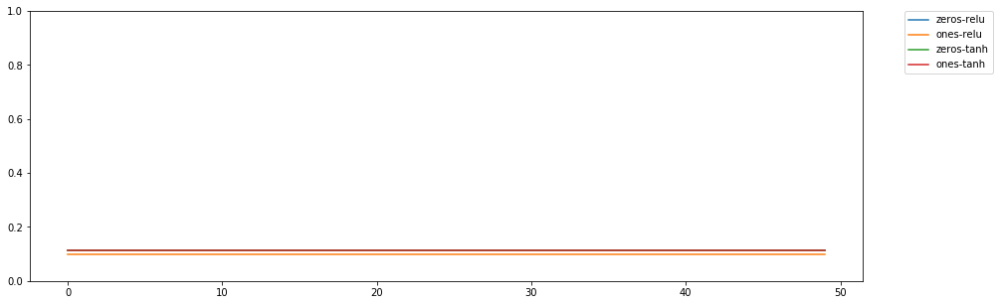

In [0]:
show_models([0, 1, 12, 13], ymin = 0, ymax = 1)

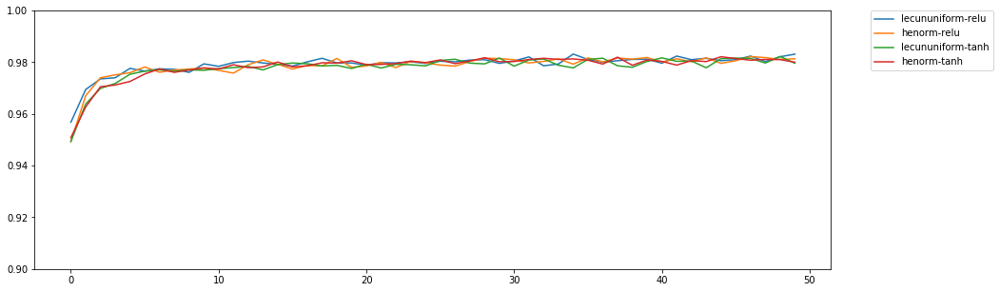

In [0]:
show_models([6, 9, 18, 21], ymin = 0.9, ymax = 1)

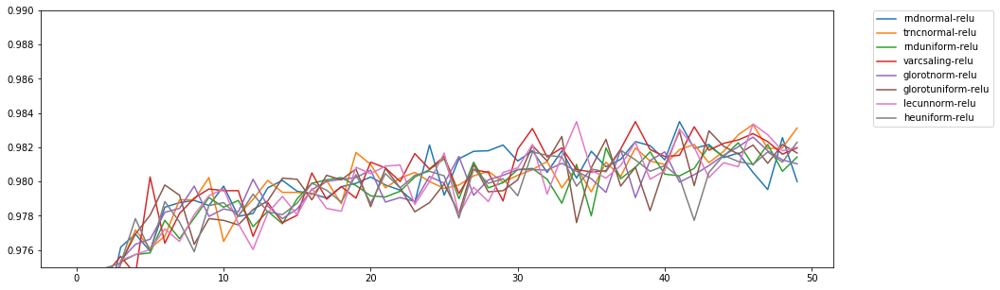

In [0]:
show_models([2, 3, 4, 5, 7, 8, 10, 11], ymin = 0.975, ymax = 0.99)

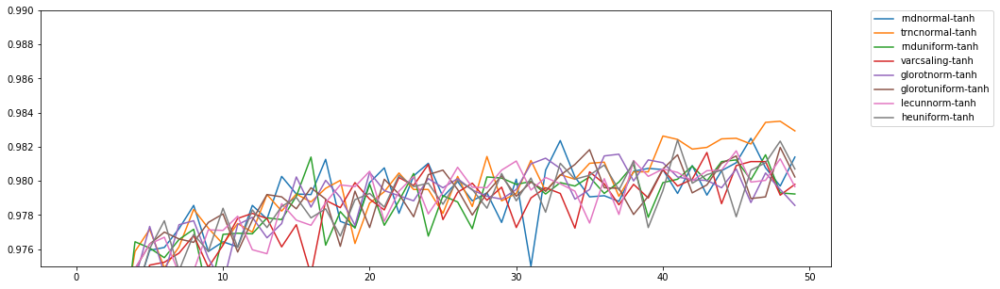

In [0]:
show_models([14, 15, 16, 17, 19, 20, 22, 23], ymin = 0.975, ymax = 0.99)

Как видим, инициализаторы первого слоя, из рассмотренных, либо не работают совсем, либо дают примерно одинаковый результат.

Целью данного эксперимента было не определить наилучший инициализатор, для чего требуется во-первых знания об алгоритмах и применимости каждого инициализатора, а во-вторых больше экспериментов. Целью в нашем случае являлось формирование общей картины о влиянии инциализаторов первого слоя на процесс обучения.

Теперь поставим еще один эксперимент, в котором попробуем вручную задавать матрицы весов первого слоя нейронов перед обучением. Как мы помним, нейроны первого слоя в основном обучаются так, чтобы уметь отличать разные цифры. Попробуем создать такие матрицы вручную.

Усредненные по обучающему набору изображения цифр:


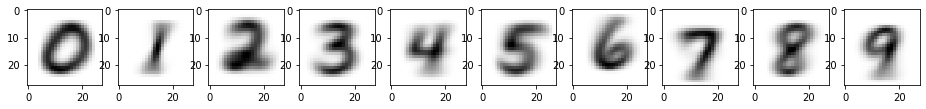

Разности между усредненными изображениями разных цифр (всего 45):


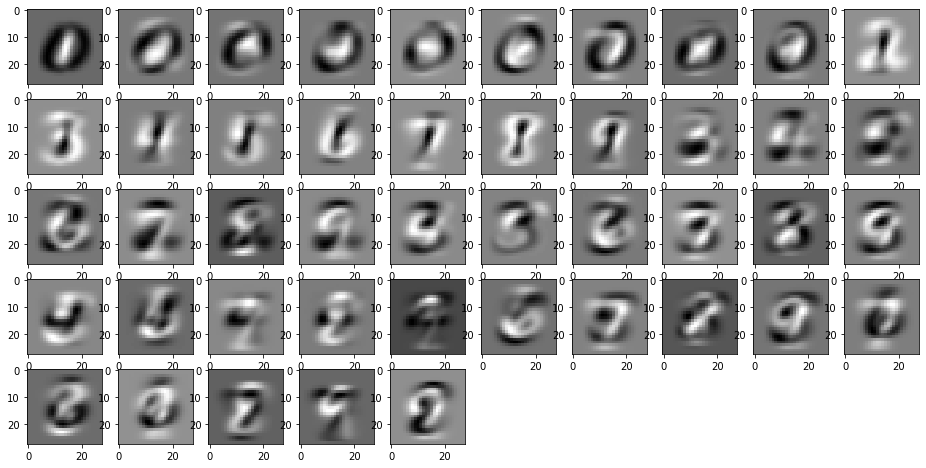

In [0]:
import mnistlib as mnist
mnist.init()

avgs = []
for number in range(10):
    indices = np.where(mnist.y_train == number)
    imgs = mnist.x_train[indices]
    avg = np.average(imgs, axis = 0)
    avgs.append(avg)

avg_deltas = []
for number1 in range(10):
    for number2 in range(number1 + 1, 10):
        delta = avgs[number1] - avgs[number2]
        avg_deltas.append(delta)

print("Усредненные по обучающему набору изображения цифр:")
mnist.draw(*avgs, columns = 10)

print("Разности между усредненными изображениями разных цифр (всего 45):")
mnist.draw(*avg_deltas, columns = 10)

Полученные изображения действительно напоминают матрицы весов нейронов после обучения.

Задача нейронов первого слоя - давать разный выход на разных цифрах. Инициализируем весами avgs, то есть усредненными изображениями цифр, первый слой нейронов. Попробуем использовать разные диапазоны весов.

In [0]:
def test(min, max):
    model = MLP([
        tf.keras.layers.Dense(300, activation = 'relu'),
        tf.keras.layers.Dense(200, activation = 'relu'),
        tf.keras.layers.Dense(100, activation = 'relu'),
        tf.keras.layers.Dense(50, activation = 'relu')
    ], 'adam', 'test model')
    weights, constants = model.model.get_layer(index = 1).get_weights()
    for neuron in range(300):
        weights[:, neuron] = avgs[neuron % 10].reshape(-1) / 255.0 * (max - min) + min
    model.model.get_layer(index = 1).set_weights((weights, constants))
    print("(%g, %g)" % (min, max))
    model.make_iterations(10)
    print("")

X = [0.5, 0.2, 0.1,
     0.05, 0.02, 0.01,
     0.005, 0.002, 0.001,
     0.0005, 0.0002, 0.0001,
     0.00005, 0.00002, 0.00001,
     0.000005, 0.000002, 0.000001]
for x in X:
    test(0, x)
for x in X:
    test(-x, 0)
for x in X:
    test(-x/2, x/2)

(0, 0.5)
test model: iteration 10, accuracy 0.956
(0, 0.2)
test model: iteration 10, accuracy 0.9711
(0, 0.1)
test model: iteration 10, accuracy 0.9725
(0, 0.05)
test model: iteration 10, accuracy 0.9728
(0, 0.02)
test model: iteration 10, accuracy 0.9816
(0, 0.01)
test model: iteration 10, accuracy 0.9766
(0, 0.005)
test model: iteration 10, accuracy 0.9766
(0, 0.002)
test model: iteration 10, accuracy 0.9773
(0, 0.001)
test model: iteration 10, accuracy 0.9726
(0, 0.0005)
test model: iteration 10, accuracy 0.9789
(0, 0.0002)
test model: iteration 10, accuracy 0.9752
(0, 0.0001)
test model: iteration 10, accuracy 0.9805
(0, 5e-05)
test model: iteration 10, accuracy 0.9808
(0, 2e-05)
test model: iteration 10, accuracy 0.9762
(0, 1e-05)
test model: iteration 10, accuracy 0.9768
(0, 5e-06)
test model: iteration 10, accuracy 0.9743
(0, 2e-06)
test model: iteration 10, accuracy 0.9799
(0, 1e-06)
test model: iteration 10, accuracy 0.9792
(-0.5, 0)
test model: iteration 10, accuracy 0.1135
(

Надо заметить, что данное "ручное" вмешательство не пошло нейросети на пользу. Нейросеть сходится не быстрее (часто медленнее), чем будь она инициализирована случайными весами. По-видимому, изменением начальных весов легко все испортить, но сложно что-либо улучшить.

Проверим прежде всего, можно ли распознавать цифры без применения нейросети, используя только усредненные разности между цифрами, сгенерированные на обучающем наборе.

In [0]:
number_of_images = 10000
predictions = []
#products_avg = [0] * 10
normalization = [2706716, 1567121, 2502620, 2497128, 2191877, 2253118, 2424119, 2090511, 2774710, 2357616]
print("Примеры цифр:")
for i, img in enumerate(mnist.x_val[:number_of_images]):
    votes = [np.sum(avgs[i] * img) - normalization[i] for i in range(10)]
    result = np.argmax(votes)
    predictions.append(result)
    #for j in range(10):
    #    products_avg[j] += votes[j]
    if i % int(number_of_images / 20) == 0:
        answer = "true " if mnist.y_val[i] == result else "false"
        print(mnist.y_val[i], " : ", answer, " : ", np.array2string(np.array(votes) / 10000, precision = 0))
print("Общая точность:", accuracy_score(mnist.y_val[:number_of_images], predictions))
#print(np.array2string(np.array(products_avg) / number_of_images, precision = 0))

Примеры цифр:
7  :  true   :  [ -91.  -72.  -96.  -88.  -56.  -82. -109.   37.  -99.  -37.]
3  :  true   :  [ 59.  56.  53. 186.   9.  85.  36.  44.  69.  28.]
9  :  false  :  [-91.  31. -33.  -1.  -4. -20. -42.  50. -14.  25.]
7  :  false  :  [-182.    5. -113.  -93. -123. -111. -130. -114. -116. -120.]
6  :  true   :  [-122.  -52.  -69.  -95.  -58.  -78.   -9.  -91.  -82.  -70.]
2  :  false  :  [-180.  -26.  -88. -109. -115. -125. -103. -109. -121. -119.]
6  :  true   :  [-79. -33. -39. -33. -43. -31.  14. -85. -42. -57.]
4  :  true   :  [-46. -57.   9. -45.  78. -48. -10.  -2. -38.  20.]
9  :  false  :  [-80. -63. -12. -15.  20. -46. -29. -42. -64.  -8.]
9  :  false  :  [-158.  -36. -133.  -93. -114.  -95. -123.  -86. -116.  -95.]
3  :  true   :  [-44. -36. -68.  21. -53.  -9. -64. -73. -56. -61.]
4  :  true   :  [  4.  19.  28. -12. 100.   4.  31.  35.  32.  52.]
9  :  true   :  [-78. -33. -65. -32.  33. -18. -30.  23. -34.  41.]
5  :  true   :  [ 14.  -6. -43. -18.  12.  37. -29. 

Простое сравнение (точнее скалярное произведение) цифр с шаблонами позволяет угадать цифру с точностью 75%. Попробуем вручную сконструировать нейронную сеть на основе данного алгоритма.

In [0]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)),
    tf.keras.layers.Dense(10, activation = 'linear'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
])
#Слой 1
weights, constants = model.get_layer(index = 1).get_weights()
for neuron in range(10):
    weights[:, neuron] = avgs[neuron].reshape(-1)
    constants[neuron] = -normalization[neuron] + 2000000
model.get_layer(index = 1).set_weights((weights, constants))
#Слой 2 (выходной)
weights, constants = model.get_layer(index = 2).get_weights()
for neuron in range(10):
    for i in range(10):
        weights[i, neuron] = 1 / 1000000 if i == neuron else 0
        constants[neuron] = 0
model.get_layer(index = 2).set_weights((weights, constants))
prediction = model.predict(mnist.x_val).argmax(axis = 1)
print("Точность:", accuracy_score(mnist.y_val, prediction))

Точность: 0.7539


Эта нейросеть работает аналогично алгоритму, запрограммированному выше. Прежде, чем пытаться ее обучать, требуется, не потеряв точности, сделать следующее:

- Задать нелинейную функцию активации
- Увеличить количество нейронов (можно позже)
- Нормализовать веса

In [0]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)),
    tf.keras.layers.Dense(10, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
])
#Слой 1
weights, constants = model.get_layer(index = 1).get_weights()
for neuron in range(10):
    weights[:, neuron] = avgs[neuron].reshape(-1) / 255.0 / 10.0
    constants[neuron] = (-normalization[neuron] + 2000000) / 255.0 / 255.0 / 10.0
model.get_layer(index = 1).set_weights((weights, constants))
#Слой 2 (выходной)
weights, constants = model.get_layer(index = 2).get_weights()
for neuron in range(10):
    for i in range(10):
        weights[i, neuron] = 1 / 1000000 * 255.0 * 255.0 * 10.0 if i == neuron else 0
        constants[neuron] = 0
model.get_layer(index = 2).set_weights((weights, constants))

def test_predict():
    prediction = model.predict(mnist.x_val / 255.0).argmax(axis = 1)
    print("Точность:", accuracy_score(mnist.y_val, prediction))

model.compile(
    optimizer = 'adam',
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

test_predict()
for epoch in range(5):
    model.fit(mnist.x_train / 255.0, mnist.y_train, epochs = 1, batch_size = 200)
    test_predict()

Точность: 0.7539
Train on 60000 samples
60000/60000 [==============================] - 1s 14us/sample - loss: 1.0002 - accuracy: 0.8408
Точность: 0.9028
Train on 60000 samples
60000/60000 [==============================] - 1s 10us/sample - loss: 0.3523 - accuracy: 0.9046
Точность: 0.9136
Train on 60000 samples
60000/60000 [==============================] - 1s 9us/sample - loss: 0.3119 - accuracy: 0.9141
Точность: 0.9198
Train on 60000 samples
60000/60000 [==============================] - 1s 9us/sample - loss: 0.2936 - accuracy: 0.9187
Точность: 0.9233
Train on 60000 samples
60000/60000 [==============================] - 1s 10us/sample - loss: 0.2830 - accuracy: 0.9213
Точность: 0.9229


Смена функции активации с линейной на relu ни на что не повлияла, потому что выходы нейронов первого слоя всегда положительны. Однако пока веса и константы оставались большими, сеть при обучении теряла точность до 10% (то есть до уровня случайного выбора). После того, как все веса были приведены в диапазон [0, 1], алгоритмы обучения sgd и adam "заработали", то есть стали увеличивать точность нейросети.

Заметим, что мы пока лишь проверяем обучаемость нейросети, а сравнивать точность при инициализации случайными или неслучайными весами будем позже. Рассмотренная нейросеть имеет всего один скрытый слой. Теперь увеличим количество нейронов, продублировав одинаковые веса несколько раз.

In [0]:
multiplier = 30
weights_normalizer = 0.01

model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)),
    tf.keras.layers.Dense(10 * multiplier, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
])
#Слой 1
weights, constants = model.get_layer(index = 1).get_weights()
for neuron in range(10 * multiplier):
    weights[:, neuron] = avgs[neuron % 10].reshape(-1) / 255.0 * weights_normalizer
    constants[neuron] = (-normalization[neuron % 10] + 2000000) / 255.0 / 255.0 * weights_normalizer
model.get_layer(index = 1).set_weights((weights, constants))
#Слой 2 (выходной)
weights, constants = model.get_layer(index = 2).get_weights()
for neuron in range(10):
    for i in range(300):
        weights[i, neuron] = 1 / 1000000 * 255.0 * 255.0 / weights_normalizer / multiplier if (i % 10) == neuron else 0
        constants[neuron] = 0
model.get_layer(index = 2).set_weights((weights, constants))

model.compile(
    optimizer = 'adam',
    loss = 'sparse_categorical_crossentropy',
    metrics = ['accuracy']
)

test_predict()
for epoch in range(5):
    model.fit(mnist.x_train / 255.0, mnist.y_train, epochs = 1, batch_size = 200)
    test_predict()

Точность: 0.7539
Train on 60000 samples
60000/60000 [==============================] - 1s 22us/sample - loss: 0.5247 - accuracy: 0.8788
Точность: 0.9235
Train on 60000 samples
60000/60000 [==============================] - 1s 18us/sample - loss: 0.2823 - accuracy: 0.9202
Точность: 0.9235
Train on 60000 samples
60000/60000 [==============================] - 1s 19us/sample - loss: 0.2599 - accuracy: 0.9278
Точность: 0.9296
Train on 60000 samples
60000/60000 [==============================] - 1s 18us/sample - loss: 0.2485 - accuracy: 0.9301
Точность: 0.9307
Train on 60000 samples
60000/60000 [==============================] - 1s 18us/sample - loss: 0.2360 - accuracy: 0.9331
Точность: 0.9344


Теперь сравним инициализацию случайными и неслучайными весами.

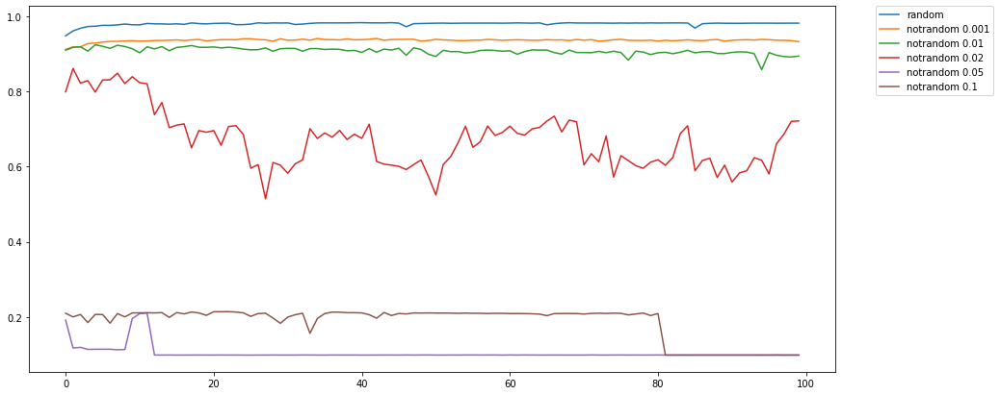

In [0]:
multiplier = 30

model_random = MLP([tf.keras.layers.Dense(10 * multiplier, activation = 'relu')], 'adam', 'random')
model_notrandom_1 = MLP(
    [tf.keras.layers.Dense(10 * multiplier, activation = 'relu')],
    tf.keras.optimizers.Adam(learning_rate = 0.001), #default learning rate
    'notrandom 0.001'
)
model_notrandom_2 = MLP(
    [tf.keras.layers.Dense(10 * multiplier, activation = 'relu')],
    tf.keras.optimizers.Adam(learning_rate = 0.01),
    'notrandom 0.01'
)
model_notrandom_3 = MLP(
    [tf.keras.layers.Dense(10 * multiplier, activation = 'relu')],
    tf.keras.optimizers.Adam(learning_rate = 0.02),
    'notrandom 0.02'
)
model_notrandom_4 = MLP(
    [tf.keras.layers.Dense(10 * multiplier, activation = 'relu')],
    tf.keras.optimizers.Adam(learning_rate = 0.05),
    'notrandom 0.05'
)
model_notrandom_5 = MLP(
    [tf.keras.layers.Dense(10 * multiplier, activation = 'relu')],
    tf.keras.optimizers.Adam(learning_rate = 0.1),
    'notrandom 0.1'
)

# ----- инициализация весов --------
for m in [model_notrandom_1, model_notrandom_2, model_notrandom_3, model_notrandom_4, model_notrandom_5]:
    model = m.model
    #Слой 1
    weights, constants = model.get_layer(index = 1).get_weights()
    for neuron in range(10 * multiplier):
        weights[:, neuron] = avgs[neuron % 10].reshape(-1) / 255.0 / 10.0
        constants[neuron] = (-normalization[neuron % 10] + 2000000) / 255.0 / 255.0 / 10.0
    model.get_layer(index = 1).set_weights((weights, constants))
    #Слой 2 (выходной)
    weights, constants = model.get_layer(index = 2).get_weights()
    for neuron in range(10):
        for i in range(300):
            weights[i, neuron] = 1 / 1000000 * 255.0 * 255.0 * 10.0 / multiplier if (i % 10) == neuron else 0
            constants[neuron] = 0
    model.get_layer(index = 2).set_weights((weights, constants))
# -----------------------------------

iterations = 100
model_random.make_iterations(iterations)
model_notrandom_1.make_iterations(iterations)
model_notrandom_2.make_iterations(iterations)
model_notrandom_3.make_iterations(iterations)
model_notrandom_4.make_iterations(iterations)
model_notrandom_5.make_iterations(iterations)

plt.figure(figsize = (15, 7))
plt.plot(model_random.accuracy, label = model_random.name)
plt.plot(model_notrandom_1.accuracy, label = model_notrandom_1.name)
plt.plot(model_notrandom_2.accuracy, label = model_notrandom_2.name)
plt.plot(model_notrandom_3.accuracy, label = model_notrandom_3.name)
plt.plot(model_notrandom_4.accuracy, label = model_notrandom_4.name)
plt.plot(model_notrandom_5.accuracy, label = model_notrandom_5.name)
plt.legend(bbox_to_anchor = (1.05, 1), loc = 'upper left', borderaxespad = 0)
plt.show()

Не будем больше "мучать" модель, тем более что впереди есть еще много других задач. Попытка инициализации весов изображениями цифр в целом провалилась: оптимизатор находит локальный минимум, далекий от оптимального. Объяснение этого явления пока что выходит за рамки нашей задачи.

### Размытие матрицы весов <a class="anchor" id="blur_weights"></a>

Можно предположить, что регулярное размытие матрицы весов первого слоя может положительно влиять на способность нейросети выявлять закономерности и определять цифры. Уровень размытия обозначим как sigma. Можно проверить несколько способов размытия матрицы весов:

- Размытие с постоянной sigma между эпохами, начиная с первой
- Размытие с постоянной sigma между эпохами, начиная с N-ной
- Размытие с уменьшающейся sigma между эпохами, начиная с первой
- Размытие с уменьшающейся sigma между эпохами, начиная с N-ной
- Те же варианты размытия, но между батчами

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки (после выполнения кода в разделе "Код для тестов")

from scipy.ndimage.filters import gaussian_filter
from tensorflow.keras.layers import Dense
import random

def blur_weights_model(model, sigma = 1, forgivence = 0, chance = 1.0):
    weights, constants = model.get_layer(index = 1).get_weights()
    weights = weights.reshape((28, 28, -1))
    neuron_count = weights.shape[2]
    for i in range(neuron_count):
        matrix = weights[:, :, i]
        if random.random() < chance and (forgivence == 0 or np.max(matrix) - np.min(matrix) > forgivence):
            matrix = gaussian_filter(matrix, sigma = sigma)
        weights[:, :, i] = matrix
    weights = weights.reshape((28*28, -1))
    model.get_layer(index = 1).set_weights((weights, constants))

def blur_weights_mlp(mlp, sigma = 1):
    blur_weights_model(mlp.model, sigma)

def blur_weights(model_averaged, sigma = 1):
    for mlp in model_averaged.MLPs:
        blur_weights_model(mlp.model, sigma)

Сначала посмотрим, как изменяются матрицы весов с каждой следующей эпохой. Мы будем анализировать разные нейросети с размытием между эпохами или без него. В массиве изображений строка - номер нейрона, столбец - номер эпохи из списка 0, 1, 2, 3, 4, 10, 20, 30, 40, 50.

Сначала исследуем сети без размытия, затем начнем применять размытие между эпохами. Целью исследования является понять, при каком уровне размытия веса начинают меняться принципиально, то есть сеть вместо простого уточнения матрицы весов просто "выбивается" из локального оптимума и начинает искать другой локальный оптимум, и так каждую или почти каждую итерацию.

unnamed: iteration 51, accuracy 0.9344
Cеть из 10 нейронов


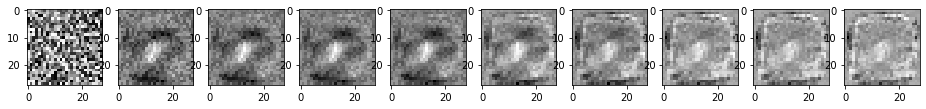

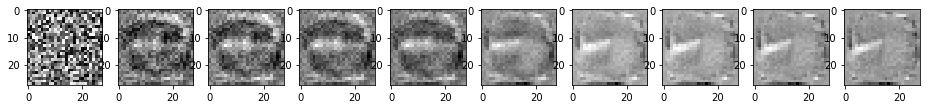

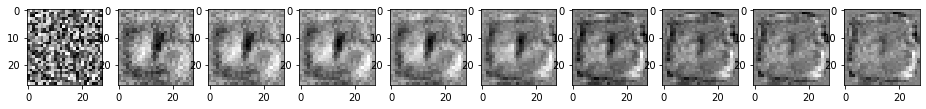

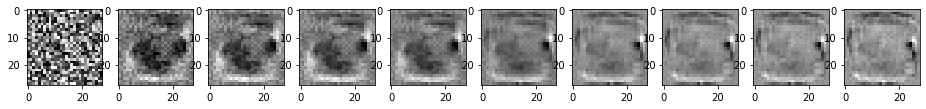

In [0]:
def get_weights(model, neuron):
    layer_weights = model.get_layer(index = 1).get_weights()[0]
    return layer_weights[:, neuron].reshape((28, 28))

def dump_neurons(model, neurons, neurons_count):
    for neuron in range(neurons_count):
        neurons[neuron].append(get_weights(model.model, neuron))

def show_neurons(neurons):
    for neuron_data in neurons:
        mnist.draw(*neuron_data, columns = len(neuron_data))

epochs = [0, 1, 2, 3, 4, 10, 20, 30, 40, 50]
neurons_count = 4

# ---- первый тест ----
model = MLP([Dense(10, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    model.make_iterations(1)
print('\nCеть из 10 нейронов')
show_neurons(neurons)

unnamed: iteration 51, accuracy 0.9832
Cеть из 300 нейронов


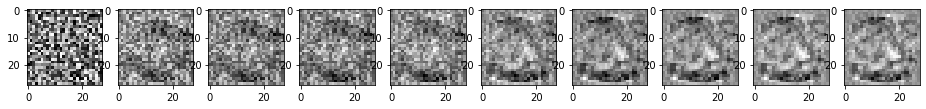

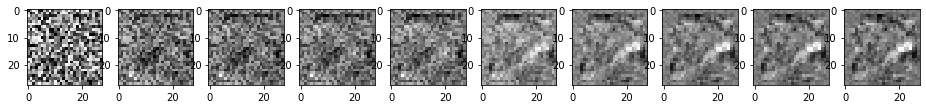

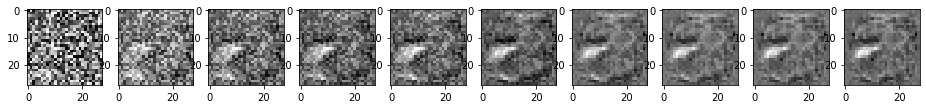

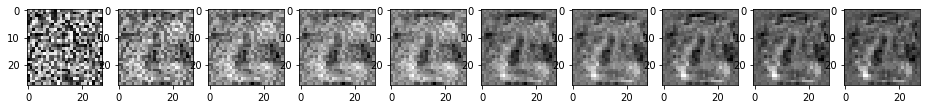

In [0]:
model = MLP([Dense(300, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    model.make_iterations(1)
print('\nCеть из 300 нейронов')
show_neurons(neurons)

На этом этапе можно заметить, что в нейросети с 10 нейронами матрицы весов получаются с меньшими шумами, чем в нейросети с 300 нейронами. Таким образом, имеет смысл попробовать раздельное обучение небольших нейронных сетей, а затем их сложение по какому-либо алгоритму. Хотя возможно, что сети с 300 нейронами просто требуется больше эпох, чтобы убрать шумы.

unnamed: iteration 51, accuracy 0.9772
Многослойная сеть


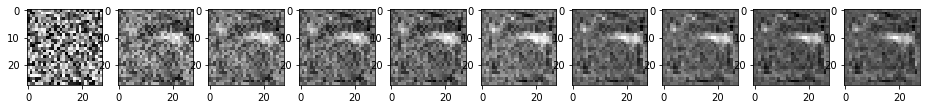

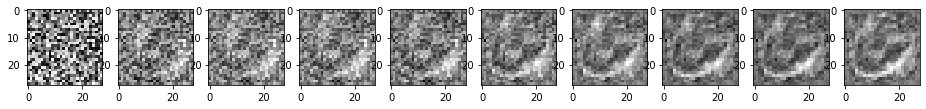

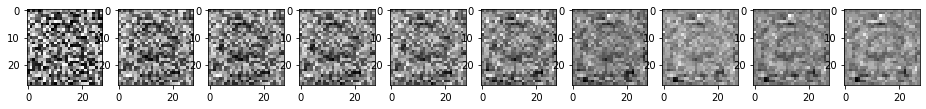

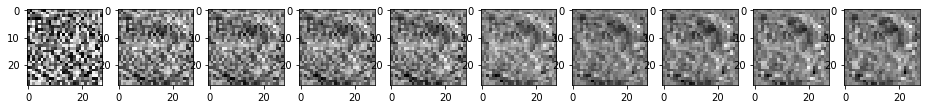

In [0]:
model = MLP([
    Dense(300, activation = 'relu'),
    Dense(200, activation = 'relu'),
    Dense(100, activation = 'relu'),
    Dense(50, activation = 'relu')
], 'adam')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    model.make_iterations(1)
print('\nМногослойная сеть')
show_neurons(neurons)

unnamed: iteration 51, accuracy 0.9832
Cеть из 300 нейронов, размытие 0.35 между эпохами


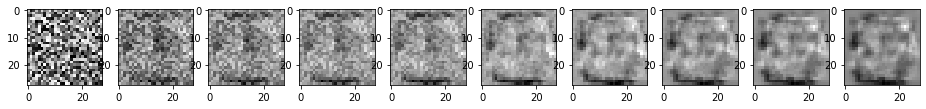

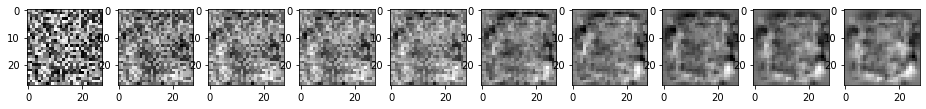

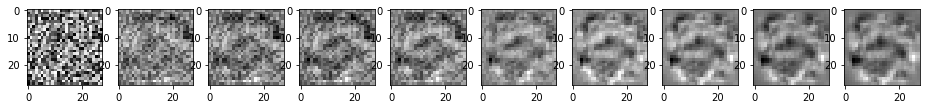

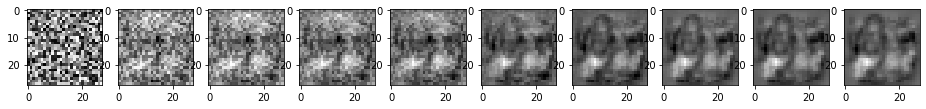

In [0]:
model = MLP([Dense(300, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    blur_weights_mlp(model, sigma = 0.35)
    model.make_iterations(1)
print('\nCеть из 300 нейронов, размытие 0.35 между эпохами')
show_neurons(neurons)

unnamed: iteration 51, accuracy 0.9835
Cеть из 300 нейронов, размытие 0.4 между эпохами


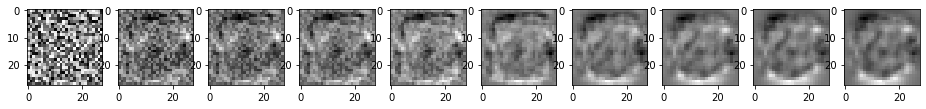

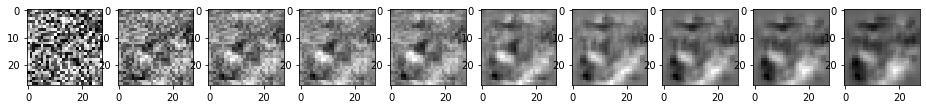

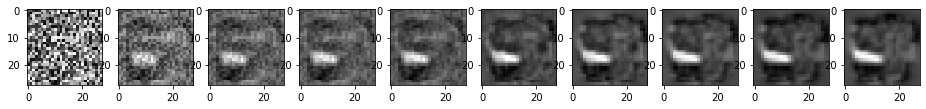

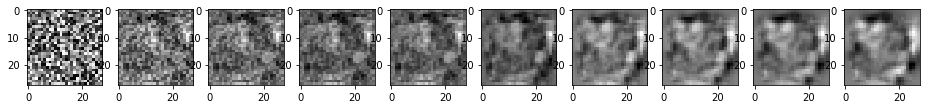

In [0]:
model = MLP([Dense(300, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    blur_weights_mlp(model, sigma = 0.4)
    model.make_iterations(1)
print('\nCеть из 300 нейронов, размытие 0.4 между эпохами')
show_neurons(neurons)

unnamed: iteration 51, accuracy 0.9833
Cеть из 300 нейронов, размытие 0.5 между эпохами


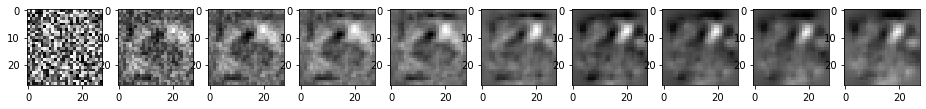

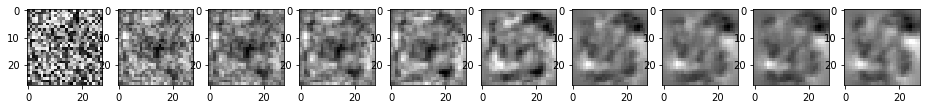

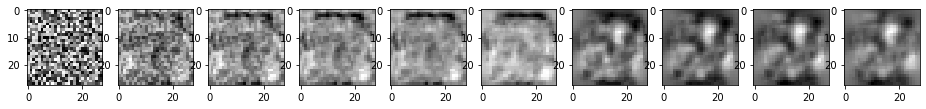

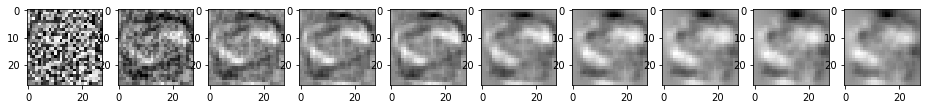

In [0]:
model = MLP([Dense(300, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    blur_weights_mlp(model, sigma = 0.5)
    model.make_iterations(1)
print('\nCеть из 300 нейронов, размытие 0.5 между эпохами')
show_neurons(neurons)

unnamed: iteration 51, accuracy 0.9753
Cеть из 300 нейронов, размытие 0.8 между эпохами


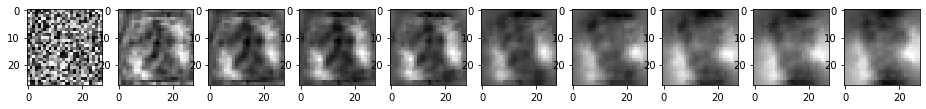

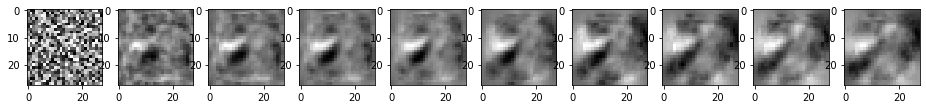

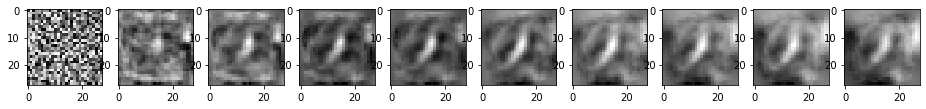

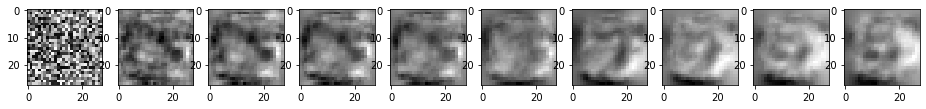

In [0]:
model = MLP([Dense(300, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    blur_weights_mlp(model, sigma = 0.8)
    model.make_iterations(1)
print('\nCеть из 300 нейронов, размытие 0.8 между эпохами')
show_neurons(neurons)

unnamed: iteration 51, accuracy 0.9722
Cеть из 300 нейронов, размытие 1.5 между эпохами


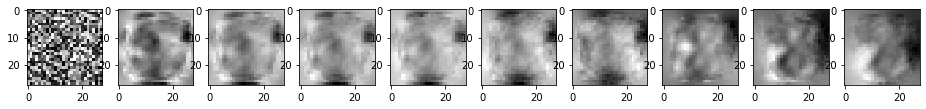

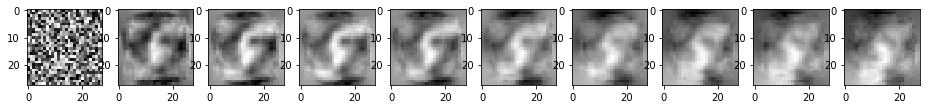

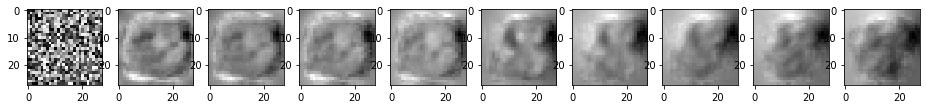

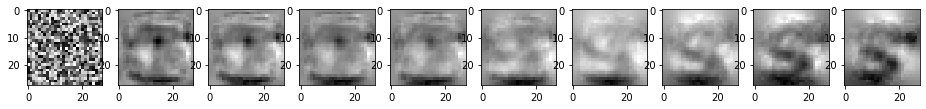

In [0]:
model = MLP([Dense(300, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    blur_weights_mlp(model, sigma = 1.5)
    model.make_iterations(1)
print('\nCеть из 300 нейронов, размытие 1.5 между эпохами')
show_neurons(neurons)

unnamed: iteration 51, accuracy 0.9839
Cеть из 300 нейронов, размытие 1.0 -> 0.3 между эпохами


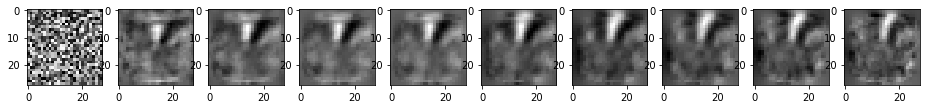

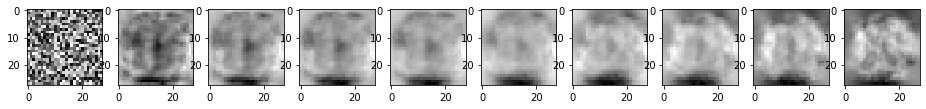

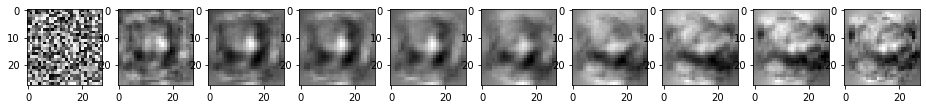

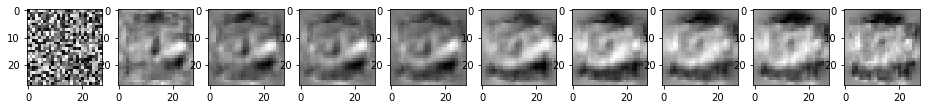

In [0]:
model = MLP([Dense(300, activation = 'relu')], 'rmsprop')
neurons = [[] for i in range(neurons_count)]
for epoch in range(epochs[-1] + 1):
    if epoch in epochs:
        dump_neurons(model, neurons, neurons_count)
    blur_weights_mlp(model, sigma = 1.0 - 0.7 * (epoch / (epochs[-1] + 1)))
    model.make_iterations(1)
print('\nCеть из 300 нейронов, размытие 1.0 -> 0.3 между эпохами')
show_neurons(neurons)

Как видим, размытие уровня 1.5 способно полностью изменить геометрию матриц весов в нейронной сети после нескольких десятков эпох. Размытие уровня 0.3 и ниже вообще не имеет эффекта, то есть после эпохи снова появляется шум такой же степени. При этом ни один из экспериментов не показал существенного роста точности.

Вообще идея о размытии матрицы весов возникла на основе двух соображений:

- Нейросети нужно как-то "сказать", что ближайшие пиксели более связаны друг с другом, чем далекие. Возможно это неверное рассуждение, ведь оптимизатор сам должен выявлять связи и скрытые закономерности.
- Шум на матрицах весов возможно ухудшает распознавание. Это тоже только предположение. Возможно, шум также может возникать из-за переобучения на наборе данных, и сглаживаться при расширении обучающего набора (это мы проверим позже).

Соберем статистику, чтобы сравнить точность нейросети с регулярным размытием весов и без него. Используем уже знакомую нам нейросеть 300-200-100-50 adam. Известно, что она сходится к значениям 0.984-0.986 в течение в среднем 70-100 итераций, иногда до 140 итераций. После того, как нейросеть нашла локальный оптимум, ее точность практически не меняется с последующими итерациями.

Подробное описание эксперимента дается ниже, где приведены графики.

In [0]:
#Размытие с постоянной sigma 0.35 между эпохами до эпохи 60
model_1 = MLP_multiple_averaged(25, [
    Dense(300, activation = 'relu'),
    Dense(200, activation = 'relu'),
    Dense(100, activation = 'relu'),
    Dense(50, activation = 'relu')
], 'adam', 'blue')
#Размытие с постоянной sigma 0.35 между эпохами всегда
model_2 = MLP_multiple_averaged(25, [
    Dense(300, activation = 'relu'),
    Dense(200, activation = 'relu'),
    Dense(100, activation = 'relu'),
    Dense(50, activation = 'relu')
], 'adam', 'green')
#Без размытия
model_3 = MLP_multiple_averaged(25, [
    Dense(300, activation = 'relu'),
    Dense(200, activation = 'relu'),
    Dense(100, activation = 'relu'),
    Dense(50, activation = 'relu')
], 'adam', 'red')

In [0]:
for epoch in range(265):
    if epoch < 60:
        blur_weights(model_1, 0.35)
    if epoch < 200:
        blur_weights(model_2, 0.35)
    for model in [model_1, model_2, model_3]:
        model.make_iterations(1)

In [0]:
#очищаем память и сохраняем модели
import gc
gc.enable()
gc.collect()

for i, mlp in enumerate(model_1.MLPs):
    mlp.model.save('../networks/300-200-100-50-adam mdl1 %d.h5' % i)
for i, mlp in enumerate(model_2.MLPs):
    mlp.model.save('../networks/300-200-100-50-adam mdl2 %d.h5' % i)
for i, mlp in enumerate(model_3.MLPs):
    mlp.model.save('../networks/300-200-100-50-adam mdl3 %d.h5' % i)

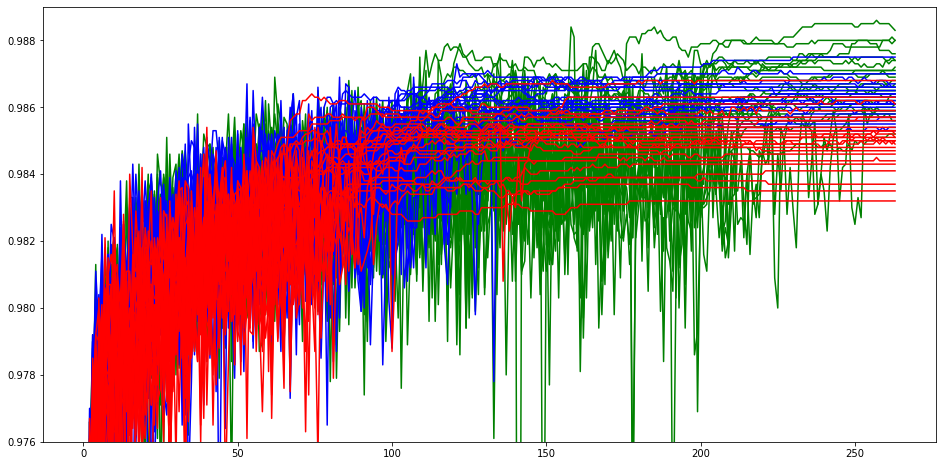

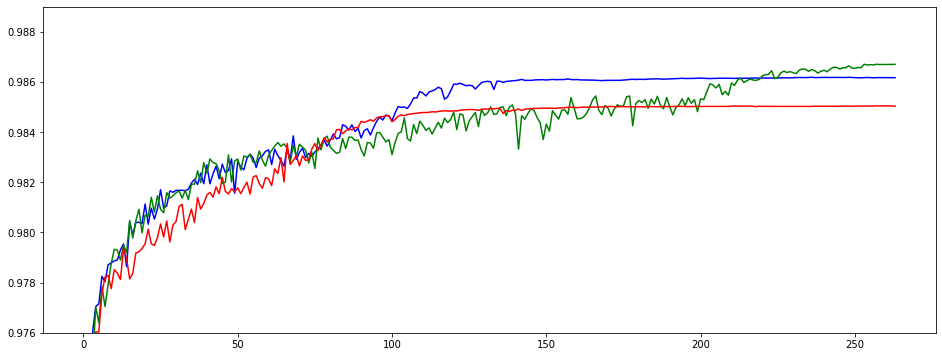

Максимальная достигнутая точность на полном тестовом наборе MNIST: 0.9886


In [0]:
plt.figure(figsize = (16, 8))
plt.gca().set_ylim([0.976, 0.989])
for mlp in model_2.MLPs + model_1.MLPs + model_3.MLPs:
    plt.plot(mlp.accuracy, color = mlp.name)
plt.show()

plt.figure(figsize = (16, 6))
plt.gca().set_ylim([0.976, 0.989])
for model in [model_1, model_2, model_3]:
    plt.plot(np.average(np.array([mlp.accuracy for mlp in model.MLPs]), axis = 0), color = model.MLPs[0].name)
plt.show()

max_acc = 0
for mlp in model_2.MLPs + model_1.MLPs + model_3.MLPs:
    max_acc = max(max_acc, np.max(mlp.accuracy))
print("Максимальная достигнутая точность на полном тестовом наборе MNIST:", max_acc)

Мы сравнивали три стратегии: обучение нейросети без размытия матриц весов (красные графики), с размытием 0.35 между эпохами до 60 эпохи (синие графики), с размытием 0.35 между эпохами до 200 эпохи (зеленые графики). В каждой группе по 25 нейросетей, основанных на одной и той же модели. Выше приведены результаты обучения всех нейросетей, ниже усредненные результаты по каждой выборке.

**Красный график** (обучение без размытия матрицы весов) можно считать образцом для сравнения. Он сходится к значению в среднем 0.984-0.986.

**Синий график** с первых эпох проходит выше красного, то есть размытие матриц весов, по-видимому, благотворно влияет на обучение нейросети. После 60 эпохи мы перестаем осуществлять размытие, и график сразу сближается с красным. Однако после ~100 эпохи, когда нейросети без размытия уже сходятся в локальный оптимум, наша группа продолжает обучаться и сходится к значению в среднем на 0.15% выше.

**Зеленый график** до 60 эпохи идет наравне с синим, поскольку обе группы обучаются с размытием 0.35 между эпохами. В течение 60-200 эпох в данной группе продолжается размытие весов между эпохами. Это несколько затормаживает обучение, но к 140 эпохе данная группа сравнивается по средней точности с "красной", которая уже нашла локальный оптимум. При этом данная группа все еще находится "в поиске оптимума" - точность имеет сильный разброс между эпохами. Со 120 эпохи начинают появляются отдельные нейросети, которые по точности превосходят все "красные" и "синие". После 200 эпохи размытие матриц весов прекращается, и к 250 эпохе нейросети находят свои локальные оптимумы. Среднее значение точности на 0.05% превосходит "синюю" группу и на 0.2% красную группу. Отдельные нейросети имеют точность выше 0.988.

Здесь можно проводить еще много экспериментов, но с помощью полученных данных уже можно делать предварительные выводы о локальных оптимумах. По-видимому локальные оптимумы деляются на широкие и узкие, и регулярное размытие матрицы весов нейронов первого слоя помогает нейросети найти широкий оптимум, в котором может быть и множество своих узких оптимумов.

В целом эксперимент успешен, поскольку удалось не только повысить среднюю точность на 0.2% (то есть снизить количество нераспознанных цифр на 15%), но и помог прояснить структуру множества локальных оптимумов в данном случае.

Не стоит забывать, что 0.2% точности - это всего 20 цифр тестового набора, так что полученные результаты в общем-то могут быть связаны с несовершенством тестового набора или иметь ограниченную область применения (мы ведь не изучали, какие именно примеры стали распознаваться лучше - может быть так, что улучшилось, например, только распознавание размытых нулей, а вот тонкие шестерки стали распознаваться немного хуже). Но есть надежда, что это все-таки безусловное улучшение качества обучения в задаче распознавания символов.

### Дальнейшие задачи <a class="anchor" id="neuro_whats_next_2"></a>

Остались неисследованными следующие поставленные проблемы для прозвольных полносвязных нейронных сетей:
- Как реагирует обученная нейросеть на одно и тоже изображение, которое сдвинуто или искажено? На изображения, которые вообще не являются цифрами?
- Можно ли улучшить точность нейросети, добавив к обучающим примерам различные их деформации?
- Можно ли улучшить точность нейросети какой-либо предварительной обработкой изображения (например, выделение линий)?
- Можно ли улучшить точность нейросети, обрабатывая ею многократно одно и то же тестовое изображение с даными искажениями?
- Можно ли улучшить точность или скорость обучения многослойной нейросети, если сначала обучать нейросеть с меньшим числом слоев, а затем в уже обученную нейросеть добавлять новые слои и обучать заново?
- Если выбирать ответ голосованием N обученных нейросетей с одним скрытым слоем, будет ли точность распознавания стремиться к 100% при стремлении N к бесконечности?
- Если обучить 10 нейросетей, каждая из которых имеет один выход и распознает одну цифру, а затем объединить их, может ли это дать более высокую точность распознавания?
- Если в предыдущих двух задачах использовать не голосование или объединение, а дополнительную нейросеть, которая и выдает окончательный ответ, можно ли достичь еще более высокой точности?
- Можно ли заставить нейросеть формировать более человеко-понятные признаки на каждом слое? Как обучить нейросеть "понимать" изображение, то есть генерировать в выводе каких-то нейронов простую осмысленную информацию: положение линий, толщину и прочее?
- Как обучить нейросеть, которая будет максимально быстро усваивать новую информацию, то есть научаться распознавать новые символы, не теряя способность распознавать старые?
- Можно ли подобрать оптимальные параметры и обучить нейросети, используя генетический алгоритм?

### Анализ свойств обученной нейросети <a class="anchor" id="neuro_analysis"></a>

В этом разделе мы попробуем ответить на первый вопрос: как реагирует обученная нейросеть на одно и тоже изображение, которое сдвинуто или искажено? На изображения, которые вообще не являются цифрами?

Используем обученную нейросеть, которая показала наилучшую точность распознавания.

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки (после выполнения кода в разделе "Код для тестов")

mlp = MLP(tf.keras.models.load_model('../networks/300-200-100-50-adam mdl2 9.h5'))
print(accuracy_score(mnist.y_val, mlp.model.predict(mnist.x_val / 255.0).argmax(axis = 1)))

0.9883


Мы будем визуализировать результаты экспериментов таким образом. Пусть мы хотим провести некую операцию с изображением, например размытие разной силы, в результате чего получаем набор изображений. Будем строить таблицу, по горизонтальной оси которой будет отложен номер изображения в наборе, а каждый столбец является результатом вычислений нейронной сети над изображением. В каждом столбце результат распознавания - это номер строки с наибольшим значением. Над таблицей покажем, как выглядят некоторые изображения из набора, с помощью индексации по np.linspace. Пример:

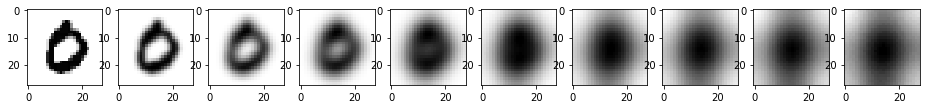

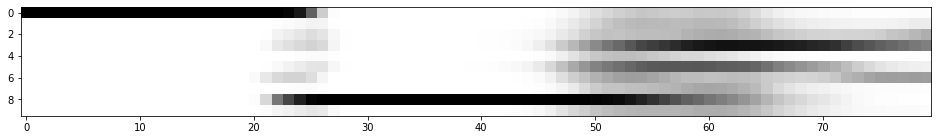

In [0]:
from scipy.ndimage.filters import gaussian_filter
import math

def visualize(images_sequence, *models):
    images_sequence = np.array(images_sequence)
    images_indices_to_draw = np.linspace(0, len(images_sequence) - 1, 10, dtype = int)
    mnist.draw(*images_sequence[images_indices_to_draw], columns = len(images_indices_to_draw))
    for model in models:
        predictions = [model.predict(img[np.newaxis, :, :] / 255.0)[0] for img in images_sequence]
        predictions = np.log(np.array(predictions).T + 0.001)
        fig = plt.figure(figsize = (16, 2))
        plt.subplots_adjust(left = 0.11)
        plt.imshow(predictions, cmap = plt.cm.binary, aspect = 'auto')
        plt.show()

blur_range = np.arange(0, 8, 0.1)
blurred_images = [gaussian_filter(mnist.x_val[3], sigma = blur) for blur in blur_range]
visualize(blurred_images, mlp.model)

В данном случае нейросеть сначала уверенно распознает ноль, но при значительном размытии вместо нуля начинает "видеть" восьмерку. При дальнейшем размытии ответы нейросети снова меняются - примерно в тот момент, когда закрашенные пиксели доходят до края изображения.

Попробуем "распознать" 50 случайных изображений, вообще не являющихся цифрами.

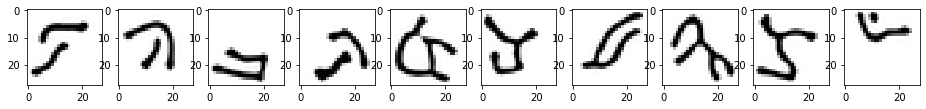

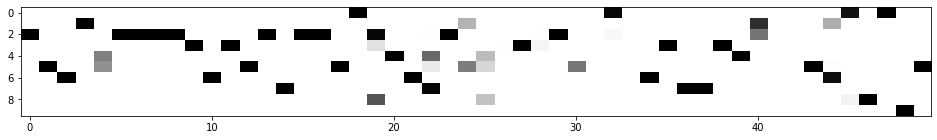

In [0]:
def work(input_img, iterations):
    tmp_img = input_img
    mid_img = None
    for i in range(iterations):
        tmp_img2 = mnist.edit(tmp_img, mnist.Deform(2, 0.3))
        if mnist.fits(tmp_img2):
            tmp_img = mnist.edit(tmp_img2, mnist.Sharpen())
    return tmp_img

results = []
for i in range(50):
    results.append(work(mnist.x_train[i], 50))

#mnist.draw(*results, columns = 10)

visualize(results, mlp.model)

Нейросеть в большинстве случаев дает уверенные ответы на такие символы, которые нигде не встречались среди обучающих данных. Иными словами, в ответ на незнакомый символ только один из 10 нейронов дает сигнал (т. к. цвет в таблице основан на логарифмической шкале, то выходы остальных 9 нейронов практически равны нулю). Если бы мы вместо одной нейросети обучили бы 10, каждая из которых распознает одну цифру, а затем обьединили бы их входы и выходы, то мы тоже получили бы нейросеть, распознающую цифры. Однако маловероятно, что в таком случае в ответ на незнакомый символ только один выходной нейрон из десяти давал бы сигнал.

Наблюдаемое поведение нейросети вообще нежелательно: хотелось бы, чтобы нейросеть не давала уверенных ответов в сложных случаях.

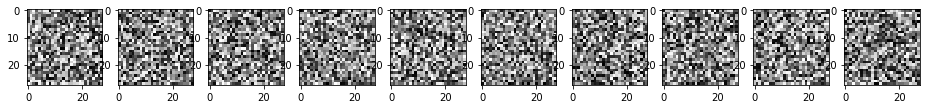

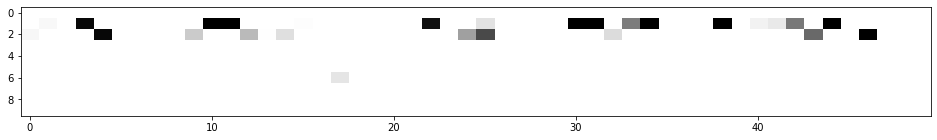

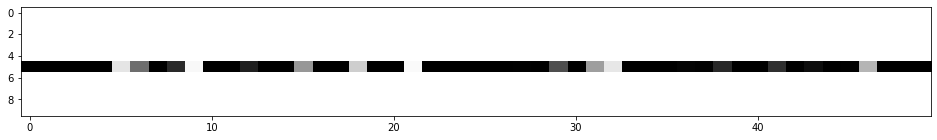

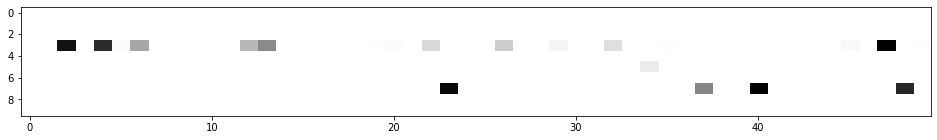

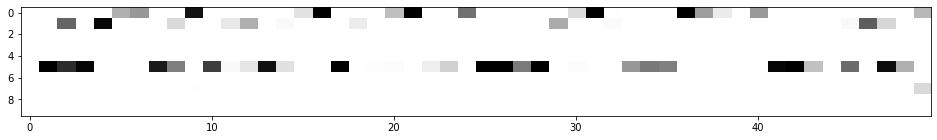

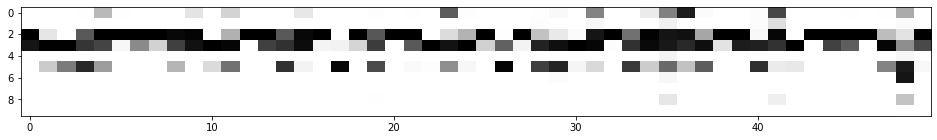

In [0]:
noize = np.random.rand(50, 28, 28) * 255
networks = [tf.keras.models.load_model('../networks/300-200-100-50-adam mdl2 %d.h5' % i) for i in range(9, 14)]
visualize(noize, *networks)

Разные нейросети выдают разные ответы, когда на вход подаются наборы случайных пикселей. Но как правило ответы эти уверенные, то есть активируется только один выходной нейрон, причем часто один и тот же. Возможно это связано с отсутствием какой-то нормализации. В идеале нейросеть должна в ответ на шум выдавать ноль на всех выходных нейронах.

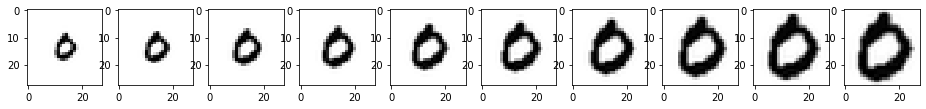

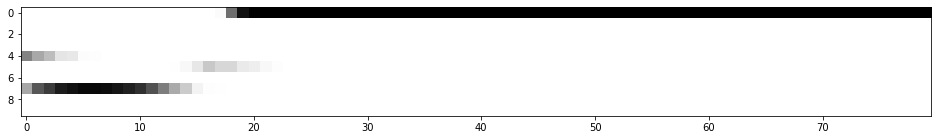

In [0]:
visualize([mnist.edit(mnist.x_val[3], mnist.Scale(scale)) for scale in np.arange(0.5, 1.3, 0.01)], mlp.model)

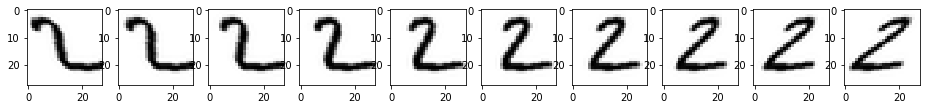

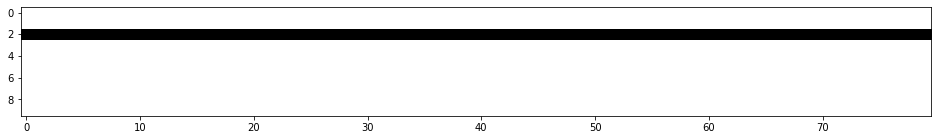

In [0]:
visualize([mnist.edit(mnist.x_val[1], mnist.Shear_x(coef)) for coef in np.arange(-0.8, 0.8, 0.02)], mlp.model)

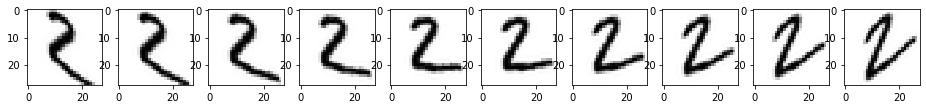

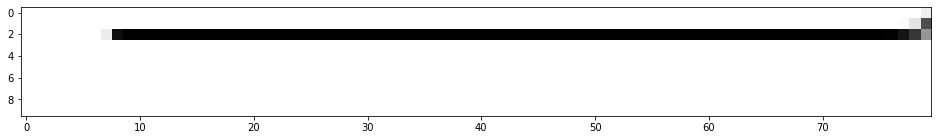

In [0]:
visualize([mnist.edit(mnist.x_val[1], mnist.Shear_y(coef)) for coef in np.arange(-0.8, 0.8, 0.02)], mlp.model)

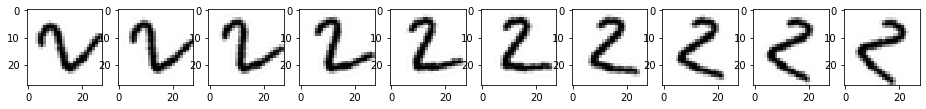

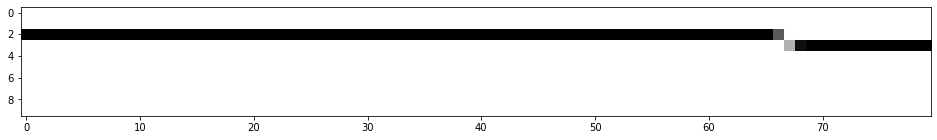

In [0]:
visualize([mnist.edit(mnist.x_val[1], mnist.Rotate(coef)) for coef in np.arange(-0.8, 0.8, 0.02)], mlp.model)

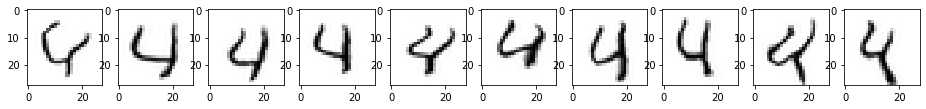

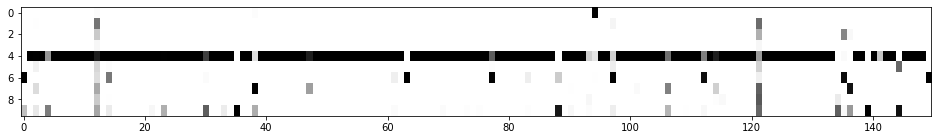

In [0]:
visualize([mnist.edit(mnist.x_val[4], mnist.Deform(3, 0.5)) for i in range(150)], mlp.model)

**Вывод 1.** Нейросеть как классификатор довольно устойчива к масштабированию и искажениям изображения, что и следовало ожидать.

**Вывод 2.** Нейросеть редко "сомневается". Обычно один из выходов практически равен 1, остальные 0. Скорее всего это следствие того, что в процессе обучения все пространство изображений было разбито на 10 классов. Даже в случае, когда изображение не имеет ничего общего с цифрами, оно скорее всего оказывается в пределах одного из 10 классов, а не на границе классов. А может быть это связано с тем, что в обучающем наборе ответ всегда известен точно: таким образом, нейросеть обучилась тому, чему мы ее учили: всегда выдавать уверенный ответ.

Обучив отдельные нейросети на рпспознавание каждой цифры, а затем объединив их, мы можем научить нейросеть "сомневаться", что было бы более естественно. Однако в этом случае нарушается логическая связность всей нейросети (т. е. появляется 10 независимых путей от входных к выходным нейронам).

Можно также добавить не-цифры в обучающий набор, и желаемый ответ в таком случае - все нули. Можно еще для неоднозначных обучающих примеров считать верным ответом не (1, 0, 0, ...), а скажем (0.6, 0.4, 0, ...), и обучать нейросеть на таких ответах. Однако сначала такие ответы нужно еще как-то сгенерировать, например используя другие нейросети. Тогда мы получим следующее "поколение" нейросетей, обученное на сочетании верных ответов и результатах работы предыдущего поколения.

Проверим это предположение на практике.

Попробуем сформировать обучающий набор, который "обьяснял" бы нейросети, что в спорных случаях не нужно давать уверенных ответов.

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time, math, PIL
import mnistlib as mnist
mnist.init()

train_x_1 = mnist.x_train[:30000] / 255.0
train_x_2 = mnist.x_train[30000:] / 255.0

train_y = np.zeros((60000, 10), dtype = float)
for sample in range(60000):
    number = mnist.y_train[sample]
    train_y[sample][number] = 1

train_y_1 = train_y[:30000]
train_y_2 = train_y[30000:]

test_x = mnist.x_val / 255.0
test_y = mnist.y_val

def train(model, X, Y, max_iter = 200):
    accuracy = []
    for i in range(max_iter):
        print(i, end = '\r')
        model.fit(X, Y, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(test_x).argmax(axis = 1)
        acc = accuracy_score(test_y, prediction)
        accuracy.append(acc)
        _max = np.amax(accuracy[-15:])
        _min = np.amin(accuracy[-15:])
        if i > 15 and _max - _min <= 0.0002:
            break #процесс обучения закончился, т. к. результаты стабилизировались
    return accuracy[-1] #точность на последнем шаге

###############################

#группа, обучающаяся на первой половине обучающего набора MNIST и классифицирующая вторую половину обучающего набора MNIST
first_group = [
    tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape = (28, 28)),
        tf.keras.layers.Dense(300, activation = 'relu'),
        tf.keras.layers.Dense(200, activation = 'relu'),
        tf.keras.layers.Dense(100, activation = 'relu'),
        tf.keras.layers.Dense(50, activation = 'relu'),
        tf.keras.layers.Dense(10, activation = 'sigmoid')
    ]) for _ in range(10)
]

for model in first_group:
    model.compile(
        optimizer = 'adam',
        #https://towardsdatascience.com/multi-label-image-classification-with-neural-network-keras-ddc1ab1afede
        loss = 'binary_crossentropy',
        metrics = ['accuracy']
    )
    accuracy = train(model, train_x_1, train_y_1)
    print("Точность", accuracy)

Точность 0.9797
Точность 0.98
Точность 0.9812
Точность 0.981
Точность 0.9795
Точность 0.9811
Точность 0.9809
Точность 0.9787
Точность 0.9801
Точность 0.9817


In [0]:
#группа, обучающаяся на второй половине обучающего набора MNIST и классифицирующая первую половину обучающего набора MNIST
second_group = [
    tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape = (28, 28)),
        tf.keras.layers.Dense(300, activation = 'relu'),
        tf.keras.layers.Dense(200, activation = 'relu'),
        tf.keras.layers.Dense(100, activation = 'relu'),
        tf.keras.layers.Dense(50, activation = 'relu'),
        tf.keras.layers.Dense(10, activation = 'sigmoid')
    ]) for _ in range(10)
]

for model in second_group:
    model.compile(
        optimizer = 'adam',
        #https://towardsdatascience.com/multi-label-image-classification-with-neural-network-keras-ddc1ab1afede
        loss = 'binary_crossentropy',
        metrics = ['accuracy']
    )
    accuracy = train(model, train_x_1, train_y_1)
    print("Точность", accuracy)

Точность 0.981
Точность 0.9802
Точность 0.9802
Точность 0.9807
Точность 0.9801
Точность 0.9818
Точность 0.9812
Точность 0.9798
Точность 0.9815
Точность 0.9808


In [0]:
averaged_predictions_1 = np.mean([model.predict(train_x_1) for model in second_group], axis = 0)
new_training_labels_1 = np.average([train_y_1, averaged_predictions_1], axis = 0, weights = [1, 1])
print(new_training_labels_1.shape)

averaged_predictions_2 = np.mean([model.predict(train_x_2) for model in first_group], axis = 0)
new_training_labels_2 = np.average([train_y_2, averaged_predictions_2], axis = 0, weights = [1, 1])
print(new_training_labels_2.shape)

new_training_labels = np.concatenate((new_training_labels_1, new_training_labels_2), axis = 0)
print(new_training_labels.shape)

(30000, 10)
(30000, 10)
(60000, 10)


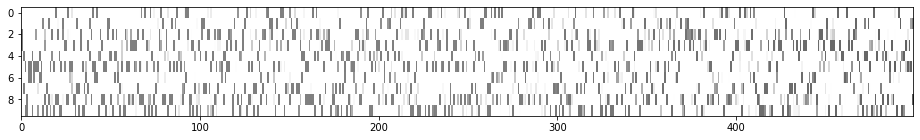

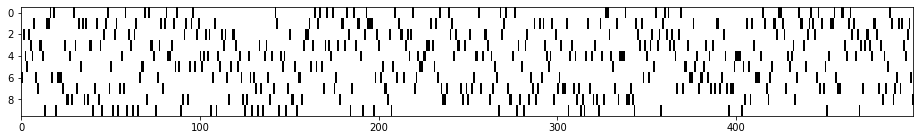

In [0]:
maximums = new_training_labels.max(axis = 1).argsort(axis = 0)

fig = plt.figure(figsize = (16, 2))
plt.imshow(new_training_labels[maximums[:500]].T, cmap = plt.cm.binary, vmin = 0, vmax = 1, aspect = 'auto')
plt.show()

fig = plt.figure(figsize = (16, 2))
plt.imshow(new_training_labels[maximums[-500:]].T, cmap = plt.cm.binary, vmin = 0, vmax = 1, aspect = 'auto')
plt.show()

Здесь мы видим 500 наименее и наиболее распознаваемых цифр из обучающего набора MNIST. Каждый столбец связан с одним изображением обучающего набора, и в нем 10 строк. Строка генерируется следующим образом: берется усредненное предсказание об этой цифре по 10 нейросетям, которые не обучались на этой цифре, в виде 10 чисел от 0 до 1 - назовем этот вектор X. Затем берется правильный ответ согласно обучающему набору данных, то есть (0, ..., 0, 1, 0, ..., 0), где единица стоит на том индексе, какая цифра изображена - назовем этот вектор Y. Затем берется среднее между векторами X и Y. Например, если 5 нейросетей предсказали пятерку, еще 5 нейросетей предсказали шестерку, а правильный ответ - восьмерка, то результат будет следующим:

`average(
    (0   0   0   0   0   .5  .5  0   0   0),
    (0   0   0   0   0   0   0   0   1   0)
)
  = (0   0   0   0   0   .25 .25 0   .5   0)`

Таким образом, мы сформировали набор, в котором не дается однозначных ответов в сложных случаях, но намекается на правильный ответ. Проблема в том, что сложных случаев слишком мало, и они могут не повлиять на процесс обучения.

In [0]:
#группа, обучающаяся на тренировочном наборе MNIST, скорректированном на основании предсказаний первой и второй группы
test_group = [
    tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape = (28, 28)),
        tf.keras.layers.Dense(300, activation = 'relu'),
        tf.keras.layers.Dense(200, activation = 'relu'),
        tf.keras.layers.Dense(100, activation = 'relu'),
        tf.keras.layers.Dense(50, activation = 'relu'),
        tf.keras.layers.Dense(10, activation = 'sigmoid')
    ]) for _ in range(10)
]

for model in test_group:
    model.compile(
        optimizer = 'adam',
        #https://towardsdatascience.com/multi-label-image-classification-with-neural-network-keras-ddc1ab1afede
        loss = 'binary_crossentropy',
        metrics = ['accuracy']
    )
    accuracy = train(model, mnist.x_train / 255.0, new_training_labels)
    print("Точность", accuracy)

Точность 0.9841
Точность 0.983
Точность 0.9843
Точность 0.9846
Точность 0.9842
Точность 0.9855
Точность 0.9843
Точность 0.9851
Точность 0.9857
Точность 0.9843


### Расширение обучающего набора <a class="anchor" id="neuro_train_expanding"></a>

В предыдущем разделе мы попробовали осуществить модификацию обучающего набора. Есть и много других способов это сделать. Наиболее очевидный - дополнение набора. Мы видели, что при обучении на половине набора точность оказывается существенно ниже, чем при обучении на всем наборе. Значит следующим шагом будет дополнение обучающего набора различными деформациями, сдвигами, масштабированиями цифр, входящих в исходный набор.

Определим функцию, случайным образом изменяющую изображение. Если изображение выходит за границы, функция возвращает исходное изображение.

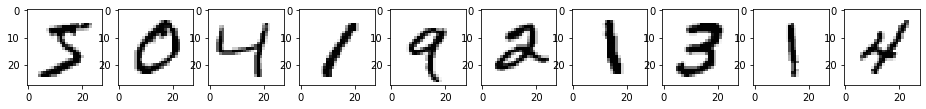

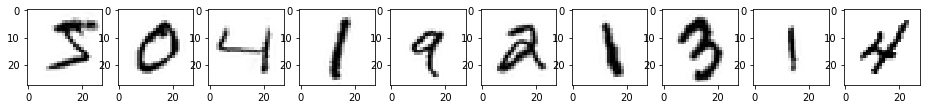

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки (после выполнения кода в разделе "Код для тестов")
import random

def random_change(img):
    rand = random.random()
    if rand < 0.3:
        img2 = mnist.edit(img, mnist.Deform(2, 0.4), scaling = 2)
    elif rand < 0.6:
        img2 = mnist.edit(img, mnist.Deform(3, 0.5), scaling = 2)
    elif rand < 0.8:
        img2 = mnist.edit(img, mnist.Scale(0.7 + 0.6 * random.random()), scaling = 2)
    else:
        img2 = mnist.edit(img, mnist.Rotate((random.random() - 0.5) * 1.5), scaling = 2)
    if not mnist.fits(img2):
        return img
    return img2

images = mnist.x_train[:10]
mnist.draw(*images, columns = 10)
images_edited = [random_change(img) for img in images]
mnist.draw(*images_edited, columns = 10)

In [0]:
train_images = mnist.x_train
train_labels = mnist.y_train

mlp = MLP([
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
], 'adam')

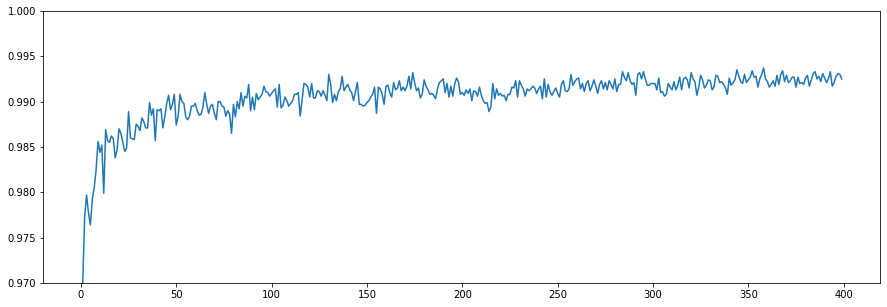

In [0]:
import gc

for i in range(100):
    gc.collect()
    print(i, "making images...", end = '\r')
    new_train_images = np.array([random_change(img) for img in train_images]) / 255.0
    mlp.make_iterations(4, x = new_train_images, y = train_labels)
mlp.show_accuracy();

Продолжим обучение, добавив случайные изображения, ответом на которые должны быть все нули в выходном слое.

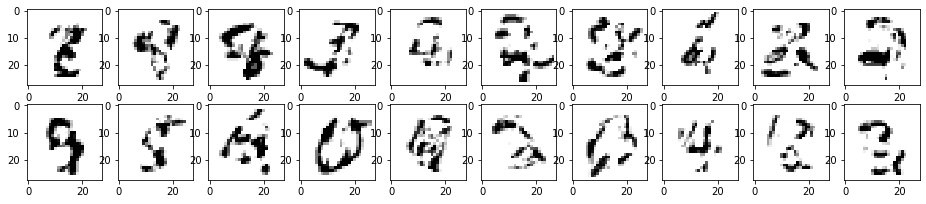

In [0]:
def get_random_image():
    X = mnist.x_train
    N = len(X)
    imgs = [X[random.randrange(N)] for _ in range(4)]
    result = np.zeros((28, 28))
    for x in range(28):
        for y in range(28):
            res = int(imgs[0][x][y]) + int(imgs[1][x][y]) - int(imgs[2][x][y]) - int(imgs[3][x][y])
            res = max(0, min(255, res))
            result[x][y] = res
    return result

mnist.draw(*[get_random_image() for _ in range(20)], columns = 10)

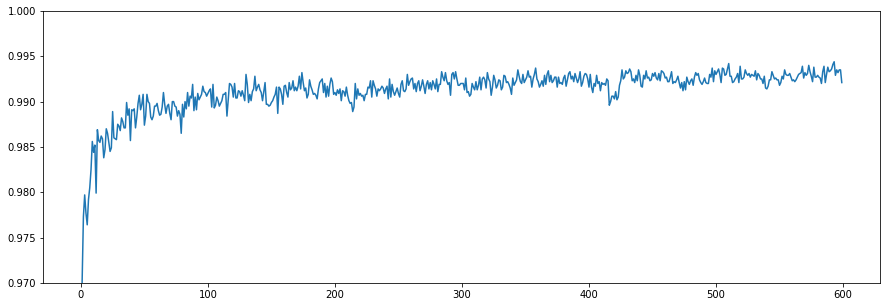

In [0]:
train_labels_new = np.zeros((66000, 10), dtype = float)
for i in range(60000):
    number = mnist.y_train[i]
    train_labels_new[i][number] = 1
#для меток 60000-66000 остаются все нули

mlp.model.compile(
    optimizer = 'adam',
    loss = 'binary_crossentropy',
    metrics = ['accuracy']
)

for i in range(50):
    gc.collect()
    print(i, "making images...", end = '\r')
    new_train_images = np.array(
        [random_change(img) for img in train_images]
        + [get_random_image() for _ in range(6000)]
    ) / 255.0
    mlp.make_iterations(4, x = new_train_images, y = train_labels_new)
mlp.show_accuracy();

Увеличим количество изображений с не-цифрами до половины от всего обучающего набора.

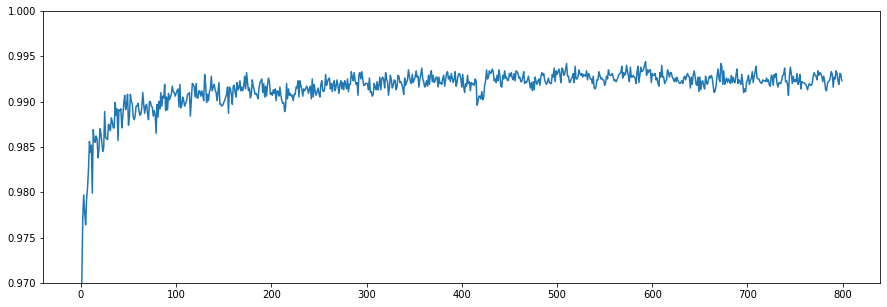

In [0]:
train_labels_new = np.zeros((120000, 10), dtype = float)
for i in range(60000):
    number = mnist.y_train[i]
    train_labels_new[i][number] = 1
#для меток 60000-120000 остаются все нули

mlp.model.compile(
    optimizer = 'adam',
    loss = 'binary_crossentropy',
    metrics = ['accuracy']
)

for i in range(50):
    gc.collect()
    print(i, "making images...", end = '\r')
    new_train_images = np.array(
        [random_change(img) for img in train_images]
        + [get_random_image() for _ in range(60000)]
    ) / 255.0
    mlp.make_iterations(4, x = new_train_images, y = train_labels_new)
mlp.show_accuracy();

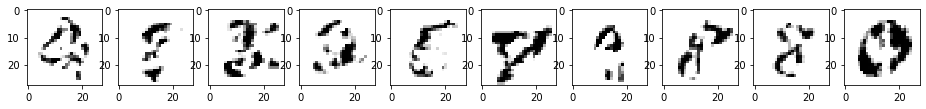

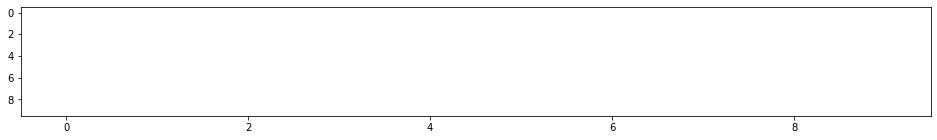

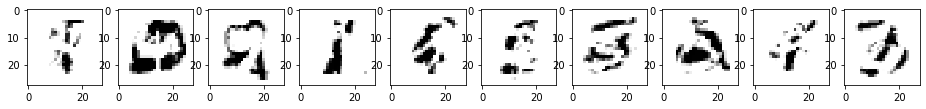

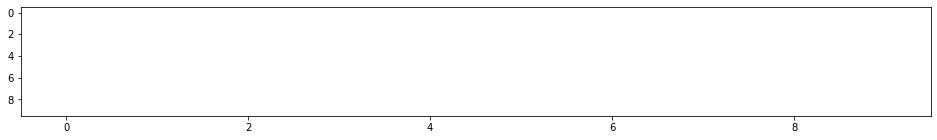

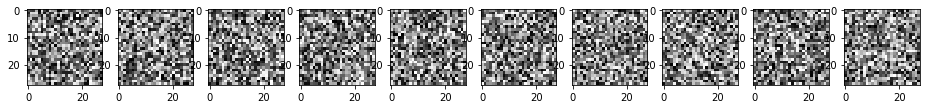

...

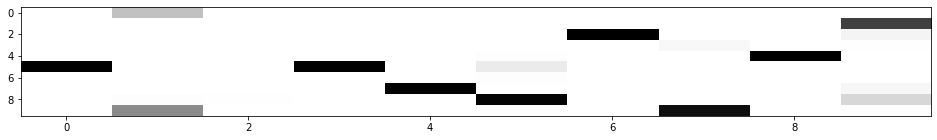

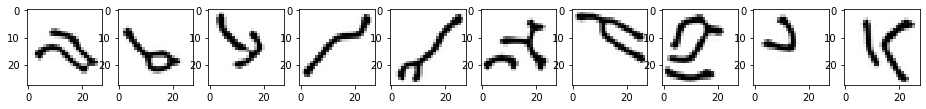

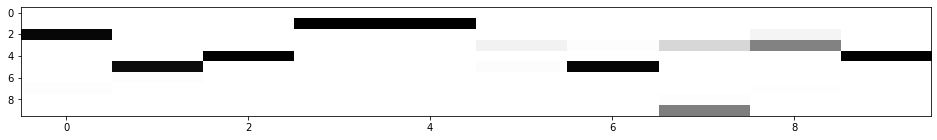

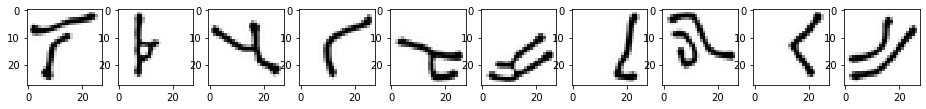

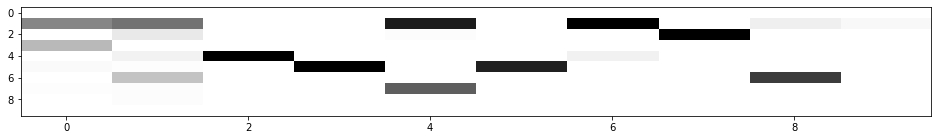

In [0]:
from scipy.ndimage.filters import gaussian_filter
import math

def visualize(images_sequence, *models):
    images_sequence = np.array(images_sequence)
    images_indices_to_draw = np.linspace(0, len(images_sequence) - 1, 10, dtype = int)
    mnist.draw(*images_sequence[images_indices_to_draw], columns = len(images_indices_to_draw))
    for model in models:
        predictions = [model.predict(img[np.newaxis, :, :] / 255.0)[0] for img in images_sequence]
        #predictions = np.log(np.array(predictions).T + 0.001)
        predictions = np.array(predictions).T
        fig = plt.figure(figsize = (16, 2))
        plt.subplots_adjust(left = 0.11)
        plt.imshow(predictions, cmap = plt.cm.binary, vmin = 0, vmax = 1, aspect = 'auto')
        plt.show()
        
def work(input_img, iterations):
    tmp_img = input_img
    mid_img = None
    for i in range(iterations):
        tmp_img2 = mnist.edit(tmp_img, mnist.Deform(2, 0.3))
        if mnist.fits(tmp_img2):
            tmp_img = mnist.edit(tmp_img2, mnist.Sharpen())
    return tmp_img

for _ in range(2):
    visualize([get_random_image() for i in range(10)], mlp.model)

visualize(np.random.rand(10, 28, 28) * 255, mlp.model)

for _ in range(5):
    visualize([work(mnist.x_train[i], 50) for i in range(10)], mlp.model)

Смена обучающего набора каждые 4 итерации, как и ожидалось, повлияла на обучение очень положительно: количество неправильно распознанных цифр уменьшилось в 2 раза. Можно было бы сначала выделить легко распознаваемые цифры (эталоны), а потом с помощью деформаций составлять из них новый обучающий набор, чтобы не деформировать и так труднораспознаваемые цифры.

Попытка обучить нейросеть отличать цифры от не-цифр закончилась неудачно. Как не-цифры стали распознаваться изображения только такого вида, которые подавались в качестве обучающих примеров. Иными словами, нейросеть научилась распознавать новый класс изображений, генерируемых с помощью get_random_image(), но это далеко не все не-цифровые изображения.

Как же обучить нейросеть отличать цифры от не-цифр, также составленных из линий?

*Подход 1.* Дополнить обучающие примеры изображениями букв, желаемый ответ - все нули в выходном слое нейронов. Проблема в том, что этот способ не универсален, так как могут быть и не-буквенные изображения. Вдобавок некоторые буквы похожи на цифры.

*Подход 2.* Дополнить обучающие примеры случайными изображениями, сгенерированными из линий. Этот способ более универсален, но имеет свои недостатки. Во-первых, изображения будут генерироваться очень долго. Во-вторых некоторые из случайно сгенерированных изображений могут как раз оказаться похожими на цифры. Но если доля таких изображений будет невелика, это не должно оказать сильного эффекта на обучение.

*Подход 3.* Найти такой способ обучения, в котором нейросеть будет выделять осмысленные промежуточные признаки, и из них уже делать вывод. Например, человек всегда может объяснить, почему данное изображение является или не является цифрой, описывая взаимное расположение линий. Нейросети же, которые мы обучали выше, такой способности лишены.

### Модификация входных данных: выделение линий <a class="anchor" id="neuro_preprocessing"></a>

До сих пор мы использовали пиксели изображения как входы нейросети. Однако можно использовать и много других данных в качестве основных или дополнительных входов:

1. Уменьшенное изображение. За счет снижения количества входов может вырасти скорость обучения, а значит при тех же доступных ресурсах мы можем обучить нейросеть с большим числом нейронов. Это может сказаться положительно на точности распознавания.
2. Предварительная обработка изображений, например фильтром mnist.Sharpen, выделяющим линии. Можно также создать алгоритм обработки, который определяет среднюю толщину линии на изображении, а затем расщепляет более толстые линии на две параллельных.
3. Предварительное выделение линий на изображении путем свертки или какой-либо похожей операции (мне известно о существовании сверточных нейросетей, но в данном ноутбуке мы изучаем только простые, полносвязные нейросети, а операция свертки может быть применена как предварительная обработка входных данных).
4. Выходы нейросетей может использовать как входы для другой нейросети, которая будет выносить окончательное решение. Допустим, 10 нейросетей "первого эшелона" получают на вход данные об изображении, а одна нейросеть "второго эшелона" получает на вход выходы всех нейросетей "первого эшелона". Отличие такого "коллектива" от одной большой нейросети в том, что нейросети "первого эшелона" обучаются первыми, и сами по себе умеют распознавать цифры, а нейросеть "второго эшелона" обучается следующей, тогда как веса нейросетей "первого эшелона" фиксируются. По сути мы получаем усложненную версию простого голосования нейросетей. Можно реализовать аналогичную концепцию с помощью раздельного обучения слоев нейросети. Однако неизвестно, принесет ли это пользу.

План действий следующий: сначала попробуем осуществить выделение линий, затем алгоритм расщепления линий, затем попробуем использовать уменьшенное изображение или совместим все нестандартные входы.

Сначала попробуем использовать в качестве входных данных для нейросети не пиксели, а информацию о линиях. Каждый вход
будет означать: в такой-то области изображения есть что-то похожее на линию с таким-то направлением.
Для этого сначала нарисуем линии, а потом будем проверять похожесть участка изображения на каждую линию.

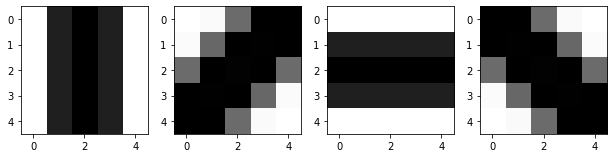

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import mnistlib as mnist
import numpy as np
import math

#задаваемые параметры
one_sided_size = 2
one_sided_line_size = 1

side_size = 2 * one_sided_size + 1
one_sided_size_enlarged = math.ceil(one_sided_size * 1.5)
side_size_enlarged = 2 * one_sided_size_enlarged + 1
vertical_line = np.zeros((side_size_enlarged, side_size_enlarged), dtype = np.uint8)
for x in range(one_sided_size_enlarged - one_sided_line_size,
            one_sided_size_enlarged + one_sided_line_size + 1):
    vertical_line[:, x] = [255] * side_size_enlarged
#mnist.draw(vertical_line)

angles = np.linspace(0, math.pi, 4, endpoint = False)
lines = [mnist.edit(vertical_line, mnist.Rotate(angle), scaling = 10) for angle in angles]
delta_size = one_sided_size_enlarged - one_sided_size
lines = [line[delta_size:delta_size + side_size, delta_size:delta_size + side_size] for line in lines]
mnist.draw(*lines, columns = 6)
#lighten = np.vectorize(lambda x: max(0, 256 + (x-256)*2))
#lines = [lighten(line) for line in lines]
#mnist.draw(*lines, columns = 6)
#for line in lines:
#    print(np.average(line))

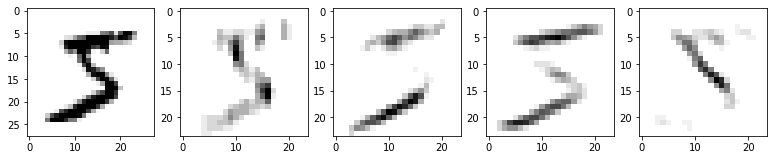

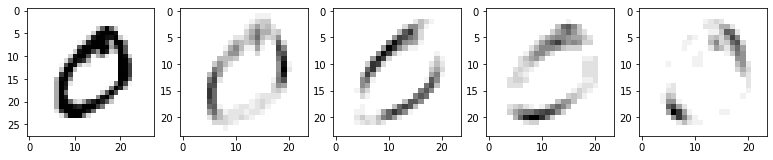

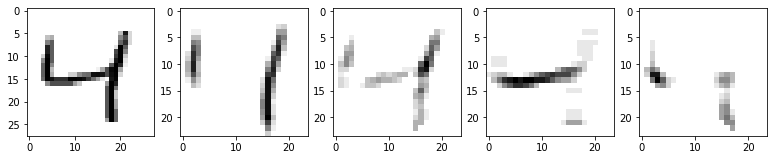

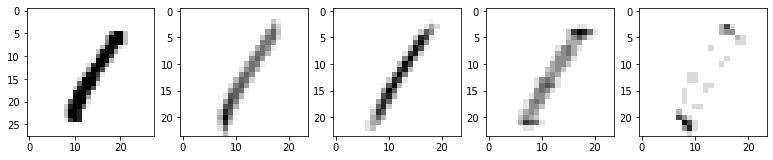

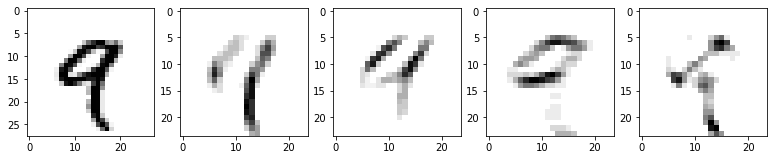

Времени на обработку 1000 изображений:
9.837676048278809
Формат полученных данных:
(1000, 4, 24, 24)


In [0]:
'''
Пусть "радиус" маски равен 2 (one_sided_size) - маска имеет сторону 2*2 + 1 пикселей, т. е. размер 5*5.
Steps - набор чисел (2, 3, ..., 24, 25). N - количество чисел в множестве steps, то есть 12.
Points - множество всех возможных точек, в которых обе координаты принадлежат множеству steps. Эти точки
равномерно распределены на изображении 28*28.

Алгоритм выделения линий принимает на вход:
1) Изображение 28*28
2) Одну из масок 5*5 (например, вертикальную линию)

Выходом алгоритма является изображение N*N.

Пиксель (x, y) выходного изображения расчитывается следующим образом:
1) На исходном изображении 28*28 берется соответствующая точка из мн-ва points (по координатам (steps[x], steps[y])).
2) На эту точку "накладывается" маска 5*5.
3) Пиксель выходного изображения расчитывается по функции find_similarity: для каждой пары пикселей (один пиксель на маске
наложен на другой пиксель на изображении) берутся их значения A и В, расчитывается значение f(A, B) = 256-2*|A-B|, а затем
все значения складываются. Таким образом, чем более данный участок изображения похож на маску, тем выше будет выходное
значение. Эту операцию можно было бы заменить сверткой (f(A, B) = A*B) для ускорения вычислений, но допустимость этой
замены нужно еще исследовать, поскольку свертка не определяет "похожесть" участка на маску.
'''

steps = range(one_sided_size, 28 - one_sided_size, 1)
def find_similarity(img, dx, dy, mask):
#     total_similarity = 0
#     for x in range(side_size):
#         for y in range(side_size):
#             val1 = img[x + dx, y + dy]
#             val2 = mask[x, y]
#             similarity = 256 - 2 * abs(val1 - val2)
#             total_similarity += similarity
    img_part = img[dx:dx+side_size, dy:dy+side_size]
    similarities = 256 + np.maximum(img_part - mask, mask - img_part)*-2
    total_similarity = np.sum(similarities)
    return max(0, total_similarity / 256)

#Реализация описанного выше алгоритма, возвращает массив из 4 изображений 12*12, для 4 разных масок
def get_lines_data(_img):
    img = _img.astype(float)
    data = []
    for line_index in range(len(lines)):
        line_mask = lines[line_index].astype(float)
        line_data = np.zeros((len(steps), len(steps)), dtype = float)
        for x_idx in range(len(steps)):
            x_center = steps[x_idx]
            for y_idx in range(len(steps)):
                y_center = steps[y_idx]
                dx = x_center - one_sided_size
                dy = y_center - one_sided_size
                line_data[x_idx, y_idx] = find_similarity(img, dx, dy, line_mask)
        data.append(line_data)
    return data

#def flatten_lines_data(lines_data):
#    lines_data_flat = [line_data.reshape(-1) for line_data in lines_data]
#    return np.concatenate(lines_data_flat)

#Рисует изображение img, а следом результат функции get_lines_data(img)
def visualize_lines_data(img, lines_data):
    lines_data_prepared = []
    for line_data in lines_data:
        data = line_data.astype(np.uint8)
        for i in range(len(steps)):
            for j in range(len(steps)):
                data[i, j] *= 5
        lines_data_prepared.append(data)
    mnist.draw(img, *lines_data_prepared, columns = 6)

mnist.init()
for i in range(5):
    img = mnist.x_train[i]
    lines_data = get_lines_data(img)
    visualize_lines_data(img, lines_data)

from joblib import Parallel, delayed
import time

print("Времени на обработку 1000 изображений:")
start_time = time.time()
x = Parallel(n_jobs = 8)(delayed(get_lines_data)(img) for img in mnist.x_train[:1000])
print(time.time() - start_time)

print("Формат полученных данных:")
print(np.array(x).shape)

Обработаем таким образом изображения MNIST и сохраним в файлы.

In [0]:
x = np.array(Parallel(n_jobs = 8)(delayed(get_lines_data)(img) for img in mnist.x_train)) / 10
np.save('../numpy_saved/x_train_1.npy', x)

In [0]:
x_test = np.array(Parallel(n_jobs = 8)(delayed(get_lines_data)(img) for img in mnist.x_val)) / 10
np.save('../numpy_saved/x_val.npy', x_test)

Обучим нейронную сеть на полученных данных.

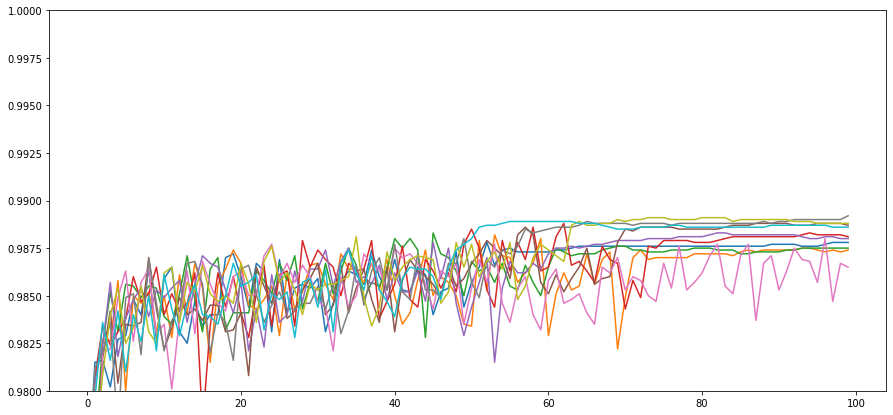

In [0]:
import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

accuracies = []
for i in range(10):
    model = tf.keras.models.Sequential([
        tf.keras.layers.Flatten(input_shape = (4, 24, 24)),
        tf.keras.layers.Dense(300, activation = 'relu'),
        tf.keras.layers.Dense(200, activation = 'relu'),
        tf.keras.layers.Dense(100, activation = 'relu'),
        tf.keras.layers.Dense(50, activation = 'relu'),
        tf.keras.layers.Dense(10, activation = 'sigmoid')
    ])
    model.compile(
        optimizer = 'adam',
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )
    accuracy = []
    for j in range(100):
        model.fit(x, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(x_test).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        accuracy.append(acc)
        print("iteration %d, accuracy %g" % (j, acc), end = '\r')
    accuracies.append(accuracy)
plt.figure(figsize = (15, 7))
plt.gca().set_ylim([0.98, 1.0])
for i in range(10):
    plt.plot(accuracies[i])
plt.show()

Выигрыш в точности составил 0.25%, однако обучающие данные очень долго генерируются.

Сформируем 100 обучающих наборов и сохраним на диск.

In [0]:
import random, gc
from joblib import Parallel, delayed

def random_change(img):
    rand = random.random()
    if rand < 0.3:
        img2 = mnist.edit(img, mnist.Deform(2, 0.4), scaling = 2)
    elif rand < 0.6:
        img2 = mnist.edit(img, mnist.Deform(3, 0.5), scaling = 2)
    elif rand < 0.8:
        img2 = mnist.edit(img, mnist.Scale(0.7 + 0.6 * random.random()), scaling = 2)
    else:
        img2 = mnist.edit(img, mnist.Rotate((random.random() - 0.5) * 1.5), scaling = 2)
    if not mnist.fits(img2):
        return img
    return img2

for i in range(100):
    gc.collect()
    print("генерация", i)
    #случайные деформации
    train_images = np.array(Parallel(n_jobs = 8)(delayed(random_change)(img) for img in mnist.x_train))
    print("выделение линий", i)
    #выделение линий
    train_images2 = np.array(Parallel(n_jobs = 8)(delayed(get_lines_data)(img) for img in train_images))
    #сжатие до uint8
    train_images2 = np.clip(train_images2 * 10, 0, 255).astype(np.uint8)
    print("сохранение", i)
    np.save('../numpy_saved/x_train_%d.npy' % i, train_images)
    np.save('../numpy_saved/x_train_%d_processed.npy' % i, train_images2)

In [0]:
val_images2 = np.array(Parallel(n_jobs = 8)(delayed(get_lines_data)(img) for img in mnist.x_val))
#сжатие до uint8
val_images2 = np.clip(val_images2 * 10, 0, 255).astype(np.uint8)
np.save('../numpy_saved/x_val_processed.npy', val_images2)

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки (после выполнения кода в разделе "Код для тестов")

import gc
models_count = 5
iterations = 400

#5 моделей, обучающихся на данных без выделения линий

models_1 = [tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (28, 28)),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
]) for _ in range(models_count)]

for model in models_1:
    model.compile(
        optimizer = 'adam',
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )

models_1_accuracy = np.zeros((models_count, iterations))

#обучение моделей

for i in range(iterations):
    gc.collect()
    if i % 4 == 0: #меняем набор обучающих данных
        index = (i // 4) % 100
        train_images = np.load('../numpy_saved/x_train_%d.npy' % index)
    for model_index, model in enumerate(models_1):
        model.fit(train_images / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(mnist.x_val / 255.0).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        models_1_accuracy[model_index, i] = acc
        print("model %d, iteration %d, accuracy %g" % (model_index, i, acc), end = '\r')

In [0]:
#5 моделей, обучающихся на данных c выделением линий

models_2 = [tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (4, 24, 24)),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
]) for _ in range(models_count)]

for model in models_2:
    model.compile(
        optimizer = 'adam',
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )

models_2_accuracy = np.zeros((models_count, iterations))

#обучение моделей

x_val = np.load('../numpy_saved/x_val_processed.npy')
for i in range(iterations):
    gc.collect()
    if i % 4 == 0: #меняем набор обучающих данных
        index = (i // 4) % 100
        train_images = np.load('../numpy_saved/x_train_%d_processed.npy' % index)
    for model_index, model in enumerate(models_2):
        model.fit(train_images / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(x_val / 255.0).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        models_2_accuracy[model_index, i] = acc
        print("model %d, iteration %d, accuracy %g" % (model_index, i, acc), end = '\r')

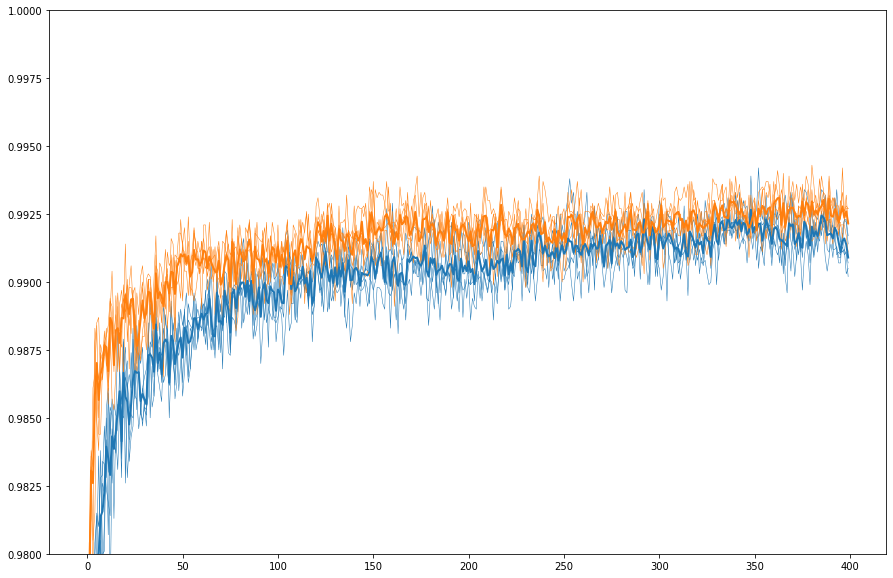

In [0]:
plt.figure(figsize = (15, 10))
plt.gca().set_ylim([0.98, 1.0])
#все графики
for model_index in range(len(models_1)):
    plt.plot(models_1_accuracy[model_index], color = 'C0', linewidth = 0.5)
for model_index in range(len(models_2)):
    plt.plot(models_2_accuracy[model_index], color = 'C1', linewidth = 0.5)
#средние значения по каждой группе
plt.plot(np.mean(models_1_accuracy, axis = 0), color = 'C0', linewidth = 2)
plt.plot(np.mean(models_2_accuracy, axis = 0), color = 'C1', linewidth = 2)
plt.show()

Мы совместили метод генерации новых обучающих данных и метод предварительного выделения линий. По сравнению с обучением без выделения линий точность выросла в среднем на 0.1%, хотя это всего лишь 10 изображений. Для более уверенного ответа на вопрос "улучшил ли точность распознавания метод предварительного выделения линий", стоило бы провести анализ изображений, которые стали распознаваться лучше - чем они разнообразнее, тем выше уверенность. Кроме того в случае предварительного выделения линий высокая точность достигается значительно быстрее: уже к 50-й итерации точность превышает 99%, а к 150-й итерации (вместо 350-й без выделения линий) точность стабилизируется на 99.2% и в дальнейшем растет лишь незначительно.

В предыдущем эксперименте мы проводили по 4 эпохи обучения на каждом обучающем наборе (всего их 100). Попробуем теперь чередовать обучающие наборы, то есть 4 раза обучить нейросеть на 100 наборах по 1 эпохе. Иными словами, зависимость номера обучающего набора от эпохи будет выглядеть не так: "1,1,1,1,2,2,2,2,3,3,3,3,...,100,100,100,100", а так: "1,2,...,100,1,2,...,100..."

In [0]:
#5 моделей, обучающихся на данных c выделением линий с чередованием обучающих наборов

models_3 = [tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (4, 24, 24)),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
]) for _ in range(models_count)]

for model in models_3:
    model.compile(
        optimizer = 'adam',
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )

models_3_accuracy = np.zeros((models_count, iterations))

#обучение моделей

for i in range(iterations):
    gc.collect()
    index = i % 100
    train_images = np.load('../numpy_saved/x_train_%d_processed.npy' % index)
    for model_index, model in enumerate(models_3):
        model.fit(train_images / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(x_val / 255.0).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        models_3_accuracy[model_index, i] = acc
        print("model %d, iteration %d, accuracy %g" % (model_index, i, acc), end = '\r')

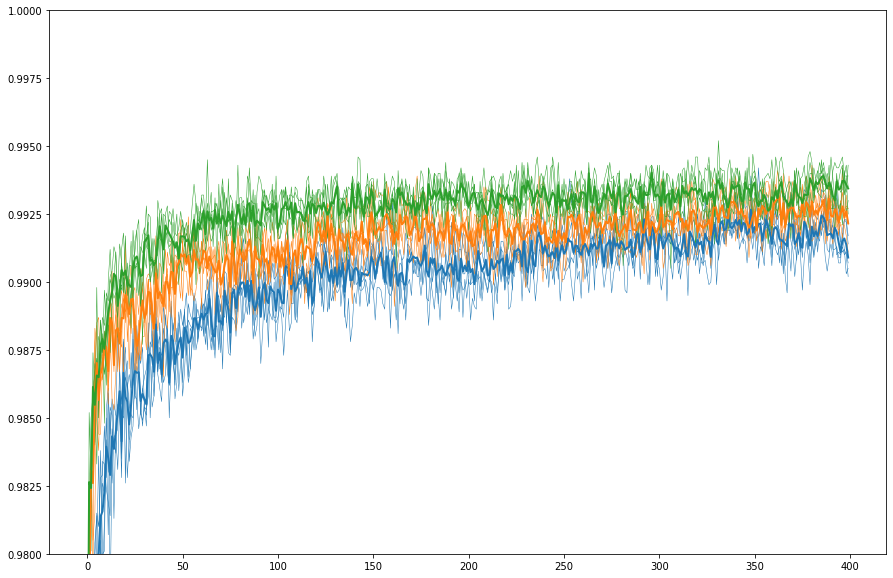

In [0]:
plt.figure(figsize = (15, 10))
plt.gca().set_ylim([0.98, 1.0])
#все графики
for model_index in range(len(models_1)):
    plt.plot(models_1_accuracy[model_index], color = 'C0', linewidth = 0.5)
for model_index in range(len(models_2)):
    plt.plot(models_2_accuracy[model_index], color = 'C1', linewidth = 0.5)
for model_index in range(len(models_3)):
    plt.plot(models_3_accuracy[model_index], color = 'C2', linewidth = 0.5)
#средние значения по каждой группе
plt.plot(np.mean(models_1_accuracy, axis = 0), color = 'C0', linewidth = 2)
plt.plot(np.mean(models_2_accuracy, axis = 0), color = 'C1', linewidth = 2)
plt.plot(np.mean(models_3_accuracy, axis = 0), color = 'C2', linewidth = 2)
plt.show()

Обучение по одной итерации на каждом наборе (не по 4) позволило еще больше увеличить точность. Это все та же полносвязная нейросеть, которая при обучении на простом наборе MNIST дает точность 98.5%. Но в данном случае входные изображения обработаны алгоритмом выделения линий (методом сходства с маской), а вместо одного обучающего набора сгенерировано 100 наборов с помощью деформаций, масштабирования и вращений.

Попробуем уменьшать learning rate с каждой эпохой, чтобы обучение на новых наборах не вносило слишком больших изменений. Таким образом, нейросеть в большей степени сохранит "память" обо всех обучающих наборах, а не только о последних.

In [0]:
#5 моделей, обучающихся на данных c выделением линий с чередованием обучающих наборов, уменьшение learning rate

models_4 = [tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (4, 24, 24)),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
]) for _ in range(models_count)]

models_4_accuracy = np.zeros((models_count, iterations))

def calc_learning_rate(epoch):
    return 0.002 / (1 + epoch / 50) #google: 0.002/(1+x/50)

#обучение моделей

for i in range(iterations):
    gc.collect()
    index = i % 100
    train_images = np.load('../numpy_saved/x_train_%d_processed.npy' % index)
    for model_index, model in enumerate(models_4):
        model.compile(
            optimizer = tf.keras.optimizers.Adam(learning_rate = calc_learning_rate(i)),
            loss = 'sparse_categorical_crossentropy',
            metrics = ['accuracy']
        )
        model.fit(train_images / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(x_val / 255.0).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        models_4_accuracy[model_index, i] = acc
        print("model %d, iteration %d, accuracy %g" % (model_index, i, acc), end = '\r')

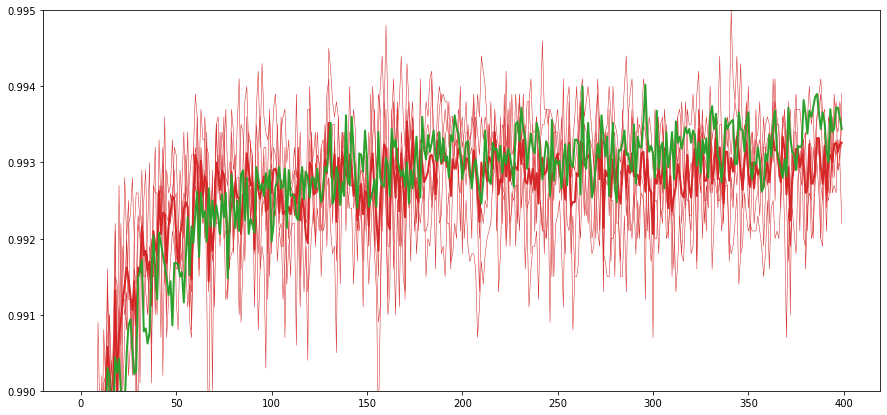

In [0]:
plt.figure(figsize = (15, 7))
plt.gca().set_ylim([0.99, 0.995])
for model_index in range(len(models_4)):
    plt.plot(models_4_accuracy[model_index], color = 'C3', linewidth = 0.5)
plt.plot(np.mean(models_4_accuracy, axis = 0), color = 'C3', linewidth = 2)
plt.plot(np.mean(models_3_accuracy, axis = 0), color = 'C2', linewidth = 2)
plt.show()

По какой-то причине уменьшение learning rate (красный график) не принесло желаемого эффекта.

Можно продолжить обработку входных данных, предоставляя нейросети данные о длинных линиях, входящих в состав изображения. Для этого нужно построить для каждого изображения новый набор данных, в котором каждый элемент - значение скалярного произведения изображения с линией заданной толщины, проведенной между некоторыми точками A и B. Но скалярное произведение изображения с длинной линией равна сумме скалярных произведений его с последовательностью коротких линий, составляющих длинную. Имея данные о скалярных произведениях изображения со всевозможными короткими линиями, мы даже могли бы вручную задать веса слою нейронов, который выделял бы длинные линии на изображении. Вопрос: возникает ли такой слой автоматически при обучении нейросети, или все же мы получим лучшие результаты, заранее выделив длинные линии?

Вообще стало более понятным преимущество операции свертки перед операцией определения сходства участка изображения с маской. Во-первых, свертка есть последовательность скалярных произведений, то есть она функционирует аналогично слою нейронов. Во-вторых при определении сходства толщина линий задана, и сходство будет низким при несовпадени толщины линий - это может быть как плюсом, так и минусом. В-третьих, свертка аддитивна, то есть можно легко выделять информацию о длинных линиях на основании информации о последовательности коротких.

Итак, следующим шагом будет модификация обучающих наборов с помощью операции свертки с четырьмя масками - вертикальной, горизонтальной и двумя диагональными линиями.

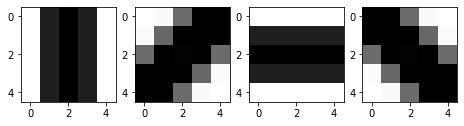

In [0]:
# сначала еще раз сгенерируем маски
mnist.draw(*lines, columns = 8)

Сравнение свертки (столбцы 2-5) и операции определения "похожести" (столбцы 6-9):


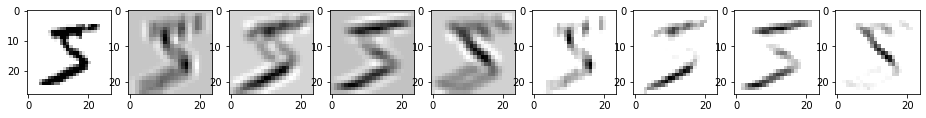

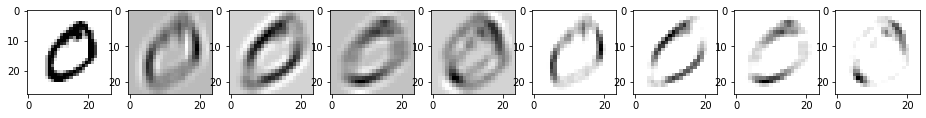

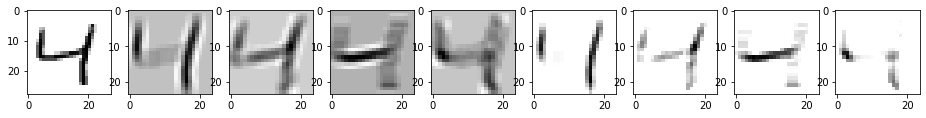

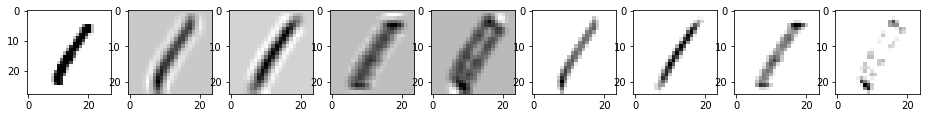

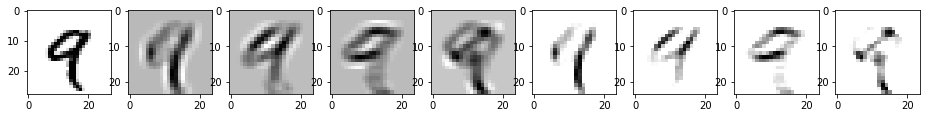

Времени на обработку 1000 изображений:
1.1468784809112549
Формат полученных данных:
(1000, 4, 24, 24)


In [0]:
from scipy.signal import convolve2d

#в свертке должны быть положительные и отрицательные компоненты, иначе это будет просто размытие
lines_float = [(line.astype(float) - 128) * 2 for line in lines]

def conv_preprocessing(img):
    return np.array([convolve2d(img.astype(float), mask, mode = 'valid') / 1e6 / 1.031 for mask in lines_float])

print('Сравнение свертки (столбцы 2-5) и операции определения "похожести" (столбцы 6-9):')
mnist.init()
for i in range(5):
    img = mnist.x_train[i]
    processed_img = conv_preprocessing(img)
    mnist.draw(img, *processed_img, *get_lines_data(img), columns = 9)

from joblib import Parallel, delayed
import time

print("Времени на обработку 1000 изображений:")
start_time = time.time()
x = Parallel(n_jobs = 8)(delayed(conv_preprocessing)(img) for img in mnist.x_train[:1000])
print(time.time() - start_time)

print("Формат полученных данных:")
print(np.array(x).shape)

Свертка дает не такие "наглядные" результаты, как операция определения сходства, но выполняется быстрее. Нам также ничего не мешает выполнять сначала определение сходства, а затем свертку, или выполнять свертку на результатах предыдущей свертки, т. е. способы предварительной обработки можно комбинировать как угодно.

Обработаем все обучающие примеры с помощью свертки, а затем обучим на этих данных группу нейросетей.

In [0]:
import gc

for i in range(100):
    gc.collect()
    train_images = np.load('../numpy_saved/x_train_%d.npy' % i)
    #print("свертка", i)
    train_images2 = np.array(Parallel(n_jobs = 8)(delayed(conv_preprocessing)(img) for img in train_images))
    #сжатие до uint8
    train_images2 = np.clip(train_images2 * 255, 0, 255).astype(np.uint8)
    #print("сохранение", i)
    np.save('../numpy_saved/x_train_%d_convolved.npy' % i, train_images2)

test_images = mnist.x_val
test_images2 = np.array(Parallel(n_jobs = 8)(delayed(conv_preprocessing)(img) for img in test_images))
test_images2 = np.clip(test_images2 * 255, 0, 255).astype(np.uint8)
np.save('../numpy_saved/x_val_convolved.npy', test_images2)

In [0]:
#обучим одну модель, обучающихся на данных c выделением линий сверткой, в течение 100 итераций

models_count = 1
iterations = 100

models_5 = [tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape = (4, 24, 24)),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
]) for _ in range(models_count)]

for model in models_5:
    model.compile(
        optimizer = 'adam',
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )

models_5_accuracy = np.zeros((models_count, iterations))

#обучение моделей

x_val = np.load('../numpy_saved/x_val_convolved.npy')
for i in range(iterations):
    gc.collect()
    index = i % 100
    train_images = np.load('../numpy_saved/x_train_%d_convolved.npy' % index)
    for model_index, model in enumerate(models_5):
        model.fit(train_images / 255.0, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(x_val / 255.0).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        models_5_accuracy[model_index, i] = acc
        print("model %d, iteration %d, accuracy %g" % (model_index, i, acc), end = '\r')

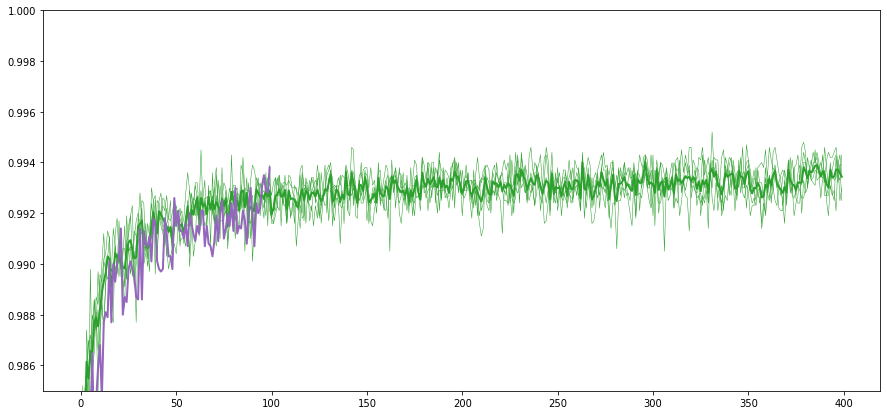

In [0]:
plt.figure(figsize = (15, 7))
plt.gca().set_ylim([0.985, 1])
for model_index in range(len(models_3)):
    plt.plot(models_3_accuracy[model_index], color = 'C2', linewidth = 0.5)
for model_index in range(len(models_5)):
    plt.plot(models_5_accuracy[model_index], color = 'C4', linewidth = 0.5)
plt.plot(np.mean(models_3_accuracy, axis = 0), color = 'C2', linewidth = 2)
plt.plot(np.mean(models_5_accuracy, axis = 0), color = 'C4', linewidth = 2)
plt.show()

Как видим, предварительная обработка методом свертки дает почти такие же результаты, как обработка методом сходства с маской. Библиотека keras имеет возможность добавлять в нейросеть сверточные слои, и если сделать веса такого слоя необучаемыми, то мы получим аналогичную модель вычислений. То есть мы встроим предварительную обработку в саму нейросеть.

Тензор весов имеет размерность: (5, 5, 1, 4)
Формат входных данных: (1, 28, 28, 1)
Формат выходных данных: (1, 24, 24, 4)
Результат:


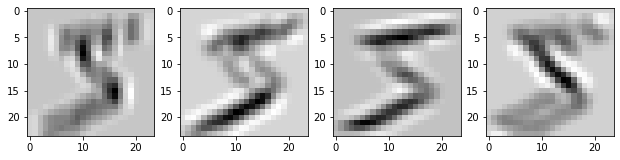

Свертка scipy.signal.convolve2d для сравнения:


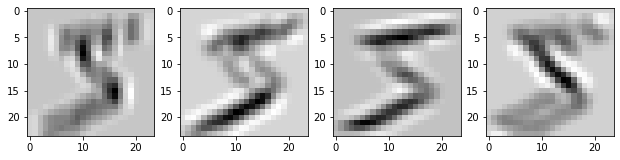

In [0]:
conv_layer = tf.keras.layers.Conv2D(filters = 4, kernel_size = 5, use_bias = False, 
                                    input_shape = (28, 28, 1), activation = 'linear', trainable = False)
tf.keras.models.Sequential([conv_layer]) #чтобы можно было считать веса
conv_weights = conv_layer.get_weights()[0]
print("Тензор весов имеет размерность:", conv_weights.shape)
for i in range(4):
    conv_weights[:, :, 0, i] = lines_float[i]
conv_layer.set_weights([conv_weights])

img = mnist.x_train[0][np.newaxis, :, :, np.newaxis].astype(np.float32)
print("Формат входных данных:", img.shape)
img_convolved = conv_layer(img)
print("Формат выходных данных:", img_convolved.shape)
results = [img_convolved[0, :, :, i] for i in range(4)]
print("Результат:")
mnist.draw(*results, columns = 6)
print("Свертка scipy.signal.convolve2d для сравнения:")
mnist.draw(*conv_preprocessing(mnist.x_train[0]), columns = 6)

In [0]:
#обучим 5 моделей, обучающихся на данных c выделением линий сверткой (встроенной в нейросеть), в течение 400 итераций

models_count = 5
iterations = 400

models_5 = [tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters = 4, kernel_size = 5, use_bias = False, 
                    input_shape = (28, 28, 1), activation = 'linear', trainable = False,
                    kernel_initializer = lambda shape, dtype: conv_weights), #пересоздаем слой
    tf.keras.layers.Flatten(),
    tf.keras.layers.LayerNormalization(axis = 1, epsilon = 0, center = False, scale = True,
                    gamma_initializer = tf.keras.initializers.Constant(0.25), trainable = False),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
]) for _ in range(models_count)]

models_5[0].summary()

for model in models_5:
    model.compile(
        optimizer = 'adam',
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )

models_5_accuracy = np.zeros((models_count, iterations))

#обучение моделей

x_val = mnist.x_val[:, :, :, np.newaxis]
for i in range(iterations):
    gc.collect()
    index = i % 100
    train_images = np.load('../numpy_saved/x_train_%d.npy' % index)[:, :, :, np.newaxis]
    for model_index, model in enumerate(models_5):
        model.fit(train_images, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(x_val).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        models_5_accuracy[model_index, i] = acc
        print("model %d, iteration %d, accuracy %g" % (model_index, i, acc), end = '\r')

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 24, 24, 4)         100       
_________________________________________________________________
flatten_1 (Flatten)          (None, 2304)              0         
_________________________________________________________________
layer_normalization_1 (Layer (None, 2304)              2304      
_________________________________________________________________
dense_5 (Dense)              (None, 300)               691500    
_________________________________________________________________
dense_6 (Dense)              (None, 200)               60200     
_________________________________________________________________
dense_7 (Dense)              (None, 100)               20100     
_________________________________________________________________
dense_8 (Dense)              (None, 50)               

In [0]:
#for i, model in enumerate(models_5):
#    model.save('../networks/mdl %d.h5' % i)

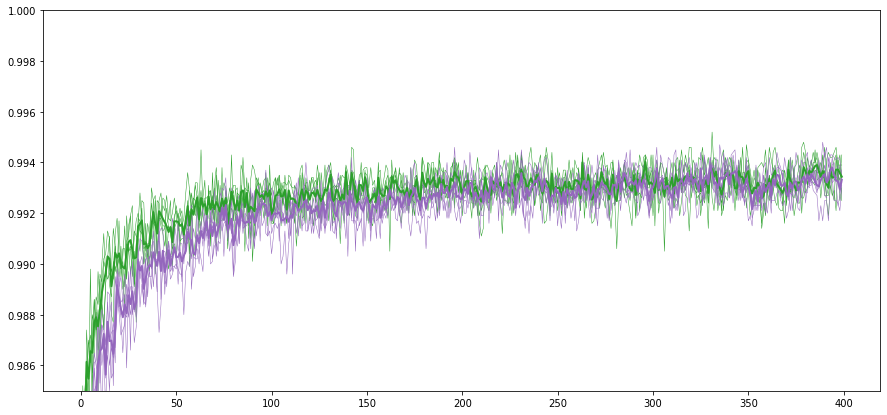

In [0]:
plt.figure(figsize = (15, 7))
plt.gca().set_ylim([0.985, 1])
for model_index in range(len(models_3)):
    plt.plot(models_3_accuracy[model_index], color = 'C2', linewidth = 0.5)
for model_index in range(len(models_5)):
    plt.plot(models_5_accuracy[model_index], color = 'C4', linewidth = 0.5)
plt.plot(np.mean(models_3_accuracy, axis = 0), color = 'C2', linewidth = 2)
plt.plot(np.mean(models_5_accuracy, axis = 0), color = 'C4', linewidth = 2)
plt.show()

Зеленый график - обработка с помощью операции сходства с маской, фиолетовый график - обработка с помощью операции свертки. Свертка дает такой же результат, но сходится медленнее. Теперь сделаем веса сверточного слоя тренируемыми.

In [0]:
#обучим 5 моделей, обучающихся на данных c выделением линий сверткой (встроенной в нейросеть), в течение 400 итераций,
#с разблокированными весами сверточного слоя

models_count = 5
iterations = 400

models_6 = [tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters = 4, kernel_size = 5, use_bias = True, 
                    input_shape = (28, 28, 1), activation = 'tanh', trainable = True,
                    kernel_initializer = lambda shape, dtype: conv_weights / 255),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(200, activation = 'relu'),
    tf.keras.layers.Dense(100, activation = 'relu'),
    tf.keras.layers.Dense(50, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'sigmoid')
]) for _ in range(models_count)]

for model in models_6:
    model.compile(
        optimizer = 'adam',
        loss = 'sparse_categorical_crossentropy',
        metrics = ['accuracy']
    )

models_6_accuracy = np.zeros((models_count, iterations))

# mdl = models_6[0]
# data0 = mnist.x_train[:1][:, :, :, np.newaxis].astype(float) / 255
# data1 = mdl.layers[0](data0)
# print(data1[0, :, :, 0])
# return

#обучение моделей

x_val = mnist.x_val[:, :, :, np.newaxis].astype(float) / 255
for i in range(iterations):
    gc.collect()
    index = i % 100
    train_images = np.load('../numpy_saved/x_train_%d.npy' % index)[:, :, :, np.newaxis].astype(float) / 255
    for model_index, model in enumerate(models_6):
        model.fit(train_images, mnist.y_train, epochs = 1, verbose = 0, batch_size = 200)
        prediction = model.predict(x_val).argmax(axis = 1)
        acc = accuracy_score(mnist.y_val, prediction)
        models_6_accuracy[model_index, i] = acc
        print("model %d, iteration %d, accuracy %g" % (model_index, i, acc), end = '\r')

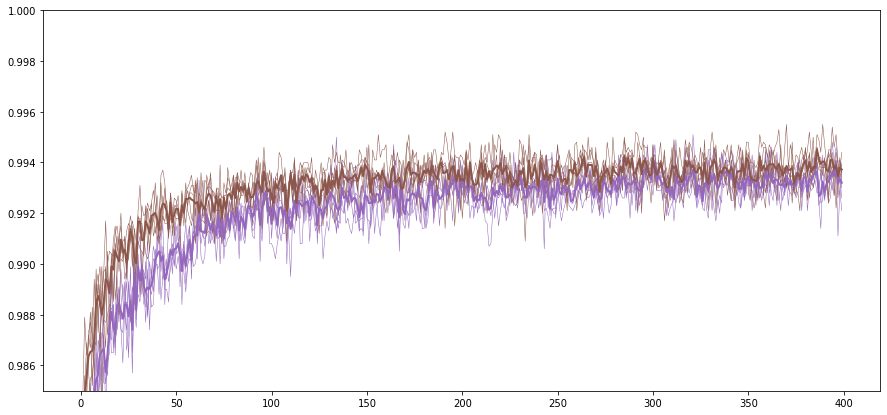

In [0]:
plt.figure(figsize = (15, 7))
plt.gca().set_ylim([0.985, 1])
for model_index in range(len(models_5)):
    plt.plot(models_5_accuracy[model_index], color = 'C4', linewidth = 0.5)
for model_index in range(len(models_6)):
    plt.plot(models_6_accuracy[model_index], color = 'C5', linewidth = 0.5)
plt.plot(np.mean(models_5_accuracy, axis = 0), color = 'C4', linewidth = 2)
plt.plot(np.mean(models_6_accuracy, axis = 0), color = 'C5', linewidth = 2)
plt.show()

Сеть с обучаемыми весами свертки (коричневый график) показывает себя лучше по сравнению с сетью с фиксированными весами свертки (фиолетовый график). По сравнению с пред-обработкой изображения методом сходства с масками, сеть с обучаемыми весами свертки тоже работает лучше, хоть и незначительно (в среднем +0.02% точности, то есть +2 правильно распознаваемых изображения).

Алгоритмы оптимизации нейронных сетей созданы для улучшения их точности, и в данном случае они выполняют свою роль и способны оптимизировать ядра свертки. Таким образом, мы плавно перешли к сверточным нейросетям, хотя изначально целью данного ноутбука было изучение нейронных сетей, которые обучаются и функционируют как полносвязные.

Посмотрим, как изменились ядра сверток в процессе обучения (по 4 ядра для каждой из 5 моделей).

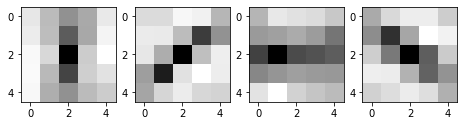

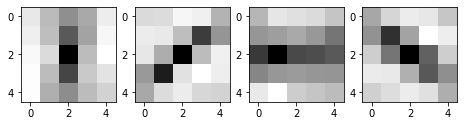

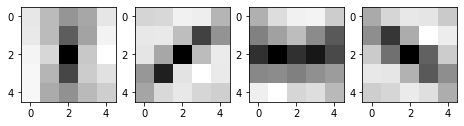

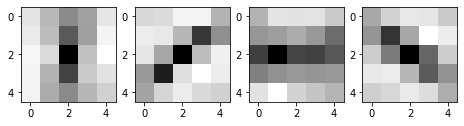

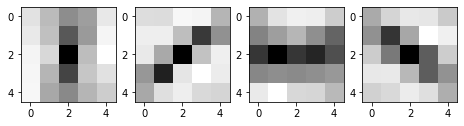

In [0]:
for model in models_6:
    weights = model.layers[0].get_weights()[0]
    mnist.draw(*[weights[:, :, 0, i] for i in range(4)], columns = 8)

### Общие рассуждения <a class="anchor" id="neuro_other"></a>

Можно придумать еще много экспериментов, которые позволят улучшить точность нейросетей или какие-то еще характеристики, а также больше понять о том, как нейросети обучаются. Например:

1. Обучаем нейросети на данных с шумами, тестируем на данных без шумов. Повлияет ли это на точность распознавания? Однако будучи примененным к полносвязным нейросетям, этот метод может дать обратный эффект: нейросети не будут распознавать изображения без шумов, потому что какие-то внутренние параметры привязаны к наличию шумов. Но в сверточных нейросетях такого быть не должно, поскольку свертка близка к операции размытия.

2. Обучаем нейросети на распознавание букв, затем перестаем обучать буквами и обучаем только на распознавание цифр. Помогут ли какие-то признаки, выделяемые при обучении на буквах, распознаванию цифр? Может ли такой метод оказаться эффективнее, чем обучение изначально только на цифрах?

3. Пусть нейросеть имеет 28*28 = 768 входов. Если добавить к ним новые входы, на которые всегда подавать случайный шум, быстро ли нейросеть научится игнорировать эти входы?

4. Можно подумать о добавлении сквозных или обратных связей в нейросети (хотя с первого взгляда непонятны мотивы, детали и последствия такого действия).

5. Можно обучить 10 нейросетей, каждая из которых будет распознавать по одной цифре, отличая ее от остальных. Или даже 45 нейросетей, каждая из которых умеет различать две разные цифры. Затем, имея ответы всех нейросетей, выбирать окончательнй ответ.

6. Можно ли улучшить точность или скорость обучения многослойной нейросети, если сначала обучать нейросеть с меньшим числом слоев, а затем в уже обученную нейросеть добавлять новые слои и обучать заново?

7. Нейросети и другие алгоритмы машинного обучения, как мы знаем, приспособлены для поиска скрытых закономерностей. Можно ли их приспособить для анализа других нейросетей, в первую очередь получения информации о свойствах промежуточных слоев, сильных и слабых местах обученной нейросети. Идея сама по себе красивая, но возникают проблемы. Во-первых, алгоритмам машинного обучения обычно требуется много примеров, особенно если имеется много входных данных. Если же каждый пример будет обученной нейросетью, то генерация таких примеров может быть длительной. Во-вторых, алгоритмы хоть и способны выявлять скрытые закономерности, но не приспособлены для того, чтобы их "объяснять", то есть формировать понятные человеку рассуждения. Но все же предложим один способ использования нейросетей-помощников. Пусть мы обучаем нейросеть А. Пусть нейросеть (или другой алгоритм) Б умеет оценивать, какие изображения распознаются нейросетью А лучше или хуже. Тогда мы можем тренировать нейросеть А такими изображениями, которые распознаются хуже, пока этот недостаток в распознавании не будет исправлен.

Вообще перечисленные пункты, кроме последнего, направлены в основном на изучение свойств нейросетей, а не на практическое применение. На практике же, вероятно, возникнут совсем другие задачи:

1. Как выделить область на изображении, где находится число (скажем, номер дома)?

2. Если цвет цифры не совпадает с цветом фона, но при переводе в черно-белое изображение цифра сливается с фоном, то как организовать распознавание? Есть ли более вдумчивые методы, чем просто передача всех цветовых каналов на входы нейросети?

3. Что делать, если цифра зачеркнута, пересечена линиями другого цвета или толщины, освещена неравномерно? Или например верхняя половина восьмерки нарисована цветной линией, а нижняя границей цветов? Или цифра стилизована, например у восьмерки верхняя половина значительно больше нижней?

4. Как научить алгоритм распознавания отличать цифры от букв исходя из контекста?

И так далее. При попытке реального применения алгоритмов распознавания возникает необозримый круг проблем. Хочется отдельно отметить две основные, на мой взгляд, проблемы обученных ранее нейросетей.

**Во-первых**, нет полной уверенности в инвариантности распознавания по сдвигам и масштабированию. Нет гарантии, что при сдвиге цифры по горизонтали или вертикали нейросеть внезапно не перестанет правильно ее распознавать. Смотря на матрицы весов первого слоя, можно понять, что отклик каждого нейрона первого слоя значительно меняется при сдвигах, и вовсе не факт, что нейроны следующих слоев формируют признаки, совсем не зависящие от положения цифры. Да, мы обучали нейросеть на по-разному сдвинутых изображениях, но в каких-то случаях нейросеть все равно может выдавать совершенно ошибочные результаты (это можно проверить).

Человек, например, распознает изображения не зависимо от их точного местоположения в поле зрения, хотя всегда неосознанно и иногда даже против воли старается перевести в центр поля зрения объект, на котором сосредоточено внимание, взглянуть на него прямо. Также человек может мысленно вращать, масштабировать и искажать увиденные предметы. Если мы найдем способ обучить этому нейросеть, то приблизимся к одной из целей: инвариантности зрения по аффинным преобразованиям. Возможно для такой задачи нам понадобятся сети, в которых выходы подаются на входы.

Есть более простой способ обеспечить большую инвариантность по сдвигам: при обучении в каждом батче можно заменять каждое изображение на набор изображений, получаемых всеми возможными сдвигами по горизонтали и вертикали (+-5 пикселей -> 100 изображений). Но тогда размер каждого батча увеличится в 100 раз, что замедлит обучение. Зато нейросеть точно будет инвариантна по сдвигам в некоторых пределах.

**Во-вторых**, нейросети, с которыми мы работали выше, описывают прямой путь от пикселей до распознанных цифр. Неизвестно, что за признаки формируются в промежуточных слоях, и являются ли они человеко-понятными. Вполне вероятно, что каждый признак в промежуточных слоях представляет собой набор отрывочных суждений. Иными словами, если изображение можно описать с помощью N логических признаков, то каждый нейрон промежуточных слоев скорее всего содержит в себе смесь всех этих признаков в разных пропорциях. Это как если бы на застолье подавалось 10 блюд, и в каждое их них была бы добавлена частица всех остальных.

Это конечно лишь предположение. Но пока не обсуждалось никакого способа выделения промежуточных простых человеко-понятных признаков, вроде информации о взаимном местоположении линий. Спроси, например, человека, почему на изображении нарисована та или иная цифра: он расскажет о взаимном расположении линий и объяснит, что в такой-то цифре линии должны располагаться именно так. Наши нейросети пока так делать не могут.

Выделение промежуточных признаков, описывающих изображение на разных уровнях абстракции, важно еще и потому, что нейросеть, способная на такое, будет быстрее учиться распознаванию новых предметов: человеку для этого достаточно одного обучающего примера.

Человек легко распознает линии даже в сложных случаях потому, что понимает процесс их рисования. При обучении нейросети же цифры предстают просто как пятна непонятного происхождения. Возможно, если обучить нейросеть рисованию цифр, мы приблизимся к задаче выявления промежуточной информации о линиях при распознавании? Обучающими данными для рисования могут быть пары (намерение, результат).

*Намерение* - данные о том, какие линии мы хотим рисовать. Например, последовательность опорных точек и сила нажатия для каждой опорной точки. Нейросети больше приспособлены к входам и выходам логического типа, поэтому намерение стоит как-то представить в виде набора логических переменных (да/нет), что само по себе непросто. Кроме того, число опорных точек может быть разным, а рассмотренные выше нейросети имеют фиксированное число входов и выходов. Так что возможно придется каким-то образом подавать выходы на входы, каждый раз добавляя по одной новой опорной точке.

*Результат* - набор пикселей нарисованного изображения. Однако рассматривать его статично может быть ошибкой. Даже человек, рисуя (а также распознавая) объекты, видит их многократно с разных ракурсов, при этом активируются разные рецепторы и связанные с ними нейроны.

В общем, перечисленные выше задачи, от рисования цифр до использования нейросетей-помощников, получаются сложными, и в данном ноутбуке мы заниматься ими не будем. Последняя задача, например, совершенно необьятна: в идеале хотелось бы сделать так, чтобы "компьютер обучал компьютер" так же, как это делает программист; однако тогда можно потерять понимание того, что вообще происходит в этой системе. Сейчас у нас есть еще набор ранее поставленных нерешенных задач из раздела "Дальнейшие задачи".

1. Выше мы обучали нейросети (300-200-100-50-adam), использующие предварительную обработку изображения с помощью операции определения схожести с 4 масками или сверток с 4 масками, с фиксированными или обучаемымии ядрами. Эти сети после обучения на 100 наборах по 60000 изображений в течение 400 итераций достигают средней точности 99.1-99.4%, максимальной до 99.5%. Хотелось бы узнать, как выглядят нераспознаваемые ими примеры, а также как меняются ответы таких нейросетей при аффинных преобразованиях входных изображений.

2. Попробуем увеличить точность распознавания, заменяя каждое тестовое изображение на набор его аффинных трансформаций, и анализируя все полученные результаты.

3. Попробуем увеличить точность распознавания, используя голосование нейросетей или дополнительную нейросеть, которая выдает окончательный ответ.

4. Попробуем подобрать оптимальные параметры и обучить нейросети, используя отбор или генетический алгоритм.

### Повторный анализ свойств обученной нейросети <a class="anchor" id="neuro_analysis_2"></a>

В предыдущем анализе мы изучали, как влияют на распознавание трансформации изображения, как распознается шум или несуществующие цифры. На этот раз мы рассмотрим нейросеть с предварительным выделением линий. Обучим такую нейросеть и посмотрим, как выглядят неправильно распознаваемые ей цифры.

In [0]:
neuron_outputs = [model.predict(x_val) for model in models_5]
predictions = [output.argmax(axis = 1) for output in neuron_outputs]
right_answers_count = np.zeros(10000)
for prediction in predictions:
    for i in range(10000):
        if prediction[i] == mnist.y_val[i]:
            right_answers_count[i] += 1
how_many_right = [np.where(right_answers_count == i) for i in range(6)]
for i in range(6):
    print("Кол-во чисел, которые %d/5 нейросетей распознали правильно:" % i, len(how_many_right[i][0]))

Кол-во чисел, которые 0/5 нейросетей распознали правильно: 18
Кол-во чисел, которые 1/5 нейросетей распознали правильно: 14
Кол-во чисел, которые 2/5 нейросетей распознали правильно: 18
Кол-во чисел, которые 3/5 нейросетей распознали правильно: 28
Кол-во чисел, которые 4/5 нейросетей распознали правильно: 74
Кол-во чисел, которые 5/5 нейросетей распознали правильно: 9848


Числа, которые 0/5 нейросетей распознали правильно:


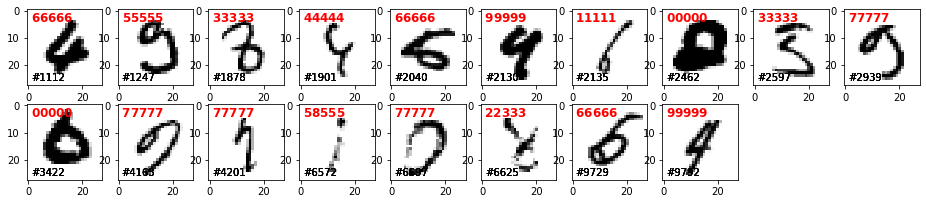

Числа, которые 1/5 нейросетей распознали правильно:


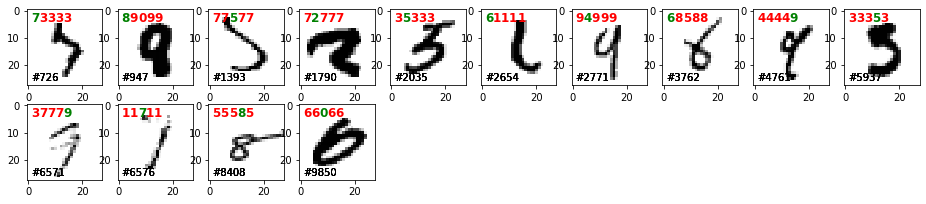

Числа, которые 2/5 нейросетей распознали правильно:


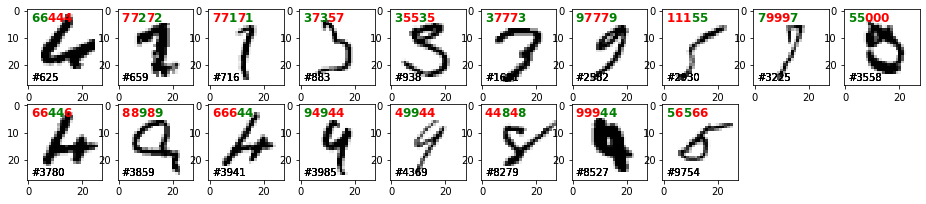

Числа, которые 3/5 нейросетей распознали правильно:


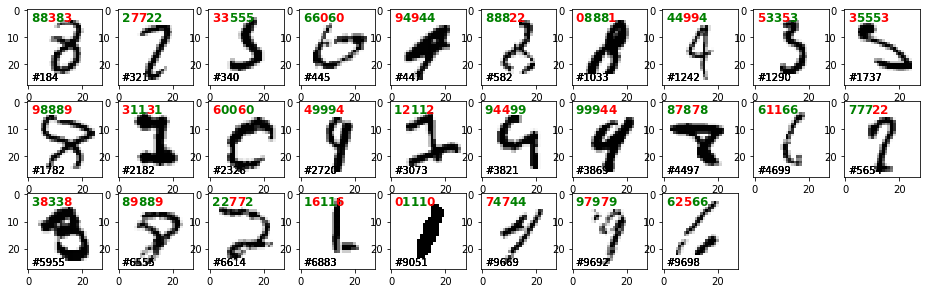

Числа, которые 4/5 нейросетей распознали правильно:


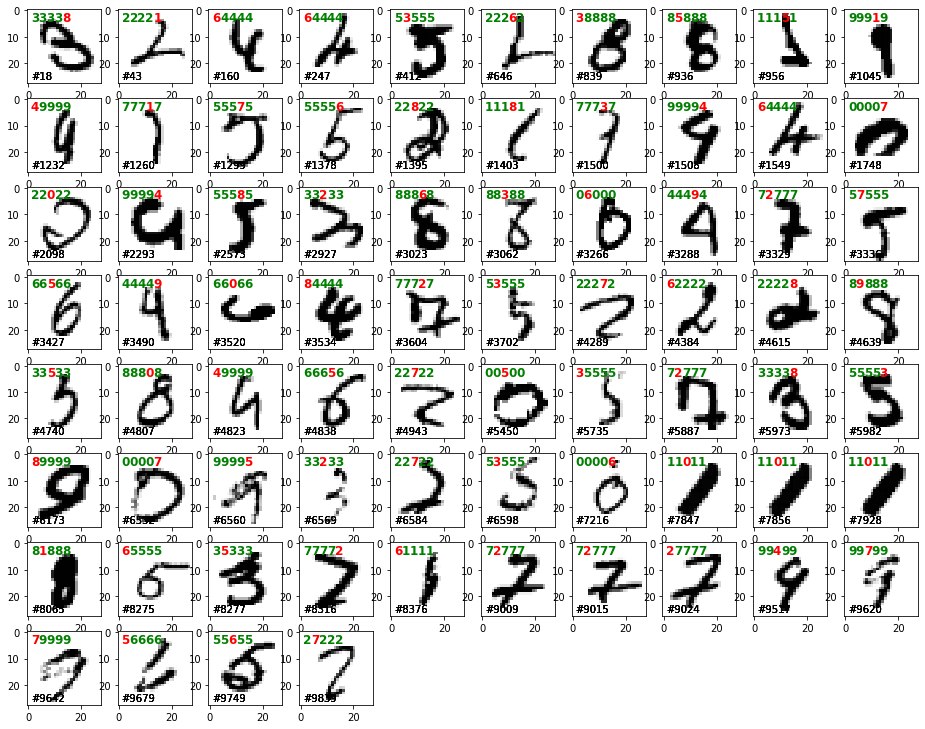

In [0]:
for i in range(5):
    print("Числа, которые %d/5 нейросетей распознали правильно:" % i)
    columns = 10
    #####################
    rows = math.ceil(len(how_many_right[i][0]) / columns)
    fig = plt.figure()
    fig.set_figwidth(16)
    fig.set_figheight(16 * rows / columns)
    subplot_index = 0
    for digit_index in how_many_right[i][0]:
        fig.add_subplot(rows, columns, subplot_index + 1)
        subplot_index += 1
        plt.imshow(mnist.x_val[digit_index], cmap = plt.cm.binary, interpolation = 'nearest')
        #digit_index = 
        for model_index in range(5):
            prediction = predictions[model_index][digit_index]
            answer = mnist.y_val[digit_index]
            color = 'green' if prediction == answer else 'red'
            plt.text(1 + 3 * model_index, 4, prediction, fontsize = 12, fontweight = 'bold', color = color)
        plt.text(1, 26, '#%d' % digit_index, fontsize = 10)
    plt.show()

Во-первых поблагодарим нейросети за те числа, которые они распознали, среди которых тоже немало сложных примеров. Как видим, в большинстве наиболее сложных примеров возникает систематическая ошибка, когда все нейросети распознают одно и то же неверное число. Попробуем распознавать не исходное тестовое изображение, а 25 его случайны деформаций, и выбирать наиболее часто встречающийся ответ нейросети. Для этого сначала сгенерируем 25 тестовых наборов с деформациями.

In [0]:
for i in range(25):
    gc.collect()
    x_val_deformed = [None] * 10000
    for j in range(10000):
        while True:
            x_val_deformed[j] = mnist.edit(mnist.x_val[j], mnist.Deform(3, 0.3))
            if mnist.fits(x_val_deformed[j]):
                break
    filename = '../numpy_saved/x_val_deformed_%d' % i
    print(filename)
    np.save(filename, x_val_deformed)

../numpy_saved/x_val_deformed_0
../numpy_saved/x_val_deformed_1
../numpy_saved/x_val_deformed_2
../numpy_saved/x_val_deformed_3
../numpy_saved/x_val_deformed_4
../numpy_saved/x_val_deformed_5
../numpy_saved/x_val_deformed_6
../numpy_saved/x_val_deformed_7
../numpy_saved/x_val_deformed_8
../numpy_saved/x_val_deformed_9
../numpy_saved/x_val_deformed_10
../numpy_saved/x_val_deformed_11
../numpy_saved/x_val_deformed_12
../numpy_saved/x_val_deformed_13
../numpy_saved/x_val_deformed_14
../numpy_saved/x_val_deformed_15
../numpy_saved/x_val_deformed_16
../numpy_saved/x_val_deformed_17
../numpy_saved/x_val_deformed_18
../numpy_saved/x_val_deformed_19
../numpy_saved/x_val_deformed_20
../numpy_saved/x_val_deformed_21
../numpy_saved/x_val_deformed_22
../numpy_saved/x_val_deformed_23
../numpy_saved/x_val_deformed_24


In [0]:
neuron_outputs = []
for i in range(25):
    images = np.load('../numpy_saved/x_val_deformed_%d.npy' % i)[:, :, :, np.newaxis]
    neuron_outputs.append([model.predict(images) for model in models_5])
    gc.collect()
neuron_outputs = np.array(neuron_outputs)
#neuron_outputs: номер набора, номер нейросети, номер изображения, номер нейрона
predictions = neuron_outputs.argmax(axis = 3)
#predictions: номер набора, номер нейросети, номер изображения

final_predictions = [None] * len(models_5)
for model_index in range(len(models_5)):
    final_predictions[model_index] = np.zeros(10000)
    for image_index in range(10000):
        predictions_for_image = predictions[:, model_index, image_index]
        final_predictions[model_index][image_index] = int(np.argmax(np.bincount(predictions_for_image)))

final_predictions = np.array(final_predictions, dtype = np.uint8);
#final_predictions: номер модели, номер изображения

In [0]:
for model_index in range(len(models_5)):
    print("Модель %d: точность: %g" % (model_index, accuracy_score(mnist.y_val,
            models_5[model_index].predict(mnist.x_val[:, :, :, np.newaxis]).argmax(axis = 1))))
for model_index in range(len(models_5)):
    model_accuracy = accuracy_score(mnist.y_val, final_predictions[model_index])
    print("Модель %d: точность с применением деформаций: %g" % (model_index, model_accuracy))

right_answers_count = np.zeros(10000)
for prediction in final_predictions:
    for i in range(10000):
        if prediction[i] == mnist.y_val[i]:
            right_answers_count[i] += 1
how_many_right = [np.where(right_answers_count == i) for i in range(6)]
for i in range(6):
    print("Кол-во чисел, которые %d/5 нейросетей распознали правильно:" % i, len(how_many_right[i][0]))

final_prediction_voting = np.zeros(10000)
for i in range(10000):
    predictions_for_image = final_predictions[:, i]
    voting_result = np.argmax(np.bincount(predictions_for_image))
    final_prediction_voting[i] = voting_result
voting_accuracy = accuracy_score(mnist.y_val, final_prediction_voting)
print("Точность по результатам голосования нейросетей:", voting_accuracy)

Модель 0: точность: 0.9937
Модель 1: точность: 0.9931
Модель 2: точность: 0.9935
Модель 3: точность: 0.9933
Модель 4: точность: 0.9934
Модель 0: точность с применением деформаций: 0.9941
Модель 1: точность с применением деформаций: 0.9943
Модель 2: точность с применением деформаций: 0.9951
Модель 3: точность с применением деформаций: 0.9943
Модель 4: точность с применением деформаций: 0.9949
Кол-во чисел, которые 0/5 нейросетей распознали правильно: 28
Кол-во чисел, которые 1/5 нейросетей распознали правильно: 12
Кол-во чисел, которые 2/5 нейросетей распознали правильно: 6
Кол-во чисел, которые 3/5 нейросетей распознали правильно: 15
Кол-во чисел, которые 4/5 нейросетей распознали правильно: 37
Кол-во чисел, которые 5/5 нейросетей распознали правильно: 9902
Точность по результатам голосования нейросетей: 0.9954


Числа, которые нейросети по голосованию распознали неправильно:


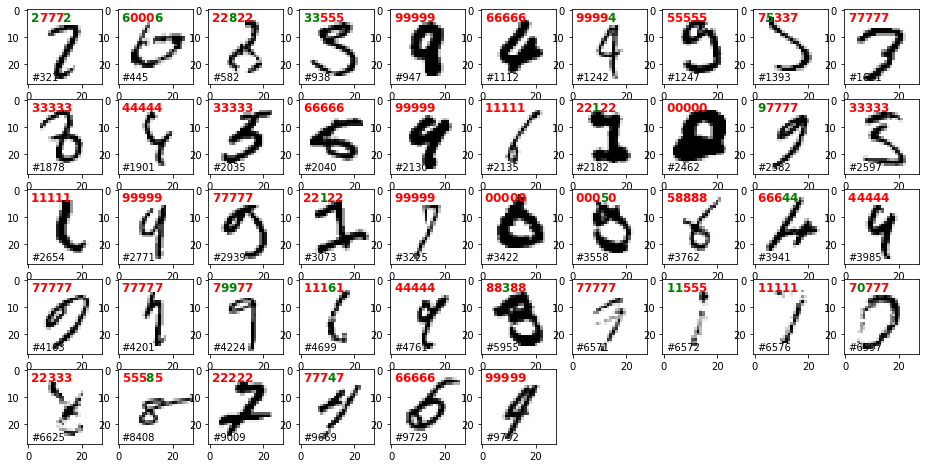

In [0]:
hard_examples = np.where(mnist.y_val != final_prediction_voting)
print("Числа, которые нейросети по голосованию распознали неправильно:")
columns = 10
#####################
rows = math.ceil(len(hard_examples[0]) / columns)
fig = plt.figure()
fig.set_figwidth(16)
fig.set_figheight(16 * rows / columns)
subplot_index = 0
for digit_index in hard_examples[0]:
    fig.add_subplot(rows, columns, subplot_index + 1)
    subplot_index += 1
    plt.imshow(mnist.x_val[digit_index], cmap = plt.cm.binary, interpolation = 'nearest')
    for model_index in range(5):
        prediction = final_predictions[model_index][digit_index]
        answer = mnist.y_val[digit_index]
        color = 'green' if prediction == answer else 'red'
        plt.text(1 + 3 * model_index, 4, prediction, fontsize = 12, fontweight = 'bold', color = color)
    plt.text(1, 26, '#%d' % digit_index, fontsize = 10)
plt.show()

Выводы:
1. Распознавание с помощью 25 деформаций с выбранными параметрами уменьшает количество неправильно распознанных примеров в среднем на 15-20% (в среднем от 0.65% до 0.55%). Это все же не дает нейросети больше "понимания", на многих сложных примерах все еще остается систематическая ошибка.
2. Голосование по 5 нейросетям дает прирост точности, но незначительный из-за систематической ошибки в их ответах.
3. Нейросети игнорируют слабо прорисованные линии. Это понятно, учитывая принцип их функционирования, но неправильно исходя из поставленной задачи. Возможно, точность можно было бы повысить, заменив все плохо прорисованные пиксели на полностью закрашенные.
4. Некоторые цифры распознаются как совершенно непохожие на них. Вспомним, что в проведенных ранее тестах даже шум уверенно распознавался как некие цифры (видимо, данный вектор полостью попадал в один из 10 классов, на которые нейросеть разделила все пространство изображений).

Точность была бы существенно выше, если бы нейросеть по форме линий и незначительным деталям умела бы распознавать движения рисовавшего. Например, "хвост" из тусклых пикселей позволяет предположить наличие здесь непрорисованной линии; незначительный выступ справа и ровность нижней горизонтальной линии позволяет отличить девятку от четверки, и т. д.

Увеличивая размеры нейросети, количество обучающих примеров, количество нейросетей в голосовании, количество модификаций тестовых примеров можно было бы достичь еще более высокой точности распознвания. Однако это будет лишь количественное, а не качественное улучшение. Кроме того, все методы предварительной обработки, генерации обучающих примеров деформациями, деформации тестовых примеров, голосований и прочих "поддерживающих костылей" для недостаточно хорошей архитектуры нежелательны, больше хотелось бы улучшить именно нейросеть.

Вспомним, что нейросети, результаты работы которых рассмотрены выше, имеют один нетренируемый сверточный слой. Разблокировка весов сверточого слоя, увеличение количества сверточных слоев могло бы быть именно таким методом, какой мы ищем: методом улучшения архитектуры нейросети.

Но все же даже при наличии сверточных слоев нейросеть, вероятно, смотрит "равномерно" на все изображение: чем больше и заметнее какая-то деталь, тем большее влияние она окажет на ответ нейросети (вспомним, как нейросети игнорировали плохо прорисованные линии). Однако в случае распознавания цифр, как сказано выше, незначительные детали вроде выступа или выщербины помогают сделать вывод о движениях рисовавшего и найти ответ в сложных случаях. То есть нейросети нужна возможность фиксации внимания на каких-то ключевых деталях. Для этого в нейросети нужны обратные связи или повторные проходы по слоям: на первом проходе определяется, на чем заострить внимание, на втором проходе внимание заостряется на выбранных входах или промежуточных нейронах. В качестве альтернативы, если внимание зарождается в слое A, то можно подавать входы (или выходы первого слоя, выделяющие простые детали) также и на слой A+1, тогда будет возможность проанализировать эти данные с помощью неравномерно распределенного внимания.

<img src="files/image4.png">

Я слышал, что в современных системах компьютерного зрения используются похожие архитектуры, хотя не знаю, какую роль выполняют там "ответвления", которые на рисунке выше предназначены для генерации внимания. Также пока непонятно, как такие нейросети обучать.

Но еще интереснее было бы создать рекурсивную сеть, в которой выходы подаются на входы. Для этого нужно, чтобы нейросеть генерировала выходы, которые по смыслу аналогичны входам, но с какими-то улучшениями. Например, дорисовка плохо прорисованных цифр, разделение слившихся линий, выделение (укрупнение?) наиболее важных участков. Мне известно, что существует класс архитектур, называемый автокодировщиками, которые выполняют похожие задачи.

Можно еще посмотреть в сторону следующей архитектуры: входами являются пиксели (28x28), а также 7x7 чисел, каждое из которых соответствует слегка размытому участку примерно 4x4 пиксела. По смыслу эти входы означают "величины фиксации внимания" на участках изображения. Сначала на них подаются единицы, но затем эти значения генерируются где-то внутри нейросети и снова подаются на входы (второй проход). Можно предположить, как величины фиксации внимания будут генерироваться. Например, если нейросеть увидит пересечение линий или выступ, величина фиксации внимания для данного участка изображения будет увеличена. Но в остальном возникает больше вопросов, чем ответов: как нейросеть будет использовать величины фиксации внимания и как обучать такие нейросети?

Что касается "фиксации внимания" в нейросетях, то возможно есть и другие способы обеспечить распознавание линий, например, в таком случае:

<img src="files/image5.png">

"Обычная" нейросеть вряд ли распознает тонкую линию, потому что чем меньше пикселей закрашено, тем слабее будет активация нейронов. Помимо обнаружения линий нужно еще установить, что тонкие линии с разных сторон являются продолженями друг друга (и не являлись бы, если бы были хотя бы немного смещены по вертикали).

### Прорисовка линий <a class="anchor" id="neuro_lines_enhancing"></a>

Пока у нас есть только набор изображений и меток к ним. Можно выделить из них "эталонные", то есть полностью прорисованные изображения, сгенерировать из них сколько угодно неполных изображений, где отсутствуют какие-то части или наложен шум, и обучать нейросеть на дорисовку таких изображений до эталонов. Это уже схоже с задачей рисования линий, которая обсуждалась ранее. Кроме того можно размывать или утолщать линии так, чтобы они начинали сливаться, а потом обучать нейросеть на их разделение. Признаки, генерируемые в промежуточных слоях нейросети, вероятно будут по смыслу схожими с признаками, генерируемыми при распознавании изображения. После обучения выходы (или даже промежуточные слои) нейросети можно подавать на вход нейросети, обучаемой на распознавание. Можно сказать, что мы обучаем нейросеть тому, что цифра с хорошо или плохо прорисованными, раздельными или слившимися линиями - все равно одна и та же. Можно в качестве эталонов использовать даже не цифры, а случайно сгенерированные изображения из линий.

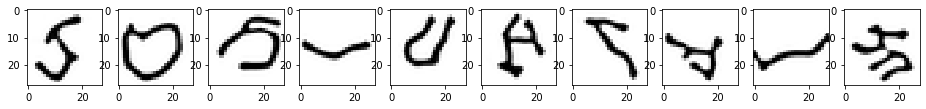

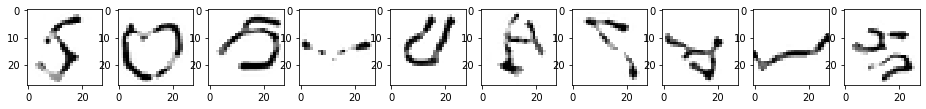

In [0]:
def work(input_img, iterations):
    tmp_img = input_img
    mid_img = None
    for i in range(iterations):
        tmp_img2 = mnist.edit(tmp_img, mnist.Deform(3, 0.4), scaling = 2)
        if mnist.fits(tmp_img2):
            if i % 6 == 0:
                tmp_img2 = mnist.edit(tmp_img2, mnist.Rotate(random.random() * 3.14))
            tmp_img2 = mnist.edit(tmp_img2, mnist.Sharpen())
            tmp_img = tmp_img2
    return tmp_img

random_images = [work(mnist.x_train[i], 20) for i in range(100)]

import random
random_images_corrupted = []
for i in range(10):
    samples = random.sample(range(99), 3)
    result = random_images[i].astype(float)
    for sample in samples:
        index = sample
        if index >= i:
            index += 1
        result -= random_images[index].astype(float) * random.random()
    result = np.clip(result, 0, 255)
    random_images_corrupted.append(result)
mnist.draw(*random_images[:10], columns = 10)
mnist.draw(*random_images_corrupted[:10], columns = 10)

Сгенерируем один набор из 50 тысяч пар изображений.

In [0]:
images = [None] * 50000
images_corrupted = [None] * 50000
for i in range(50000):
    if i % 100 == 0:
        gc.collect()
    print(i, end = '\r')
    images[i] = work(mnist.x_train[i], 20)

#images = np.array(Parallel(n_jobs = 8)(delayed(work)(img, 20) for img in mnist.x_train[:50000]))
#images_corrupted = [None] * 50000

In [0]:
for i in range(50000):
    print(i, end = '\r')
    samples = random.sample(range(50000 - 1), 3)
    result = images[i].astype(float)
    for sample in samples:
        index = sample
        if index >= i:
            index += 1
        result -= images[index].astype(float) * random.random()
    result = np.clip(result, 0, 255).astype(np.uint8)
    images_corrupted[i] = result

In [0]:
images = np.array(images)
images_corrupted = np.array(images_corrupted)

Обучим нейросеть дополнять изображения.

In [0]:
model = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(filters = 10, kernel_size = 5, input_shape = (28, 28, 1), activation = 'relu', padding = 'same'),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1000, activation = 'relu'),
    tf.keras.layers.Dense(1000, activation = 'relu'),
    tf.keras.layers.Dense(28*28, activation = 'sigmoid')
])

model.summary()

model.compile(
    optimizer = 'adam',
    loss = 'binary_crossentropy',
    metrics = ['accuracy']
)

iterations = 10
model_accuracy = np.zeros(iterations)

gc.collect()
inputs = images_corrupted[:, :, :, np.newaxis].astype(float) / 255
outputs = images.reshape(50000, -1).astype(float) / 255
model.fit(inputs, outputs, epochs = 2, verbose = 1, batch_size = 50);

Model: "sequential_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_22 (Conv2D)           (None, 28, 28, 10)        260       
_________________________________________________________________
flatten_15 (Flatten)         (None, 7840)              0         
_________________________________________________________________
dense_71 (Dense)             (None, 1000)              7841000   
_________________________________________________________________
dense_72 (Dense)             (None, 1000)              1001000   
_________________________________________________________________
dense_73 (Dense)             (None, 784)               784784    
Total params: 9,627,044
Trainable params: 9,627,044
Non-trainable params: 0
_________________________________________________________________
Train on 50000 samples
Epoch 1/2
50000/50000 [==============================] - 68s 1ms/sample - loss: 0.1624

Проверим, как работает нейросеть, на реальных примерах недорисованных цифр.

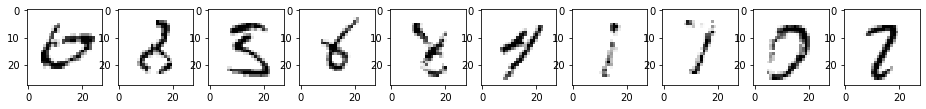

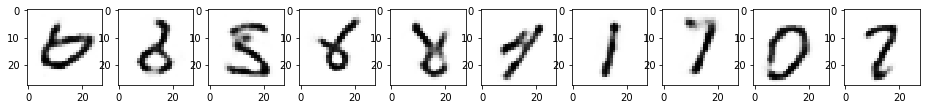

In [0]:
test_images = mnist.x_val[[445, 582, 2597, 3762, 6625, 9669, 6572, 6576, 6597, 321]]
test_images = test_images[:, :, :, np.newaxis] / 255
results = model.predict(test_images).reshape(-1, 28, 28)
mnist.draw(*test_images[:, :, :, 0], columns = 10)
mnist.draw(*results, columns = 10)

Используем данную нейросеть как предварительную обработку перед распознаванием.

In [0]:
results = model.predict(mnist.x_val[:, :, :, np.newaxis] / 255).reshape(10000, 28, 28)

In [0]:
#mnist.draw(*mnist.x_val[:10], columns = 10)
#mnist.draw(*results[:10], columns = 10)

recognition_results = models_5[0].predict(results[:, :, :, np.newaxis]).argmax(axis = 1)
print(accuracy_score(mnist.y_val, recognition_results))

0.9653


Точность ухудшилась. Во-первых, нейросеть, которая дополняет изображения, еще и почему-то размывает их в некоторых местах. Во-вторых, нейросеть не может дополнить изображения, в которых отсутствуют большие части, например восьмерки с недорисованной верхней половиной. Человек тоже не смог бы это сделать, не зная цифр. Мы же обучали нейросеть на случайных изображениях, а не на цифрах. Наконец, в-третьих, доля изображений, которые не были распознаны ранее из-за их непрорисованности, очень мала, и в основном это как раз изображения с отсутствующими крупными частями. Подавляющее большинство изображений как раз хорошо прорисованы, и обработка прорисовывающей линии нейросетью может только ухудшить их.

Также методологическая ошибка, возможно, состоит в том, что мы обучали две разные нейросети, в итоге вся архитектура в целом выглядит так: сначала в изображении выделяются признаки, потом признаки снова собираются в изображение, затем снова выделяются признаки, затем осуществляется классификация. Может быть для того, чтобы научить нейросеть распознавать цифры с недостающими частями, можно было бы просто обучить их на примерах с недостающими частями?

### Делаем нейросеть "умнее": концепция уровней абстракции <a class="anchor" id="neuro_abstraction_levels"></a>

Суммируем еще раз пути возможные пути совершенствования нейросети. Нейросеть хотелось бы научить следующему:
1. Уметь делать выводы на основе незначительных деталей в изображении. Возможно для этого нужно просто достаточное количество обучающих примеров в нужных пропорциях, но может быть требуется какая-то особая архитектура. Приведем искусственный пример: пусть в каком-то из амазонских племен "семерка" с мелкой точкой сверху - одна из форм написания восьмерки, но такое написание очень редко встречается. Как быть? Вручную увеличить количество обучающих примеров с подобным написанием? А если у нас более сложный набор обучающих данных, где заранее неизвестно распределение "сложности" и частоты встречаемости примеров?
- Уметь не только делить изображения на классы, но и например достраивать цифру по опорным точкам или линиям, центрировать и выравнивать цифры. Иными словами демонстрировать, что где-то в промежуточных (еще лучше в дополнительных выходных) слоях формируется ясное представление о форме фигуры, а точнее о реальной форме фигуры и шаблонной форме распознанной цифры, а значит о степени ее деформации на изображении, о возможных недостающих или слившихся линиях.
- Распознавать цифры, которые пересечены посторонними линиями.
- Обладать способностью обучаться распознаванию нового символа на одном обучающем примере: человек может запомнить новый символ, даже если он будет показан один раз и всего на мгновение.
- Уметь находить цифру среди других объектов в поле зрения.

------------------------

Наиболее логичными кажутся следующие желаемые свойства слоев нейросети: ближайшие к входам слои должны заниматься выделением простых свойств для каждого участка изображения, следующие слои должны выделять простые признаки для более крупных участков (например длинные линии), следующие слои должны формировать представление о видимых геометрических фигурах, не зависящие от их местоположения, и самые глубокие слои отвечают за более абстрактные признаки (например "что изображено"), которые наиболее сложно связать с пиксельной картинкой.

Непонятно только, где в данной концепции отводится место "воображению", то есть возможности формировать изображения под новыми углами зрения, с новыми предметами и пр., а затем выражать это представление так, чтобы его снова можно было подать на входы (человек это может сделать например на бумаге, нейросеть каким угодно способом).

Нашей целью является многослойная нейросеть, в которой каждая группа слоев отвечает за следующий уровень абстракции. Логично обучать такую нейросеть слой за слоем, поскольку функционирование менее глубоких слоев должно слабо зависеть от функционирования более глубоких. Например, для слоя, выделяющего на изображении короткие линии и точки, не важно, как работают более глубокие слои, распознающие объекты. Точнее это может быть и важно для внесения каких-то корректировок, но не принципиально.

Концепция разделения уровней абстракции в нейросети звучит так.

Пусть первая группа слов (назовем ее блоком A1) получает на вход пиксели изображения (например 100х100) и занимается выделением локальных признаков: линий, узоров, закрашенных областей. Этот блок имеет N1 выходных нейронов, которых в идеале должно быть достаточно для любой задачи распознавания. Таким образом, блок A1 отображает пространство R^(100х100) в многообразие в пространстве R^N1. Мы пока не сказали ничего конкретного про блок N1, даже не знаем, чего у него больше: входов или выходов. Мы только утверждаем, что хотелось бы, чтобы блок A1 занимался выделением простых признаков в каждом локальном участке изображения.

Пойдем дальше: блок A2, получая данные от нейронов N1, должен находить на изображении геометрические фигуры, имея выходные нейроны N2. Хотелось бы получить на выходах данные, инвариантные к аффинным трансформациям. То есть круг слева и круг справа изображения должен идентифицироваться как круг. При этом какие-то из нейронов N2 должны кодировать его форму, а какие-то местоположение, и так для всех фигур.

Блок A3 должен получать на вход данные нейронов N2 о фигурах, а также возможно данные N1 о цветах и узорах, и сопоставлять фигуры и их сочетания с известными шаблонами, определяя соответствие какому-то из шаблонов и степени его деформации. То есть, если на изображении есть искаженный квадрат, то блок A3 должен определить, что это квадрат и он искажен, но все же выглядит как квадрат с такой-то толщиной линий и содержимым. Конечно, блоки A2 и A3 должны уметь определять большое число объектов, присутствующих на изображении одновременно.

Блок A4 должен сопоставлять найденные объекты с объектами из памяти и заниматься собственно распознаванием объектов. Количество объектов в реальном мире настолько велико, что такой слой, будь он универсален, должен содержать очень много выходных нейронов. На изображении может присутствовать сразу много объектов какого-то класса, при этом будет достаточно указать точные положения и детали для нескольких из них, и сказать, что "есть и другие, и они находятся примерно здесь". Во всяком случае, так бы сделал человек. И все это должно быть каким-то образом закодировано в выходных нейронах. Блок A4 будет сильно зависеть от конкретной задачи распознавания, скажем, для распознавания цифр он может состоять их всего одного выходного слоя: цифры - объект простой, и все уже распознано в блоке A3.

Для каждого из блоков Ai хотелось бы иметь обратный блок Bi, выполняющий обратное преобразование. Вообще нет поводов утверждать, что наличие обратных блоков обязательно: в задачах распознавания функционируют только прямые слои Ai. Но во-первых мы не сможем обучить блоки без учителя (как автокодировщики), если нет обратных блоков. Во-вторых, корректная работа блоков Bi будет означать, что в следующем уровне абстракции накоплено достаточно информации, чтобы можно было всегда приблизительно восстановить предыдущий. Вот только функция loss, которая и проверяет корректность работы нейросети туда-обратно (через прямые и затем обратные блоки) является проблемой. Например, блок A2 давать на выходе лишь приблизительные координаты распозннаной линии, и при работе обратного блока B2 линия может быть восстановлена слегка в другом месте. На взгляд человека изображения будут похожи, то есть автокодировщик A2-B2 работает хорошо (loss низкий). Но если функцией loss будет являться не экспертная оценка, а скажем среднеквадратичное отклонение, то loss будет очень высоким: закрашены другие, хоть и близкие пиксели.

Мы сформулировали желамые свойства блоков. Но пока непонятно, как проверить сответствие блоков этим признакам и как такую нейронную сеть обучить.

------------------------

Прежде, чем мы попробуем ответить на эти вопросы, сравним подобные нейронные сети с участками мозга. С первого взгляда по функционированию они похожи. Нейронные сети, описанные выше, тоже позволяют делать промежуточные выводы о линиях и формах, а также имеют "воображение", то есть способность уменьшать уровень абстракции, генерируя изображения.

Но биологический нейрон передает информацию иначе: работа биологической нейросети - протяженный во времени процесс, и нейроны успевают передать много импульсов, получая при этом новые данные за счет обратных связей. В нашей же искусственной нейросети каждый нейрон работает однократно. Биологическая нейросеть также и обучается по-другому.

Вся концепция разделения уровней абстракции предназначена для повышения универсальности нейросети, то есть способности быстро обучаться распознаванию новых изображений, а также (и это связано) для возможности получать из недр нейросети промежуточные выводы. Конечно, отдельные выходные нейроны какого-либо из нижних уровней абстракции не будут генерировать человеко-понятные выводы: для этого нет предпосылок. Если мы хотим, чтобы нейросеть генерировала человеко-понятные промежуточные выводы (о форме объектов, пересечениях линий и пр.), ее нужно будет специално дообучать для этого. Но по крайней мере с разделением уровней абстракции это должно быть проще.

И вот мы снова упомянули о том, что выделение промежуточных выводов, то есть попытка понять логику работы нейросети, представляет сложности. Для человека таким "выделителем промежуточных выводов" является речь. Так что возможно появление речи сделало наших предков в целом умнее: мозг начал эволюционировать в сторону более четкого выделения промежуточных (между восприятием и действиями) рассуждений, чтобы преобразовывать их в язык. А если нейросеть умеет выделять и сообщать массу промежуточных суждений, то значит она хорошо структурирована и вероятно работает в целом точнее неструктурированной. Возможно, что и искусственные нейросети станут работать лучше, если научатся генерации явных промежуточных суждений.

------------------------

Теперь вернемся к вопросам: что конкретно означают сформулированные нами свойства блоков и как обучать нейросеть такой архитектуры?

Блок A1, выделяющий локальные признаки на изображении, должен иметь трехмерный набор выходных нейронов x, y, i и основой его должны быть сверточные слои: на каждый выходной нейрон должен влиять ограниченный участок изображения. Тогда будет выполнено свойство локальности, а каждый участок изображения будет анализироваться одним и тем же алгоритмом.

Но просто сделать автокодировщик A1-B1 со сверточными слоями недостаточно. Если количество выходов не сильно меньше, чем входов, то то для наибольшей точности блоку A1 достаточно будет осуществлять тождественное преобразование. Тогда блок A1 будет бесполезен, а задача выделения локальных признаков "ляжет на плечи" следующего блока A2. Если же блок A1 будет выделять какие-то нетривиальные признаки, но их окажется недостаточно блоку A2 для распознавания, и при этом мы позволим блоку A2 также использовать данные о пикселях, то блок A2 может начать игнорировать большую часть результатов работы блока A1, и самому выделять нужные локальные признаки, а мы об этом даже не будем знать.

1. Обучать блок A1 отличать друг от друга различные текстуры. Для этого выходной трехмерный слой x, y, i нужно дополнить слоем, который для каждого x, y будет полносвязно соединять множество признаков I и множество меток текстур. Если мы обучим такую нейросеть различать большое количество текстур, то будем уверены, что разные текстуры преобразуются в разные комбинации признаков, иначе выходной слой не смог бы их различить.

Нужно помнить, что блок A1 должен распознавать не только текстуры и узоры, но и линии. Также блок A1 должен определять угол поворота (по возможности), масштаб и яркость текстуры. Можно попробовать поделить блок A1 на два уровня: первый учится определять текстуру, а второй ее масштаб и угол поворота (то есть учится определять, что разные текстуры, распознанные предыдущим уровнем - это одна и та же текстура под разными углами в разном масштабе).

2. Дополнить блок A1 полносвязными слоями и обучать нейросеть на какую-либо задачу распознавания, а затем удалить полносвязные слои. Однако если мы проделаем эту операцию несколько раз, то результаты следующих обучений могут полностью "затереть" результаты предыдущих обучений на другой задаче, в итоге получившийся блок A1 не будет универсален.
3. Создать несколько полносвязных нейросетей, каждая из которых использует блок A1, и параллельно обучать их на разные задачи распознавания.

Уточним, что дополнения к блоку A1, которые предлагается использовать, вовсе не равны блокам A2, A3, A4. Эти дополнения мы удалим, они не нужны после того, как помогли обучиться блоку A1. Мы пока не обсуждали, как обучать следующие блоки (A2, A3, A4). Но блок A1 обладает хорошим свойством локальности, а значит его можно обучать отдельно от остальных: мы знаем, что он не возьмет на себя функции следующих блоков.

Мы также можем проверить, что полученный блок A1 не бесполезен: для этого нужно проверить, что он ускоряет обучение нейросетей для различных задач распознавания, при этом веса самого блока остаются фиксированными.

Еще одно дополнение: первому сверточному слою блока A1 нужно подавать не только изображение, но и его копии, уменьшенные в 2, 4, 8 и т. д. раз, тогда локальные признаки будут выделяться для любого значения масштаба. Для этого можно дополнить блок A1 набором сверточных слоев с фиксированными весами, уменьшающих изображение. Также стоит рассмотреть не только масштабирование, но и иные преобразования, например поворот. Но в итоге можно прийти к тому, что входных данных для слоя A1 будет очень много (изоражение, его повороты, растяжения, ...), значит нейросеть получится большой, а большой нейросети, скорее всего, потребуется много обучающих примеров.

Что касается блока B1, то в описании процесса обучения ему пока не нашлось места. Можно либо не использовать его, либо обучать его отдельно так, чтобы результат работы автокодировщика A1-B1 на задачах обучения вели бы себя так же, как и исходное изображение. Изначальная же задумка, что блок A1 будет обучаться методом обучения автокодировщика A1-B1, имеет недостатки: так мы не можем гарантировать ни нетривиальность блока A1 (то, что он осуществляет не тождественное преобразование), ни полезность блока A1 в задачах распознавания. Впрочем, если мы покажем, что предварительная обработка изображения автокодировщиком A1-B1 не ухудшает результаты на множестве различных задач распознавания, то это будет означать, что признаки, генерируемые A1, точно описывают разнообразные аспекты изображения. Но это все же не будет означать, что блок A1 нетривиален, то есть что он выполняет свою задачу и следующим после него блокам не нужно будет заново выполнять задачу выделения локальных признаков.

### Концепция уровней абстракции на практике <a class="anchor" id="neuro_abstraction_practice"></a>

**Описание нейросети, нацеленной на выделение локальных признаков (блока A1)**

Применение слоя MaxPooling следует ограничить, иначе будет потеряно свойство локальности. Например, при последовательности слоев *Conv(3x3)-Conv(3x3)* каждый выходной нейрон будет собирать информацию о нейронах в области 5x5, тогда как при последовательности слоев *Conv(3x3)-MaxPooling(2x2)-Conv(3x3)* каждый выходной нейрон будет уже собирать информацию о нейронах в области 8x8, а при большем числе слоев разница еще больше увеличится. Тогда собранный из таких слоев блок уже перестанет соответствовать блоку A1 в концепции разделения уровней абстракции. Поэтому слоев MaxPooling не должно быть больше 1-2.

Нужно дать возможность нейросети обрабатывать только локальные признаки, то есть в области, например, не больше 10x10 или 15x15. Попробуем собрать рабочую (не обязательно лучшую) архитектуру блока A1.

- (64, 64, 1): 64x64, 1 канал, пиксели от 0 (не закрашено) до 1 (закрашено)
- **Свертка 3x3, шаг 1, 32 фильтра** - начинается сбор локальной информации
- (64, 64, 32), каждый выход зависит от области 3x3 на исходном изображении
- **Свертка 5x5, шаг 1, 64 фильтра** - продолжается сбор локальной информации
- (64, 64, 64), каждый выход зависит от области 7x7 на исходном изображении
- **MaxPooling 2x2** - вместе с предыдущим слоем мы получили улучшенный вариант свертки 5х5 с шагом 2
- (32, 32, 64), каждый выход зависит от области 9x9 на исходном изображении
- **Свертка 3x3, шаг 1, 256 фильтров** - заканчивается сбор локальной информации
- (32, 32, 256), каждый выход зависит от области 13х13 на исходном изображении
- **MaxPooling 2x2** - прореживание данных
- (16, 16, 256), каждый выход зависит от области 15х15 на исходном изображении
- **Свертка 1х1, шаг 1, 128 фильтров** - дополнительный полносвязный анализ признаков
- (16, 16, 128), каждый выход зависит от области 15х15 на исходном изображении

Однако такая нейросеть потребует много обучающих примеров из-за большого количества слоев (ведь это только блок A1, то есть не все слои!) и весов. Для проверки идеи о локальном выделении признаков можно взять нейросеть поменьше.

- (32, 32, 1): 32х32, 1 канал, пиксели от 0 (не закрашено) до 1 (закрашено)
- **Свертка 3x3, шаг 1, 16 фильтров**
- (32, 32, 16), каждый выход зависит от области 3x3 на исходном изображении
- **MaxPooling 2x2**
- (16, 16, 16), каждый выход зависит от области 5x5 на исходном изображении
- **Свертка 3x3, шаг 1, 16 фильтров**
- (16, 16, 16), каждый выход зависит от области 9x9 на исходном изображении
- **MaxPooling 2x2**
- (8, 8, 16), каждый выход зависит от области 9x9 на исходном изображении

Перед обработкой такой нейросетью мы масштабируем изображение, создав его копии с масштабом 1 (32x32), 1/2 (16x16), 1/4 (8x8). Все копии будут обработаны описанной выше нейросетью и дадут следующие тенхоры на выходах:
- (8, 8, 16)
- (4, 4, 16)
- (2, 2, 16)

Все получившиеся результаты будут объединены в одномерный вектор и будут считаться ответом нейросети.

Для проверки работоспособности попробуем использовать эту нейросеть в задаче распознавания цифр. Для этого дополним ее одним скрытым полносвязным слоем из 100 нейронов и выходным полносвязным слоем из 10 нейронов.

Выбор датасетов из каталога https://www.tensorflow.org/datasets/catalog представляет собой отдельную проблему. Многие датасеты слишком большие по размеру или содержат слишком мало тренировочных данных, из-за чего для их классификации нужна будет сложная архитектура.

Простая нейросеть, наподобие тех, с которыми мы работали выше, будет в первую очередь ассоциировать класс изображения с его пространственным расположением, и на тренировочном наборе это может даже получиться. То есть нейросеть может предсказывать класс на основе неверных рассуждений, которые подогнаны так, что на тренировочном наборе дают верные результаты (к слову, в модели с разделением уровней абстракции это невозможно, поскольку веса нижних слоев заранее обучены и не меняются при обучении распознаванию новых предметов - важная деталь).

Избежать этой ситуации можно было бы, используя в каждом батче вместо каждого изображения набор его всевозможных трансформаций, но это сильно замедлит процесс обучения.

Не хотелось бы обучать блок пред-обработки A1 с помощью включения его в нейросети, которые функционируют неверно. Так что в качестве датасетов стоит брать такие, в которых нейросети будет затруднительно вычислить ответ на основе положения объекта на изображении. Это значит, что либо должно быть много обучающих примеров, либо они должны различаться больше по текстуре и линиям, а не по положению.

Наилучшим вариантом было бы создать собственные датасеты, в которых разные текстуры соответствовали бы разным классам. Для этого достаточно найти несколько десятков разных текстур (земля, шерсть, листва и пр.) и вырезать из них небольшие изображения, которые и будут датасетом. Но сейчас не будем тратить на это время и будем использовать наиболее подходящие датасеты из тех, что есть.

Блок A1 будет представлен в виде плейсхолдера a1_input и выходного тензора a1_out. Каждая из нейросетей-классификаторов будет принимать на вход a1_out. Данные о каждой нейросети будут представлены в виде пространства имен, содержащего выходной тензор b_out и другие переменные, необходимые для обучения нейросети (y, cost, optimizer, correct_prediction, accuracy), а также набор данных (x_train, y_train, x_test, y_test).

In [0]:
import tensorflow.compat.v1 as tf
tf.disable_v2_behavior()
import tensorflow_datasets as tfds
import numpy as np
import random
from types import SimpleNamespace
import urllib.request
import os
import re
from zipfile import ZipFile
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
import gc

import mnistlib as mnist
mnist.init()

tf.reset_default_graph()

# Функции convolution_layer, max_pooling_layer, create_weights, create_biases для создания слоев

def convolution_layer(input_, weights, constants, strides = 1):
    tmp = tf.nn.conv2d(input_, weights, strides = [1, strides, strides, 1], padding = 'SAME')
    return tf.nn.relu(tmp + constants)

def max_pooling_layer(input_, k = 2):
    return tf.nn.max_pool(input_, ksize = [1, k, k, 1], strides = [1, k, k, 1], padding = 'SAME')
    
def create_weights(*shape):
    return tf.Variable(tf.keras.initializers.glorot_uniform()(shape))
    
def create_biases(*shape):
    return tf.Variable(tf.zeros_initializer()(shape))

# В нейросетях-классификаторах может использоваться dropout, поэтому нужна переменная для управления уровнем дропаута,
# чтобы при тестировании устанавливать его равным 0
dropout_rate = tf.placeholder(tf.float32, []) #скаляр
dropout_rate_train = 0.5
dropout_rate_test = 0

# Функция test_network создает сессию, обучает нейросеть-классификатор и считает ее точность.
# В процессе обучения функция sess.run(optimizer) вызывается total_batches раз. Во время каждого вызова из набора
#     данных (x_train, y_train) выбирается batch_size данных случайным образом.
# Функция возвращает структуру данных ((x, y1), (x, y2)), где:
# x - последовательность индексов (номеров батчей), на которых была измерена точность. Если accuracy_every_X_batches = 10,
#     то x = (9, 19, 29, ...) и т. д. до total_batches - 1
# y1 - последовательность измененных точностей на тестовых данных (x_test, y_test); во время каждого измерения из всего
#     набора выбирается случайные образом test_examples_count примеров.
# y2 - последовательность измененных точностей на обучающих данных; измеряется так же, как и точность на тестовых
#     данных. Если точность на обучающих данных значительно выше, чем на тестовых, то это говорит о переобучении сети
# dropout_rate устанавливается равным переменной dropout_rate_train при обучении и dropout_rate_test при тестировании;
#     если в конкретной нейросети не используется dropout, то этот параметр не имеет значения

def test_network(namespace, batch_size, total_batches, accuracy_every_X_batches, test_examples_count):
    indices = []
    accuracies = []
    accuracies_on_train_examples = []
    acc = 0 #последняя измеренная точность на тестовом наборе
    acc2 = 0 #последняя измеренная точность на тренировочном наборе
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for batch_index in range(total_batches):
            #обучаем сеть
            sample = random.sample(range(len(namespace.x_train)), batch_size)
            batch_x = namespace.x_train[sample]
            batch_y = namespace.y_train[sample]
            sess.run(namespace.optimizer, feed_dict = {
                a1_input: batch_x,
                namespace.y: batch_y,
                dropout_rate: dropout_rate_train
            })
            if batch_index % accuracy_every_X_batches == accuracy_every_X_batches - 1:
                #проверяем сеть
                indices.append(batch_index)
                sample = random.sample(range(len(namespace.x_test)), test_examples_count)
                acc = sess.run(namespace.accuracy, feed_dict = {
                    a1_input: namespace.x_test[sample],
                    namespace.y: namespace.y_test[sample],
                    dropout_rate: dropout_rate_test
                })
                accuracies.append(acc)
                sample2 = random.sample(range(len(namespace.x_train)), test_examples_count)
                acc2 = sess.run(namespace.accuracy, feed_dict = {
                    a1_input: namespace.x_train[sample2],
                    namespace.y: namespace.y_train[sample2],
                    dropout_rate: dropout_rate_test
                })
                accuracies_on_train_examples.append(acc2)
            print("batch %d, last accuracy: test %g, train %g     " % (batch_index, acc, acc2), end = '\r')
    return (indices, accuracies), (indices, accuracies_on_train_examples)

# Показ набора графиков (цветами С0, C1, C2, ...). Каждый элемент graph массива graphs должен содержать набор координат
# по осям X и Y: graph[0] - точки на оси X, graph[1] - точки на оси Y

def show_graph(*graphs, ymin = 0, ymax = 1, width = 15, height = 5):
    plt.figure(figsize = (width, height))
    plt.gca().set_ylim(ymin = ymin, ymax = ymax)
    for i, graph in enumerate(graphs):
        x_labels = graph[0]
        y_labels = graph[1]
        plt.plot(x_labels, y_labels, color = 'C%d' % (i % 10))
    plt.show()

# Функция make_trainable_network получает в качестве параметра пространство имен нейросети-классификатора и количество
# классов. Тртребует наличия b_out - выходного слоя. Создает в пространстве имен другие переменные, которые нужны
# для обучения нейросети: y, cost, optimizer, correct_prediction, accuracy
def make_trainable_network(namespace, logits_count):
    namespace.y = tf.placeholder("float", [None, logits_count])
    namespace.cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(
        logits = namespace.b_out, labels = namespace.y))
    namespace.optimizer = tf.train.AdamOptimizer().minimize(namespace.cost)
    namespace.correct_prediction = tf.equal(
        tf.argmax(namespace.b_out, 1), tf.argmax(namespace.y, 1))
    namespace.accuracy = tf.reduce_mean(tf.cast(namespace.correct_prediction, tf.float32))

In [0]:
# --- конструируем блок A1 ---

a1_input = tf.placeholder("float", [None, 32, 32, 1])
a1_input_flat = tf.reshape(a1_input, [-1, 32*32])

#масштабирование
a1_scaled1 = a1_input
a1_scaled2 = tf.image.resize(a1_input, [16, 16], method = tf.image.ResizeMethod.AREA)
a1_scaled3 = tf.image.resize(a1_input, [8, 8], method = tf.image.ResizeMethod.AREA)

#веса сверточных слоев
a1_weights1 = create_weights(3, 3, 1, 16)
a1_biases1 = create_biases(16)
a1_weights2 = create_weights(3, 3, 16, 16)
a1_biases2 = create_biases(16)

#операции с изображением, уменьшенным в 2, 4, 8 раз
for i in ['1', '2', '3']:
    input_ = globals()['a1_scaled' + i]
    tmp = convolution_layer(input_, a1_weights1, a1_biases1)
    tmp = max_pooling_layer(tmp, k = 2)
    tmp = convolution_layer(tmp, a1_weights2, a1_biases2)
    tmp = max_pooling_layer(tmp, k = 2)
    globals()['a1_out' + i] = tmp
    shape = tmp.get_shape().as_list()
    globals()['a1_out_flat' + i] = tf.reshape(tmp, [-1, shape[1] * shape[2] * shape[3]])

# Выходной тензор
a1_out = tf.concat([a1_out_flat1, a1_out_flat2, a1_out_flat3], axis = 1)
a1_out_size = a1_out.get_shape().as_list()[1]

Создадим несколько нейросетей на основе блока A1, которые будут классифицировать разные датасеты.

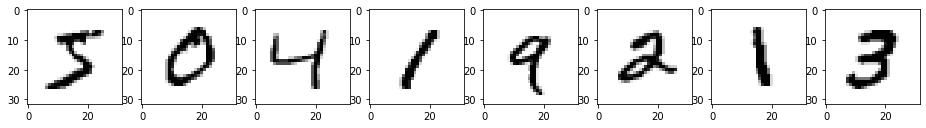

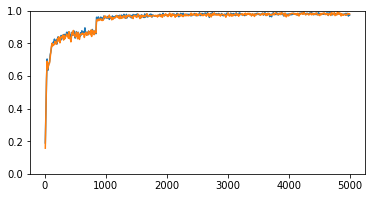

In [0]:
# --- конструируем сеть для распознавания цифр ---

digit_recognition = SimpleNamespace()

tmp = tf.nn.dropout(a1_out, rate = dropout_rate)
tmp = tf.nn.relu(tmp @ create_weights(a1_out_size, 300) + create_biases(300))
digit_recognition.b_out = tf.nn.softmax(tmp @ create_weights(300, 10) + create_biases(10))

make_trainable_network(namespace = digit_recognition, logits_count = 10)

# --- подготавливаем для нее входные данные ---

digit_recognition.x_train = np.zeros((60000, 32, 32, 1))
digit_recognition.x_test = np.zeros((10000, 32, 32, 1))

digit_recognition.x_train[:, 2:30, 2:30, 0] = mnist.x_train / 255
digit_recognition.x_test[:, 2:30, 2:30, 0] = mnist.x_val / 255

digit_recognition.y_train = np.zeros((60000, 10))
digit_recognition.y_test = np.zeros((10000, 10))

for i in range(60000):
    digit_recognition.y_train[i, mnist.y_train[i]] = 1
for i in range(10000):
    digit_recognition.y_test[i, mnist.y_val[i]] = 1

mnist.draw(*digit_recognition.x_train[:8, :, :, 0], columns = 8)

# --- обучаем и определяем точность ---

digit_recognition.accuracy_history, digit_recognition.train_accuracy_history = test_network(
    digit_recognition, batch_size = 32, total_batches = 5000, accuracy_every_X_batches = 10, test_examples_count = 1000)

show_graph(digit_recognition.accuracy_history, digit_recognition.train_accuracy_history, width = 6, height = 3)

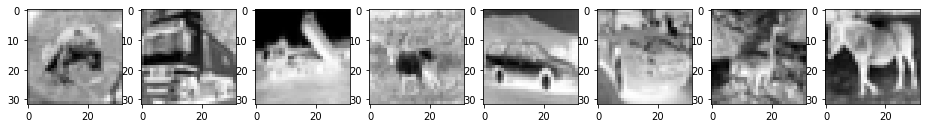

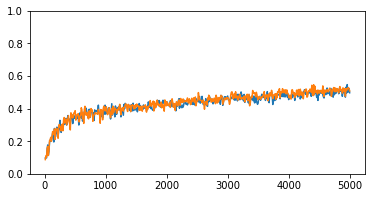

In [0]:
# --- конструируем сеть для распознавания cifar10 ---

cifar10_recognition = SimpleNamespace()

tmp = tf.nn.dropout(a1_out, rate = dropout_rate)
tmp = tf.nn.relu(tmp @ create_weights(a1_out_size, 300) + create_biases(300))
cifar10_recognition.b_out = tf.nn.softmax(tmp @ create_weights(300, 10) + create_biases(10))

make_trainable_network(namespace = cifar10_recognition, logits_count = 10)

# --- подготавливаем для нее входные данные ---

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

cifar10_recognition.x_train = x_train.mean(axis = 3)[:, :, :, np.newaxis] / 255
cifar10_recognition.x_test = x_test.mean(axis = 3)[:, :, :, np.newaxis] / 255

cifar10_recognition.y_train = np.zeros((50000, 10))
cifar10_recognition.y_test = np.zeros((10000, 10))

for i in range(50000):
    cifar10_recognition.y_train[i, y_train[i]] = 1
for i in range(10000):
    cifar10_recognition.y_test[i, y_test[i]] = 1

mnist.draw(*cifar10_recognition.x_train[:8, :, :, 0], columns = 8)

# --- обучаем и определяем точность ---

cifar10_recognition.accuracy_history, cifar10_recognition.train_accuracy_history = test_network(
    cifar10_recognition, batch_size = 32, total_batches = 5000, accuracy_every_X_batches = 10, test_examples_count = 1000)

show_graph(cifar10_recognition.accuracy_history, cifar10_recognition.train_accuracy_history, width = 6, height = 3)

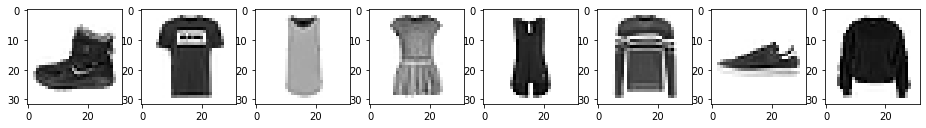

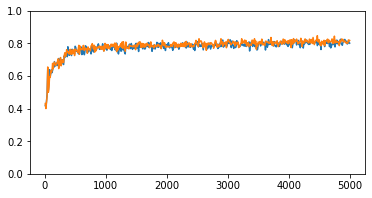

In [0]:
# --- конструируем сеть для распознавания fashion mnist ---

fashion_recognition = SimpleNamespace()

tmp = tf.nn.dropout(a1_out, rate = dropout_rate)
tmp = tf.nn.relu(tmp @ create_weights(a1_out_size, 300) + create_biases(300))
fashion_recognition.b_out = tf.nn.softmax(tmp @ create_weights(300, 10) + create_biases(10))

make_trainable_network(namespace = fashion_recognition, logits_count = 10)

# --- подготавливаем для нее входные данные ---

(x_train, y_train), (x_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()

fashion_recognition.x_train = np.zeros((60000, 32, 32, 1))
fashion_recognition.x_test = np.zeros((10000, 32, 32, 1))

fashion_recognition.x_train[:, 2:30, 2:30, 0] = x_train / 255
fashion_recognition.x_test[:, 2:30, 2:30, 0] = x_test / 255

fashion_recognition.y_train = np.zeros((60000, 10))
fashion_recognition.y_test = np.zeros((10000, 10))

for i in range(60000):
    fashion_recognition.y_train[i, y_train[i]] = 1
for i in range(10000):
    fashion_recognition.y_test[i, y_test[i]] = 1

mnist.draw(*fashion_recognition.x_train[:8, :, :, 0], columns = 8)

# --- обучаем и определяем точность ---

fashion_recognition.accuracy_history, fashion_recognition.train_accuracy_history = test_network(fashion_recognition,
    batch_size = 32, total_batches = 5000, accuracy_every_X_batches = 10, test_examples_count = 1000)

show_graph(fashion_recognition.accuracy_history, fashion_recognition.train_accuracy_history, width = 6, height = 3)

(40000, 32, 32, 1) (40000, 8)


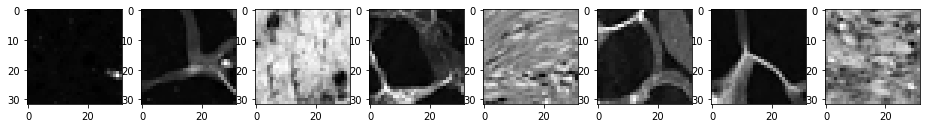

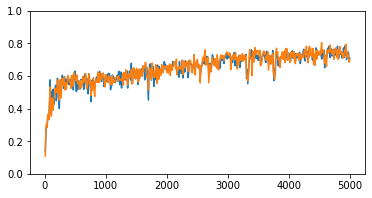

In [0]:
# --- конструируем сеть для распознавания colorectal_histology ---

histology_recognition = SimpleNamespace()

tmp = tf.nn.dropout(a1_out, rate = dropout_rate)
tmp = tf.nn.relu(tmp @ create_weights(a1_out_size, 300) + create_biases(300))
histology_recognition.b_out = tf.nn.softmax(tmp @ create_weights(300, 8) + create_biases(8))

make_trainable_network(namespace = histology_recognition, logits_count = 8)

# --- подготавливаем для нее входные данные ---

ds = tfds.load('colorectal_histology', split = 'train')
ds_part = tfds.as_numpy(ds.take(5000))

images = []
logits = []

for i, x in enumerate(ds_part):
    print(i, end = '\r')
    img = x['image'].mean(axis = 2).astype(np.uint8)
    img = mnist.pil_to_np(mnist.np_to_pil(img).resize((32, 32)))
    label = x['label']
    logits_vector = np.zeros(8)
    logits_vector[label] = 1
    images.append(img)
    images.append(np.rot90(images[-1]))
    images.append(np.rot90(images[-1]))
    images.append(np.rot90(images[-1]))
    images.append(images[-1].T)
    images.append(np.rot90(images[-1]))
    images.append(np.rot90(images[-1]))
    images.append(np.rot90(images[-1]))
    for _ in range(8):
        logits.append(logits_vector)
    
images = np.array(images)[:, :, :, np.newaxis] / 255
logits = np.array(logits)

shuffle_indices = random.sample(range(images.shape[0]), images.shape[0])
images = images[shuffle_indices]
logits = logits[shuffle_indices]
print(images.shape, logits.shape)

train_images_count = images.shape[0] // 10 * 9
histology_recognition.x_train = images[:train_images_count]
histology_recognition.x_test = images[train_images_count:]
histology_recognition.y_train = logits[:train_images_count]
histology_recognition.y_test = logits[train_images_count:]

mnist.draw(*histology_recognition.x_train[:8, :, :, 0], columns = 8)

# --- обучаем и определяем точность ---

histology_recognition.accuracy_history, histology_recognition.train_accuracy_history = test_network(histology_recognition,
    batch_size = 32, total_batches = 5000, accuracy_every_X_batches = 10, test_examples_count = 500)

show_graph(histology_recognition.accuracy_history, histology_recognition.train_accuracy_history, width = 6, height = 3)

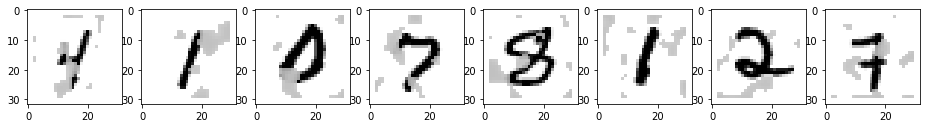

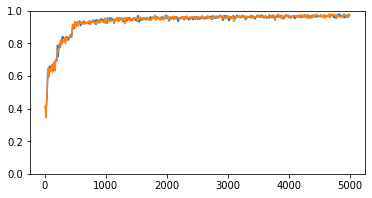

In [0]:
# --- конструируем сеть для распознавания mnist_corrupted/spatter ---

mnist_spatter_recognition = SimpleNamespace()

tmp = tf.nn.dropout(a1_out, rate = dropout_rate)
tmp = tf.nn.relu(tmp @ create_weights(a1_out_size, 300) + create_biases(300))
mnist_spatter_recognition.b_out = tf.nn.softmax(tmp @ create_weights(300, 10) + create_biases(10))

make_trainable_network(namespace = mnist_spatter_recognition, logits_count = 10)

# --- подготавливаем для нее входные данные ---

ds = tfds.load('mnist_corrupted/spatter', split = 'train')
ds_part = tfds.as_numpy(ds.take(60000))

images = []
logits = []

for i, x in enumerate(ds_part):
    print(i, end = '\r')
    image = np.zeros((32, 32, 1))
    image[2:30, 2:30, :] = x['image'] / 255
    label = x['label']
    logits_vector = np.zeros(10)
    logits_vector[label] = 1
    images.append(image)
    logits.append(logits_vector)

images = np.array(images)
logits = np.array(logits)

mnist_spatter_recognition.x_train = images[:50000]
mnist_spatter_recognition.x_test = images[50000:]
mnist_spatter_recognition.y_train = logits[:50000]
mnist_spatter_recognition.y_test = logits[50000:]

mnist.draw(*mnist_spatter_recognition.x_train[:8, :, :, 0], columns = 8)

# --- обучаем и определяем точность ---

mnist_spatter_recognition.accuracy_history, mnist_spatter_recognition.train_accuracy_history = test_network(
    mnist_spatter_recognition,
    batch_size = 32, total_batches = 5000, accuracy_every_X_batches = 10, test_examples_count = 1000)

show_graph(mnist_spatter_recognition.accuracy_history, mnist_spatter_recognition.train_accuracy_history,
    width = 6, height = 3)

(216000, 32, 32, 1) (216000, 10)


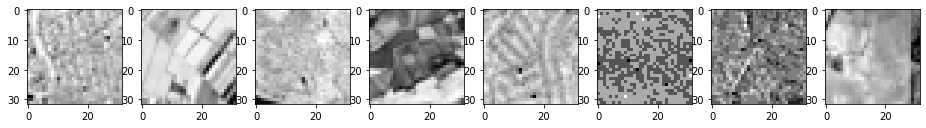

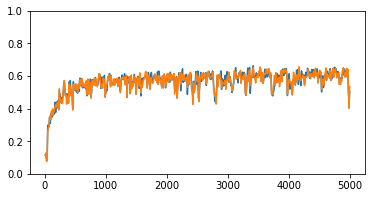

In [0]:
# --- конструируем сеть для распознавания eurosat ---

eurosat_recognition = SimpleNamespace()

tmp = tf.nn.dropout(a1_out, rate = dropout_rate)
tmp = tf.nn.relu(tmp @ create_weights(a1_out_size, 800) + create_biases(800))
eurosat_recognition.b_out = tf.nn.softmax(tmp @ create_weights(800, 10) + create_biases(10))

make_trainable_network(namespace = eurosat_recognition, logits_count = 10)

# --- подготавливаем для нее входные данные ---

eurosat_path = '../datasets/euroSAT.zip'
eurosat_url = 'http://madm.dfki.de/files/sentinel/EuroSAT.zip'
if not os.path.isfile(eurosat_path):
    urllib.request.urlretrieve(eurosat_url, eurosat_path, reporthook = lambda block_num, block_size, total_size:
                               print('%.2f%%' % (100 * block_num * block_size / total_size), end = '\r'))

labels_dict = {'AnnualCrop': 1, 'Forest': 2, 'HerbaceousVegetation': 3, 'Highway': 4, 'Industrial': 5, 'Pasture': 6,
              'PermanentCrop': 7, 'Residential': 8, 'River': 9, 'SeaLake': 0}

images = []
logits = []

archive = ZipFile(eurosat_path, 'r')
files = archive.namelist()
for i, filename in enumerate(files):
    print(i, end = '\r')
    file_tokens = filename.split('/')
    if len(file_tokens) != 3: continue #это папка, а не файл
    label_str = file_tokens[1]
    image_filename = file_tokens[2]
    if len(image_filename) == 0: continue #это папка, а не файл
    #image_index = re.split('[_\.]', image_filename)[1]
    with archive.open(filename) as file:
        img = Image.open(file)
        img = mnist.pil_to_np(img.resize((32, 32)).convert('L'))
        label = labels_dict[label_str]
        label_logits = [0] * 10
        label_logits[label] = 1
        images.append(img)
        images.append(np.rot90(images[-1]))
        images.append(np.rot90(images[-1]))
        images.append(np.rot90(images[-1]))
        images.append(images[-1].T)
        images.append(np.rot90(images[-1]))
        images.append(np.rot90(images[-1]))
        images.append(np.rot90(images[-1]))
        for _ in range(8):
            logits.append(label_logits)
archive.close()

images = np.array(images)[:, :, :, np.newaxis] / 255
logits = np.array(logits)

shuffle_indices = random.sample(range(len(images)), len(images))
images = images[shuffle_indices]
logits = logits[shuffle_indices]

print(images.shape, logits.shape)
training_count = images.shape[0] // 10 * 9

eurosat_recognition.x_train = images[:training_count]
eurosat_recognition.y_train = logits[:training_count]
eurosat_recognition.x_test = images[training_count:]
eurosat_recognition.y_test = logits[training_count:]

mnist.draw(*eurosat_recognition.x_train[:8, :, :, 0], columns = 8)

# --- обучаем и определяем точность ---

eurosat_recognition.accuracy_history, eurosat_recognition.train_accuracy_history = test_network(eurosat_recognition,
    batch_size = 32, total_batches = 5000, accuracy_every_X_batches = 10, test_examples_count = 1000)

show_graph(eurosat_recognition.accuracy_history, eurosat_recognition.train_accuracy_history, width = 6, height = 3)

Идея состяла в том, чтобы обучать блок A1 параллельно на разных задачах распознавания. Поэтому мы встроили его в разные нейросети, которые будут обучаться паралельно.

В качестве альтернативы можно было бы использовать одну нейросеть с увеличенным количество выходных нейронов, покрывающем все классы во всех используемых задачах классификации.

Мы не используем для обучения набор данных fashion mnist, так как он будет использоваться для проверки.

In [0]:
gc.collect()
batch_size = 32
total_batches = 5000
accuracy_every_X_batches = 10
test_examples_count = 500

networks = {
    "digit_recognition": digit_recognition,
    "cifar10_recognition": cifar10_recognition,
    #"fashion_recognition": fashion_recognition,
    "histology_recognition": histology_recognition,
    "mnist_spatter_recognition": mnist_spatter_recognition,
    "eurosat_recognition": eurosat_recognition
}

batch_indices = []
network_accuracies = {
    "digit_recognition": [],
    "cifar10_recognition": [],
    #"fashion_recognition": [],
    "histology_recognition": [],
    "mnist_spatter_recognition": [],
    "eurosat_recognition": []
}

#header = '| MNIST | CIFAR | FASHN | HISTO | SPATR | EUSAT '
header = '| MNIST | CIFAR | HISTO | SPATR | EUSAT '

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    lines_displayed = 0
    for batch_index in range(total_batches):
        print("batch %d" % batch_index, end = '\r')
        for name, network in networks.items():
        #обучаем нейросеть
            sample = random.sample(range(len(network.x_train)), batch_size)
            batch_x = network.x_train[sample]
            batch_y = network.y_train[sample]
            sess.run(network.optimizer, feed_dict = {
                a1_input: batch_x,
                network.y: batch_y,
                dropout_rate: dropout_rate_train
            })
        if batch_index % accuracy_every_X_batches == accuracy_every_X_batches - 1:
            if lines_displayed % 30 == 0:
                print(header)
            lines_displayed += 1
            batch_indices.append(batch_index)
            display_str = ''
            for name, network in networks.items():
                #проверяем нейросеть
                sample = random.sample(range(len(network.x_test)), test_examples_count)
                acc = sess.run(network.accuracy, feed_dict = {
                    a1_input: network.x_test[sample],
                    network.y: network.y_test[sample],
                    dropout_rate: dropout_rate_test
                })
                display_str += "| %.3f " % acc
                network_accuracies[name].append(acc)
            print(display_str)
    # получаем обученные веса блока A1
    a1_weights1_trained = sess.run(a1_weights1) #3, 3, 1, 16
    a1_biases1_trained = sess.run(a1_biases1) #16
    a1_weights2_trained = sess.run(a1_weights2) #3, 3, 16, 16
    a1_biases2_trained = sess.run(a1_biases2) #16
    np.save("../numpy_saved/a1_weights1.npy", a1_weights1_trained)
    np.save("../numpy_saved/a1_biases1.npy", a1_biases1_trained)
    np.save("../numpy_saved/a1_weights2.npy", a1_weights2_trained)
    np.save("../numpy_saved/a1_biases2.npy", a1_biases2_trained)

| MNIST | CIFAR | HISTO | SPATR | EUSAT 
| 0.410 | 0.124 | 0.244 | 0.130 | 0.142 
| 0.568 | 0.118 | 0.370 | 0.502 | 0.154 
| 0.618 | 0.112 | 0.312 | 0.548 | 0.222 
| 0.690 | 0.142 | 0.300 | 0.706 | 0.172 
| 0.636 | 0.192 | 0.214 | 0.670 | 0.232 
| 0.768 | 0.192 | 0.278 | 0.714 | 0.194 
| 0.786 | 0.182 | 0.314 | 0.688 | 0.224 
| 0.794 | 0.196 | 0.342 | 0.738 | 0.258 
| 0.826 | 0.272 | 0.404 | 0.726 | 0.272 
| 0.800 | 0.254 | 0.442 | 0.744 | 0.294 
| 0.822 | 0.304 | 0.372 | 0.786 | 0.270 
| 0.778 | 0.248 | 0.388 | 0.802 | 0.286 
| 0.758 | 0.248 | 0.430 | 0.762 | 0.286 
| 0.852 | 0.264 | 0.414 | 0.792 | 0.312 
| 0.812 | 0.284 | 0.422 | 0.800 | 0.296 
| 0.846 | 0.264 | 0.420 | 0.816 | 0.332 
| 0.796 | 0.268 | 0.394 | 0.772 | 0.274 
| 0.808 | 0.296 | 0.396 | 0.790 | 0.306 
| 0.822 | 0.256 | 0.382 | 0.778 | 0.306 
| 0.840 | 0.282 | 0.428 | 0.804 | 0.290 
| 0.858 | 0.264 | 0.424 | 0.802 | 0.262 
| 0.858 | 0.168 | 0.424 | 0.782 | 0.298 
| 0.840 | 0.222 | 0.378 | 0.810 | 0.292 
| 0.828 | 0.260 

| 0.906 | 0.412 | 0.412 | 0.862 | 0.298 
| 0.876 | 0.424 | 0.466 | 0.892 | 0.318 
| 0.818 | 0.382 | 0.424 | 0.874 | 0.294 
| 0.856 | 0.426 | 0.494 | 0.850 | 0.322 
| 0.876 | 0.402 | 0.452 | 0.854 | 0.336 
| 0.882 | 0.406 | 0.442 | 0.834 | 0.290 
| 0.878 | 0.382 | 0.468 | 0.844 | 0.316 
| 0.876 | 0.392 | 0.454 | 0.860 | 0.294 
| 0.884 | 0.452 | 0.410 | 0.818 | 0.352 
| 0.884 | 0.400 | 0.442 | 0.830 | 0.326 
| 0.866 | 0.390 | 0.412 | 0.864 | 0.328 
| 0.894 | 0.442 | 0.458 | 0.844 | 0.294 
| 0.884 | 0.414 | 0.484 | 0.866 | 0.312 
| 0.884 | 0.430 | 0.456 | 0.874 | 0.334 
| 0.864 | 0.400 | 0.448 | 0.846 | 0.292 
| 0.872 | 0.412 | 0.442 | 0.870 | 0.264 
| 0.876 | 0.394 | 0.460 | 0.858 | 0.354 
| MNIST | CIFAR | HISTO | SPATR | EUSAT 
| 0.852 | 0.384 | 0.424 | 0.858 | 0.338 
| 0.900 | 0.404 | 0.424 | 0.858 | 0.320 
| 0.846 | 0.430 | 0.478 | 0.854 | 0.348 
| 0.890 | 0.426 | 0.450 | 0.820 | 0.348 
| 0.888 | 0.412 | 0.436 | 0.870 | 0.340 
| 0.878 | 0.422 | 0.444 | 0.862 | 0.340 
| 0.876 | 0.410 

| 0.870 | 0.480 | 0.494 | 0.850 | 0.430 
| 0.884 | 0.494 | 0.514 | 0.870 | 0.418 
| 0.904 | 0.448 | 0.472 | 0.858 | 0.430 
| MNIST | CIFAR | HISTO | SPATR | EUSAT 
| 0.886 | 0.428 | 0.444 | 0.856 | 0.394 
| 0.886 | 0.464 | 0.438 | 0.848 | 0.392 
| 0.878 | 0.466 | 0.530 | 0.878 | 0.374 
| 0.880 | 0.422 | 0.478 | 0.832 | 0.388 
| 0.882 | 0.484 | 0.490 | 0.836 | 0.418 
| 0.886 | 0.488 | 0.530 | 0.864 | 0.366 
| 0.894 | 0.474 | 0.496 | 0.838 | 0.402 
| 0.876 | 0.432 | 0.504 | 0.856 | 0.344 
| 0.876 | 0.478 | 0.456 | 0.886 | 0.392 
| 0.890 | 0.462 | 0.512 | 0.874 | 0.408 
| 0.860 | 0.432 | 0.536 | 0.836 | 0.364 
| 0.894 | 0.452 | 0.440 | 0.850 | 0.426 
| 0.900 | 0.450 | 0.462 | 0.850 | 0.372 
| 0.872 | 0.452 | 0.542 | 0.866 | 0.416 
| 0.894 | 0.418 | 0.516 | 0.838 | 0.412 
| 0.866 | 0.428 | 0.510 | 0.880 | 0.416 
| 0.862 | 0.468 | 0.534 | 0.868 | 0.412 
| 0.878 | 0.468 | 0.506 | 0.838 | 0.388 
| 0.878 | 0.478 | 0.470 | 0.852 | 0.412 
| 0.858 | 0.462 | 0.518 | 0.844 | 0.398 
| 0.872 | 0.482 

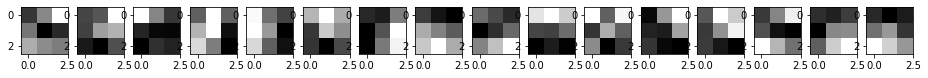

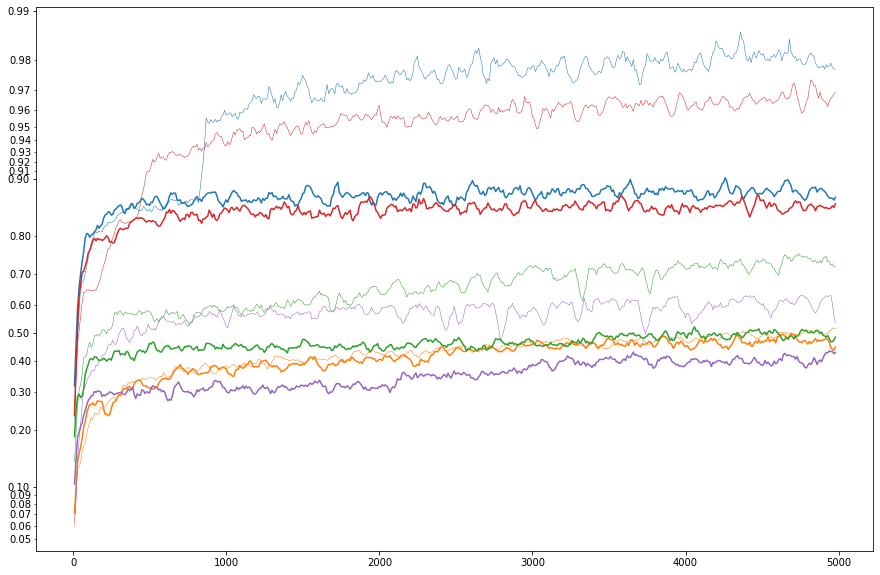

In [0]:
images = [np.load("../numpy_saved/a1_weights1.npy")[:, :, 0, i] for i in range(16)]
mnist.draw(*images, columns = 16)

plt.figure(figsize = (15, 10))
plt.yscale('logit')
for i, name in enumerate(networks.keys()):
    color = 'C%d' % i
    group_accuracies_x, group_accuracies_y = batch_indices, network_accuracies[name]
    solo_accuracies_x, solo_accuracies_y = globals()[name].accuracy_history
    ##############
    # сглаживание графиков
    group_accuracies_y = np.convolve(group_accuracies_y, [0.2] * 5, mode = 'same')
    solo_accuracies_y = np.convolve(solo_accuracies_y, [0.2] * 5, mode = 'same')
    ##############
    # убираем последние 2 значения в каждом графике, нарушенные сглаживанием
    plt.plot(group_accuracies_x[:-2], group_accuracies_y[:-2], color = color, linewidth = 1.5)
    plt.plot(solo_accuracies_x[:-2], solo_accuracies_y[:-2], color = color, linewidth = 0.5)
plt.show()

Выше приведены для примера ядра первого сверточного слоя блока A1, а затем графика, на которых цвет означает обучающий набор и нейрость, толстой линией обозначается точность при параллельном обучении, тонкой линией точность при отдельном обучении. Как видим, почти для всех задач точность при параллельном обучении ниже, что неудивительно.

Теперь проверим, как можно помочь блок A1 в новой задче распознавания. Используем датасет fashion mnist. Сначала будем использовать при обучении исходные изображения, затем обработанные блоком A1, обученным ранее.

In [0]:
# обработаем все изображения fashion mnist с помощью блока A1

fashion_recognition.x_train_processed = np.zeros((60000, a1_out_size))
fashion_recognition.x_test_processed = np.zeros((10000, a1_out_size))
with tf.Session() as sess:
    sess.run(a1_weights1.assign(np.load("../numpy_saved/a1_weights1.npy")))
    sess.run(a1_biases1.assign(np.load("../numpy_saved/a1_biases1.npy")))
    sess.run(a1_weights2.assign(np.load("../numpy_saved/a1_weights2.npy")))
    sess.run(a1_biases2.assign(np.load("../numpy_saved/a1_biases2.npy")))
    for i in range(60):
        # делим на части, чтобы компьютер справился
        print(i, end = '\r')
        index_min = i*1000
        index_max = (i+1)*1000
        fashion_recognition.x_train_processed[index_min:index_max, :] = sess.run(a1_out, feed_dict = {
            a1_input: fashion_recognition.x_train[index_min:index_max]
        })
    for i in range(10):
        print(i, end = '\r')
        index_min = i*1000
        index_max = (i+1)*1000
        fashion_recognition.x_test_processed[index_min:index_max, :] = sess.run(a1_out, feed_dict = {
            a1_input: fashion_recognition.x_test[index_min:index_max]
        })
print(fashion_recognition.x_train_processed.shape, fashion_recognition.x_test_processed.shape)

fashion_recognition.x_train_flat = fashion_recognition.x_train.reshape(60000, 32*32)
fashion_recognition.x_test_flat = fashion_recognition.x_test.reshape(10000, 32*32)

(60000, 1344) (10000, 1344)


In [0]:
from sklearn.metrics import accuracy_score

model1 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(300, activation = 'relu', input_shape = (32*32,)),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'softmax')
])
model1.compile( optimizer = 'adam',  loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model1_accuracies = []
for i in range(50):
    model1.fit(fashion_recognition.x_train_flat,
               fashion_recognition.y_train.argmax(axis = 1), epochs = 1, verbose = 0, batch_size = 200)
    prediction = model1.predict(fashion_recognition.x_test_flat).argmax(axis = 1)
    acc = accuracy_score(fashion_recognition.y_test.argmax(axis = 1), prediction)
    model1_accuracies.append(acc)
    print("Iteration %d, accuracy %g" % (i, acc), end = '\r')

In [0]:
model2 = tf.keras.models.Sequential([
    tf.keras.layers.Dense(300, activation = 'relu', input_shape = (a1_out_size,)),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'softmax')
])
model2.compile( optimizer = 'adam',  loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
model2_accuracies = []
for i in range(50):
    model2.fit(fashion_recognition.x_train_processed,
               fashion_recognition.y_train.argmax(axis = 1), epochs = 1, verbose = 0, batch_size = 200)
    prediction = model2.predict(fashion_recognition.x_test_processed).argmax(axis = 1)
    acc = accuracy_score(fashion_recognition.y_test.argmax(axis = 1), prediction)
    model2_accuracies.append(acc)
    print("Iteration %d, accuracy %g" % (i, acc), end = '\r')

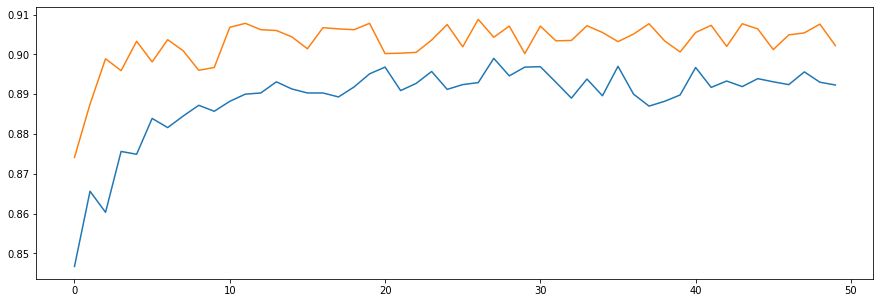

In [0]:
plt.figure(figsize = (15, 5))
plt.plot(range(50), model1_accuracies, color = 'C0')
plt.plot(range(50), model2_accuracies, color = 'C1')
plt.show()

Мы обучили первые сверточные слои параллельно на разных задачах распознавания и теперь проверили их работу на новой задаче распознавания, зафиксировав веса.

Оранжевый график означает точность на обработанных изображениях, и она выше, чем точность на необработанных. Это напоминает ситуацию, когда ручное выделение линий операцией схожести помогло повысить точность. Этого простого теста, впрочем, недостаточно, чтобы показать полезность блока A1 как концепции и выбранного метода его обучения.
1. Блок A1 устроен слишком просто
- Блок A1 обучался и тестировался на недостаточном количестве задач, не покрывающих собой все многообразие задач рапознавания
- Изображения имеют слишком малое разрешение, из-за чего области выделения локальных признаков по размеру приближаются к размеру изображения, так что признаки перестают быть локальными

Кроме того, пока не обсуждалось, как обучать следующие универсальные блоки в концепции разделения уровней абстракции: A2 и A3.

### Пространственная независимость <a class="anchor" id="neuro_geometric_independency"></a>

Под пространственной независимостью мы будем понимать способность определять объекты и их свойства вне зависимости от того, где  поле зрения находится объект, каков его масштаб, поворот или деформация (в разумных пределах).

Этот вопрос уже обсуждался в предыдущих разделах, были сделаны следующие предположения:
1. При недостаточном обучающем наборе нейросеть может связать классы объектов с их положением в поле зрения. Это может дать высокую точность на обучающем наборе и низкую точность на любом другом наборе. Это частный случай переобучения: нейросеть реализует в себе неправильные рассуждения, подогнанные под обучающий набор (иллюстрация ниже).
2. При обучении можно заменять каждый объект на набор его всевозможных трансформаций (масштаб, сдвиг, поворот, искажение). Все трансформации перебрать невозможно, и все равно остается шанс, что при трансформациях, которые не встречались при обучении, нейросеть не будет распознавать объект. Однако возможно при таком обучении повышается шанс того, что нейросеть перестанет пытаться связать класс объекта с его местоположением.
3. Нейросеть, обученная согласно концепции разделения уровней абстракции, скорее всего будет обладать свойством пространственной независимости, поскольку идеей этой модели как раз и является обнаружение геометрических форм вне зависимости от их трансформации. Однако это просто переформулировка проблемы, поскольку способов обучения слоев после A1 не было предложено.

<img src="files/image.png">

При попытке понять, как может функционировать пространственно-независимая сеть, первым с голову приходит следующее. Представим слой L из N нейронов, каждый из которых реагирует на конкретное пространственное положение объекта. Тогда если хотя бы один нейрон активирован, значит объект найден в таком-то положении. Но количество всевоможных трансформаций каждого объекта (даже простого круга), очень велико. Получается, что нейроны и веса используются неэкономно: зная форму распознаваемого объекта можно простой программой вычислить веса всего слоя L. Кроме того, чтобы такой сети обучиться, нужно много обучающих примеров. Значит нужна другая архитектура.

Вообще интересно было бы проверить, может ли обычная полносвязная или сверточная нейросеть распознать объект, если при обучении этот объект никогда не встречался в таком положении. Проведем эксперимент:

Соберем обучающий набор из цифр, находящихся в разном положении в поле зрения. Намеренно исключим из этого набора девятки, находящиеся в центре, а также некоторые другие цифры в определенных местах. После обучения нейросети проверим, как процент распознавания зависит от местоположения цифр. Проведем данный тест для полносвязной нейросети, сверточной нейросети и сверточной нейросети с дропаутом. В идеале ответ изменяться не должен, но может случиться так, что в каких-то положениях сеть внезапно перестает правильно распознавать цифру. В таком случае данная архитектура обладает пространственной зависимостью.

In [0]:
# Можно начинать выполнение ноутбука с этой ячейки

import tensorflow as tf
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time, math, PIL
import mnistlib as mnist
mnist.init()
import gc, random

small_images = [mnist.pil_to_np(mnist.np_to_pil(img).resize((14, 14))) / 255 for img in mnist.x_train]

excludes = [
    {'digit': 9, 'xrange': (0.4, 0.6), 'yrange': (0.4, 0.6)},
    {'digit': 6, 'xrange': (0.7, 0.9), 'yrange': (0.6, 0.8)},
    {'digit': 1, 'xrange': (0.4, 0.6), 'yrange': (0.1, 0.3)},
    {'digit': 2, 'xrange': (0.4, 0.6), 'yrange': (0.1, 0.3)}
]

def _check(digit, x, y):
    for rule in excludes:
        if (digit == rule['digit'] and x > rule['xrange'][0] and x < rule['xrange'][1]
                and y > rule['yrange'][0] and y < rule['xrange'][1]):
            return False
    return True

#генерация кортежа (изображение, ответ, X, Y), где X и Y от 0 до 50, изображение размером 64х64 содержит пиксели от 0 до 1
def generate_new_pair(use_excludes = True):
    index = np.random.randint(60000)
    answer = mnist.y_train[index]
    x = random.random()
    y = random.random()
    if use_excludes and not _check(answer, x, y):
        return generate_new_pair() #повторяем генерацию заново
    digit_image = small_images[index]
    resulting_image = np.zeros((50 + 2*7, 50 + 2*7))
    shift_x = round(50 * x)
    shift_y = round(50 * y)
    resulting_image[shift_y:shift_y+14, shift_x:shift_x+14] = digit_image
    return resulting_image, answer, shift_x, shift_y

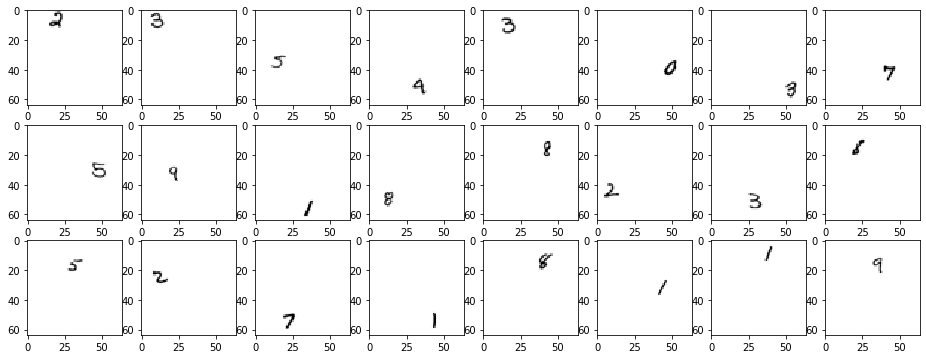

In [0]:
mnist.draw(*[generate_new_pair()[0] for _ in range(24)], columns = 8)

Проверим, как выглядят усредненные изображения по 100000 генераций для каждой цифры.

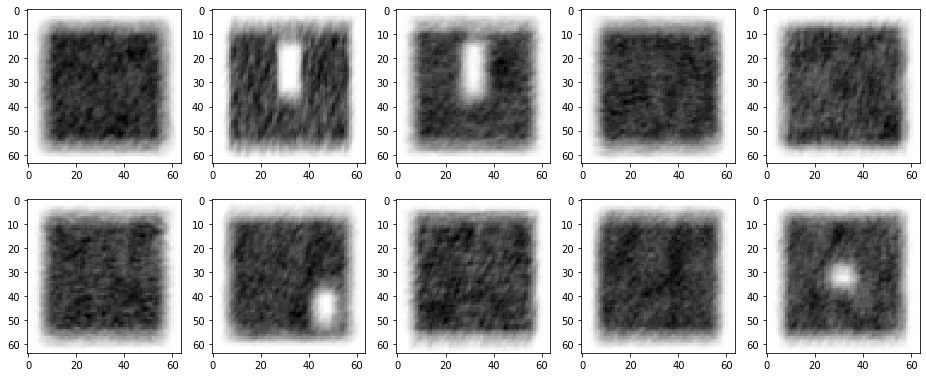

In [0]:
sums = [np.zeros((64, 64)) for _ in range(10)]
for i in range(100000):
    print(i, end = '\r')
    img, label, _, _ = generate_new_pair()
    sums[label] += img
mnist.draw(*sums, columns = 5)

In [0]:
#Фунуция, генерирующая набор данных
def generate_dataset(size, use_excludes = True):
    images = []
    labels = []
    dx_array = []
    dy_array = []
    for i in range(size):
        img, label, dx, dy = generate_new_pair(use_excludes = use_excludes)
        images.append(img)
        labels.append(label)
        dx_array.append(dx)
        dy_array.append(dy)
    return np.array(images), np.array(labels), np.array(dx_array), np.array(dy_array)

Тест каждой нейросети будет содержать следующие стадии:
1. Конструирование и обучение, вывод удаляется для экономии места в ноутбуке
2. Отрисовка графика точности и по возможности матриц весов первого слоя
3. Проверка точности распознавания в зависимости от цифры и ее положения

In [0]:
# Очищаем память
del mnist.x_train
del mnist.x_train_flat
del mnist.x_val
del mnist.x_val_flat
del sums
gc.collect();

**Полносвязная нейросеть**

In [0]:
# Основные параметры обучения и проверки
max_iter = 100 #максимальное количество итераций
tail_iter = 10 # если точность не выросла за столько итераций, завершаем обучение
test_dataset_size = 10000
train_dataset_size = 50000
epochs_per_iter = 2 #количество эпох обучения на одну итерацию (между итерациями генерируются новый обучающий датасет)
keras_verbose = 0

model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(300, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'softmax')
])
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
test_images, test_labels, _, _ = generate_dataset(size = test_dataset_size) #тестовый датасет
accuracy = []
for i in range(max_iter):
    gc.collect()
    print("Итерация", i, "генерация...    ", end = '\r')
    train_images, train_labels, _, _ = generate_dataset(size = train_dataset_size)
    print("Итерация", i, "обучение...    ", end = '\r')
    model.fit(train_images, train_labels, epochs = epochs_per_iter, verbose = keras_verbose, batch_size = 200)
    print("Итерация", i, "оценка...    ", end = '\r')
    loss, acc = model.evaluate(test_images[:, :, :, np.newaxis], test_labels, verbose = 0)
    print("Итерация", i, "точность", acc)
    accuracy.append(acc)
    if len(accuracy) > tail_iter and accuracy[-tail_iter] > max(accuracy[-tail_iter+1:]):
        print("Точность не выросла за последние %d итераций, обучение закончено" % tail_iter)
        break

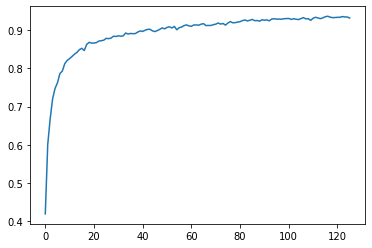

In [0]:
plt.figure(figsize = (6, 4))
plt.plot(accuracy)
plt.show()

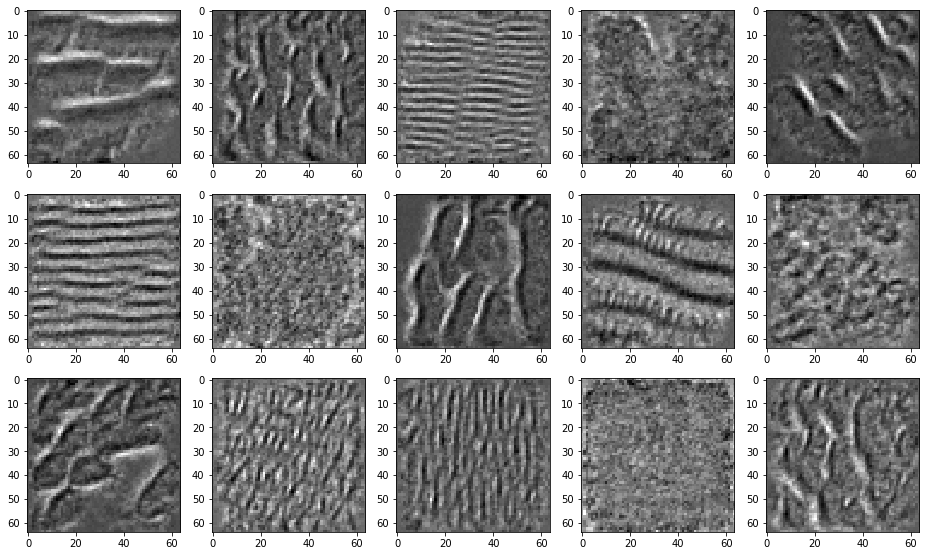

In [0]:
# примеры нейронов первого слоя

first_layer_weights = model.get_layer(index = 1).get_weights()[0].reshape((64, 64, -1))

matrices = []
for neuron_index in [0, 1, 2, 4, 21, 27, 35, 37, 47, 59, 81, 86, 103, 115, 121]:
    neuron_weights = first_layer_weights[:, :, neuron_index]
    matrices.append(neuron_weights)
mnist.draw(*matrices, columns = 5)

In [0]:
del test_images, test_labels, train_images, train_labels
gc.collect()

169674

In [0]:
# исследуем пространственную независимость сети

correct_predictions_count = np.zeros((10, 51, 51))
all_predictions_count = np.zeros((10, 51, 51))

test_dataset_size = 50000
for i in range(10):
    gc.collect()
    print("Тестовый датасет номер", i, end = '\r')
    test2_images, test2_labels, dx, dy = generate_dataset(size = test_dataset_size, use_excludes = False)
    prediction = model.predict(test2_images).argmax(axis = 1)
    for i in range(test_dataset_size):
        if prediction[i] == test2_labels[i]:
            correct_predictions_count[test2_labels[i], dy[i], dx[i]] += 1
        all_predictions_count[test2_labels[i], dy[i], dx[i]] += 1

correct_prediction_percent = np.nan_to_num(correct_predictions_count / all_predictions_count, copy = False)

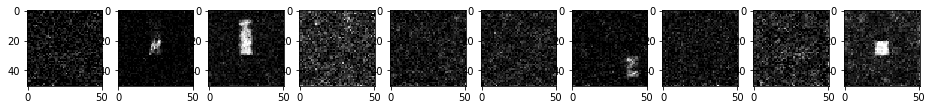

In [0]:
mnist.draw(*[correct_prediction_percent[i, :, :] for i in range(10)], columns = 10)

Каждое изображение выше соответствует одной цифре, закрашенность точки XY соответствует точности распознавания цифры, расположенной с данным смещением. Как видим, нейросеть не распознает девятки, находящиеся в центре, поскольку их не было в обучающем наборе. Аналогичная ситуация с другими исключениями. Таким образом, что обученная полносвязная нейросеть имеет сильную пространственную зависимость. Это значит, что данная нейросеть не может анализировать форму цифры в отрыве от ее местоположения, выводы в этой нейросети делаются на основании абсолютного расположение закрашенных пикселей, а не их взаимного расположения. Очевидно, что если мы будем использовать такую нейросеть для распознавания более сложных объектов, то точность будет очень низкой.

**Сверточная нейросеть**

Сверточные нейросети в процессе вычислений оперируют тензорами значительно больших размеров, чем полносвязные: даже один сверточный слой с 16 фильтрами, обрабатывая изображение 64x64, выдает тензор рамером 64x64x16. Это сильно замедляет обучение. Кроме того, хочется как можно сильнее уменьшить значимость полносвязного (а значит сильно зависящего от местоположения объекта а поле зрения) компонента в нейросети. Для этого можно увеличить количество сверточных и макс-пулинг слоев, что еще больше замедлит вычисления в нейросети, а также увеличит ее глубину, из-за чего потребуется больше итераций для обучения. Выходов несколько:
1. Собрать глубокую сверточную сеть и использовать для обучения облачные вычисления на GPU/TPU
3. Уменьшить глубину и довольствоваться по сути полносвязной нейросетью, первые 2 слоя которой сверточные. Можно также использовать обученный в предыдущем разделе блок A1.
3. Найти в интернете готовую глубокую сверточную нейросеть и дообучить ее.
4. Поскольку функционирование идеальной пространственно-независимой нейросети, распознающей небольшие объекты, не зависит от размера всего поля зрения, обучить нейросеть не меньшем поле зрения, а затем попробовать адаптировать ее для большего поля зрения.

Выберем первый способ.

In [0]:
#загружаем ноутбук на google colab, затем скачиваем

# Основные параметры обучения и проверки
max_iter = 15 #максимальное количество итераций
desired_accuracy = 0.935 #обучаем до такой же точности, как полносвязную нейросеть
test_dataset_size = 10000
train_dataset_size = 5000
epochs_per_iter = 1 #количество эпох обучения на одну итерацию (между итерациями генерируются новый обучающий датасет)
keras_verbose = 0

model_conv = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, kernel_size = 3, padding = 'same', activation = 'relu', input_shape = (64, 64, 1)),
    # размер выходного тензора x=64, y=64, channels=32
    tf.keras.layers.Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu'),
    # размер выходного тензора x=64, y=64, channels=64
    tf.keras.layers.MaxPooling2D(pool_size = (2, 2)),
    # размер выходного тензора x=32, y=32, channels=64
    tf.keras.layers.Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu'),
    # размер выходного тензора x=32, y=32, channels=64
    tf.keras.layers.MaxPooling2D(pool_size = (2, 2)),
    # размер выходного тензора x=16, y=16, channels=64
    tf.keras.layers.Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu'),
    # размер выходного тензора x=16, y=16, channels=64
    tf.keras.layers.MaxPooling2D(pool_size = (2, 2)),
    # размер выходного тензора x=8, y=8, channels=64
    tf.keras.layers.Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu'),
    # размер выходного тензора x=8, y=8, channels=64
    tf.keras.layers.MaxPooling2D(pool_size = (2, 2)),
    # размер выходного тензора x=4, y=4, channels=64
    tf.keras.layers.Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu'),
    # размер выходного тензора x=4, y=4, channels=64
    tf.keras.layers.MaxPooling2D(pool_size = (2, 2)),
    # размер выходного тензора x=2, y=2, channels=64
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'softmax')
])
model_conv.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
test_images, test_labels, _, _ = generate_dataset(size = test_dataset_size) #тестовый датасет
accuracy = []
for i in range(max_iter):
    gc.collect()
    print("Итерация", i, "генерация...    ", end = '\r')
    train_images, train_labels, _, _ = generate_dataset(size = train_dataset_size)
    print("Итерация", i, "обучение...    ", end = '\r')
    model_conv.fit(train_images[:, :, :, np.newaxis], train_labels,
                   epochs = epochs_per_iter, verbose = keras_verbose, batch_size = 32)
    print("Итерация", i, "оценка...    ", end = '\r')
    loss, acc = model_conv.evaluate(test_images[:, :, :, np.newaxis], test_labels, verbose = keras_verbose)
    print("Итерация", i, "точность", acc)
    accuracy.append(acc)
    if acc >= desired_accuracy:
        print("Достигнута требуемая точность, обучение закончено")
        break

Итерация 0 точность 0.21660000085830688
Итерация 1 точность 0.583899974822998
Итерация 2 точность 0.8758000135421753
Итерация 3 точность 0.9157000184059143
Итерация 4 точность 0.9146999716758728
Итерация 5 точность 0.9526000022888184
Достигнута требуемая точность, обучение закончено


In [0]:
# исследуем пространственную независимость сети

correct_predictions_count = np.zeros((10, 51, 51))
all_predictions_count = np.zeros((10, 51, 51))

test_dataset_size = 50000
for i in range(10):
    gc.collect()
    print("Тестовый датасет номер", i, end = '\r')
    test2_images, test2_labels, dx, dy = generate_dataset(size = test_dataset_size, use_excludes = False)
    prediction = model_conv.predict(test2_images[:, :, :, np.newaxis]).argmax(axis = 1)
    for i in range(test_dataset_size):
        if prediction[i] == test2_labels[i]:
            correct_predictions_count[test2_labels[i], dy[i], dx[i]] += 1
        all_predictions_count[test2_labels[i], dy[i], dx[i]] += 1

correct_prediction_percent = np.nan_to_num(correct_predictions_count / all_predictions_count, copy = False)

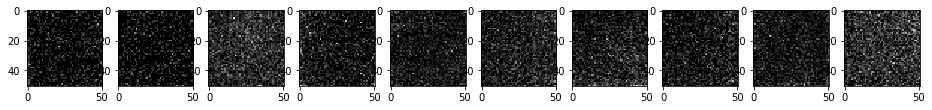

In [0]:
mnist.draw(*[correct_prediction_percent[i, :, :] for i in range(10)], columns = 10)

В данном разделе сделано два важных вывода:

1. Полносвязная нейросеть не умеет распознавать цифры в тех местах изображения, где они не встречались при обучении
2. Нейросеть с 6 сверточными, 5 max-pooling и двумя полносвязными слоями, наоборот, хорошо справляется с этой задачей

Наша сверточная нейросеть содержала сверточные и max-pooling слои. Обратим внимание на переход от последнего max-pooling слоя к первому полносвязному слою. В этом месте трехмерный тензор признаков преобразуется в одномерный вектор. В нашем случае тензор признаков имеет размер всего 2x2 по осям X и Y. Можно было бы привести его даже к размеру 1x1 по XY, добавив еще один сверточный слой 3х3 и max-pooling, но в случае padding=valid это эквивалентно добавлению полносвязному слою, а padding=same вряд ли сильно измению ситуацию. Таким образом, с помощью сверточных слоев мы уменьшили размерность по осям XY до минимума.

Если бы пар (сверточный слой + max-pooling слой) было меньше, то при переходе к первому полносвязному слою размерность тензора признаков (x, y, признак) по XY была бы больше (4x4, 8x8, ...).

Если верно предположение, что пространствнная зависимость возникает тогда, когда на вход полносвязному слою подается тензор, две координаты которого представляют собой по смысл координаты X и Y на исходном изображении и имеют существенный диапазон, то в таком случае нейросеть с недостаточным количеством сверточных слоев может обладать пространственной зависимостью. Это можно проверить.

In [0]:
# используем colab

# Основные параметры обучения и проверки
max_iter = 15 #максимальное количество итераций
desired_accuracy = 0.935 #обучаем до такой же точности, как полносвязную нейросеть
test_dataset_size = 10000
train_dataset_size = 20000
epochs_per_iter = 1 #количество эпох обучения на одну итерацию (между итерациями генерируются новый обучающий датасет)
keras_verbose = 0

model_conv2 = tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32, kernel_size = 3, padding = 'same', activation = 'relu', input_shape = (64, 64, 1)),
    # размер выходного тензора x=64, y=64, channels=32
    tf.keras.layers.Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu'),
    # размер выходного тензора x=64, y=64, channels=64
    tf.keras.layers.MaxPooling2D(pool_size = (2, 2)),
    # размер выходного тензора x=32, y=32, channels=64
    tf.keras.layers.Conv2D(64, kernel_size = 3, padding = 'same', activation = 'relu'),
    # размер выходного тензора x=32, y=32, channels=64
    tf.keras.layers.MaxPooling2D(pool_size = (2, 2)),
    # размер выходного тензора x=16, y=16, channels=64
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation = 'relu'),
    tf.keras.layers.Dense(10, activation = 'softmax')
])
model_conv2.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = ['accuracy'])
test_images, test_labels, _, _ = generate_dataset(size = test_dataset_size) #тестовый датасет
accuracy = []
for i in range(max_iter):
    gc.collect()
    print("Итерация", i, "генерация...    ", end = '\r')
    train_images, train_labels, _, _ = generate_dataset(size = train_dataset_size)
    print("Итерация", i, "обучение...    ", end = '\r')
    model_conv2.fit(train_images[:, :, :, np.newaxis], train_labels,
                   epochs = epochs_per_iter, verbose = keras_verbose, batch_size = 32)
    print("Итерация", i, "оценка...    ", end = '\r')
    loss, acc = model_conv2.evaluate(test_images[:, :, :, np.newaxis], test_labels, verbose = keras_verbose)
    print("Итерация", i, "точность", acc)
    accuracy.append(acc)
    if acc >= desired_accuracy:
        print("Достигнута требуемая точность, обучение закончено")
        break

Итерация 0 точность 0.8560000061988831
Итерация 1 точность 0.9240000247955322
Итерация 2 точность 0.9451000094413757
Достигнута требуемая точность, обучение закончено


In [0]:
# исследуем пространственную независимость сети

correct_predictions_count = np.zeros((10, 51, 51))
all_predictions_count = np.zeros((10, 51, 51))

test_dataset_size = 50000
for i in range(10):
    gc.collect()
    print("Тестовый датасет номер", i, end = '\r')
    test2_images, test2_labels, dx, dy = generate_dataset(size = test_dataset_size, use_excludes = False)
    prediction = model_conv2.predict(test2_images[:, :, :, np.newaxis]).argmax(axis = 1)
    for i in range(test_dataset_size):
        if prediction[i] == test2_labels[i]:
            correct_predictions_count[test2_labels[i], dy[i], dx[i]] += 1
        all_predictions_count[test2_labels[i], dy[i], dx[i]] += 1

correct_prediction_percent = np.nan_to_num(correct_predictions_count / all_predictions_count, copy = False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in true_divide


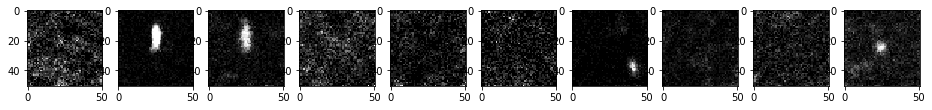

In [0]:
mnist.draw(*[correct_prediction_percent[i, :, :] for i in range(10)], columns = 10)

В случае трех сверточных и двух max pooling слоев мы видим пространственную зависимость, но уже не так ярко выраженную, как в случае полносвязной нейросети. Можно сделать два предположения:

Если на вход полносвязному слою подается тензор, две координаты которого X' и Y' представляют собой по смыслу координаты X и Y на исходном изображении, то:

**Предположение 1.** Чем больше диапазон значений по этим координатам, тем больше пространственная зависимость нейросети.

**Предположение 2.** Пусть dX - смещение по X на исходном изображении, эквивалентное смещению на 1 по X', аналогично определяем dY. Например, если изображение 64x64 преобразовано в тензор размером 8x8x256, то dX=dY=8, поскольку размерность по осям XY уменьшилась в 8 раз. Предположение: существенная пространственная зависимость появляется тогда, когда размер (dX, dY) становится меньше размера объектов, которые мы пытаемся распознавать. Объяснение: если (dX, dY) больше размеров объекта, то весь объект кодируется лишь в одном столбце признаков, тем самым исключаются компоненты XY. Возможно и этого недостаточно, и нужно вообще исключать полносвязный слой, "изучающий" все изображение, а анализировать нейросетью каждую часть изображения размером с объект.

Пространственная независимость в широком смысле может означать умение распознавать объект независимо не только от положения, но и от масштабирования, поворота и деформации.

При конструировании универсального блока (A1) для выделения локальных признаков мы подавали ему на вход не только само изображение, но также и уменьшенные его копии. Это может способствовать тому, что нейросеть будет распознавать объект в таких масштабах, которые не встречались в обучающих данных. Но количество копий ограничено (мы использовали масштабы 1x, 2x, 4x), и для имитации всех возможных масштабов с достаточно точностью придется создавать очень много копий. Значит нужен другой подход.

В идеале хотелось бы иметь архитектуру, которая распознает отдельно форму фигур и их детали, а отдельно масштаб фигур. Последующие слои могут делать выводы на основании только формы, игнорируя масштаб. Это похоже на блок A2, обсуждаемый ранее. Обсуждался также блок A3, занятый распознаванием деформированных фигур: определением предположительной исходной фигуры и степени ее деформации.

Понятно, что если мы будем "с нуля" обучать нейросеть на конкретной задаче, то у нас не хватит обучающих примеров на все возможные смещения, масштабы, повороты и деформации. Нейросеть с большим количеством последовательно соединенных сверточных слоев возможно будет инвариантна по смещениям, но вряд ли будет инвариантна по поворотам и масштабам.

Можно попробовать обучать блок A2 на произвольных фигурах, которых можно сгенерировать сколь угодно много. Блок A2 должен на выходе давать такие данные, по которым следующие слои легко могли бы определить, что несколько поданных на вход изображений - одна и та же фигура, но с разным смещением, поворотом или увеличением.

Тогда какие-то выходы блока A2 должны зависеть от формы фигуры, какие-то от смещения, какие-то от масштаба. Но проблема в том, что фигур в поле зрения может быть много, тогда неясно, каков должен быть размер выходных данных блока A2. Хотелось бы реализовать уже упоминаемую выше концепцию внимания, когда нейросеть поочередно "рассматривает" то одну, то другую фигуру. В этом случае блок A2 может иметь не слишком много выходов, но при этом быть рекурсивным.

Пока остановимся на этом и не будем пытаться рализовать эту идею.

### Генетический алгоритм <a class="anchor" id="neuro_genetic_algorithm"></a>

В предыдущей главе мы рассмотрели проблему пространственной зависимости. Как выяснилось, эта проблема решается только путем совершенствования архитектуры нейросети. А ведь мы рассмотрели только нейросети для распознавания примитивных фигур, тогда как количество области, где можно на практике применить нейросети, гораздо выше: анализ звуков, видео, трехмерных изображений, генерация изображений, выявление сложных зависимостей, логические рассуждения и предсказания, общение, умение воспринимать красоту подобно человеку и так далее.

Скорее всего в этих задачах найдутся такие же проблемы, когда простая архитектура окажется несостоятельной и потребуется ее адаптация к конкретным задачам. Но возможно мы не сможем даже выявить такого рода проблемы, а значит и решить их. В случае пространственной зависимости проблема лежит на поверхности. А если наша нейросеть будет состоять, как мозг, из многих отделов, и проблема будет скрыта в одном из промежуточных отделов? Понять промежуточные рассуждения нейросети сложно, а значит сложно будет даже выявить проблему.

Здесь может помочь генетический алгоритм, который вносит случайные изменения и фиксирует наиболее удачные из них, при этом не сразу обрасывая неудачные.

Генетический алгоритм, называемый в живой природе естественным отбором, может быть не совсем случайным (из биологии известно, что скорость мутаций может быть также заложена в генетический код и меняться в зависимости от внешних факторов), а также реализовывать половое размножение или горизонтальный обмен генами. Мы будем рассматривать генетический алгоритм в его простом варианте.

В качестве "особей" в общем случае можно рассматривать не готовые нейросети, и даже не архитектуры, а алгоритмы. Популяция состоит из определенного числа особей-алгоритмов. Алгоритму дается фиксированное время на работу, после чего он должен сгенерировать нейросеть. Затем оценивается точность нейросети на тестовом наборе данных. Чем выше точность, тем выше коэффициент размножения данной особи-алгоритма. Цикл завершается размножением алгоритмов в соответствии с их коффициентами так, чтобы общее число потомков равнялось числу предков - получаем слдующее поколение. При размножении в каждый алгоритм вносятся случайные мутации.

Алгоритм принимает на вход нейросеть, которая является результатом работы его предка, и может например делать например следующее:
- Дообучать нейросеть, имея в распоряжении тренировочный набор данных, общий для всей популяции
- Сбрасывать веса и начинать обучение заново
- Изменять архитектуру нейросети

Здесь важно различать тестовый и проверочный набор данных. Проверочный набор не должен использоваться в обучении, а значит в расчете коэффициентов размножения, иначе все обучение сведется к подгонке под ответ: точность на данном тестовом наборе будет расти, но на любых других тестовых наборах будет низкой. Но тренировочный набор также нельзя использовать в расчете коэфициентов размножения - иначе самое умное, что может сделать алгоритм - это запомнить все тренировочные примеры и ответы. Значит нам нужно три набора данных: тренировочный, тестовый и проверочный.

Основной вопрос в том, как закодировать весь алгоритм в некоей структуре данных - генетическом коде, который можно будет подвергнуть мутациям. Генетический код не обязательно должен выглядеть как последовательность бит, это может быть сложная древовидная структура данных, главное чтобы существовал алгоритм ее случайных изменений.

Чем более сложные алгоритмы можно сгенерировать с помощью мутаций, тем более продвинут весь генетический алгоритм в целом.

По сути научный прогресс в области нейросетей сам представляет собой большой генетический алгоритм: способы конструирования и обучения нейросетей все больше совершенствуются, внимание к неудачным способам уменьшается, к удачным увеличивается.

Проблема. Пусть особь-алгоритм внес некое изменение в нейросеть, за счет которого она обучается медленнее, но достигает большей точности. Пусть такой нейросети для раскрытия ее потенциала нужно длительное обучение, которое может занять по времени много поколений. Тогда такая нейросеть будет отсеяна естественным отбором, так как ее конкуренты в следующих поколениях будут демонстририровать преимущество.

Попробуем сначала реализовать более простой генетический алгоритм, работающий с полносвязными нейросетями.

- Инициализация:
    - Генерируется первое поколение из N нейросетей какой-либо конфигурации
    - Выбирается тренировочный, тестовый и валидационный (опционально) набор данных
- Цикл:
    - Шаг 1: каждая нейросеть текущего поколения обучается в течение заданного времени на обучающем наборе
    - Шаг 2: для каждой нейросети расчитывается точность на тестовом наборе данных
    - Шаг 3: для каждой нейросети расчитывается, сколько она оставит потомков, на основе точности
    - Шаг 4: из потомков формируется следующее поколение, при этом осуществляются случайные мутации архитектуры

Возможные мутации архитектуры:
- Добавление нового слоя перед любым слоем
- Удаление любого слоя кроме выходного
- Изменение размеров любого слоя
- Изменение функции активации любого слоя
- Изменение оптимизатора модели или его параметров

Большая часть перечисленных операций повлечет за собой изменения в работе нейросети. Например, рассмотрим добавление нового слоя. В случае, если новый слой будет больше следующего и оба слоя будут иметь функцию активации relu, то можно будет настоить веса так, чтобы работа нейросети не изменилась. Но в других случаях без ухудшения точности нейросети не обойтись. Есть два подхода:
- Стараться настроить веса нового и следующего слоев так, чтобы точность нейросети не слишком сильно ухудшилась при мутации
- Инициализировать веса нового и следующего слоев случайным образом (то есть веса целого слоя будут удалены) и надеяться, что алгоритм оптимизации сможет обучить новую сеть

В дальнейшем проверим эффективность того или иного подхода.

In [9]:
# Можно начинать выполнение ноутбука с этой ячейки

use_colab = False

In [10]:
# в версии tensorflow 2.2.0 не работает model.stop_training, приходится использовать версию 1.x в colab
%tensorflow_version 1.x

UsageError: Line magic function `%tensorflow_version` not found.


In [2]:
import tensorflow as tf
from tensorflow.keras import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
import time, math, PIL
import pandas as pd
import IPython
import mnistlib as mnist
mnist.init()
import gc, random
tf.keras.backend.set_floatx('float64') #убираем предупреждения

import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR) #убираем предупреждения

Наши модели будут начинаться с Flatten-слоя, принимающего изображения 28х28, затем будут чередоваться Dense и Dropout слои, заканчиваться модель будет слоем Dense с 10 нейронами и функцией активации softmax.

- **construct_new_model** - функция для создания моделей
- **clone_model** - копирование моделей
- **__check** - проверка модели на корректность (например, правильный размер входных данных и пр.)
- **decompose** - функция, возвращающая массив Dense слоев, массив Dropout-рейтов и оптимизатор
- **compose** - сборка модели, принимает кортеж данных аналогичный возвращаемому из функции decompose
- **model_short_summary** - печать архитектуры модели в одну строку
- **model_graphical_summary** - возвращает архитектуру модели в виде изображения

In [12]:
#size - количество скрытых dense-слоев
#neurons_count - функция, принимающая номер слоя и кол-во нейронов в предыдущем слое, должна вернуть кол-во нейронов
def construct_new_model(
    size,
    neurons_count = lambda layer_index, prev_count: 28*28,
    dropout_min = 0,
    dropout_max = 0.9,
):
    model = Sequential()
    model.add(Flatten(input_shape = (28, 28)))
    prev_layer_output_size = 28*28
    def add_dropout():
        rate = random.uniform(dropout_min, dropout_max)
        model.add(Dropout(rate, input_shape = (prev_layer_output_size,)))
    add_dropout()
    for i in range(size):
        new_layer_size = neurons_count(i, prev_layer_output_size)
        model.add(Dense(new_layer_size, activation = 'relu', input_shape = (prev_layer_output_size,)))
        prev_layer_output_size = new_layer_size
        add_dropout()
    model.add(Dense(10, activation = 'softmax', input_shape = (prev_layer_output_size,)))
    model.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
    return model

def clone_model(model):
    new_model = tf.keras.models.clone_model(model)
    new_model.compile(loss = 'sparse_categorical_crossentropy', optimizer = model.optimizer, metrics = ['accuracy'])
    new_model.set_weights(model.get_weights())
    return new_model

def __check(keras_model):
    flatten_layer = keras_model.layers[0]
    assert flatten_layer.__class__ == Flatten, flatten_layer.__class__
    assert flatten_layer.input_shape != None
    assert len(flatten_layer.input_shape) == 3, flatten_layer.input_shape
    assert flatten_layer.input_shape[1] == 28, flatten_layer.input_shape
    assert flatten_layer.input_shape[2] == 28, flatten_layer.input_shape
    layers_except_flatten = keras_model.layers[1:]
    layers_count = len(layers_except_flatten)
    assert layers_count > 0
    assert layers_count % 2 == 0, layers_except_flatten
    for i, layer in enumerate(layers_except_flatten):
        if i % 2 == 0:
            assert layer.__class__ == Dropout, layer.__class__
        else:
            assert layer.__class__ == Dense, layer.__class__
            assert layer.input_shape != None
            assert layer.output_shape != None
            if i == layers_count - 1:
                assert layer.output_shape[1] == 10, layer.output_shape
                assert layer.activation == tf.keras.activations.softmax, layer.activation.__name__
                
#возвращает массив dropout рейтов, массив dense-слоев и оптимизатор
def decompose(model):
    layers_except_flatten = model.layers[1:]
    dropout_layers = layers_except_flatten[::2]
    dense_layers = layers_except_flatten[1::2]
    dropout_rates = [layer.rate for layer in dropout_layers]
    return dropout_rates, dense_layers, model.optimizer

def compose(dropout_rates, dense_layers, optimizer):
    assert len(dropout_rates) == len(dense_layers), '%d != %d' % (len(dropout_rates), len(dense_layers))
    model = Sequential()
    model.add(Flatten(input_shape = (28, 28)))
    prev_layer_output_size = 28*28
    for i in range(len(dropout_rates)):
        model.add(Dropout(dropout_rates[i], input_shape = (prev_layer_output_size,)))
        next_layer = dense_layers[i]
        model.add(next_layer)
        prev_layer_output_size = next_layer.output_shape[1]
    model.compile(loss = 'sparse_categorical_crossentropy', optimizer = optimizer, metrics = ['accuracy'])
    return model

def model_short_summary(model, name = None):
    print('Model %s(%s): ' % ((name + ' ' if name else ''), model.optimizer.__class__.__name__), end = '')
    for i, layer in enumerate(model.layers[1:]):
        if i > 0:
            print(' | ', end = '')
        if layer.__class__ == Dense:
            print('%d ' % layer.get_weights()[1].shape[0], end = '')
            if layer.activation == tf.keras.activations.relu:
                print('(relu)', end = '')
            elif layer.activation == tf.keras.activations.softmax:
                print('(soft)', end = '')
            elif layer.activation == tf.keras.activations.tanh:
                print('(tanh)', end = '')
            else:
                print('(%s)' % layer.activation.__name__, end = '')
        elif layer.__class__ == Dropout:
            rate_str = ('%.2f' % layer.rate).lstrip('0') if layer.rate < 1 else '1.'
            print(rate_str, end = '')
    print('')

from PIL import Image, ImageDraw, ImageFont
def model_graphical_summary(model, write_optimizer_name = True, block_max_width = 15,
                            max_width = 500, max_height = 40, max_neurons = 2000,
                            width_for_optimizer = 40, font_size = 14, do_display = True):
    layers = model.layers[1:]
    max_width_for_blocks = max_width
    if write_optimizer_name:
        max_width_for_blocks -= width_for_optimizer
    block_width = math.ceil(min(block_max_width, max_width_for_blocks / len(layers)))
    total_width = width_for_optimizer + block_width * len(layers)
    image = Image.new('RGB', (total_width + 1, max_height + 2), (255, 255, 255))
    current_x_pos = 0
    drawer = ImageDraw.Draw(image)
    if write_optimizer_name:
        text = model.optimizer.__class__.__name__
        font = ImageFont.truetype("arial.ttf", font_size) if not use_colab else ImageFont.load_default()
        textsize = font.getsize(text)
        textimage = Image.new('RGB', textsize, (255, 255, 255))
        ImageDraw.Draw(textimage).text((0, 0), text, font = font, fill = (0, 0, 0))
        if textsize[0] > width_for_optimizer - 4:
            textsize = (width_for_optimizer - 4, textsize[1])
            textimage = textimage.resize(textsize)
        textimage_upperleft_pos = (width_for_optimizer // 2 - textsize[0] // 2, max_height // 2 - textsize[1] // 2)
        image.paste(textimage, textimage_upperleft_pos)
        current_x_pos += width_for_optimizer
    #добавление пикселя по высоте означает увеличение кол-ва нейронов в столько раз
    log_scale_base = pow(max_neurons, 1 / max_height)
    def neurons_to_height(neurons):
        return min(max_height, math.log(neurons, log_scale_base))
    neurons_count = 28*28
    for layer in layers:
        activation = None
        if layer.__class__ == Dropout:
            grayscale_color = int(255 * layer.rate)
            color = (grayscale_color, grayscale_color, grayscale_color)
        elif layer.__class__ == Dense:
            neurons_count = layer.output_shape[1]
            activation = layer.activation
            if activation == tf.keras.activations.relu:
                color = '#71D88F' #зеленый
            elif activation == tf.keras.activations.softmax:
                color = '#D871C4' #фиолетовый
            elif activation == tf.keras.activations.tanh:
                color = '#CCCC00' #желтый
            elif activation == tf.keras.activations.sigmoid:
                color = '#32F0ED' #голубой
            elif activation == tf.keras.activations.elu:
                color = '#FF8D00' #оранжевый
            else:
                color = '#FA6565' #красный - неизвестная функция активации
        else:
            neurons_count = max_neurons
            color = '#891111' #темно-красный - неизвестный тип слоя
        height = neurons_to_height(neurons_count)
        x_min = current_x_pos
        x_max = current_x_pos + block_width
        y_center = max_height // 2
        y_min = y_center - height // 2
        y_max = y_center + height // 2
        drawer.rectangle((x_min, y_min, x_max, y_max), fill = color, outline = 'black')
        current_x_pos += block_width
#         if activation is not None and activation != tf.keras.activations.softmax:
#             for x in range(x_min + 2, x_max - 2):
#                 x_percent = (x - x_min) / (x_max - x_min)
#                 x_range = (-2, 2)
#                 x_real = x_range[0] + (x_range[1] - x_range[0]) * x_percent
#                 y_real = -activation(tf.constant([x_real])).numpy()[0]
#                 y_px = int(y_center + 10 * y_real)
#                 if y_px < y_max and y_px > y_min:
#                     image.putpixel((x, y_px), (0, 0, 0))
    if do_display:
        display(image)
    return image

Проверим работу функций

In [13]:
for i in range(6):
    model = construct_new_model(size = i)
    __check(model)
    model = compose(*decompose(model))
    __check(model)
    model_short_summary(model)

Model (Adam): .30 | 10 (soft)
Model (Adam): .70 | 784 (relu) | .12 | 10 (soft)
Model (Adam): .62 | 784 (relu) | .42 | 784 (relu) | .62 | 10 (soft)
Model (Adam): .76 | 784 (relu) | .52 | 784 (relu) | .60 | 784 (relu) | .79 | 10 (soft)
Model (Adam): .02 | 784 (relu) | .38 | 784 (relu) | .49 | 784 (relu) | .65 | 784 (relu) | .53 | 10 (soft)
Model (Adam): .24 | 784 (relu) | .53 | 784 (relu) | .14 | 784 (relu) | .31 | 784 (relu) | .66 | 784 (relu) | .17 | 10 (soft)


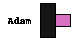

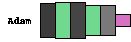

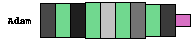

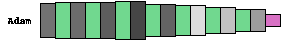

In [14]:
neurons_count = lambda layer_index, prev_count: max(10, prev_count * random.uniform(0.3, 1.5))
model_graphical_summary(construct_new_model(size = 0, neurons_count = neurons_count))
model_graphical_summary(construct_new_model(size = 2, neurons_count = neurons_count))
model_graphical_summary(construct_new_model(size = 4, neurons_count = neurons_count))
model_graphical_summary(construct_new_model(size = 7, neurons_count = neurons_count));

Напишем функцию добавления нового слоя. Проще будет принимать и возвращать данные декомпозиции модели (decompose).

Желательно настраивать веса при добавлении слоя так, чтобы точность не слишком сильно ухудшилась. В противном случае нейросеть за одно-два поколения даже при лучшей архитектуре может не успеть достичь соседей, которые не подвеглись мутации, и будет отсеяна.

Есть как минимум 4 стратегии настройки весов после добавления нового слоя. Пусть мы добавляем слой B между слоями A и C. Веса слоя C также придется настраивать, поскольку изменится размер входного тензора, т. к. размер B не равен размеру A.

**Стратегия случайной инициализации.** В этом случае будут стерты обученные веса слоя С.

**Стратегия identity_copy.** Если размер B больше размера A, то len(A) нейронов в слое B являются полными "отражениями" всех нейронов слоя A (веса перехода от A к B - единичная матрица с нулевым дополнением). Тогда в слое C остаются старые веса, которые дополняются нулевыми весами. Если же размер B меньше размера A, то нейроны слоя B - "отражения" первых len(B) нейронов слоя A, новые веса C являются соответствующей частью старых весов. Получается, что мы отбрасываем часть нейронов слоя A (как в дропауте), потому что они не вмещаются в слой B. Стратегия identity_copy полностью сохраняет работоспособность нейросети, если размер B больше размера A, а слои B и C имеют функцию активации relu.

**Стратегия copy_identity.** Похожа на предыдущую, но веса слоя B представляют собой копию бывших весов слоя C или часть этой копии (если размер слоя B меньше размера слоя C), а переход между B и C представляет собой единичную матрицу (тождественность) с необходимым дополнением.

Что касается удаления слоев, то ни identity_copy, ни copy_identity не могут быть применены. Понятно, что попытка полностью восстановить функцию, которую реализует нейросеть, после удаления слоя в общем случае обречена на провал: две линейные и две нелинейные операции могут давать такой результат, который не может быть воспроизведен с помощью одной линейной и одной нелинейной операции (то же самое можно сказать о добавлении слоя). Но нам не нужно добиваться совпадения работы старой и новой нейросети во всем пространстве R^784, достаточно будет удовлетворительного совпадения на многообразии входных данных. Поэтому появляется новая стратегия fitting, которая может быть использована как при удалении, так и при добавлении слоев.

**Стратегия fitting.** Пусть нужно заменить архитектуру при переходе между слоями A и C. Например, при добавлении слоя меняем A->C на A->B->C, при удалении слоя меняем A->B->C на A->C. Берем некоторое количество обучающих данных. Расчитываем для каждого изображения отклик на слое B и отклик на слое C со старой архитектурой. Полученные пары откликов будут обучающими данными для новой нейросети, реализующей новую архитектуру перехода от A к C. Функцей ошибки будет бинарная кроссэнтропия. После обучения нейросети копируем ее веса в исходную нейросеть, заменяя архитектуру.

Проведем эксперимент, чтобы узнать, какой метод работает лучше.

In [17]:
def glorot(shape):
    if use_colab:
        tensor = tf.compat.v1.keras.initializers.glorot_uniform()(shape)
        return tf.Session().run(tensor)
    else:
        return tf.keras.initializers.GlorotNormal()(shape).numpy()
glorot_coef = 0.01

glorot((1, 1)).numpy()

NotImplementedError: eval is not supported when eager execution is enabled, is .numpy() what you're looking for?

In [3]:
#добавление слоя перед слоем с индексом i, перед новым dense слоем - новый dropout слой с rate = 0
#возвращает new_dropout_rates, new_dense_layers
def add_dense_layer(dropout_rates, dense_layers, i, size, activation = tf.keras.activations.relu, calc_weights_method = None,
                    fitting_dataset_size = 4096, fitting_batch_size = 32, fitting_lr = 0.005, fitting_epochs = 2):
    assert i < len(dense_layers), '%d >= %d' % (i, len(dense_layers))
    assert i >= 0, i
    assert size > 0, size
    new_dropout_rates = dropout_rates.copy()
    new_dropout_rates.insert(i, 0)
    #создаем слой
    prev_layer_output_size = dense_layers[i - 1].output_shape[1] if i > 0 else dense_layers[0].input_shape[1]
    new_layer = Dense(size, activation = activation, input_shape = (prev_layer_output_size,))
    old_next_layer = dense_layers[i]
    next_layer_output_size = old_next_layer.output_shape[1]
    new_layer(np.zeros((1, prev_layer_output_size))) #генерируем веса
    #изменяем следующий слой
    new_next_layer = Dense(next_layer_output_size, activation = old_next_layer.activation, input_shape = (size,))
    new_next_layer(np.zeros((1, size))) #генерируем веса
    #устанавливаем веса (не обязательно)
    if calc_weights_method is not None:
        if calc_weights_method == 'identity_copy':
            #устанавливаем веса нового слоя
            if size <= prev_layer_output_size:
                new_weights = np.concatenate((
                    np.identity(size) + glorot_coef * glorot((size, size)).numpy(),
                    glorot_coef * glorot((prev_layer_output_size - size, size)).numpy()
                ), axis = 0)
            else:
                new_weights = np.concatenate((
                    np.identity(prev_layer_output_size) + glorot_coef
                        * glorot((prev_layer_output_size, prev_layer_output_size)).numpy(),
                    glorot_coef * glorot((prev_layer_output_size, size - prev_layer_output_size)).numpy()
                ), axis = 1)
            new_biases = np.zeros(size)
            new_layer.set_weights((new_weights, new_biases))
            #устанавливаем веса следующего слоя
            old_next_layer_weights, old_next_layer_biases = old_next_layer.get_weights()
            if size <= prev_layer_output_size:
                new_next_layer_weights = old_next_layer_weights[:size, :]
            else:
                new_next_layer_weights = np.concatenate((
                    old_next_layer_weights,
                    glorot_coef * glorot((size - prev_layer_output_size, next_layer_output_size)).numpy()
                ), axis = 0)
            new_next_layer_biases = old_next_layer_biases
            new_next_layer.set_weights((new_next_layer_weights, new_next_layer_biases))
        elif calc_weights_method == 'copy_identity':
            old_next_layer_weights, old_next_layer_biases = old_next_layer.get_weights()
            #устанавливаем веса нового слоя
            if size >= next_layer_output_size:
                new_weights = np.concatenate((
                    old_next_layer_weights,
                    glorot_coef * glorot((prev_layer_output_size, size - next_layer_output_size)).numpy()
                ), axis = 1)
            else:
                new_weights = old_next_layer_weights[:, :size]
            new_biases = np.zeros(size)
            new_layer.set_weights((new_weights, new_biases))
            #устанавливаем веса следующего слоя
            max_size = max(size, next_layer_output_size)
            big_identity_matrix = np.identity(max_size) + glorot_coef * glorot((max_size, max_size)).numpy()
            new_next_layer_weights = big_identity_matrix[:size, :next_layer_output_size]
            new_next_layer_biases = np.zeros(next_layer_output_size)
            new_next_layer.set_weights((new_next_layer_weights, new_next_layer_biases))
        elif calc_weights_method == 'fitting':
            assert fitting_dataset_size > 0, fitting_dataset_size
            assert fitting_batch_size > 0, fitting_batch_size
            assert fitting_epochs > 0, fitting_epochs
            test_input_data = mnist.x_train_flat[:fitting_dataset_size] / 255
            for layer in dense_layers[:i]:
                test_input_data = layer(test_input_data)
            test_output_data = old_next_layer(test_input_data)
            test_model = Sequential([
                Dense(size, activation = activation, input_shape = (prev_layer_output_size,)),
                Dense(next_layer_output_size, activation = old_next_layer.activation)
            ])
            test_model.compile(loss = 'binary_crossentropy',
                               optimizer = tf.keras.optimizers.Adam(learning_rate = fitting_lr), metrics = ['accuracy'])
            test_model.fit(test_input_data, test_output_data, verbose = 0,
                           epochs = fitting_epochs, batch_size = fitting_batch_size)
            new_weights, new_biases = test_model.layers[0].get_weights()
            new_next_layer_weights, new_next_layer_biases = test_model.layers[1].get_weights()
            new_layer.set_weights((new_weights, new_biases))
            new_next_layer.set_weights((new_next_layer_weights, new_next_layer_biases))
        else:
            raise BaseException('unknown calc_weights_method ' + str(calc_weights_method))
    #возвращаем измененные массивы слоев
    new_dense_layers = dense_layers[:i] + [new_layer, new_next_layer] + dense_layers[i + 1:]
    return new_dropout_rates, new_dense_layers

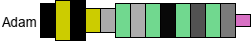

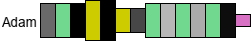

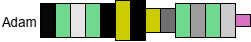

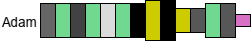

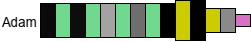

In [0]:
for i in range(5):
    model = construct_new_model(size = 4)
    dropout_rates, dense_layers, optimizer = decompose(model)
    new_dropout_rates, new_dense_layers = add_dense_layer(dropout_rates, dense_layers, i, size = 100,
                                                          activation = tf.keras.activations.tanh)
    model = compose(new_dropout_rates, new_dense_layers, optimizer)
    dropout_rates, dense_layers, optimizer = decompose(model)
    new_dropout_rates, new_dense_layers = add_dense_layer(dropout_rates, dense_layers, i, size = 3000,
                                                          activation = tf.keras.activations.tanh)
    model = compose(new_dropout_rates, new_dense_layers, optimizer)
    __check(model)
    model_graphical_summary(model)

In [4]:
def evaluate_model_accuracy(model, test_size = 500, x_override = None, y_override = None):
    x = mnist.x_val[:test_size] / 255 if x_override is None else x_override
    y = mnist.y_val[:test_size] if y_override is None else y_override
    loss, acc = model.evaluate(x, y, verbose = 0)
    return acc

def __on_batch_end_func(batch, model, accuracy_every_X_batches, test_size, verbose, start_time, time_limit):
    if accuracy_every_X_batches is not None:
        if (batch + 1) % accuracy_every_X_batches == 0:
            acc = evaluate_model_accuracy(model, test_size)
            accuracy_history.append(acc)
            if verbose:
                print('batch %d, accuracy %g' % (batch, acc), end = '\r')
    else:
        if verbose and (batch + 1) % 10 == 0:
            print('batch %d' % batch, end = '\r')
    if time_limit != 0 and time.time() > start_time + time_limit:
        model.stop_training = True
        #print('\n%g sec elapsed, stopping...' % time_limit, end = '\r')

def fit_model_without_history(model, train_size = 32768, batch_size = 32, verbose = 0, time_limit = 0):
    start_time = time.time()
    while time_limit == 0 or time.time() < start_time + time_limit:
        model.fit(mnist.x_train[:train_size] / 255, mnist.y_train[:train_size],
            epochs = 1, verbose = 0, batch_size = batch_size,
            callbacks = [tf.keras.callbacks.LambdaCallback(on_batch_end = 
                lambda batch, logs: __on_batch_end_func(
                    batch, model, None, 0, verbose, start_time, time_limit))])
        if time_limit == 0:
            break

def fit_model(model, accuracy_history, train_size = 32768, test_size = 500,
              batch_size = 32, accuracy_every_X_batches = 16, verbose = 0, time_limit = 0):
    start_time = time.time()
    while time_limit == 0 or time.time() < start_time + time_limit:
        model.fit(mnist.x_train[:train_size] / 255, mnist.y_train[:train_size],
            epochs = 1, verbose = 0, batch_size = batch_size,
            callbacks = [tf.keras.callbacks.LambdaCallback(on_batch_end = 
                lambda batch, logs: __on_batch_end_func(
                    batch, model, accuracy_every_X_batches, test_size, verbose, start_time, time_limit))])
        if time_limit == 0:
            break

def show_accuracies(accuracy_histories, figsize = (15, 4), vertical_line_positions = []):
    plt.figure(figsize = figsize)
    plt.gca().set_ylim(0, 1)
    for accuracy_history in accuracy_histories:
        plt.plot(accuracy_history)
    for line_x_pos in vertical_line_positions:
        plt.axvline(x = line_x_pos, color = 'green')
    plt.show()

In [0]:
new_layer_indices = [0, 1, 2]
new_layer_sizes = [100, 1000]
calc_methods = [None, 'identity_copy', 'copy_identity', ('fitting', 1024), ('fitting', 16384)]
test_models_count = 10
train_size = 20000
test_size = 5000
retrain_size = 2000
retrain2_size = 10000
batch_size = 32

experiment_results = pd.DataFrame(columns = [
    'model index', #номер модели от 0 до test_models_count - 1
    'new layer index', #один из new_layer_indices
    'new layer size', #один из new_layer_sizes
    'calc method', #один из calc_methods
    'accuracy_delta', #изменение точности после мутации
    'accuracy_delta2', #изменение точности после мутации и переобучения
    'accuracy_delta3', #изменение точности после мутации и переобучения на большем наборе
    'time' #затраченное на мутацию время
])

test_models = [construct_new_model(size = 2) for model_index in range(test_models_count)]
test_models_accuracies = [None] * test_models_count

#clone_model

for model_index in range(test_models_count):
    model = test_models[model_index]
    model.layers[2].activation = tf.keras.activations.tanh
    model_short_summary(model, name = '#%d' % model_index)
    fit_model_without_history(model, train_size = train_size, batch_size = batch_size, verbose = 0)
    acc = evaluate_model_accuracy(model, test_size = test_size)
    test_models_accuracies[model_index] = acc
    print('accuracy %g' % acc)

for model_index in range(test_models_count):
    for new_layer_index in new_layer_indices:
        for new_layer_size in new_layer_sizes:
            for calc_method in calc_methods:
                gc.collect()
                if type(calc_method) == tuple:
                    calc_method_param = calc_method[1]
                    calc_method_tuple = calc_method
                    calc_method = calc_method[0]
                else:
                    calc_method_param = None
                    calc_method_tuple = None
                model = clone_model(test_models[model_index])
                accuracy_before = test_models_accuracies[model_index]
                start_time = time.time()
                dropout_rates, dense_layers, optimizer = decompose(model)
                new_dropout_rates, new_dense_layers = add_dense_layer(
                    dropout_rates,
                    dense_layers,
                    i = new_layer_index,
                    size = new_layer_size,
                    activation = tf.keras.activations.relu,
                    calc_weights_method = calc_method,
                    fitting_dataset_size = calc_method_param
                )
                model = compose(new_dropout_rates, new_dense_layers, optimizer)
                elapsed_time = time.time() - start_time
                accuracy_after_mutation = evaluate_model_accuracy(model, test_size = test_size)
                fit_model_without_history(model, train_size = retrain_size, batch_size = batch_size, verbose = 0)
                accuracy_after_retraining = evaluate_model_accuracy(model, test_size = test_size)
                fit_model_without_history(model, train_size = retrain2_size, batch_size = batch_size, verbose = 0)
                accuracy_after_retraining2 = evaluate_model_accuracy(model, test_size = test_size)
                #experiment_results.loc[-1] = []
                new_row = {
                    'model index': model_index,
                    'new layer index': new_layer_index,
                    'new layer size': new_layer_size,
                    'calc method': calc_method_tuple if calc_method_tuple else calc_method,
                    'accuracy_delta': accuracy_after_mutation / accuracy_before,
                    'accuracy_delta2': accuracy_after_retraining / accuracy_before,
                    'accuracy_delta3': accuracy_after_retraining2 / accuracy_before,
                    'time': elapsed_time
                }
                experiment_results = experiment_results.append(pd.DataFrame([new_row]))
                IPython.display.clear_output(wait = True)
                display(experiment_results)
                #print(accuracy_before, accuracy_after_mutation, accuracy_after_retraining, accuracy_after_retraining2)

In [0]:
model_short_summary(test_models[0])

Model (Adam): .18 | 784 (tanh) | .08 | 784 (relu) | .04 | 10 (soft)


In [0]:
avg_results = experiment_results.groupby([
    'new layer index',
    'new layer size',
    experiment_results['calc method'].fillna('none')
]).mean()

# avg_results.style.apply(
#     lambda row: ['background-color: %s' % ('yellow' if row.name[1] == 100 else 'white')] * 3,
# axis = 1)

display(avg_results)

accuracy_delta  ...      time
new layer index new layer size calc method                       ...          
0               100            (fitting, 1024)         0.256566  ...  0.508511
                               (fitting, 16384)        0.650642  ...  1.787518
                               copy_identity           0.757531  ...  0.088365
                               identity_copy           0.172579  ...  0.089134
                               none                    0.100968  ...  0.083077
                1000           (fitting, 1024)         0.253611  ...  0.508779
                               (fitting, 16384)        0.263576  ...  1.783346
                               copy_identity           0.991178  ...  0.099264
                               identity_copy           1.000263  ...  0.097267
                               none                    0.115904  ...  0.085267
1               100            (fitting, 1024)         0.743214  ...  0.504364
                               (fitting, 16384)        0.723023  ...  1.806366
                               copy_identity           0.886659  ...  0.089484
                               identity_copy           0.754216  ...  0.086872
                               none                    0.114909  ...  0.082692
                1000           (fitting, 1024)         0.307538  ...  0.514963
                               (fitting, 16384)        0.518165  ...  1.808132
                               copy_identity           1.000124  ...  0.099495
                               identity_copy           0.991445  ...  0.099220
                               none                    0.092429  ...  0.081681
2               100            (fitting, 1024)         0.980310  ...  0.501207
                               (fitting, 16384)        0.991931  ...  1.717323
                               copy_identity           1.000241  ...  0.083077
                               identity_copy           0.886410  ...  0.085382
                               none                    0.116126  ...  0.082200
                1000           (fitting, 1024)         0.974549  ...  0.507437
                               (fitting, 16384)        0.994321  ...  1.729927
                               copy_identity           1.000195  ...  0.093826
                               identity_copy           1.000245  ...  0.093214
                               none                    0.120141  ...  0.082185

[30 rows x 4 columns]

В эксперименте мы обучали нейросеть с 2 скрытыми слоями по 784 нейрона (функции активации tanh и relu) и дропаутами перед каждым полносвязным слоем, затем добавляли новый слой relu. Каждый эксперимент проводился 10 раз, данные усреднялись. В первых столбцах показаны параметры добавления слоя: его позиция, размер и метод установки весов.

- accuracy_delta - точность после добавления слоя по сравнению с исходной
- accuracy_delta2 - точность после добавления слоя и обучения полученной нейросети на 2000 примерах по сравнению с исходной
- accuracy_delta3 - точность после добавления слоя и обучения полученной нейросети на 10000 примерах по сравнению с исходной

Проведенных экспериментов недостаточно для полноценного сравнения всех методов, но предварительные выводы можно сделать. Во-первых точность нейросети сразу после добавления слоя мало связана с ее точностью после дальнейшего обучения. Видимо, текущая точность и способность к обучению методом обратного распространения ошибки - это существенно разные вещи. При добавлении нового слоя перед первым или вторым слоем (784-tanh или 784-relu) наилучшие результаты показывает метод copy_identity. Однако при добавлении нового слоя перед выходным слоем (10-softmax) ситуация иная. Неожиданно хороший результат показал метод fitting-16384, который в других случаях показывал стабильно худшие результаты (из-за переобучения?). Возможно, что это погрешность эксперимента. Возможно также, что выбор наилучшего алгоритма в большой степени зависит от функций активации нового и соседних слоев.

Пока выберем следующую стратегию: для добавления слоя будем всегда использовать алгоритм copy_identity. Добавлять слои всегда будем с функцией активации relu.

Напишем функцию удаления слоя с двумя вариантами установки весов: случайного выбора или с помощью метода fitting.

In [5]:
#удаление слоя с индексом i и dropout слоя после него
#возвращает new_dropout_rates, new_dense_layers
def remove_dense_layer(dropout_rates, dense_layers, i, calc_weights_method = None,
                    fitting_dataset_size = 4096, fitting_batch_size = 32, fitting_lr = 0.005, fitting_epochs = 2):
    assert i < len(dense_layers) - 1, '%d >= %d - 1' % (i, len(dense_layers))
    assert i >= 0, i
    new_dropout_rates = dropout_rates.copy()
    new_dropout_rates.pop(i + 1)
    layer_to_remove = dense_layers[i]
    prev_layer = dense_layers[i - 1] if i > 0 else None
    old_next_layer = dense_layers[i + 1]
    prev_layer_output_size = prev_layer.output_shape[1] if prev_layer else 28*28
    next_layer_output_size = old_next_layer.output_shape[1]
    #изменяем следующий слой
    new_next_layer = Dense(next_layer_output_size, activation = old_next_layer.activation,
                           input_shape = (prev_layer_output_size,))
    new_next_layer(np.zeros((1, prev_layer_output_size))) #генерируем веса
    #устанавливаем веса (не обязательно)
    if calc_weights_method is not None:
        if calc_weights_method == 'fitting':
            assert fitting_dataset_size > 0, fitting_dataset_size
            assert fitting_batch_size > 0, fitting_batch_size
            assert fitting_epochs > 0, fitting_epochs
            test_input_data = mnist.x_train_flat[:fitting_dataset_size] / 255
            for layer in dense_layers[:i]:
                test_input_data = layer(test_input_data)
            test_output_data = old_next_layer(layer_to_remove(test_input_data))
            test_model = Sequential([
                Dense(next_layer_output_size, activation = old_next_layer.activation, input_shape = (prev_layer_output_size,))
            ])
            test_model.compile(loss = 'binary_crossentropy',
                               optimizer = tf.keras.optimizers.Adam(learning_rate = fitting_lr), metrics = ['accuracy'])
            test_model.fit(test_input_data, test_output_data, verbose = 0,
                           epochs = fitting_epochs, batch_size = fitting_batch_size)
            new_next_layer_weights, new_next_layer_biases = test_model.layers[0].get_weights()
            new_next_layer.set_weights((new_next_layer_weights, new_next_layer_biases))
        else:
            raise BaseException('unknown calc_weights_method ' + str(calc_weights_method))
    #возвращаем измененные массивы слоев
    new_dense_layers = dense_layers[:i] + [new_next_layer] + dense_layers[i + 2:]
    return new_dropout_rates, new_dense_layers

In [0]:
model_orig = construct_new_model(size = 4, neurons_count = lambda layer_index, prev_count: [500, 200, 900, 100][layer_index])
model_short_summary(model_orig)
print("---------")
for i in range(4):
    dropout_rates, dense_layers, optimizer = decompose(model_orig)
    new_dropout_rates, new_dense_layers = remove_dense_layer(dropout_rates, dense_layers, i)
    model = compose(new_dropout_rates, new_dense_layers, optimizer)
    __check(model)
    model_short_summary(model)

Model (Adam): .86 | 500 (relu) | .13 | 200 (relu) | .60 | 900 (relu) | .73 | 100 (relu) | .20 | 10 (soft)
---------
Model (Adam): .86 | 200 (relu) | .60 | 900 (relu) | .73 | 100 (relu) | .20 | 10 (soft)
Model (Adam): .86 | 500 (relu) | .13 | 900 (relu) | .73 | 100 (relu) | .20 | 10 (soft)
Model (Adam): .86 | 500 (relu) | .13 | 200 (relu) | .60 | 100 (relu) | .20 | 10 (soft)
Model (Adam): .86 | 500 (relu) | .13 | 200 (relu) | .60 | 900 (relu) | .73 | 10 (soft)


Проведем аналогичный предыдущему эксперимент, чтобы убедиться, что метод fitting для удаления слоя работает корректно.

In [0]:
remove_layer_indices = [1]
calc_methods = [None, ('fitting', 1024), ('fitting', 16384)]
test_models_count = 10
train_size = 20000
test_size = 5000
retrain_size = 2000
retrain2_size = 10000
batch_size = 32

experiment_results = pd.DataFrame(columns = [
    'model index', #номер модели от 0 до test_models_count - 1
    'remove layer index', #один из remove_layer_indices
    'calc method', #один из calc_methods
    'accuracy_delta', #изменение точности после мутации
    'accuracy_delta2', #изменение точности после мутации и переобучения
    'accuracy_delta3', #изменение точности после мутации и переобучения на большем наборе
    'time' #затраченное на мутацию время
])

test_models = [construct_new_model(size = 2) for model_index in range(test_models_count)]
test_models_accuracies = [None] * test_models_count

#clone_model

for model_index in range(test_models_count):
    model = test_models[model_index]
    model_short_summary(model, name = '#%d' % model_index)
    fit_model_without_history(model, train_size = train_size, batch_size = batch_size, verbose = 0)
    acc = evaluate_model_accuracy(model, test_size = test_size)
    test_models_accuracies[model_index] = acc
    print('accuracy %g' % acc)

for model_index in range(test_models_count):
    for remove_layer_index in remove_layer_indices:
        for calc_method in calc_methods:
            gc.collect()
            if type(calc_method) == tuple:
                calc_method_param = calc_method[1]
                calc_method_tuple = calc_method
                calc_method = calc_method[0]
            else:
                calc_method_param = None
                calc_method_tuple = None
            model = clone_model(test_models[model_index])
            accuracy_before = test_models_accuracies[model_index]
            start_time = time.time()
            dropout_rates, dense_layers, optimizer = decompose(model)
            new_dropout_rates, new_dense_layers = remove_dense_layer(
                dropout_rates,
                dense_layers,
                i = remove_layer_index,
                calc_weights_method = calc_method,
                fitting_dataset_size = calc_method_param
            )
            model = compose(new_dropout_rates, new_dense_layers, optimizer)
            elapsed_time = time.time() - start_time
            accuracy_after_mutation = evaluate_model_accuracy(model, test_size = test_size)
            fit_model_without_history(model, train_size = retrain_size, batch_size = batch_size, verbose = 0)
            accuracy_after_retraining = evaluate_model_accuracy(model, test_size = test_size)
            fit_model_without_history(model, train_size = retrain2_size, batch_size = batch_size, verbose = 0)
            accuracy_after_retraining2 = evaluate_model_accuracy(model, test_size = test_size)
            #experiment_results.loc[-1] = []
            new_row = {
                'model index': model_index,
                'remove layer index': remove_layer_index,
                'calc method': calc_method_tuple if calc_method_tuple else calc_method,
                'accuracy_delta': accuracy_after_mutation / accuracy_before,
                'accuracy_delta2': accuracy_after_retraining / accuracy_before,
                'accuracy_delta3': accuracy_after_retraining2 / accuracy_before,
                'time': elapsed_time
            }
            experiment_results = experiment_results.append(pd.DataFrame([new_row]))
            IPython.display.clear_output(wait = True)
            display(experiment_results)
            #print(accuracy_before, accuracy_after_mutation, accuracy_after_retraining, accuracy_after_retraining2)

In [0]:
avg_results = experiment_results.groupby([
    'remove layer index',
    experiment_results['calc method'].fillna('none')
]).mean()

display(avg_results)

accuracy_delta  accuracy_delta2  \
remove layer index calc method                                         
1                  (fitting, 1024)         0.982579         0.958971   
                   (fitting, 16384)        0.998476         0.957286   
                   none                    0.115324         0.938385   

                                     accuracy_delta3      time  
remove layer index calc method                                  
1                  (fitting, 1024)          1.014483  0.556573  
                   (fitting, 16384)         1.013199  2.477759  
                   none                     1.005140  0.087957

Метод fitting работает корректно. Во время удаления слоя будем использовать метод установки весов fitting-1024.

Напишем метод изменения размеров слоя. При уменьшении размера удаляем часть нейронов, при увеличении дополняем новыми связями, инициализируемыми едва отличимыми от нуля значениями, чтобы была возможность их обучения.

In [6]:
#удаление слоя с индексом i и dropout слоя после него
#возвращает new_dropout_rates, new_dense_layers
def  change_dense_layer_size(dropout_rates, dense_layers, i, new_layer_size):
    assert i < len(dense_layers) - 1, '%d >= %d - 1' % (i, len(dense_layers))
    assert i >= 0, i
    assert new_layer_size >= 0, new_layer_size
    layer_to_change = dense_layers[i]
    old_next_layer = dense_layers[i + 1]
    prev_layer = dense_layers[i - 1] if i > 0 else None
    prev_layer_output_size = prev_layer.output_shape[1] if prev_layer else 28*28
    old_layer_output_size = layer_to_change.output_shape[1]
    next_layer_output_size = old_next_layer.output_shape[1]
    #изменяем слой
    changed_layer = Dense(new_layer_size, activation = layer_to_change.activation,
                           input_shape = (prev_layer_output_size,))
    changed_layer(np.zeros((1, prev_layer_output_size))) #генерируем веса
    #изменяем следующий слой
    new_next_layer = Dense(next_layer_output_size, activation = old_next_layer.activation,
                           input_shape = (new_layer_size,))
    new_next_layer(np.zeros((1, new_layer_size))) #генерируем веса
    #устанавливаем веса
    old_layer_weights, old_layer_biases = layer_to_change.get_weights()
    changed_layer_weights = glorot_coef * glorot((prev_layer_output_size, new_layer_size)).numpy()
    changed_layer_biases = np.zeros(new_layer_size)
    copy_neurons_count = min(new_layer_size, old_layer_output_size)
    changed_layer_weights[:, :copy_neurons_count] = old_layer_weights[:, :copy_neurons_count]
    changed_layer_biases[:copy_neurons_count] = old_layer_biases[:copy_neurons_count]
    changed_layer.set_weights((changed_layer_weights, changed_layer_biases))
    #устанавливаем веса следующего слоя
    old_next_layer_weights, old_next_layer_biases = old_next_layer.get_weights()
    new_next_layer_weights = glorot_coef * glorot((new_layer_size, next_layer_output_size)).numpy()
    new_next_layer_biases = np.zeros(next_layer_output_size)
    new_next_layer_weights[:copy_neurons_count, :] = old_next_layer_weights[:copy_neurons_count, :]
    new_next_layer_biases = old_next_layer_biases
    new_next_layer.set_weights((new_next_layer_weights, new_next_layer_biases))
    #возвращаем измененные массивы слоев
    new_dense_layers = dense_layers[:i] + [changed_layer, new_next_layer] + dense_layers[i + 2:]
    return dropout_rates, new_dense_layers

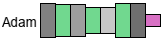

---------


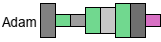

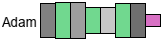

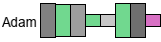

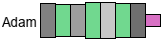

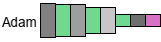

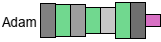

In [0]:
model_orig = construct_new_model(size = 3, neurons_count = lambda layer_index, prev_count: [500, 200, 900, 100][layer_index])
model_graphical_summary(model_orig)
print("---------")
for i in range(3):
    dropout_rates, dense_layers, optimizer = decompose(model_orig)
    new_dropout_rates, new_dense_layers = change_dense_layer_size(dropout_rates, dense_layers, i, 10)
    model = compose(new_dropout_rates, new_dense_layers, optimizer)
    __check(model)
    model_graphical_summary(model)
    dropout_rates, dense_layers, optimizer = decompose(model_orig)
    new_dropout_rates, new_dense_layers = change_dense_layer_size(dropout_rates, dense_layers, i, 1000)
    model = compose(new_dropout_rates, new_dense_layers, optimizer)
    __check(model)
    model_graphical_summary(model)

In [0]:
model = construct_new_model(size = 1)
model_short_summary(model)
fit_model_without_history(model, train_size = 20000, verbose = 0)
print(evaluate_model_accuracy(model, test_size = 10000))

dropout_rates, dense_layers, optimizer = decompose(model)
new_dropout_rates, new_dense_layers = change_dense_layer_size(dropout_rates, dense_layers, 0, 200)
model = compose(new_dropout_rates, new_dense_layers, optimizer)
model_short_summary(model)
print(evaluate_model_accuracy(model, test_size = 10000), '- точность должна несколько уменьшиться')

dropout_rates, dense_layers, optimizer = decompose(model)
new_dropout_rates, new_dense_layers = change_dense_layer_size(dropout_rates, dense_layers, 0, 5000)
model = compose(new_dropout_rates, new_dense_layers, optimizer)
model_short_summary(model)
print(evaluate_model_accuracy(model, test_size = 10000), '- точность почти не должна измениться')

Model (Adam): .31 | 784 (relu) | .02 | 10 (soft)
0.9429
Model (Adam): .31 | 200 (relu) | .02 | 10 (soft)
0.8783 - точность должна несколько уменьшиться
Model (Adam): .31 | 5000 (relu) | .02 | 10 (soft)
0.8783 - точность почти не должна измениться


Теперь можно написать общую функцию, используемую для случайных мутаций.

In [7]:
# возвращает измененную копию модели
def mutate(
    model,
    force_action = None,
    change_dropout_probability = 0.8,
    add_dense_layer_probability = 0.1,
    remove_dense_layer_probability = 0.1,
    change_dense_layer_size_probability = 0.5,
    change_dense_layer_activation_probability = 0.05,
    change_model_optimizer_probability = 0.2,
    ###################################
    change_size_min_ratio = 0.6,
    change_size_max_ratio = 1.5,
    change_dropout_min = 0.05,
    change_dropout_max = 0.95,
    new_layers_are_relu = False
):
    model = clone_model(model)
    performed_mutations = []
    dropout_rates, dense_layers, optimizer = decompose(model)
    dropout_count = len(dropout_rates)
    def has_inner_layers():
        return len(dense_layers) > 1
    if force_action:
        if not has_inner_layers():
            if force_action == 'remove_dense_layer':
                raise BaseException('forced to remove dense layer, but no inner dense layers to remove')
            if force_action == 'change_dense_layer_size':
                raise BaseException('forced to change dense layer size, but no inner dense layers to change')
            if force_action == 'change_dense_layer_activation':
                raise BaseException('forced to change dense layer activation, but no inner dense layers to change')
        change_dropout_probability = 1 if force_action == 'change_dropout' else 0
        add_dense_layer_probability = 1 if force_action == 'add_dense_layer' else 0
        remove_dense_layer_probability = 1 if force_action == 'remove_dense_layer' else 0
        change_dense_layer_size_probability = 1 if force_action == 'change_dense_layer_size' else 0
        change_dense_layer_activation_probability = 1 if force_action == 'change_dense_layer_activation' else 0
        change_model_optimizer_probability = 1 if force_action == 'change_model_optimizer' else 0
    layer_activations = [
        tf.keras.activations.relu,
        tf.keras.activations.elu,
        tf.keras.activations.tanh
    ]
    optimizers = [
        {'class': SGD, 'default_lr': 0.01},
        {'class': RMSprop, 'default_lr': 0.001},
        {'class': Adam, 'default_lr': 0.001},
        {'class': Adadelta, 'default_lr': 0.001},
        {'class': Adagrad, 'default_lr': 0.001},
        {'class': Adamax, 'default_lr': 0.001},
        {'class': Nadam, 'default_lr': 0.001},
        {'class': Ftrl, 'default_lr': 0.001},
    ]
    def re_decompose(): #to avoid exception "The layer has never been called and thus has no defined output shape."
        nonlocal dropout_rates, dense_layers, optimizer
        dropout_rates, dense_layers, optimizer = decompose(compose(dropout_rates, dense_layers, optimizer))
    if random.random() < change_dropout_probability and dropout_count > 0:
        i = random.randrange(dropout_count)
        old_rate = dropout_rates[i]
        new_rate = random.uniform(change_dropout_min, change_dropout_max)
        dropout_rates[i] = new_rate
        performed_mutations.append({
            'type': 'change_dropout',
            'i': i,
            'old_rate': old_rate,
            'new_rate': new_rate
        })
    if random.random() < add_dense_layer_probability:
        i = random.randrange(len(dense_layers))
        prev_size = dense_layers[i - 1].output_shape[1] if i > 0 else 28*28
        next_size = dense_layers[i].output_shape[1]
        new_layer_size = random.randrange(min(prev_size, next_size), max(prev_size, next_size) + 1)
        if new_layers_are_relu:
            new_layer_activation = tf.keras.activations.relu
        else:
            new_layer_activation = layer_activations[random.randrange(len(layer_activations))]
        calc_weights_method = 'copy_identity'
        dropout_rates, dense_layers = add_dense_layer(dropout_rates, dense_layers, i, size = new_layer_size,
                                                     activation = new_layer_activation,
                                                     calc_weights_method = calc_weights_method)
        re_decompose()
        performed_mutations.append({
            'type': 'add_dense_layer',
            'i': i,
            'new_layer_size': new_layer_size,
            'new_layer_activation': new_layer_activation.__name__,
            'calc_weights_method': calc_weights_method
        })
    if random.random() < remove_dense_layer_probability and has_inner_layers():
        i = random.randrange(len(dense_layers) - 1)
        calc_weights_method = 'fitting'
        dropout_rates, dense_layers = remove_dense_layer(dropout_rates, dense_layers, i,
                                                     calc_weights_method = 'fitting', fitting_dataset_size = 1024)
        re_decompose()
        performed_mutations.append({
            'type': 'remove_dense_layer',
            'i': i,
            'calc_weights_method': calc_weights_method
        })
    if random.random() < change_dense_layer_size_probability and has_inner_layers():
        i = random.randrange(len(dense_layers) - 1)
        old_size = dense_layers[i].output_shape[1]
        new_size = max(1, int(old_size * random.uniform(change_size_min_ratio, change_size_max_ratio)))
        dropout_rates, dense_layers = change_dense_layer_size(dropout_rates, dense_layers, i, new_layer_size = new_size)
        re_decompose()
        performed_mutations.append({
            'type': 'change_dense_layer_size',
            'i': i,
            'old_size': old_size,
            'new_size': new_size
        })
    if random.random() < change_dense_layer_activation_probability and has_inner_layers():
        i = random.randrange(len(dense_layers) - 1)
        old_activation = dense_layers[i].activation
        activations_to_choose = [a for a in layer_activations if a != old_activation]
        new_activation = activations_to_choose[random.randrange(len(activations_to_choose))]
        dense_layers[i].activation = new_activation
        performed_mutations.append({
            'type': 'change_dense_layer_activation',
            'i': i,
            'old_activation': old_activation.__name__,
            'new_activation': new_activation.__name__
        })
    if random.random() < change_model_optimizer_probability:
        new_optimizer_params = optimizers[random.randrange(len(optimizers))]
        learning_rate = new_optimizer_params['default_lr'] * pow(10, np.random.normal(scale = 1))
        old_optimizer = optimizer
        optimizer = new_optimizer_params['class'](learning_rate = learning_rate)
        performed_mutations.append({
            'type': 'change_model_optimizer',
            'old_optimizer': old_optimizer.__class__.__name__,
            'old_optimizer_lr': old_optimizer.learning_rate.numpy(),
            'new_optimizer': optimizer.__class__.__name__,
            'new_optimizer_lr': optimizer.learning_rate.numpy()
        })
    model = compose(dropout_rates, dense_layers, optimizer)
    return model, performed_mutations

def performed_mutation_to_string(m):
    if m['type'] == 'change_dropout':
        return 'Changed dropout %d from %g to %g' % (m['i'], m['old_rate'], m['new_rate'])
    if m['type'] == 'add_dense_layer':
        return 'Added dense layer before #%d: %d, %s, method %s' % (m['i'], m['new_layer_size'], m['new_layer_activation'],
                                                             m['calc_weights_method'])
    if m['type'] == 'remove_dense_layer':
        return 'Removed dense layer #%d, method %s' % (m['i'], m['calc_weights_method'])
    if m['type'] == 'change_dense_layer_size':
        return 'Changed dense layer #%d size from %d to %d' % (m['i'], m['old_size'], m['new_size'])
    if m['type'] == 'change_dense_layer_activation':
        return 'Changed dense layer #%d activation from %s to %s' % (m['i'], m['old_activation'], m['new_activation'])
    if m['type'] == 'change_model_optimizer':
        return 'Changed model optimizer from %s (%g) to %s (%g)' % (m['old_optimizer'], m['old_optimizer_lr'],
                                                                    m['new_optimizer'], m['new_optimizer_lr'])

def performed_mutations_summary(performed_mutations):
    for m in performed_mutations:
        print(' -', performed_mutation_to_string(m))

In [18]:
model = construct_new_model(size = 3)
model_short_summary(model)
for i in range(20):
    model, performed_mutations = mutate(model)
    performed_mutations_summary(performed_mutations)
    __check(model)
    model_short_summary(model)

Model (Adam): .62 | 784 (relu) | .33 | 784 (relu) | .88 | 784 (relu) | .77 | 10 (soft)
 - Changed dropout 1 from 0.33409 to 0.489625
 - Changed dense layer #1 size from 784 to 781
Model (Adam): .62 | 784 (relu) | .49 | 781 (relu) | .88 | 784 (relu) | .77 | 10 (soft)
 - Changed dense layer #0 size from 784 to 1005
Model (Adam): .62 | 1005 (relu) | .49 | 781 (relu) | .88 | 784 (relu) | .77 | 10 (soft)
 - Changed dropout 2 from 0.875685 to 0.150728
 - Added dense layer before #3: 368, relu, method copy_identity
 - Changed dense layer #3 size from 368 to 500
Model (Adam): .62 | 1005 (relu) | .49 | 781 (relu) | .15 | 784 (relu) | .00 | 500 (relu) | .77 | 10 (soft)
 - Changed dropout 1 from 0.489625 to 0.922213
 - Changed dense layer #1 size from 781 to 555
 - Changed dense layer #2 activation from relu to elu
Model (Adam): .62 | 1005 (relu) | .92 | 555 (relu) | .15 | 784 (elu) | .00 | 500 (relu) | .77 | 10 (soft)
 - Changed dropout 3 from 0 to 0.638262
 - Changed dense layer #1 size from 55

Можно понаблюдать визуально, что происходит с нейросетью при мутациях:

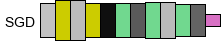

 - Changed dropout 4 from 0.394073 to 0.732021
 - Changed dense layer #2 size from 650 to 870


In [30]:
model = construct_new_model(size = 4)
for i in range(30):
    model, performed_mutations = mutate(model)
    __check(model)
    IPython.display.clear_output(wait = True)
    model_graphical_summary(model)
    performed_mutations_summary(performed_mutations)
gc.collect();

Теперь запрограммируем генетический алгоритм.

- Инициализация:
    - Генерируется первое поколение из N нейросетей какой-либо конфигурации
    - Выбирается тренировочный, тестовый и валидационный (опционально) набор данных
- Цикл:
    - Шаг 1: каждая нейросеть текущего поколения обучается в течение заданного времени на тестовом наборе
    - Шаг 2: для каждой нейросети расчитывается точность на тестовом наборе данных
    - Шаг 3: для каждой нейросети расчитывается, сколько она оставит потомков, на основе точности
    - Шаг 4: из потомков формируется следующее поколение, при этом осуществляются случайные мутации архитектуры

In [8]:
from scipy.special import softmax

population_size = 30
time_for_model_training = 10

#Генерируется первое поколение из N нейросетей какой-либо конфигурации
population = [construct_new_model(size = random.randint(0, 4)) for _ in range(population_size)]

#Выбирается тренировочный, тестовый и валидационный (опционально) набор данных
train_size = 50000
x_test, y_test = mnist.x_train[train_size:] / 255, mnist.y_train[train_size:]
x_val, y_val = mnist.x_val / 255, mnist.y_val

def reverse_sigmoid(x):
    return math.log(x / (1.001 - x))

#Цикл
def next_generation(population, next_population_size):
    global population_size, time_for_model_training
    current_population_size = len(population)
    
    #Шаг 1: каждая нейросеть текущего поколения обучается в течение заданного времени на обучающем наборе
    start_time = time.time()
    for model_index, model in enumerate(population):
        print('обучается модель %d из %d' % (model_index + 1, len(population)), end = '\r')
        fit_model_without_history(model, train_size = train_size, batch_size = 32, verbose = 0,
                                  time_limit = time_for_model_training)
    elapsed_time = time.time() - start_time
    print('на обучение %d моделей затрачено %g секунд' % (population_size, elapsed_time))
    
    #Шаг 2: для каждой нейросети расчитывается точность на тестовом наборе данных
    accuracies = []
    for model_index, model in enumerate(population):
        print('оценивается модель %d из %d' % (model_index + 1, len(population)), end = '\r')
        accuracies.append(evaluate_model_accuracy(model, x_override = x_val, y_override = y_val))
    print('Точность: средняя %g, минимальная %g, максимальная %g' % (np.mean(np.array(accuracies)),
                                                                     min(accuracies), max(accuracies)))

    #Шаг 3: для каждой нейросети расчитывается ожидаемое количество потомков на основе точности
    fertilities = [x + 0.2 / current_population_size for x in softmax([reverse_sigmoid(x) for x in accuracies])]
    sum_fertilities = sum(fertilities)
    points = list(np.linspace(start = 0, stop = sum_fertilities, num = next_population_size + 2)[1:-1])
    children_amount = [0] * current_population_size
    subtotal = 0
    for i in range(current_population_size):
        subtotal += fertilities[i]
        while len(points) > 0 and points[0] <= subtotal:
            children_amount[i] += 1
            points.pop(0)
    total_children_amount = sum(children_amount)
    if total_children_amount != next_population_size:
        raise BaseException(
            'Несовпадение в алгоритме расчета количества потомков: total_children_amount %d, next_population_size %d' % (
            total_children_amount, next_population_size))
    print('Кол-во потомков:', children_amount)
    
    #Шаг 4: из потомков формируется следующее поколение, при этом осуществляются случайные мутации архитектуры
    performed_mutations = []
    next_population = []
    for parent_index in range(current_population_size):
        parent = population[parent_index]
        for child_index in range(children_amount[parent_index]):
            child, performed_mutation = mutate(parent)
            next_population.append(child)
            performed_mutations.append(performed_mutation)
    gc.collect()

    return next_population, accuracies, fertilities, children_amount, performed_mutations

parent_accuracies_history = []
parent_fertilities_history = []
parent_children_amount_history = []
performed_mutations_history = []

for generation in range(10):
    population, parent_accuracies, parent_fertilities, parent_children_amount, performed_mutations = next_generation(
        population, population_size)
    parent_accuracies_history.append(parent_accuracies)
    parent_fertilities_history.append(parent_fertilities)
    parent_children_amount_history.append(parent_children_amount)
    performed_mutations_history.append(performed_mutations)

на обучение 30 моделей затрачено 300.581 секунд
Точность: средняя 0.832333, минимальная 0.1955, максимальная 0.956
Кол-во потомков: [1, 1, 1, 1, 1, 0, 2, 1, 0, 2, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 1]
на обучение 30 моделей затрачено 300.742 секунд
Точность: средняя 0.885183, минимальная 0.3226, максимальная 0.9681
Кол-во потомков: [0, 2, 1, 0, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 2, 1, 0, 0, 3, 1, 1, 1, 1, 1, 1]
на обучение 30 моделей затрачено 300.392 секунд
Точность: средняя 0.921597, минимальная 0.5967, максимальная 0.9743
Кол-во потомков: [1, 1, 1, 1, 1, 2, 0, 2, 0, 1, 1, 1, 0, 1, 1, 1, 0, 2, 1, 1, 1, 1, 2, 2, 1, 1, 0, 1, 1, 1]
на обучение 30 моделей затрачено 300.529 секунд
Точность: средняя 0.876283, минимальная 0.1135, максимальная 0.9764
Кол-во потомков: [1, 1, 1, 1, 1, 2, 0, 2, 1, 0, 1, 0, 1, 1, 1, 2, 1, 1, 1, 1, 0, 2, 1, 2, 2, 0, 0, 1, 1, 1]
на обучение 30 моделей затрачено 300.282 секунд
Точность: средняя 0.8865, минимальная 0.1135, максимальна

In [99]:
for generation in range(10):
    population, parent_accuracies, parent_fertilities, parent_children_amount, performed_mutations = next_generation(
        population, population_size)
    parent_accuracies_history.append(parent_accuracies)
    parent_fertilities_history.append(parent_fertilities)
    parent_children_amount_history.append(parent_children_amount)
    performed_mutations_history.append(performed_mutations)

на обучение 30 моделей затрачено 300.557 секунд
Точность: средняя 0.90296, минимальная 0.1135, максимальная 0.9778
Кол-во потомков: [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 2, 0, 1, 1, 1, 0, 1, 0, 1, 1, 1, 2, 1, 1, 1, 2, 0, 1]
на обучение 30 моделей затрачено 300.396 секунд
Точность: средняя 0.853913, минимальная 0.1135, максимальная 0.9784
Кол-во потомков: [1, 1, 1, 1, 2, 0, 1, 1, 1, 1, 2, 0, 1, 2, 2, 1, 1, 1, 0, 0, 1, 1, 2, 1, 1, 2, 0, 1, 0, 1]
на обучение 30 моделей затрачено 300.341 секунд
Точность: средняя 0.902807, минимальная 0.1135, максимальная 0.9787
Кол-во потомков: [1, 1, 1, 0, 2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 0, 2, 1, 1, 1, 0, 1, 1, 2, 1, 1, 1, 1, 0, 2, 0]
на обучение 30 моделей затрачено 300.359 секунд
Точность: средняя 0.913997, минимальная 0.1135, максимальная 0.9794
Кол-во потомков: [1, 0, 2, 1, 1, 1, 1, 0, 1, 2, 0, 1, 1, 1, 1, 2, 1, 1, 1, 1, 0, 2, 1, 2, 1, 1, 1, 1, 0, 1]
на обучение 30 моделей затрачено 300.414 секунд
Точность: средняя 0.89273, минимальная 0.1135, максимальн

In [ ]:
for generation in range(10):
    population, parent_accuracies, parent_fertilities, parent_children_amount, performed_mutations = next_generation(
        population, population_size)
    parent_accuracies_history.append(parent_accuracies)
    parent_fertilities_history.append(parent_fertilities)
    parent_children_amount_history.append(parent_children_amount)
    performed_mutations_history.append(performed_mutations)

на обучение 30 моделей затрачено 300.389 секунд
Точность: средняя 0.870817, минимальная 0.1135, максимальная 0.979
Кол-во потомков: [1, 0, 1, 1, 0, 1, 1, 2, 0, 1, 2, 1, 0, 1, 2, 1, 1, 2, 1, 0, 1, 2, 0, 1, 1, 2, 0, 2, 1, 1]
на обучение 30 моделей затрачено 300.253 секунд
Точность: средняя 0.8756, минимальная 0.098, максимальная 0.9795
Кол-во потомков: [1, 1, 0, 1, 1, 1, 1, 1, 2, 1, 1, 0, 2, 0, 1, 1, 1, 2, 1, 0, 2, 2, 0, 1, 1, 1, 2, 1, 0, 1]
на обучение 30 моделей затрачено 300.286 секунд
Точность: средняя 0.86268, минимальная 0.1135, максимальная 0.9793
Кол-во потомков: [0, 1, 1, 2, 0, 1, 1, 1, 2, 2, 1, 2, 0, 1, 1, 1, 2, 0, 1, 3, 0, 1, 1, 0, 0, 2, 2, 0, 1, 0]
на обучение 30 моделей затрачено 300.241 секунд
Точность: средняя 0.921747, минимальная 0.1135, максимальная 0.979
Кол-во потомков: [0, 1, 1, 2, 1, 0, 2, 1, 2, 1, 2, 1, 1, 1, 0, 1, 1, 1, 2, 0, 1, 1, 2, 1, 0, 1, 1, 2, 0, 0]
на обучение 30 моделей затрачено 300.342 секунд
Точность: средняя 0.92941, минимальная 0.1135, максимальная 0.

На этом месте произошла ошибка Out of memory, вероятно где-то происходит утечка памяти. Отобразим полученное генеалогическое древо поколений нейросетей.

In [8]:
def show_tree(parent_children_amount_history, first_population_size, do_display = True, last_generation_to_draw = None,
              transpose = False):
    max_population_size = max([len(arr) for arr in parent_children_amount_history])
    populations_count = len(parent_children_amount_history) + 1
    ###############
    parents = np.zeros((populations_count, max_population_size), dtype = int)
    descendants_count = np.zeros((populations_count, max_population_size), dtype = int)
    for population_index in range(populations_count - 1, 0, -1):
        parent_children_amount = parent_children_amount_history[population_index - 1]
        current_child_index = 0
        for parent_index in range(len(parent_children_amount)):
            for i in range(parent_children_amount[parent_index]):
                parents[population_index, current_child_index] = parent_index
                descendants_count[population_index - 1, parent_index] \
                    += descendants_count[population_index, current_child_index] + 1
                current_child_index += 1
    ###############
    block_width = 90
    block_height = 80
    antialias_downscaling = 4
    total_height = block_height * populations_count
    if last_generation_to_draw:
        height_for_last_generation = 450
        total_height += height_for_last_generation
    image = Image.new('RGB', (block_width * max_population_size, total_height), '#FFFFFF')
    drawer = ImageDraw.Draw(image)
    if last_generation_to_draw:
        for model_index, model in enumerate(last_generation_to_draw):
            model_image = model_graphical_summary(model, write_optimizer_name = True, block_max_width = 30,
                                            max_width = height_for_last_generation, max_height = 75,
                                            max_neurons = 2000, width_for_optimizer = 120, font_size = 28,
                                            do_display = False).transpose(PIL.Image.ROTATE_90)
            model_image_height = model_image.size[1]
            image.paste(model_image, (block_width * model_index, height_for_last_generation - model_image_height))
    def descendants_to_radius(descendants):
        radius = 2 + 2 * round(pow(descendants, 0.5))
        return min(radius, block_width // 5)
    def get_pos(population_index, element_index): #returns x, y, line_radius
        height = total_height - block_height * (0.5 + population_index)
        center_pos = block_width * (0.5 + element_index)
        descendants = descendants_count[population_index, element_index]
        radius = descendants_to_radius(descendants)
        return center_pos, height, radius
    def draw_circle(x, y, radius, color):
        drawer.ellipse([(x - radius, y - radius), (x + radius, y + radius)], fill = color)
    for population_index in range(populations_count - 1, 0, -1):
        elements_count = sum(parent_children_amount_history[
            population_index - 1]) if population_index > 0 else first_population_size
        for element_index in range(elements_count):
            x, y, radius = get_pos(population_index, element_index)
            draw_circle(x, y, radius - 1, color = '#000000')
            parent_index = parents[population_index, element_index]
            parent_x, parent_y, parent_radius = get_pos(population_index - 1, parent_index)
            angle = -math.atan2(y - parent_y, x - parent_x)
            upper_dy = radius * math.cos(angle)
            upper_dx = radius * math.sin(angle)
            lower_dy = parent_radius * math.cos(angle)
            lower_dx = parent_radius * math.sin(angle)
            upper_left_point = (x - upper_dx, y - upper_dy)
            upper_right_point = (x + upper_dx, y + upper_dy)
            lower_left_point = (parent_x - lower_dx, parent_y - lower_dy)
            lower_right_point = (parent_x + lower_dx, parent_y + lower_dy)
            polygon_bounds = [upper_left_point, lower_left_point, lower_right_point, upper_right_point]
            drawer.polygon(polygon_bounds, fill = '#000000')
            draw_circle(parent_x, parent_y, parent_radius - 1, color = '#000000')
    drawer.rectangle([0, total_height - block_height // 2, block_width * max_population_size, total_height], '#FFFFFF')
    image.resize((image.size[0] // antialias_downscaling, image.size[1] // antialias_downscaling), PIL.Image.ANTIALIAS)
    if transpose:
        image = image.transpose(PIL.Image.ROTATE_270)
    if do_display:
        display(image)
    return image, parents, descendants_count

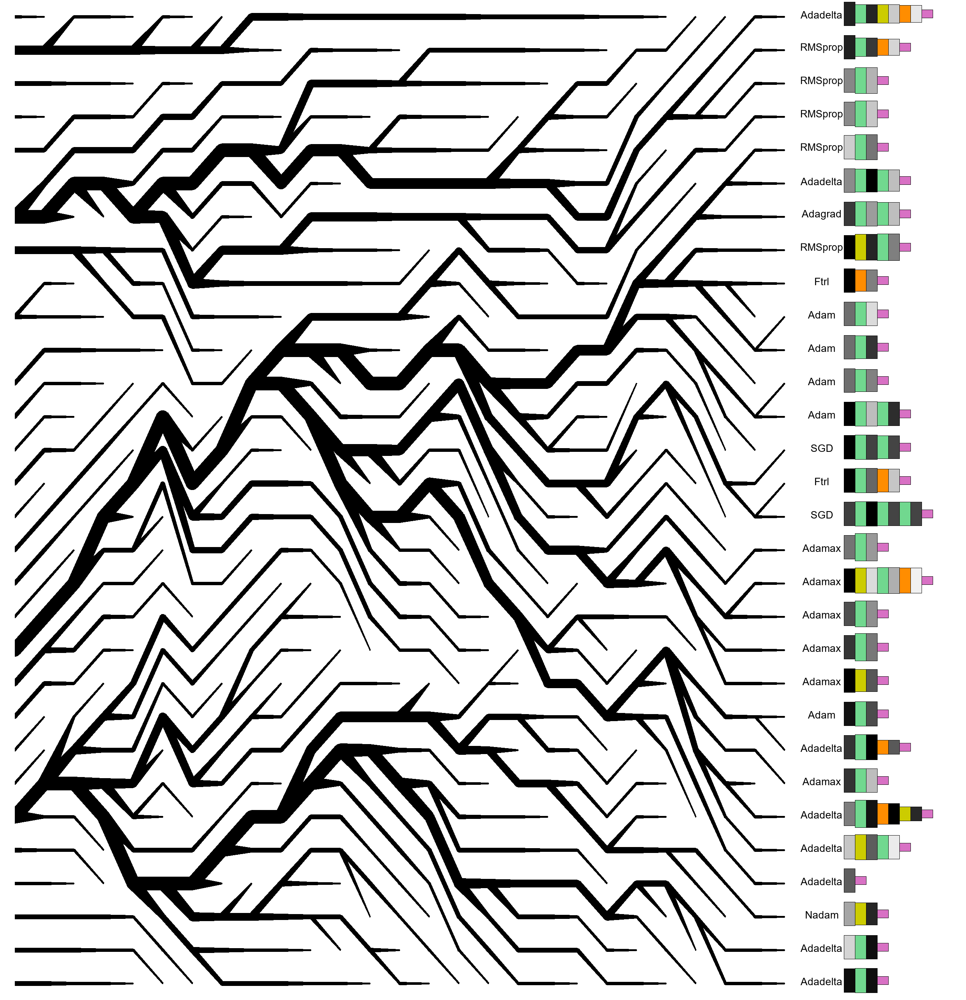

In [170]:
image, parents, descendants_count = show_tree(
    parent_children_amount_history, population_size, last_generation_to_draw = population, transpose = True);

Отобразим зависимость точности от номера поколения. По горизонтали - номер поколения, по вертикали - точность на тестовом наборе, используемом в расчете количества потомков. Другим цветом обозначена средневзвешенная точность по количеству оставленных потомков (то есть нейросети, не оставившие потомков, исключаются; нейросети с 2 и более потомками имеют больший вес при расчете среднего - тем самым из расчета средней точности исключаются нейросети, в которых последняя мутация была неудачной).

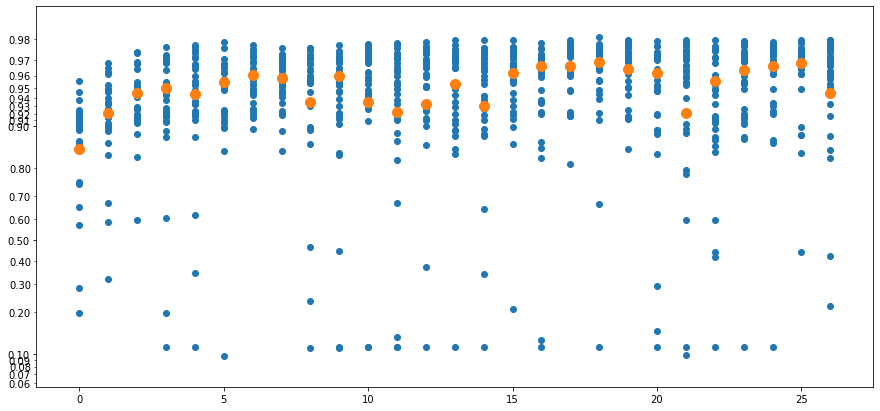

In [164]:
plt.figure(figsize = (15, 7))
plt.gca().set_yscale('logit')
generations = []
accuracies = []
accuracies_avg = []
for gen_index, (generation, children_amount) in enumerate(zip(parent_accuracies_history, parent_children_amount_history)):
    for model_index, accuracy in enumerate(generation):
        generations.append(gen_index)
        accuracies.append(accuracy)
    accuracies_avg.append(np.average(np.array(generation), weights = children_amount))
plt.scatter(generations, accuracies)
plt.scatter(range(len(parent_accuracies_history)), accuracies_avg, s = 100)
plt.show()

Изучим, как различные мутации влияли на точность.

In [187]:
gc.collect()
mutations_to_analyze = []
mutations_counts = []
generations_count = parents.shape[0]
for generation_index in range(generations_count - 1, 0, -1):
    accuracies = parent_accuracies_history[generation_index]
    for model_index, accuracy in enumerate(accuracies):
        parent_index = parents[generation_index, model_index]
        parent_accuracy = parent_accuracies_history[generation_index - 1][parent_index]
        accuracy_delta = accuracy - parent_accuracy
        mutations_list = performed_mutations_history[generation_index - 1][parent_index]
        if len(mutations_list) == 0:
            mutations_to_analyze.append({
                'accuracy_delta': accuracy_delta,
                'type': 'none'
            })
        elif len(mutations_list) == 1:
            mutations_to_analyze.append({
                'accuracy_delta': accuracy_delta,
                'type': mutations_list[0]['type'],
                'parameters': mutations_list[0]
            })
        else:
            pass #не рассматриваем случаи с более чем одной мутацией
        mutations_counts.append(len(mutations_list))

for mutations_count, how_often in enumerate(np.bincount(mutations_counts)):
    print('%d мутаций за раз: %d случаев' % (mutations_count, how_often))

0 мутаций за раз: 51 случаев
1 мутаций за раз: 296 случаев
2 мутаций за раз: 319 случаев
3 мутаций за раз: 100 случаев
4 мутаций за раз: 13 случаев
5 мутаций за раз: 0 случаев
6 мутаций за раз: 1 случаев


In [192]:
no_mutation_accuracy_deltas = []
add_layer_accuracy_deltas = []
remove_layer_accuracy_deltas = []
dropout_increase_accuracy_deltas = []
dropout_decrease_accuracy_deltas = []
enlarge_layer_accuracy_deltas = []
shorten_layer_accuracy_deltas = []
activation_change_accuracy_deltas = []
for mutation_info in mutations_to_analyze:
    accuracy_delta = mutation_info['accuracy_delta']
    if mutation_info['type'] == 'none':
        no_mutation_accuracy_deltas.append(accuracy_delta)
    elif mutation_info['type'] == 'add_dense_layer':
        add_layer_accuracy_deltas.append(accuracy_delta)
    elif mutation_info['type'] == 'remove_dense_layer':
        remove_layer_accuracy_deltas.append(accuracy_delta)
    elif mutation_info['type'] == 'change_dropout':
        if mutation_info['parameters']['old_rate'] < mutation_info['parameters']['new_rate']:
            dropout_increase_accuracy_deltas.append(accuracy_delta)
        else:
            dropout_decrease_accuracy_deltas.append(accuracy_delta)
    elif mutation_info['type'] == 'change_dense_layer_size':
        if mutation_info['parameters']['old_size'] < mutation_info['parameters']['new_size']:
            enlarge_layer_accuracy_deltas.append(accuracy_delta)
        else:
            shorten_layer_accuracy_deltas.append(accuracy_delta)
    elif mutation_info['type'] == 'change_dense_layer_activation':
        activation_change_accuracy_deltas.append(accuracy_delta)

-0.06321764705882353
-0.022200000000000015
-0.032341666666666685
-0.014403199999999994
-0.013025252525252523
-0.03925454545454545
-0.03131666666666666


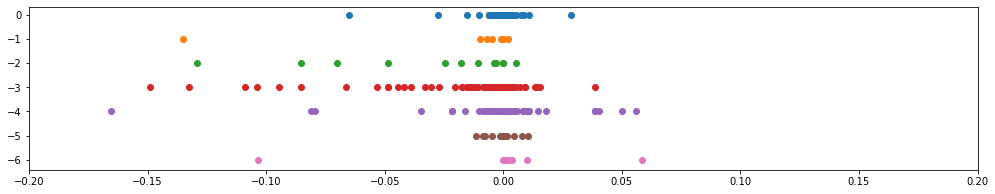

In [209]:
print(np.mean(np.array(no_mutation_accuracy_deltas)))
print(np.mean(np.array(add_layer_accuracy_deltas)))
print(np.mean(np.array(remove_layer_accuracy_deltas)))
print(np.mean(np.array(dropout_increase_accuracy_deltas)))
print(np.mean(np.array(dropout_decrease_accuracy_deltas)))
print(np.mean(np.array(enlarge_layer_accuracy_deltas)))
print(np.mean(np.array(shorten_layer_accuracy_deltas)))

plt.figure(figsize = (17, 3))
plt.gca().set_xlim(-0.2, 0.2)
plt.scatter(no_mutation_accuracy_deltas, [0] * len(no_mutation_accuracy_deltas))
plt.scatter(add_layer_accuracy_deltas, [-1] * len(add_layer_accuracy_deltas))
plt.scatter(remove_layer_accuracy_deltas, [-2] * len(remove_layer_accuracy_deltas))
plt.scatter(dropout_increase_accuracy_deltas, [-3] * len(dropout_increase_accuracy_deltas))
plt.scatter(dropout_decrease_accuracy_deltas, [-4] * len(dropout_decrease_accuracy_deltas))
plt.scatter(enlarge_layer_accuracy_deltas, [-5] * len(enlarge_layer_accuracy_deltas))
plt.scatter(shorten_layer_accuracy_deltas, [-6] * len(shorten_layer_accuracy_deltas))
plt.show()

Данных конечно недостаточно для анализа, потому что успешность той или иной мутации зависит от архитектуры нейросети, а также может быть разной в краткосрочной и долгосрочной (при длительном обучении) перспективе.

Первый слой (синие точки) показывает, как изменяется точность в следующем поколении без мутаций. Как правило она растет, потому что между поколениями осуществляется обучение на тренировочных примерах. Но в редких случаях точность резко падает, возможно из-за негативного эффекта предыдущих мутаций - нейросеть стала необучаемой, то есть перешла в такую точку пространства признаков, откуда невозможен градиентный спуск. Поэтому среднее изменение точности без мутаций оказывается даже ниже нуля.

Прежде чем делать выводы, посмотрим еще, насколько совпадает точность нейросетей на двух тестовых наборах.

In [6]:
test_population = [construct_new_model(
    size = 4,
    neurons_count = lambda layer_index, prev_count: [300, 200, 100, 50][layer_index]
) for _ in range(30)]
for model_index, model in enumerate(test_population):
    print('обучается модель %d из %d' % (model_index + 1, len(test_population)), end = '\r')
    fit_model_without_history(model, train_size = 60000, batch_size = 32, verbose = 0, time_limit = 50)

In [19]:
sample = random.sample(range(10000), 5000)
x_test, y_test = mnist.x_val[sample] / 255, mnist.y_val[sample]
x_test2, y_test2 = np.delete(mnist.x_val, sample, axis = 0) / 255, np.delete(mnist.y_val, sample, axis = 0)

accuracies_test = []
accuracies_test2 = []
for model_index, model in enumerate(test_population):
    print('оценивается модель %d из %d' % (model_index + 1, len(test_population)), end = '\r')
    accuracies_test.append(evaluate_model_accuracy(model, x_override = x_test, y_override = y_test))
    accuracies_test2.append(evaluate_model_accuracy(model, x_override = x_test2, y_override = y_test2))

Ниже показана точность на двух тестовых наборах.

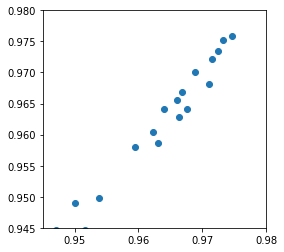

In [23]:
plt.figure(figsize = (4, 4))
plt.gca().set_xlim(0.945, 0.98)
plt.gca().set_ylim(0.945, 0.98)
plt.scatter(accuracies_test, accuracies_test2)
plt.show()

Первый эксперимент не показал хороших результатов в плане точности,  ниже перечислены выявленные проблемы.

**Сложность в оценке точности.** При достижении высокой точности нейросетей точность в двух разных тестовых наборах перестает коррелировать, как показал предыдущий эксперимент. Это может быть связано с недостаточным размером тестовых наборов: погрешность измерения становится выше, чем разница в точности между разными нейросетями. Например, пусть при данных размерах тестовых наборов погрешность на них составляет около 1% (со степенью уверенности 0.95). Если нейросети имеют точность от 40 до 60%, то их можно сравнивать: оба тестовых набора проранжируют их по точности примерно одинаково. Если же нейросети показывают точность от 98 до 99%, то эти же два тестовых набора проранжируют их совсем по-разному из-за погрешности.

Можно увеличивать размеры тестового набора с увеличением точности нейросетей. Например, давать нейросети тестовые примеры до тех пор, пока обратная сигмоида от расчитанной точности не стабилизируется в области некоего эпсилон (то есть чем выше точность, тем боее надежно она расчитывается).

Гипотетически может возникнуть ситуация "переобучения" нейросетей на тестовом наборе. Хотя он не использовался в алгоритме оптимизации, но используется при отборе следующего поколения.

Кроме того при обучении на MNIST высокая точность может не быть показателем качества. Например, нейросеть A имеет более высокую точность на тестовом наборе MNIST, чем нейросеть B, но нейросеть B лучше распознает цифры с лишними линиями, менее контрастные, с недостающими деталями, то есть более устойчива к разнообразным искажениям, которые вообще не присутствуют в тестовом наборе MNIST. В таком случае в генетическом алгоритме разумнее выбрать нейросеть В, но тестирование на MNIST будет выбирать нейросеть A.

Сложно достичь хороших результатов, не указав, чего именно мы хотим. Нейросети неоткуда "узнать", что она должна уметь распознавать цифры с лишними линиями. Это знают только люди, знающие о специфике задачи распознавания гораздо больше, чем заложено в датасете. Например, что цифра с "выщербиной" - обычно та же цифры, что и без нее. Или что цифра с низким контрастом или другого цвета - та же самая цифра. Но при обучении эти дополнительные знания нигде не заложены. Нейросеть даже не знает, что это цифра. Вдруг это какая-то фазовая диаграмма? Или точки очагов протестов, наложенные на карту Техаса? В этом случае пространственное положение закрашенных областей имеет первостепенное важное значение. В таких деталях заключается сложность обучения нейросетей "с нуля".

Для успешности генетического алгоритма важно искать надежные показатели качества нейросетей для расчета успешности в конкурентной борьбе за количество потомков.

**Слишком высокая скорость мутаций.** Многие виды мутаций (добавление слоя, уделание слоя, уменьшение размера слоя, изменение функции активации слоя) повреждают нейросеть. Если ее после этого снова начать обучать, то она может достичь исходной и даже более высокой точности (а может и не достичь, может стать вообще необучаемой, как и в случае неправильного выбора начальных весов). Понятие "высокая скорость мутаций" означает, что в среднем между мутациями нейросети дается слишком мало обучающих примеров. Это возникает либо при слишком высокой вероятности мутаций между поколениями, либо при недостаточном времени обучения между поколениями. В этом случае нейросети без мутаций имеют конкурентное преимущество, так как нейросети с мутациями не успевают восстановиться после повреждения, достигнув исходной точности.

В этом случае в генеалогическом древе мутации чаще всего будут вести в тупиковые ветви, а размножаться будут в основном нейросети без мутаций. Тогда в алгоритме естественным образом достигается то, что следовало бы установить заранее - меньшая скорость мутаций в генеалогическом древе конкурентно успешных нейросетей. При этом лишние вычислительные мощности расходуются расчет быстро мутирующих и не оставляющих потомков нейросетей.

Чтобы подобрать оптимальную скорость мутаций, нужно провести эксперименты, в которых сравнить результаты обучения (зависимость точности от времени обучения) нейросетей с мутациями в сравнении с их копиями, не подвергшихся мутациям. Также следует обучать нейросети аналогичной (мутировавшей) архитектуры с нуля и обращать внимание на их точность. Затем попытаться интерпретировать результаты эксперимента и подобрать оптимальное время обучения между последовательными мутациями.

Можно также ввести для каждой нейросети параметр, обозначающий скорость мутаций, считать его частью генетического кода. Тогда оптимальная скорость мутаций может быть достигнута в ходе генетического алгоритма. Хотя это может случиться слишком поздно, когда нейросети уже "испорчены" множеством мутаций. Полученное значение оптимальной скорости мутаций может не подойти для новых, не подвергавшихся мутациям нейросетей.

**Слишком малый процент полезных мутаций.** Рассмотрим такую идеализированную ситуацию. Пусть все мутации однозначно делятся на полезные и вредные. Пусть всего 1% мутаций полезны, 99% вредны. Пусть генетический код длинный, и при переходе от предыдущего поколения к следующему происходит в среднем 1000 мутаций. Пусть наш отбор не слишком жесткий, то есть побеждает не один сильнейший, единственный оставляющий потомство, а вместо этого каждая особь оставляет от 0 до 3 потомков, в зависимости от приспособленности. Понятно, что среди особей, которые оставили много потомков, процент полезных мутаций среднестатистически будет больше 1%. Но все равно вредных мутаций в них будет больше, чем полезных. Тогда в каждом следующем поколении, несмотря на отбор, вредные мутации будут накапливаться быстрее полезных. Это приведет к вырождению популяции: характеристики популяции будут падать, вместо того, чтобы расти. Самый крайний случай - 0% полезных мутаций, в этом случае все понятно. Но если полезных мутаций всего 1%, вряд ли картина сильно изменится.

Известно, что в природе большая часть мутаций нейтральны, а вредных значительно больше, чем полезных. По этому поводу можно сказать следующее:
1. Чем жестче отбор, тем медленнее накапливаются вредные мутации. При этом однако возникает эффект "бутылочного горлышка", когда в популяции теряется генетическое разнообразие. Это значит, что в изменившихся условиях вся популяция может оказаться нежизнеспособной. Но зато вредные мутации накапливаются медленнее, потому что все потомство принадлежит особям с наилучшей приспособленностью (а не просто с достаточной).
2. В природе большая часть разнообразия обеспечивается не мутациями, а случайной рекомбинацией генов от двух родителей. В таком случае природа ставит "эксперименты" не на отдельных нуклеотидах ДНК, а комбинируя целые гены или даже длинные последовательности генов.

Если мы программируем генетический алгоритм, то не можем сказать заранее, какие мутации и в каких случаях полезны, а какие нейтральны или вредны, иначе в алгоритме не было бы смысла. Поэтому мы не знаем заранее процент полезных мутаций. Одна и та же мутация (добавления слоя в полносвязную слоистую нейросеть) может быть полезной при недостаточном количестве слоев и вредной при избыточном, полезной при одном положении нового слоя и вредной при другом, полезной при большом размере нового слоя и вредной при маленьком, полезной при одном алгоритме пересчета весов и вредной при другом, вплоть до необучаемости нейросети (прогрессирующего ухудшения точности при последующем обучении).

Как вариант можно создать несколько популяций с разной жесткостью отбора и осуществлять отбор среди популяций, как и среди особей. В нашем случае стоит искать такой алгоритм оптимизации, который работает даже в случае, если начальные веса заданы неоптимально. Это может компенсировать возможный вред, который наносится нейросети мутациями. Можно также использовать какие-то нормализующие слои, которые препятствуют уходу нейросети в пространстве весов в область, откуда не работает градиентный спуск.

Повторим генетический алгоритм со следующими изменениями:
- зафиксируем дропауты на уровне 0.3
- исходные нейросети будут состоять из одного скрытого relu-слоя размером 500
- вероятность удаления, добавления, изменения активации слоя - по 1/30
- вероятность изменения весов - 2/3, коэффициент от 1/1.3 до 1.3
- прогрессивная оценка точности: чем выше оценка точности нейросети, тем она надежнее
- следим за использованием памяти
- параллельно будем обучать несколько нейросетей без мутаций для сравнения

In [9]:
def set_all_dropouts(model, rate):
    for layer in model.layers:
        if layer.__class__ == Dropout:
            layer.rate = rate

gc.collect()
print('Загрузка дополнительных тестовых наборов...')
files_count = 25
x_val_deformed = [np.load('../numpy_saved/x_val_deformed_%d.npy' % i) for i in range(files_count)]
x_val_large = np.concatenate(x_val_deformed, axis = 0) / 255
y_val_large = np.concatenate([mnist.y_val] * files_count, axis = 0)
print(x_val_large.shape, y_val_large.shape)
sample = random.sample(range(x_val_large.shape[0]), x_val_large.shape[0])
x_val_large = x_val_large[sample]
y_val_large = y_val_large[sample]
print('Тестовые примеры перемешаны')

def sigmoid(x):
    return 1.001 / (1 + math.exp(-x))
def reverse_sigmoid(x):
    return math.log(x / (1.001 - x))
def get_range(center, epsilon):
    center_rescaled = reverse_sigmoid(center)
    return sigmoid(center_rescaled - epsilon), sigmoid(center_rescaled + epsilon)

def evaluate_model_accuracy_progressive(model, epsilon = 0.01, chunks = 20):
    chunk_size = 100
    max_chunks = x_val_large.shape[0] // chunk_size
    averaged_accuracies = []
    total_correct_predictions = 0
    acc_min = 0
    acc_max = 1
    for chunk_index in range(max_chunks):
        min_index = chunk_index * chunk_size
        max_index = (chunk_index + 1) * chunk_size
        loss, accuracy = model.evaluate(x_val_large[min_index:max_index], y_val_large[min_index:max_index], verbose = 0)
        total_correct_predictions += round(chunk_size * accuracy)
        total_predictions = max_index
        new_averaged_accuracy = total_correct_predictions / total_predictions
        averaged_accuracies.append(new_averaged_accuracy)
        if chunk_index >= chunks:
            last_accuracies = averaged_accuracies[-chunks:]
            acc_min, acc_max = get_range(new_averaged_accuracy, epsilon)
            if min(last_accuracies) >= acc_min and max(last_accuracies) <= acc_max:
                break
    return new_averaged_accuracy, acc_min, acc_max, averaged_accuracies

# тест

# model, accuracy_history = construct_new_model(size = 1), []
# set_all_dropouts(model, 0.3)
# fit_model(model, accuracy_history, train_size = 60000, test_size = 500,
#             batch_size = 32, accuracy_every_X_batches = 16, verbose = 0, time_limit = 100)
# new_averaged_accuracy, acc_min, acc_max, averaged_accuracies = evaluate_model_accuracy_progressive(model)
# print(new_averaged_accuracy, acc_min, acc_max)
# plt.plot(averaged_accuracies)
# plt.show()

# plt.plot(accuracy_history)
# plt.show()

Загрузка дополнительных тестовых наборов...
(250000, 28, 28) (250000,)
Тестовые примеры перемешаны


In [17]:
# Повторяем генетический алгоритм с изменениями

import os
import psutil
def get_memory_usage(): #MB
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / 1e6

gc.collect()
memory_usage_history = [get_memory_usage()]

model_to_compare = construct_new_model(size = 4, neurons_count = lambda layer_index, _: [300, 200, 100, 50][layer_index])
set_all_dropouts(model_to_compare, 0)
model_to_compare_color = 'green'
model_to_compare_accuracies = []

model_to_compare_2 = construct_new_model(size = 1, neurons_count = lambda a, b: 500)
model_to_compare_2_color = 'violet'
model_to_compare_2_accuracies = []

from scipy.special import softmax

population_size = 20
time_for_model_training = 10

# Генерируется первое поколение из N нейросетей
population = [construct_new_model(size = 1, neurons_count = lambda a, b: 500) for _ in range(population_size)]
for model in population:
    set_all_dropouts(model, 0.3)

def accuracies_to_fertilities(accuracies):
    return [x + 0.2 / len(accuracies) for x in softmax([reverse_sigmoid(x) for x in accuracies])]

In [16]:
# Задание цикла
def next_generation(population, next_population_size):
    global population_size, time_for_model_training
    current_population_size = len(population)
    
    #Шаг 1: каждая нейросеть текущего поколения обучается в течение заданного времени на обучающем наборе
    start_time = time.time()
    for model_index, model in enumerate(population):
        print('обучается модель %d из %d' % (model_index + 1, len(population)), end = '\r')
        fit_model_without_history(model, train_size = 60000, batch_size = 32, verbose = 0,
                                  time_limit = time_for_model_training)
    elapsed_time = time.time() - start_time
    print('на обучение %d моделей затрачено %g секунд' % (current_population_size, elapsed_time))
    
    #Шаг 2: для каждой нейросети расчитывается точность на тестовом наборе данных
    start_time = time.time()
    accuracies = []
    for model_index, model in enumerate(population):
        print('оценивается модель %d из %d' % (model_index + 1, len(population)), end = '\r')
        acc, _, _, _ = evaluate_model_accuracy_progressive(model)
        accuracies.append(acc)
    elapsed_time = time.time() - start_time
    print('на оценку %d моделей затрачено %g секунд' % (current_population_size, elapsed_time))
    print('Точность: средняя %g, минимальная %g, максимальная %g' % (np.mean(np.array(accuracies)),
                                                                     min(accuracies), max(accuracies)))

    #Шаг 3: для каждой нейросети расчитывается ожидаемое количество потомков на основе точности
    fertilities = accuracies_to_fertilities(accuracies)
    sum_fertilities = sum(fertilities)
    points = list(np.linspace(start = 0, stop = sum_fertilities, num = next_population_size + 2)[1:-1])
    children_amount = [0] * current_population_size
    subtotal = 0
    for i in range(current_population_size):
        subtotal += fertilities[i]
        while len(points) > 0 and points[0] <= subtotal:
            children_amount[i] += 1
            points.pop(0)
    total_children_amount = sum(children_amount)
    if total_children_amount != next_population_size:
        raise BaseException(
            'Несовпадение в алгоритме расчета количества потомков: total_children_amount %d, next_population_size %d' % (
            total_children_amount, next_population_size))
    print('Кол-во потомков:', children_amount)
    
    #Шаг 4: из потомков формируется следующее поколение, при этом осуществляются случайные мутации архитектуры
    performed_mutations = []
    next_population = []
    for parent_index in range(current_population_size):
        parent = population[parent_index]
        for child_index in range(children_amount[parent_index]):
            child, performed_mutation = mutate(
                parent,
                change_dropout_probability = 0,
                add_dense_layer_probability = 1/30,
                remove_dense_layer_probability = 1/30,
                change_dense_layer_activation_probability = 1/30,
                change_dense_layer_size_probability = 2/3,
                change_model_optimizer_probability = 0,
                change_size_min_ratio = 1/1.3,
                change_size_max_ratio = 1.3,
                new_layers_are_relu = True
            )
            set_all_dropouts(child, 0.3)
            __check(child)
            next_population.append(child)
            performed_mutations.append(performed_mutation)
    gc.collect()
    print('Создано следующее поколение')

    return next_population, accuracies, fertilities, children_amount, performed_mutations

parent_accuracies_history = []
parent_fertilities_history = []
parent_children_amount_history = []
performed_mutations_history = []

In [10]:
def do_genetics_algorithm_loop():
    global population, population_size, parent_accuracies_history, parent_fertilities_history, \
            parent_children_amount_history, performed_mutations_history, memory_usage_history
    
    #Выполение цикла
    population, parent_accuracies, parent_fertilities, parent_children_amount, performed_mutations = next_generation(
        population, population_size)
    parent_accuracies_history.append(parent_accuracies)
    parent_fertilities_history.append(parent_fertilities)
    parent_children_amount_history.append(parent_children_amount)
    performed_mutations_history.append(performed_mutations)
    memory_usage_history.append(get_memory_usage())
    
    #Модели для сравнения
    fit_model_without_history(model_to_compare, train_size = 60000, batch_size = 32, verbose = 0,
                                      time_limit = time_for_model_training)
    acc, _, _, _ = evaluate_model_accuracy_progressive(model_to_compare)
    model_to_compare_accuracies.append(acc)
    
    fit_model_without_history(model_to_compare_2, train_size = 60000, batch_size = 32, verbose = 0,
                                      time_limit = time_for_model_training)
    acc, _, _, _ = evaluate_model_accuracy_progressive(model_to_compare_2)
    model_to_compare_2_accuracies.append(acc)
    
    #Отрисовка информации
    IPython.display.clear_output(wait = True)
    image, parents, descendants_count = show_tree(
        parent_children_amount_history, population_size, last_generation_to_draw = population, transpose = True)
    
    print('Точность по поколениям:')
    plt.figure(figsize = (17, 5))
    plt.gca().set_yscale('logit')
    generations = []
    accuracies = []
    accuracies_avg = []
    for gen_index, (generation, children_amount) in enumerate(zip(parent_accuracies_history, parent_children_amount_history)):
        for model_index, accuracy in enumerate(generation):
            generations.append(gen_index)
            accuracies.append(accuracy)
        accuracies_avg.append(np.average(np.array(generation), weights = children_amount))
    plt.scatter(generations, accuracies)
    plt.plot(model_to_compare_accuracies, color = model_to_compare_color)
    plt.plot(model_to_compare_2_accuracies, color = model_to_compare_2_color)
    plt.scatter(range(len(parent_accuracies_history)), accuracies_avg, s = 100)
    plt.show()
    
    print('Использование памяти:')
    plt.figure(figsize = (17, 4))
    plt.plot(memory_usage_history)
    plt.show()

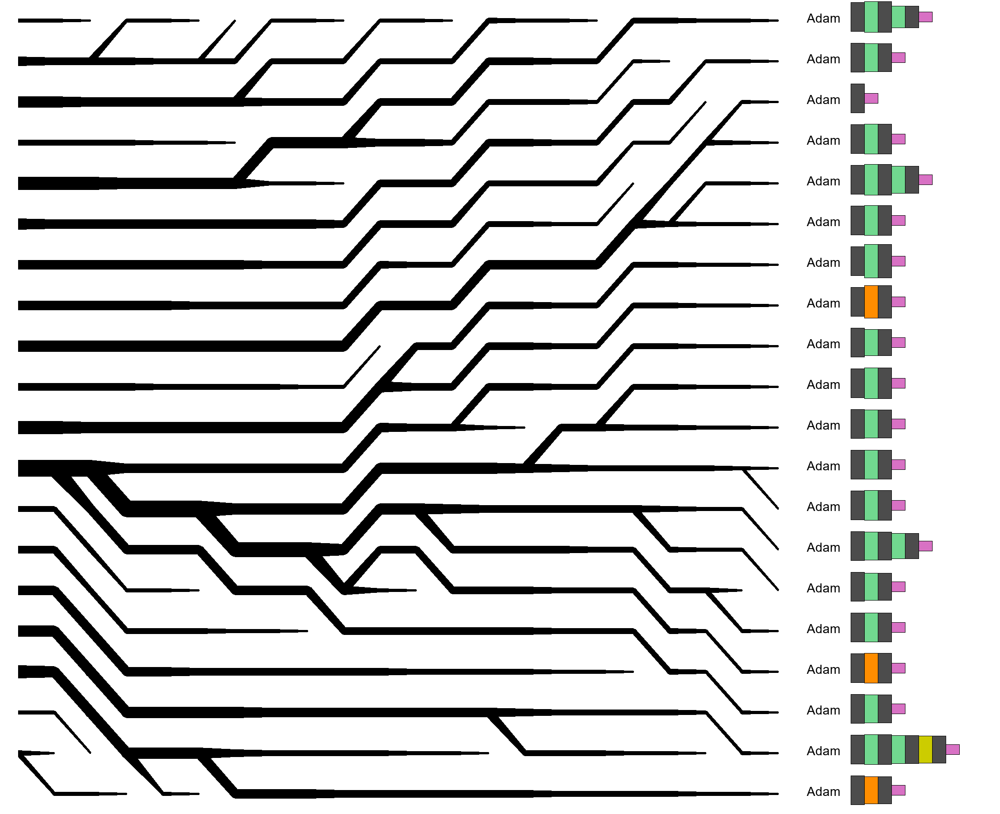

Точность по поколениям:


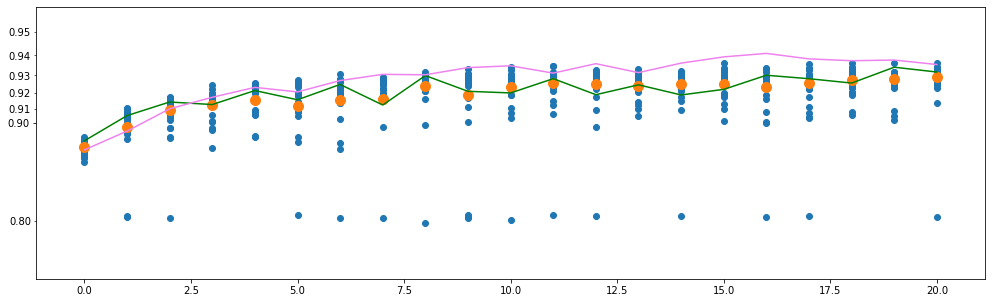

Использование памяти:


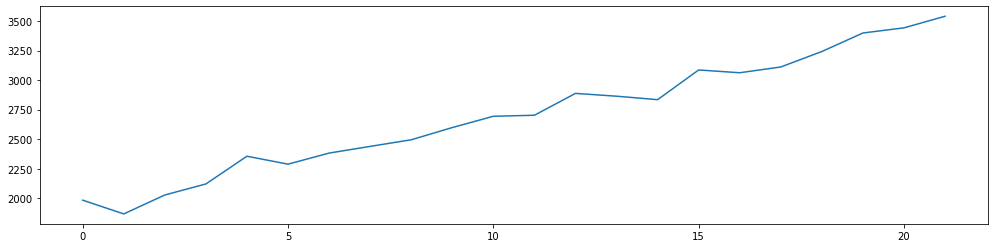

In [43]:
# Старт алгоритма

for i in range(20):
    do_genetics_algorithm_loop()

**Промежуточные выводы**

*Контроль памяти.* Где-то в tensorflow keras видимо не происходит освобождение лишней памяти. Объем занимаемой памяти так или иначе должен расти из-за накопления данных, но не так быстро (по 50-100 мб за итерацию).

*Нейросети для сравнения.* Фиолетовый график (нейросеть из одного слоя 500-relu с дропаутами) показывает лучшие результаты, возможно из-за хорошо подобранных дропаутов, тогда как во всех нейросетях всех поколений дропауты фиксированы на 0.3.

*Значения точности.* Минимальное значение точности на графике - 0.8. Возможно это происходит из-за ошибки в алгоритме расчета точности при низкой точности. В любом случае такие нейросети не будут иметь потомков.

*Общие результаты.* Большая часть всех нейросетей имеет по 1 потомку, редко 2 или 0. Попробуем изменить действие отбора: теперь только 70% из всех нейросетей будут давать потомков, причем случайное их количество (1 или 2). Для этого достаточно, чтобы значения fertilities были равны 1 у 70% лучших нейросетей и 0 у остальных. Правда при существующем алгоритме будут незначительные краевые эффекты: первая и последняя из прошедших в следующее поколение нейросетей будут давать по 1 потомку (не 2).

In [44]:
get_memory_usage()

3947.02848

In [45]:
gc.collect()
get_memory_usage()

3626.278912

In [47]:
for i in range(20): gc.collect()
get_memory_usage()

3617.497088

In [51]:
import tensorflow.keras.backend as K
K.clear_session()
get_memory_usage()

3618.615296

In [11]:
# Старая функция
# def accuracies_to_fertilities(accuracies):
#     return [x + 0.2 / len(accuracies) for x in softmax([reverse_sigmoid(x) for x in accuracies])]

# Новая функция
def accuracies_to_fertilities(accuracies):
    sorted_accuracies_indices = np.argsort(accuracies)
    models_count = len(accuracies)
    bad_models_count = round(0.3 * models_count)
    good_models_indices = sorted_accuracies_indices[bad_models_count:]
    fertilities = np.zeros(models_count)
    fertilities[good_models_indices] = 1
    return fertilities.tolist()

# Проверка
accuracies_to_fertilities([0.9, 0.9, 0.7, 0.8, 0.8, 0.9, 0.9])

[1.0, 1.0, 0.0, 0.0, 1.0, 1.0, 1.0]

In [ ]:
# Старт алгоритма

import os
import psutil
def get_memory_usage(): #MB
    process = psutil.Process(os.getpid())
    return process.memory_info().rss / 1e6

from scipy.special import softmax

population_size = 20
time_for_model_training = 10

gc.collect()
memory_usage_history = [get_memory_usage()]

model_to_compare = construct_new_model(size = 4, neurons_count = lambda layer_index, _: [300, 200, 100, 50][layer_index])
set_all_dropouts(model_to_compare, 0)
model_to_compare_color = 'green'
model_to_compare_accuracies = []

model_to_compare_2 = construct_new_model(size = 1, neurons_count = lambda a, b: 500)
set_all_dropouts(model_to_compare_2, 0.3)
model_to_compare_2_color = 'violet'
model_to_compare_2_accuracies = []

population = [construct_new_model(size = 1, neurons_count = lambda a, b: 500) for _ in range(population_size)]
for model in population:
    set_all_dropouts(model, 0.3)

parent_accuracies_history = []
parent_fertilities_history = []
parent_children_amount_history = []
performed_mutations_history = []

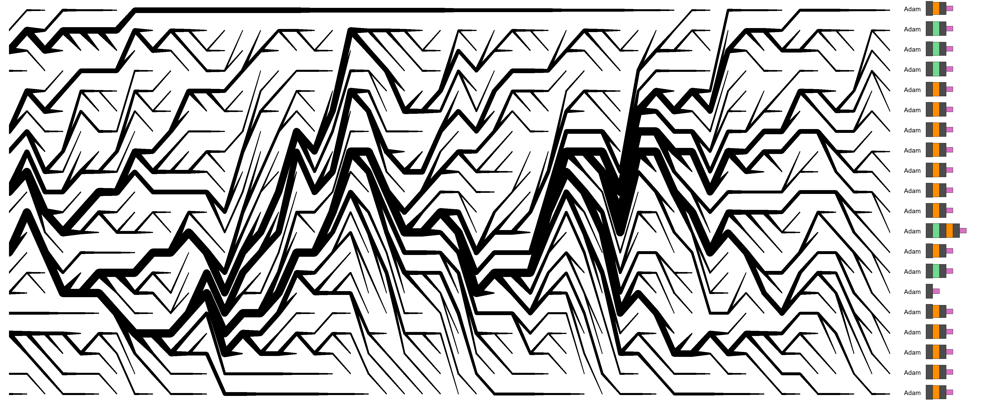

Точность по поколениям:


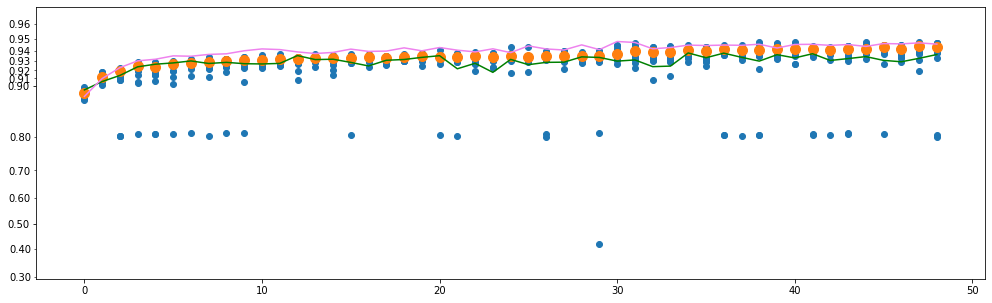

Использование памяти:


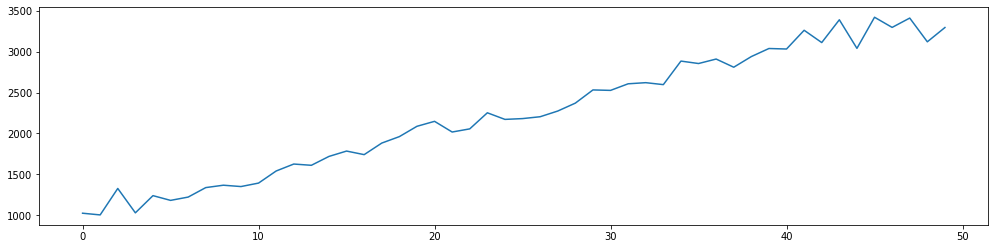

In [ ]:
for i in range(70):
    do_genetics_algorithm_loop()
    for j in range(3): gc.collect()

Во-первых обратим внимание, что нейросеть 300-200-100-50-relu-adam (зеленый график) показывает результаты хуже, чем нейросеть из одного слоя. При этом в предыдущих тестах при тестировании на тестовом наборе MNIST наоборот нейросеть из одного слоя показывала результаты хуже. Здесь же тестирование осуществляется на расширенном тестовом наборе EMNIST, а обучение на наборе MNIST. Возможно это и приводит к таким результатам.

Нейросети с количеством слоев, отличным от 1, отсеиваются естественным отбором за 1-2 поколения. Могут быть как минимум три причины этого явления (детально разбираться в этом сейчас не будем):
1. Нейросети с одним скрытым слоем могут быть действительно наилучшими в данном случае (обучение на MNIST, тестирование на EMNIST).
2. Нейросетям с 2+ скрытыми слоями требуется больше времени или больше обучающих примеров для того, чтобы они начали превосходить по точности нейросети с одним скрытым слоем. В случае, если требуется намного больше времени, то генетический алгоритм здесь вообще не работает в том виде, в каком мы его реализовали. Если же требуется больше примеров, то нужно это требование удовлетворить.
3. Алгоритм добавления слоя портит нейросеть. Следует начинать обучение с нуля после добавления слоя, то есть инициализировать веса заново случайным образом.

Можно вообще перестать использовать простые многослойные архитектуры в генетическом алгоритме. Вместо этого можно рассмотреть класс архитектур, в которых есть N последовательных слоев и некоторые пары слоев полносвязно соединены так, что информация идет от слоя с меньшим номером к слою с большим номером (без обратных связей). Можно даже и с обратными связями. Последний слой - выходной. В таком случае добавление слоя реализуется без повреждения нейросети: параллельно пути A->B появляется новый путь: A->C->B, где C - новые нейроны. Веса новых матриц переходов можно сделать небольшими, тогда нейросеть не будет "испорчена". Удаление слоя, впрочем, все равно будет портить нейросеть в любом случае, как и уменьшение размеров слоя.

Наконец, можно вернуться к изложенной ранее обобщенной модели генетического алгоритма, при котором эволюционируют не нейросети, а алгоритмы их обучения.